In [1]:
# from google.colab import drive
# drive.mount('/content/drive')
# %tensorflow_version 1.x

import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
print(tf.__version__)

1.13.1


In [2]:
import pandas as pd
import numpy as np
import datetime
import time
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
import math
import random

# read data from csv file and process X, y
def data_loader(data_path):
        # load raw data
        df = pd.read_csv(data_path)

        # clean data with missing values          
        '''drop the rows directly -> mess up the order
            first 24 rows have pm2.5 value that is NaN -> discard
            else: forward filling'''
        df = df[24:].fillna(method='ffill')

        # integrate 'year', 'month', 'day', 'hour', 'No' as one attribute
        df['time'] = df.apply(lambda x : datetime.datetime(year=x['year'], month=x['month'], day=x['day'], hour=x['hour']), axis=1)
        df.drop(columns=['year', 'month', 'day', 'hour', 'No'], inplace=True)
        df = df.set_index('time')

        # expand "cbwd" into 4 attributes 'SE', 'cv', 'NW', 'NE'
        df = df.join(pd.get_dummies(df['cbwd'])) # one-hot encoding
        del df['cbwd']

        # df = df.drop('cbwd', axis = 1) # remove the attribute temporarily

        X = df.iloc[:,1:].astype(np.float32)
        y = df['pm2.5'].astype(np.float32).to_frame()

        return X, y
  
# Z-score normalisation
def data_normalisation(train, test):
        X_train, y_train = train[0], train[1]
        X_test, y_test = test[0], test[1]

        mean_x, std_x = X_train.mean(axis=0), X_train.std(axis=0)
        mean_y, std_y = y_train.mean(axis=0), y_train.std(axis=0)

        (X_train, y_train) = ((X_train-mean_x)/std_x, np.log(np.asarray(y_train) + 1))
        (X_test, y_test) = ((X_test-mean_x)/std_x, np.log(np.asarray(y_test) + 1))

        return (X_train, y_train),(X_test, y_test)

data_path = "../dataset/PM2.5.csv"
X, y = data_loader(data_path)

#X_data = X.values
#y_data = y.values
X_train, X_test, y_train, y_test = train_test_split(X.values, y.values, test_size=0.1, shuffle=True)

(X_train, y_train),(X_test, y_test) = data_normalisation((X_train, y_train),(X_test, y_test))

X_train.shape, y_train.shape, X_test.shape, y_test.shape
#X_data.shape, y_data.shape

((39420, 10), (39420, 1), (4380, 10), (4380, 1))

In [3]:
#Network parameters
n_input = 10 
n_hidden1, n_hidden2,n_hidden3 = 20, 10, 5
n_output = 1


#Defining the input and the output
X_p = tf.placeholder("float", [None, n_input], name='X_p') 
Y_p = tf.placeholder("float", [None, n_output], name='Y_p')

# forward
def multilayer_perceptron1(input_d):
    #DEFINING WEIGHTS AND BIASES
    b1 = tf.Variable(tf.random_normal([n_hidden1])) #Biases first hidden layer
    b2 = tf.Variable(tf.random_normal([n_output]))  #Biases output layer
    
    w1 = tf.Variable(tf.random_normal([n_input, n_hidden1]))   #Weights connecting input layer with first hidden layer
    w2 = tf.Variable(tf.random_normal([n_hidden1, n_output])) #Weights connecting first hidden layer with second hidden layer 

    layer_1 = tf.nn.leaky_relu(tf.add(tf.matmul(input_d, w1), b1), alpha=0.01) #Task of neurons of first hidden layer
    out_layer = tf.add(tf.matmul(layer_1, w2),b2)            #Task of neurons of output layer
    
    return out_layer
def multilayer_perceptron2(input_d):
#DEFINING WEIGHTS AND BIASES
    b1 = tf.Variable(tf.random_normal([n_hidden1])) #Biases first hidden layer
    b2 = tf.Variable(tf.random_normal([n_hidden2])) #Biases second hidden layer
    b3 = tf.Variable(tf.random_normal([n_output]))  #Biases output layer
    
    w1 = tf.Variable(tf.random_normal([n_input, n_hidden1]))   #Weights connecting input layer with first hidden layer
    w2 = tf.Variable(tf.random_normal([n_hidden1, n_hidden2])) #Weights connecting first hidden layer with second hidden layer 
    w3 = tf.Variable(tf.random_normal([n_hidden2, n_output]))

    layer_1 = tf.nn.leaky_relu(tf.add(tf.matmul(input_d, w1), b1), alpha=0.01) #Task of neurons of first hidden layer
    layer_2 = tf.nn.leaky_relu(tf.add(tf.matmul(layer_1, w2), b2), alpha=0.01) #Task of neurons of second hidden layer
    out_layer = tf.add(tf.matmul(layer_2, w3),b3)            #Task of neurons of output layer
    return out_layer
def multilayer_perceptron3(input_d):
#DEFINING WEIGHTS AND BIASES
    b1 = tf.Variable(tf.random_normal([n_hidden1])) #Biases first hidden layer
    b2 = tf.Variable(tf.random_normal([n_hidden2])) #Biases second hidden layer
    b3 = tf.Variable(tf.random_normal([n_hidden3])) #Biases third hidden layer
    b4 = tf.Variable(tf.random_normal([n_output]))  #Biases output layer
    
    w1 = tf.Variable(tf.random_normal([n_input, n_hidden1]))   #Weights connecting input layer with first hidden layer
    w2 = tf.Variable(tf.random_normal([n_hidden1, n_hidden2])) #Weights connecting first hidden layer with second hidden layer 
    w3 = tf.Variable(tf.random_normal([n_hidden2, n_hidden3])) #Weights connecting second hidden layer with third layer
    w4 = tf.Variable(tf.random_normal([n_hidden3, n_output]))  #Weights connecting third hidden layer with output layer


    layer_1 = tf.nn.leaky_relu(tf.add(tf.matmul(input_d, w1), b1), alpha=0.01) #Task of neurons of first hidden layer
    layer_2 = tf.nn.leaky_relu(tf.add(tf.matmul(layer_1, w2), b2), alpha=0.01) #Task of neurons of second hidden layer
    layer_3 = tf.nn.leaky_relu(tf.add(tf.matmul(layer_2, w3), b3), alpha=0.01) #Task of neurons of thrid layer
    out_layer = tf.add(tf.matmul(layer_3, w4),b4)            #Task of neurons of output layer
    return out_layer


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7595807, Validation loss: 0.7320518, 
Epoch: 2000, Training loss: 0.55473727, Validation loss: 0.5845736, 
Epoch: 3000, Training loss: 0.59532416, Validation loss: 0.5669467, 
Epoch: 4000, Training loss: 0.53326887, Validation loss: 0.55608994, 
Epoch: 5000, Training loss: 0.6137612, Validation loss: 0.55321866, 
Epoch: 6000, Training loss: 0.5185325, Validation loss: 0.55157024, 
Epoch: 7000, Training loss: 0.5412126, Validation loss: 0.5497756, 
Epoch: 8000, Training loss: 0.5721892, Validation loss: 0.5462634, 
Epoch: 9000, Training loss: 0.5331459, Validation loss: 0.5454771, 
Epoch: 10000, Training loss: 0.58074677, Validation loss: 0.5

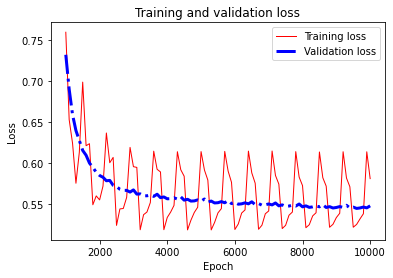

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58074677, Final Validation loss: 0.54747987, Training RMSE: 0.7320849, Validation RMSE: 0.7399188
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.85287505, Validation loss: 0.7329666, 
Epoch: 2000, Training loss: 0.57945716, Validation loss: 0.6026157, 
Epoch: 3000, Training loss: 0.63315314, Validation loss: 0.57355267, 
Epoch: 4000, Training loss: 0.5508548, Validation loss: 0.55864304, 
Epoch: 5000, Training loss: 0.62688166, Validation loss: 0.55354714, 
Epoch: 6000, Training loss: 0.5637568, Validation loss: 0.5514787, 
Epoch: 7000, Training loss: 0.5593047, Validation loss: 0.5507402, 
Epoch: 8000, Training loss: 0.6183678, Validation loss: 0.5470399, 
Epoch: 9000, Training loss: 0.53851116, Validation loss: 0.54592603, 
Epoch: 10000, Tra

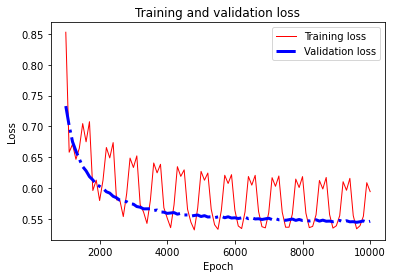

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59395474, Final Validation loss: 0.5458341, Training RMSE: 0.7428562, Validation RMSE: 0.7388059
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7960876, Validation loss: 0.6780743, 
Epoch: 2000, Training loss: 0.58118993, Validation loss: 0.5940336, 
Epoch: 3000, Training loss: 0.6194005, Validation loss: 0.5761126, 
Epoch: 4000, Training loss: 0.5360516, Validation loss: 0.5688017, 
Epoch: 5000, Training loss: 0.63750315, Validation loss: 0.5599305, 
Epoch: 6000, Training loss: 0.54106796, Validation loss: 0.5597312, 
Epoch: 7000, Training loss: 0.5521557, Validation loss: 0.553665, 
Epoch: 8000, Training loss: 0.61498785, Validation loss: 0.55002797, 
Epoch: 9000, Training loss: 0.53547716, Validation loss: 0.54847753, 
Epoch: 10000, Trainin

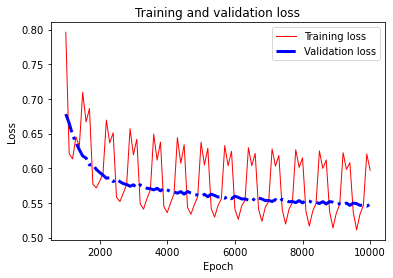

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59704006, Final Validation loss: 0.5481766, Training RMSE: 0.73881507, Validation RMSE: 0.74038947
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.0825591, Validation loss: 1.0089092, 
Epoch: 2000, Training loss: 0.7005041, Validation loss: 0.65965736, 
Epoch: 3000, Training loss: 0.68136454, Validation loss: 0.60934204, 
Epoch: 4000, Training loss: 0.5675187, Validation loss: 0.58449644, 
Epoch: 5000, Training loss: 0.6618689, Validation loss: 0.5727776, 
Epoch: 6000, Training loss: 0.5349247, Validation loss: 0.5692943, 
Epoch: 7000, Training loss: 0.5593534, Validation loss: 0.56902313, 
Epoch: 8000, Training loss: 0.59743327, Validation loss: 0.5646995, 
Epoch: 9000, Training loss: 0.5375425, Validation loss: 0.5604289, 
Epoch: 10000, Train

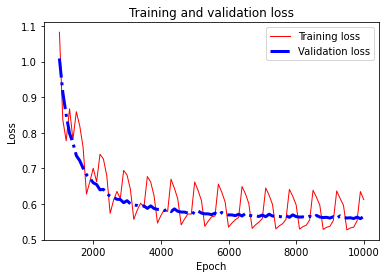

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6123312, Final Validation loss: 0.56524324, Training RMSE: 0.7414254, Validation RMSE: 0.7518266
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7391385, Validation loss: 0.64619297, 
Epoch: 2000, Training loss: 0.5648347, Validation loss: 0.5808991, 
Epoch: 3000, Training loss: 0.6354579, Validation loss: 0.57032186, 
Epoch: 4000, Training loss: 0.53188986, Validation loss: 0.5648958, 
Epoch: 5000, Training loss: 0.62681174, Validation loss: 0.56111485, 
Epoch: 6000, Training loss: 0.5086215, Validation loss: 0.5574396, 
Epoch: 7000, Training loss: 0.5540875, Validation loss: 0.5556581, 
Epoch: 8000, Training loss: 0.6020545, Validation loss: 0.55408293, 
Epoch: 9000, Training loss: 0.5416411, Validation loss: 0.5521279, 
Epoch: 10000, Trainin

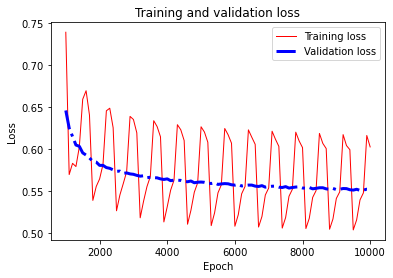

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6028666, Final Validation loss: 0.55237377, Training RMSE: 0.7381636, Validation RMSE: 0.74321854
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7478927, Validation loss: 0.6449534, 
Epoch: 2000, Training loss: 0.5728967, Validation loss: 0.57690775, 
Epoch: 3000, Training loss: 0.616501, Validation loss: 0.5663324, 
Epoch: 4000, Training loss: 0.54991305, Validation loss: 0.555657, 
Epoch: 5000, Training loss: 0.63000876, Validation loss: 0.5515363, 
Epoch: 6000, Training loss: 0.54454434, Validation loss: 0.5475287, 
Epoch: 7000, Training loss: 0.55395025, Validation loss: 0.54632926, 
Epoch: 8000, Training loss: 0.5966553, Validation loss: 0.54265225, 
Epoch: 9000, Training loss: 0.5298517, Validation loss: 0.53955185, 
Epoch: 10000, Traini

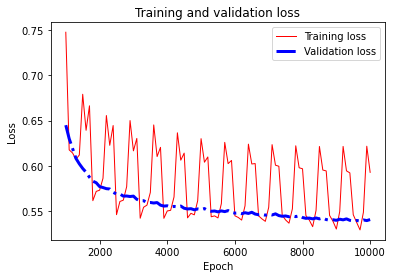

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5926852, Final Validation loss: 0.5403732, Training RMSE: 0.74043155, Validation RMSE: 0.7351008
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.9465565, Validation loss: 0.85139817, 
Epoch: 2000, Training loss: 0.6013359, Validation loss: 0.6135008, 
Epoch: 3000, Training loss: 0.6387835, Validation loss: 0.5767851, 
Epoch: 4000, Training loss: 0.5657757, Validation loss: 0.56547195, 
Epoch: 5000, Training loss: 0.6261149, Validation loss: 0.5599464, 
Epoch: 6000, Training loss: 0.5216217, Validation loss: 0.551684, 
Epoch: 7000, Training loss: 0.5522747, Validation loss: 0.54726183, 
Epoch: 8000, Training loss: 0.58578885, Validation loss: 0.5455262, 
Epoch: 9000, Training loss: 0.53952086, Validation loss: 0.54690456, 
Epoch: 10000, Training

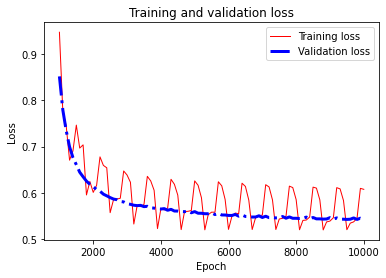

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6079301, Final Validation loss: 0.5429312, Training RMSE: 0.7378105, Validation RMSE: 0.73683864
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.71390194, Validation loss: 0.64044523, 
Epoch: 2000, Training loss: 0.5700803, Validation loss: 0.5757447, 
Epoch: 3000, Training loss: 0.59306836, Validation loss: 0.5522596, 
Epoch: 4000, Training loss: 0.5326702, Validation loss: 0.5462118, 
Epoch: 5000, Training loss: 0.62530106, Validation loss: 0.5423873, 
Epoch: 6000, Training loss: 0.53664446, Validation loss: 0.5384663, 
Epoch: 7000, Training loss: 0.5500255, Validation loss: 0.5354473, 
Epoch: 8000, Training loss: 0.5960759, Validation loss: 0.5343533, 
Epoch: 9000, Training loss: 0.5383713, Validation loss: 0.53584856, 
Epoch: 10000, Trainin

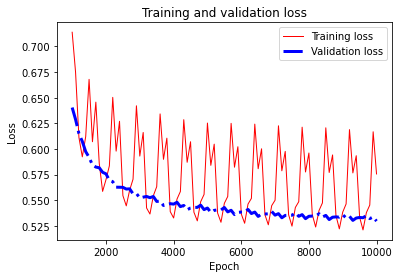

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5756412, Final Validation loss: 0.5296416, Training RMSE: 0.7386857, Validation RMSE: 0.72776484
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7096116, Validation loss: 0.67213655, 
Epoch: 2000, Training loss: 0.59566855, Validation loss: 0.6054736, 
Epoch: 3000, Training loss: 0.6515818, Validation loss: 0.57681626, 
Epoch: 4000, Training loss: 0.55247915, Validation loss: 0.56768686, 
Epoch: 5000, Training loss: 0.62160236, Validation loss: 0.563027, 
Epoch: 6000, Training loss: 0.52931184, Validation loss: 0.5593698, 
Epoch: 7000, Training loss: 0.5539666, Validation loss: 0.5514951, 
Epoch: 8000, Training loss: 0.6079917, Validation loss: 0.55056214, 
Epoch: 9000, Training loss: 0.54225194, Validation loss: 0.55217767, 
Epoch: 10000, Trai

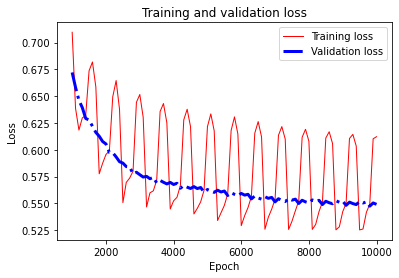

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6122486, Final Validation loss: 0.54917544, Training RMSE: 0.74067366, Validation RMSE: 0.7410637
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.79802835, Validation loss: 0.6954369, 
Epoch: 2000, Training loss: 0.5556852, Validation loss: 0.5865047, 
Epoch: 3000, Training loss: 0.6062613, Validation loss: 0.57391274, 
Epoch: 4000, Training loss: 0.5438391, Validation loss: 0.56496865, 
Epoch: 5000, Training loss: 0.6507664, Validation loss: 0.5561153, 
Epoch: 6000, Training loss: 0.539585, Validation loss: 0.5540643, 
Epoch: 7000, Training loss: 0.5562187, Validation loss: 0.5484463, 
Epoch: 8000, Training loss: 0.5972756, Validation loss: 0.54957974, 
Epoch: 9000, Training loss: 0.5325817, Validation loss: 0.54648435, 
Epoch: 10000, Trainin

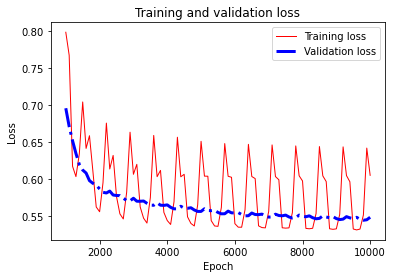

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6048418, Final Validation loss: 0.54825306, Training RMSE: 0.7413233, Validation RMSE: 0.74044114
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.739227 

Average Validation RMSE for the 10 folds: 0.7395369 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6781901, Validation loss: 0.64304245, 
Epoch: 2000, Training loss: 0.5805341, Validation loss: 0.58377004, 
Epoch: 3000, Training loss: 0.62417275, Validation loss: 0.57183164, 
Epoch: 4000, Training loss: 0.5474607, Validation loss: 0.56374264, 
Epoch: 5000

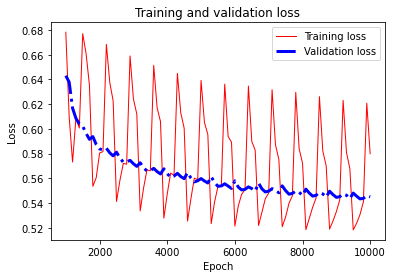

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.57990855, Final Validation loss: 0.54504055, Training RMSE: 0.7343492, Validation RMSE: 0.7382686
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8249123, Validation loss: 0.7395335, 
Epoch: 2000, Training loss: 0.5726112, Validation loss: 0.59135175, 
Epoch: 3000, Training loss: 0.608784, Validation loss: 0.5677889, 
Epoch: 4000, Training loss: 0.5481173, Validation loss: 0.55312365, 
Epoch: 5000, Training loss: 0.62742954, Validation loss: 0.55470866, 
Epoch: 6000, Training loss: 0.5287739, Validation loss: 0.54297024, 
Epoch: 7000, Training loss: 0.5441942, Validation loss: 0.5444505, 
Epoch: 8000, Training loss: 0.60060066, Validation loss: 0.54860663, 
Epoch: 9000, Training loss: 0.53232443, Validation loss: 0.5360329, 
Epoch: 10000, Train

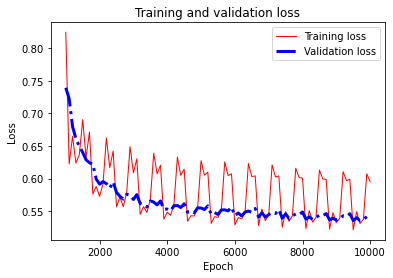

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59527487, Final Validation loss: 0.5407332, Training RMSE: 0.7345746, Validation RMSE: 0.73534566
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.70466757, Validation loss: 0.7001971, 
Epoch: 2000, Training loss: 0.5704233, Validation loss: 0.5758948, 
Epoch: 3000, Training loss: 0.5871503, Validation loss: 0.5622914, 
Epoch: 4000, Training loss: 0.54700685, Validation loss: 0.5496291, 
Epoch: 5000, Training loss: 0.6316101, Validation loss: 0.542548, 
Epoch: 6000, Training loss: 0.5437146, Validation loss: 0.53711593, 
Epoch: 7000, Training loss: 0.5408858, Validation loss: 0.5334258, 
Epoch: 8000, Training loss: 0.5826745, Validation loss: 0.5339285, 
Epoch: 9000, Training loss: 0.5328397, Validation loss: 0.5355425, 
Epoch: 10000, Training l

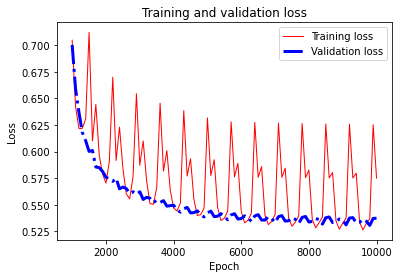

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.57513124, Final Validation loss: 0.53750277, Training RMSE: 0.73734164, Validation RMSE: 0.7331458
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.2444177, Validation loss: 1.2067785, 
Epoch: 2000, Training loss: 0.7115612, Validation loss: 0.7044925, 
Epoch: 3000, Training loss: 0.68419766, Validation loss: 0.6387249, 
Epoch: 4000, Training loss: 0.5617832, Validation loss: 0.6038277, 
Epoch: 5000, Training loss: 0.6949142, Validation loss: 0.6038904, 
Epoch: 6000, Training loss: 0.55258334, Validation loss: 0.5812739, 
Epoch: 7000, Training loss: 0.58451796, Validation loss: 0.5975552, 
Epoch: 8000, Training loss: 0.6245148, Validation loss: 0.5894367, 
Epoch: 9000, Training loss: 0.5522288, Validation loss: 0.5653349, 
Epoch: 10000, Training

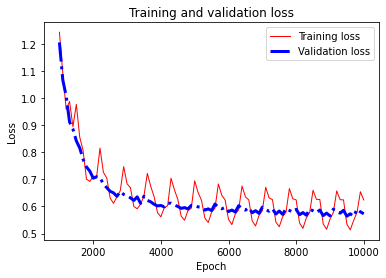

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6239824, Final Validation loss: 0.5730539, Training RMSE: 0.7440549, Validation RMSE: 0.75700325
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.80736023, Validation loss: 0.7307429, 
Epoch: 2000, Training loss: 0.61119694, Validation loss: 0.6104714, 
Epoch: 3000, Training loss: 0.63081086, Validation loss: 0.5822264, 
Epoch: 4000, Training loss: 0.52635545, Validation loss: 0.56360286, 
Epoch: 5000, Training loss: 0.649803, Validation loss: 0.56070113, 
Epoch: 6000, Training loss: 0.5337613, Validation loss: 0.5490432, 
Epoch: 7000, Training loss: 0.5449215, Validation loss: 0.5446703, 
Epoch: 8000, Training loss: 0.57082635, Validation loss: 0.5451263, 
Epoch: 9000, Training loss: 0.542628, Validation loss: 0.54143876, 
Epoch: 10000, Trainin

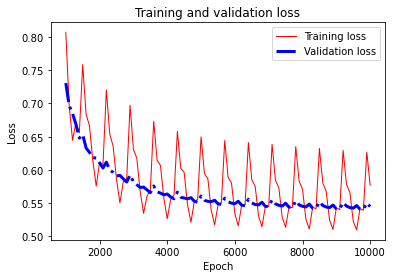

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5770921, Final Validation loss: 0.54475284, Training RMSE: 0.73505664, Validation RMSE: 0.7380737
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.9887168, Validation loss: 0.91579336, 
Epoch: 2000, Training loss: 0.63041496, Validation loss: 0.63777995, 
Epoch: 3000, Training loss: 0.64594644, Validation loss: 0.5961298, 
Epoch: 4000, Training loss: 0.59066147, Validation loss: 0.5774173, 
Epoch: 5000, Training loss: 0.6642831, Validation loss: 0.5681198, 
Epoch: 6000, Training loss: 0.58647156, Validation loss: 0.5538587, 
Epoch: 7000, Training loss: 0.55977786, Validation loss: 0.5482238, 
Epoch: 8000, Training loss: 0.59625584, Validation loss: 0.56421494, 
Epoch: 9000, Training loss: 0.54556096, Validation loss: 0.544485, 
Epoch: 10000, Tra

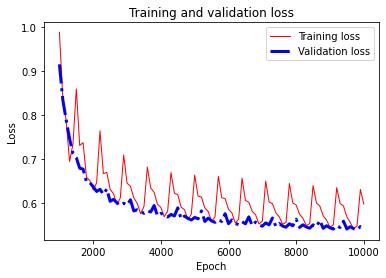

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5985945, Final Validation loss: 0.54368955, Training RMSE: 0.7405528, Validation RMSE: 0.7373531
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.71746314, Validation loss: 0.6353327, 
Epoch: 2000, Training loss: 0.55079025, Validation loss: 0.5708995, 
Epoch: 3000, Training loss: 0.6036655, Validation loss: 0.5601904, 
Epoch: 4000, Training loss: 0.52354807, Validation loss: 0.55326927, 
Epoch: 5000, Training loss: 0.6210247, Validation loss: 0.55181926, 
Epoch: 6000, Training loss: 0.5425867, Validation loss: 0.54504037, 
Epoch: 7000, Training loss: 0.5387733, Validation loss: 0.54221636, 
Epoch: 8000, Training loss: 0.59446275, Validation loss: 0.54081005, 
Epoch: 9000, Training loss: 0.53568083, Validation loss: 0.5399453, 
Epoch: 10000, Tra

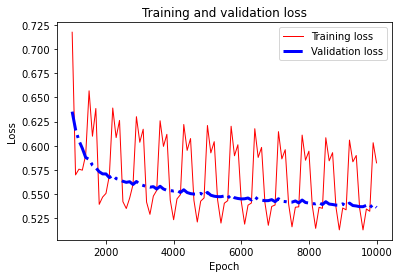

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58235955, Final Validation loss: 0.53624576, Training RMSE: 0.7286552, Validation RMSE: 0.73228806
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6350264, Validation loss: 0.59628296, 
Epoch: 2000, Training loss: 0.56864697, Validation loss: 0.55889493, 
Epoch: 3000, Training loss: 0.6116487, Validation loss: 0.5393055, 
Epoch: 4000, Training loss: 0.5390281, Validation loss: 0.5378571, 
Epoch: 5000, Training loss: 0.6279829, Validation loss: 0.5382688, 
Epoch: 6000, Training loss: 0.5389787, Validation loss: 0.5277949, 
Epoch: 7000, Training loss: 0.5441164, Validation loss: 0.5269564, 
Epoch: 8000, Training loss: 0.5705927, Validation loss: 0.52610445, 
Epoch: 9000, Training loss: 0.53040683, Validation loss: 0.5273304, 
Epoch: 10000, Traini

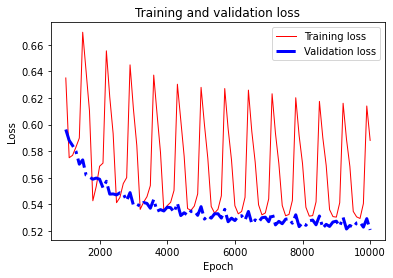

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5880851, Final Validation loss: 0.5207728, Training RMSE: 0.7351904, Validation RMSE: 0.7216459
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8098861, Validation loss: 0.6916252, 
Epoch: 2000, Training loss: 0.59432656, Validation loss: 0.59926736, 
Epoch: 3000, Training loss: 0.6172239, Validation loss: 0.5733108, 
Epoch: 4000, Training loss: 0.534973, Validation loss: 0.5576417, 
Epoch: 5000, Training loss: 0.6368849, Validation loss: 0.55592495, 
Epoch: 6000, Training loss: 0.5413705, Validation loss: 0.5487147, 
Epoch: 7000, Training loss: 0.54743034, Validation loss: 0.53943926, 
Epoch: 8000, Training loss: 0.5922724, Validation loss: 0.5394756, 
Epoch: 9000, Training loss: 0.53543985, Validation loss: 0.54175365, 
Epoch: 10000, Training

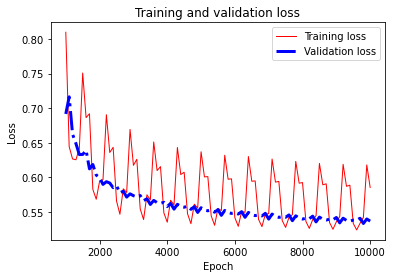

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58526176, Final Validation loss: 0.5364825, Training RMSE: 0.7350446, Validation RMSE: 0.73244965
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.73813826, Validation loss: 0.6812073, 
Epoch: 2000, Training loss: 0.5815702, Validation loss: 0.59239805, 
Epoch: 3000, Training loss: 0.6071929, Validation loss: 0.57689214, 
Epoch: 4000, Training loss: 0.51942706, Validation loss: 0.5588062, 
Epoch: 5000, Training loss: 0.61098176, Validation loss: 0.5480604, 
Epoch: 6000, Training loss: 0.52693534, Validation loss: 0.544484, 
Epoch: 7000, Training loss: 0.541655, Validation loss: 0.53802603, 
Epoch: 8000, Training loss: 0.59156936, Validation loss: 0.53848046, 
Epoch: 9000, Training loss: 0.53663117, Validation loss: 0.53654647, 
Epoch: 10000, Tr

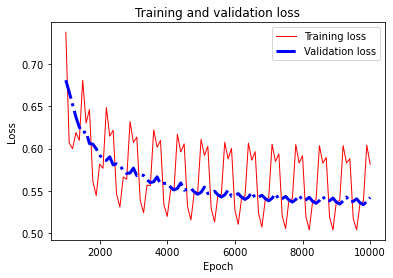

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.581388, Final Validation loss: 0.541913, Training RMSE: 0.7331174, Validation RMSE: 0.7361474
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7375103 

Average Validation RMSE for the 10 folds: 0.7378545 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.86771894, Validation loss: 0.87531817, 
Epoch: 2000, Training loss: 0.6699155, Validation loss: 0.6398978, 
Epoch: 3000, Training loss: 0.7170641, Validation loss: 0.6066, 
Epoch: 4000, Training loss: 0.5687407, Validation loss: 0.58936936, 
Epoch: 5000, Traini

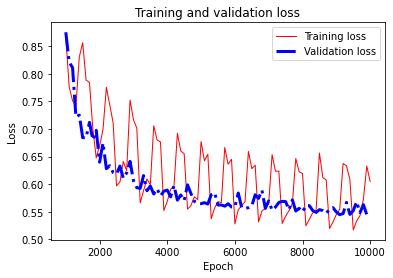

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6047479, Final Validation loss: 0.545996, Training RMSE: 0.7381824, Validation RMSE: 0.73891544
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.72202367, Validation loss: 0.71839434, 
Epoch: 2000, Training loss: 0.5608242, Validation loss: 0.5965, 
Epoch: 3000, Training loss: 0.65602124, Validation loss: 0.5682768, 
Epoch: 4000, Training loss: 0.5348506, Validation loss: 0.5565232, 
Epoch: 5000, Training loss: 0.6221182, Validation loss: 0.55296004, 
Epoch: 6000, Training loss: 0.549386, Validation loss: 0.54004073, 
Epoch: 7000, Training loss: 0.5400218, Validation loss: 0.5361081, 
Epoch: 8000, Training loss: 0.56719893, Validation loss: 0.53133994, 
Epoch: 9000, Training loss: 0.52018464, Validation loss: 0.53084034, 
Epoch: 10000, Training 

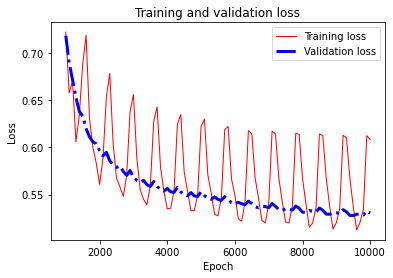

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60827297, Final Validation loss: 0.5302939, Training RMSE: 0.731705, Validation RMSE: 0.7282128
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.8256554, Validation loss: 0.80541646, 
Epoch: 2000, Training loss: 0.6159987, Validation loss: 0.61681086, 
Epoch: 3000, Training loss: 0.624083, Validation loss: 0.58438367, 
Epoch: 4000, Training loss: 0.59106165, Validation loss: 0.57937586, 
Epoch: 5000, Training loss: 0.62275016, Validation loss: 0.5798684, 
Epoch: 6000, Training loss: 0.52480835, Validation loss: 0.5611439, 
Epoch: 7000, Training loss: 0.57493305, Validation loss: 0.56659335, 
Epoch: 8000, Training loss: 0.6059006, Validation loss: 0.5478122, 
Epoch: 9000, Training loss: 0.5389025, Validation loss: 0.548836, 
Epoch: 10000, Trainin

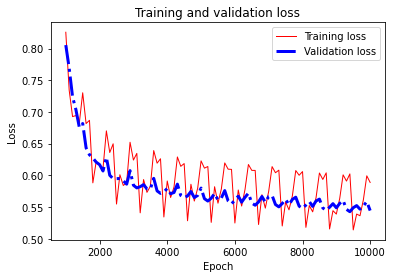

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58880097, Final Validation loss: 0.5444225, Training RMSE: 0.73864084, Validation RMSE: 0.73784995
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6352536, Validation loss: 0.6238917, 
Epoch: 2000, Training loss: 0.5422133, Validation loss: 0.5811288, 
Epoch: 3000, Training loss: 0.62147063, Validation loss: 0.5770974, 
Epoch: 4000, Training loss: 0.5312484, Validation loss: 0.5644335, 
Epoch: 5000, Training loss: 0.62371504, Validation loss: 0.55411464, 
Epoch: 6000, Training loss: 0.5364135, Validation loss: 0.548272, 
Epoch: 7000, Training loss: 0.5312478, Validation loss: 0.547953, 
Epoch: 8000, Training loss: 0.55997676, Validation loss: 0.54396725, 
Epoch: 9000, Training loss: 0.5183842, Validation loss: 0.54244465, 
Epoch: 10000, Trainin

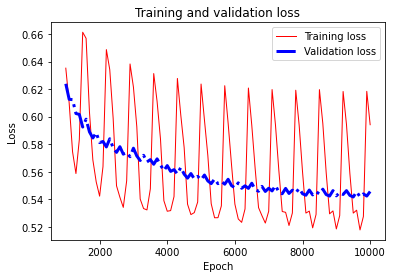

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59413934, Final Validation loss: 0.54558283, Training RMSE: 0.726017, Validation RMSE: 0.7386358
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.1039355, Validation loss: 1.6059189, 
Epoch: 2000, Training loss: 0.859251, Validation loss: 0.96068865, 
Epoch: 3000, Training loss: 1.0820416, Validation loss: 0.9308835, 
Epoch: 4000, Training loss: 1.1253173, Validation loss: 0.83735394, 
Epoch: 5000, Training loss: 0.76857376, Validation loss: 0.6699834, 
Epoch: 6000, Training loss: 0.72226816, Validation loss: 0.69521666, 
Epoch: 7000, Training loss: 0.6331388, Validation loss: 0.63326794, 
Epoch: 8000, Training loss: 0.8161945, Validation loss: 0.6989435, 
Epoch: 9000, Training loss: 0.62828994, Validation loss: 0.6451069, 
Epoch: 10000, Trainin

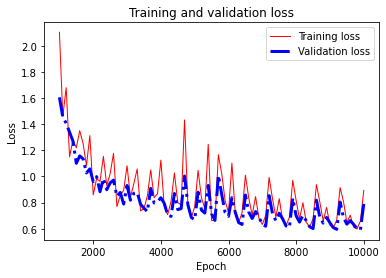

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.89387554, Final Validation loss: 0.79071575, Training RMSE: 0.8851654, Validation RMSE: 0.88922197
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.69069207, Validation loss: 0.6216766, 
Epoch: 2000, Training loss: 0.5429998, Validation loss: 0.5562268, 
Epoch: 3000, Training loss: 0.60677415, Validation loss: 0.5404519, 
Epoch: 4000, Training loss: 0.51052, Validation loss: 0.53481424, 
Epoch: 5000, Training loss: 0.6096915, Validation loss: 0.53072554, 
Epoch: 6000, Training loss: 0.5246445, Validation loss: 0.52369523, 
Epoch: 7000, Training loss: 0.53404814, Validation loss: 0.5253709, 
Epoch: 8000, Training loss: 0.5770922, Validation loss: 0.5212317, 
Epoch: 9000, Training loss: 0.52005064, Validation loss: 0.51844263, 
Epoch: 10000, Train

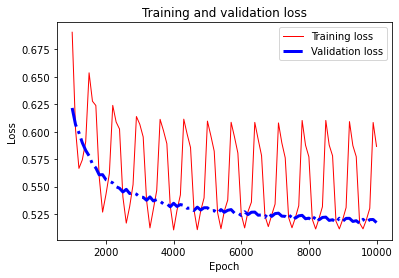

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58660436, Final Validation loss: 0.51720625, Training RMSE: 0.7268278, Validation RMSE: 0.7191705
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7084448, Validation loss: 0.66681844, 
Epoch: 2000, Training loss: 0.54714316, Validation loss: 0.5817367, 
Epoch: 3000, Training loss: 0.6133164, Validation loss: 0.5618855, 
Epoch: 4000, Training loss: 0.52386445, Validation loss: 0.5487177, 
Epoch: 5000, Training loss: 0.61229926, Validation loss: 0.54660505, 
Epoch: 6000, Training loss: 0.53628445, Validation loss: 0.539743, 
Epoch: 7000, Training loss: 0.53967524, Validation loss: 0.53738475, 
Epoch: 8000, Training loss: 0.57616836, Validation loss: 0.53703934, 
Epoch: 9000, Training loss: 0.51907575, Validation loss: 0.53675705, 
Epoch: 10000, T

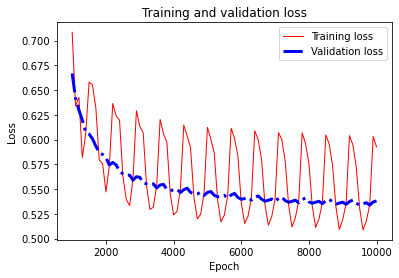

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59258306, Final Validation loss: 0.5380644, Training RMSE: 0.7324512, Validation RMSE: 0.73352873
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6855369, Validation loss: 0.6310839, 
Epoch: 2000, Training loss: 0.56333065, Validation loss: 0.57400763, 
Epoch: 3000, Training loss: 0.62083787, Validation loss: 0.5549482, 
Epoch: 4000, Training loss: 0.529222, Validation loss: 0.54716873, 
Epoch: 5000, Training loss: 0.6454453, Validation loss: 0.54565924, 
Epoch: 6000, Training loss: 0.53193235, Validation loss: 0.5365095, 
Epoch: 7000, Training loss: 0.53975296, Validation loss: 0.5328943, 
Epoch: 8000, Training loss: 0.59870446, Validation loss: 0.53018075, 
Epoch: 9000, Training loss: 0.5281442, Validation loss: 0.5301706, 
Epoch: 10000, Trai

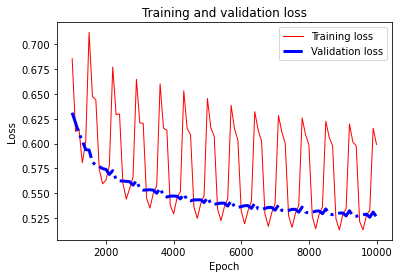

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5991789, Final Validation loss: 0.5259665, Training RMSE: 0.7326528, Validation RMSE: 0.7252355
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7800966, Validation loss: 0.7606009, 
Epoch: 2000, Training loss: 0.5610207, Validation loss: 0.6074615, 
Epoch: 3000, Training loss: 0.6058408, Validation loss: 0.57887536, 
Epoch: 4000, Training loss: 0.552716, Validation loss: 0.56768626, 
Epoch: 5000, Training loss: 0.64784193, Validation loss: 0.5636347, 
Epoch: 6000, Training loss: 0.53363305, Validation loss: 0.5562188, 
Epoch: 7000, Training loss: 0.56074965, Validation loss: 0.55016243, 
Epoch: 8000, Training loss: 0.62398344, Validation loss: 0.54770833, 
Epoch: 9000, Training loss: 0.52840483, Validation loss: 0.5467312, 
Epoch: 10000, Traini

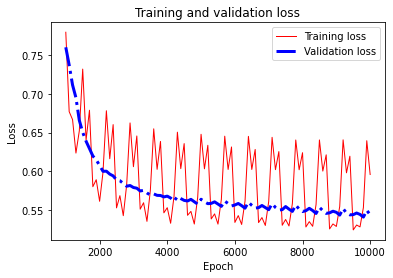

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5957345, Final Validation loss: 0.5435122, Training RMSE: 0.7415651, Validation RMSE: 0.7372328
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6789555, Validation loss: 0.67897755, 
Epoch: 2000, Training loss: 0.5839225, Validation loss: 0.5887307, 
Epoch: 3000, Training loss: 0.61948293, Validation loss: 0.57200205, 
Epoch: 4000, Training loss: 0.52802235, Validation loss: 0.56132525, 
Epoch: 5000, Training loss: 0.64817685, Validation loss: 0.55773914, 
Epoch: 6000, Training loss: 0.5455792, Validation loss: 0.5525055, 
Epoch: 7000, Training loss: 0.5468547, Validation loss: 0.54523844, 
Epoch: 8000, Training loss: 0.5975212, Validation loss: 0.54401934, 
Epoch: 9000, Training loss: 0.5420087, Validation loss: 0.5435208, 
Epoch: 10000, Trai

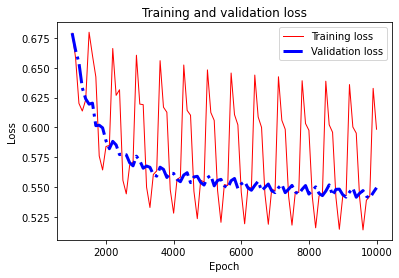

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59841037, Final Validation loss: 0.54933715, Training RMSE: 0.7401429, Validation RMSE: 0.7411728
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.741452 

Average Validation RMSE for the 10 folds: 0.74154204 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.6483082, Validation loss: 1.8699735, 
Epoch: 2000, Training loss: 0.9410931, Validation loss: 0.9623321, 
Epoch: 3000, Training loss: 0.84340096, Validation loss: 0.804676, 
Epoch: 4000, Training loss: 0.6537604, Validation loss: 0.703631, 
Epoch: 5000, Traini

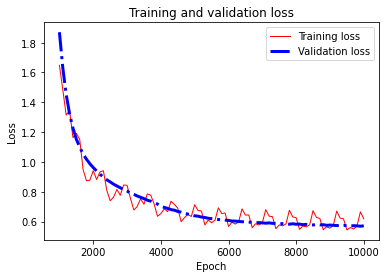

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.61868227, Final Validation loss: 0.5712952, Training RMSE: 0.7549216, Validation RMSE: 0.7558407
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 2.3299382, Validation loss: 2.3698854, 
Epoch: 2000, Training loss: 1.3660507, Validation loss: 1.331298, 
Epoch: 3000, Training loss: 0.94047797, Validation loss: 0.9221116, 
Epoch: 4000, Training loss: 0.69840956, Validation loss: 0.7328802, 
Epoch: 5000, Training loss: 0.73268425, Validation loss: 0.64050597, 
Epoch: 6000, Training loss: 0.57697964, Validation loss: 0.59690756, 
Epoch: 7000, Training loss: 0.5860746, Validation loss: 0.57865983, 
Epoch: 8000, Training loss: 0.6272687, Validation loss: 0.5621569, 
Epoch: 9000, Training loss: 0.5469109, Validation loss: 0.5511355, 
Epoch: 10000, Training l

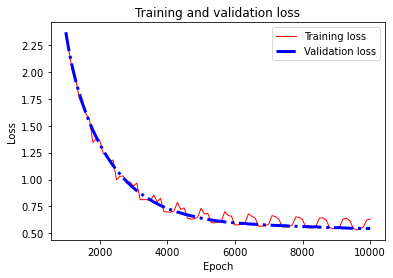

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6333943, Final Validation loss: 0.5443174, Training RMSE: 0.74834895, Validation RMSE: 0.7377787
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 2.3345008, Validation loss: 2.677551, 
Epoch: 2000, Training loss: 1.1193194, Validation loss: 1.148358, 
Epoch: 3000, Training loss: 0.9751755, Validation loss: 0.87126017, 
Epoch: 4000, Training loss: 0.75631154, Validation loss: 0.73845935, 
Epoch: 5000, Training loss: 0.7473043, Validation loss: 0.6564536, 
Epoch: 6000, Training loss: 0.60392755, Validation loss: 0.6094128, 
Epoch: 7000, Training loss: 0.5888649, Validation loss: 0.58359116, 
Epoch: 8000, Training loss: 0.6378964, Validation loss: 0.56778085, 
Epoch: 9000, Training loss: 0.54999936, Validation loss: 0.55907005, 
Epoch: 10000, Training l

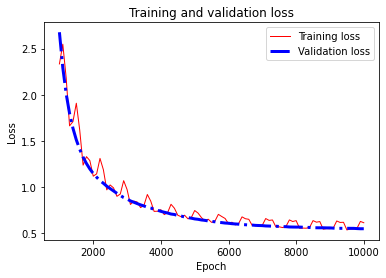

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6149205, Final Validation loss: 0.55015993, Training RMSE: 0.74491775, Validation RMSE: 0.74172765
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 2.4215279, Validation loss: 2.6025708, 
Epoch: 2000, Training loss: 1.0528446, Validation loss: 1.172408, 
Epoch: 3000, Training loss: 0.95622, Validation loss: 0.9098959, 
Epoch: 4000, Training loss: 0.75135875, Validation loss: 0.79497147, 
Epoch: 5000, Training loss: 0.7806622, Validation loss: 0.7142083, 
Epoch: 6000, Training loss: 0.64498484, Validation loss: 0.66493475, 
Epoch: 7000, Training loss: 0.6182759, Validation loss: 0.6393772, 
Epoch: 8000, Training loss: 0.6589813, Validation loss: 0.6172899, 
Epoch: 9000, Training loss: 0.577576, Validation loss: 0.60668844, 
Epoch: 10000, Training loss

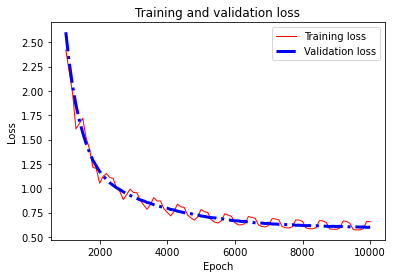

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6554132, Final Validation loss: 0.59915566, Training RMSE: 0.76281923, Validation RMSE: 0.7740515
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.1872302, Validation loss: 1.2307234, 
Epoch: 2000, Training loss: 0.75585836, Validation loss: 0.8239224, 
Epoch: 3000, Training loss: 0.7558851, Validation loss: 0.71064407, 
Epoch: 4000, Training loss: 0.61328626, Validation loss: 0.6491096, 
Epoch: 5000, Training loss: 0.6775572, Validation loss: 0.6158099, 
Epoch: 6000, Training loss: 0.5451348, Validation loss: 0.59395903, 
Epoch: 7000, Training loss: 0.56909555, Validation loss: 0.5816157, 
Epoch: 8000, Training loss: 0.6116247, Validation loss: 0.57080203, 
Epoch: 9000, Training loss: 0.55334437, Validation loss: 0.56151175, 
Epoch: 10000, Trainin

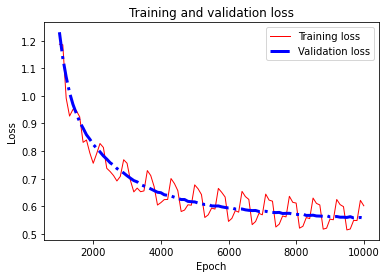

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60189325, Final Validation loss: 0.5570161, Training RMSE: 0.73922765, Validation RMSE: 0.7463351
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.5399013, Validation loss: 1.4624814, 
Epoch: 2000, Training loss: 0.86315525, Validation loss: 0.91547716, 
Epoch: 3000, Training loss: 0.7201869, Validation loss: 0.7324062, 
Epoch: 4000, Training loss: 0.62777746, Validation loss: 0.65630466, 
Epoch: 5000, Training loss: 0.7326876, Validation loss: 0.6149963, 
Epoch: 6000, Training loss: 0.5680926, Validation loss: 0.58758694, 
Epoch: 7000, Training loss: 0.58365834, Validation loss: 0.5732062, 
Epoch: 8000, Training loss: 0.631304, Validation loss: 0.5624594, 
Epoch: 9000, Training loss: 0.529695, Validation loss: 0.5554774, 
Epoch: 10000, Training lo

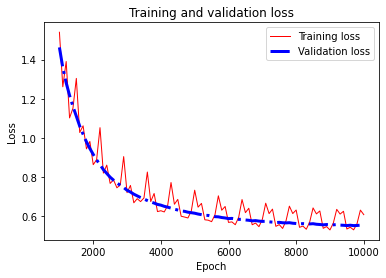

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60776, Final Validation loss: 0.5511109, Training RMSE: 0.74932015, Validation RMSE: 0.74236846
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.5028561, Validation loss: 1.4814419, 
Epoch: 2000, Training loss: 0.87021893, Validation loss: 0.91757816, 
Epoch: 3000, Training loss: 0.8305026, Validation loss: 0.7607432, 
Epoch: 4000, Training loss: 0.65489817, Validation loss: 0.68406296, 
Epoch: 5000, Training loss: 0.69285166, Validation loss: 0.6371964, 
Epoch: 6000, Training loss: 0.5871972, Validation loss: 0.6101318, 
Epoch: 7000, Training loss: 0.5964703, Validation loss: 0.59433585, 
Epoch: 8000, Training loss: 0.60432506, Validation loss: 0.5810208, 
Epoch: 9000, Training loss: 0.5684696, Validation loss: 0.57323277, 
Epoch: 10000, Training 

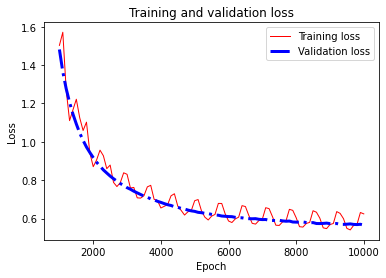

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.62407446, Final Validation loss: 0.5652969, Training RMSE: 0.753502, Validation RMSE: 0.7518623
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 2.9184742, Validation loss: 2.5270522, 
Epoch: 2000, Training loss: 0.9658252, Validation loss: 1.242796, 
Epoch: 3000, Training loss: 0.75900114, Validation loss: 0.85206556, 
Epoch: 4000, Training loss: 0.64288276, Validation loss: 0.7087645, 
Epoch: 5000, Training loss: 0.69371736, Validation loss: 0.63912016, 
Epoch: 6000, Training loss: 0.56742644, Validation loss: 0.60148656, 
Epoch: 7000, Training loss: 0.5949979, Validation loss: 0.5803689, 
Epoch: 8000, Training loss: 0.6484832, Validation loss: 0.56988674, 
Epoch: 9000, Training loss: 0.5418897, Validation loss: 0.5619796, 
Epoch: 10000, Training l

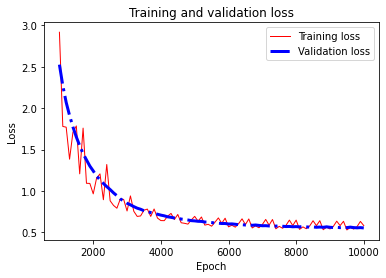

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58194137, Final Validation loss: 0.55388224, Training RMSE: 0.7545983, Validation RMSE: 0.74423265
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.5675446, Validation loss: 1.5212561, 
Epoch: 2000, Training loss: 0.8404288, Validation loss: 0.8682214, 
Epoch: 3000, Training loss: 0.8440901, Validation loss: 0.7405707, 
Epoch: 4000, Training loss: 0.6892843, Validation loss: 0.6820089, 
Epoch: 5000, Training loss: 0.67822814, Validation loss: 0.65140325, 
Epoch: 6000, Training loss: 0.58787346, Validation loss: 0.6302136, 
Epoch: 7000, Training loss: 0.5964566, Validation loss: 0.6038938, 
Epoch: 8000, Training loss: 0.62382454, Validation loss: 0.5937526, 
Epoch: 9000, Training loss: 0.56132066, Validation loss: 0.58304685, 
Epoch: 10000, Training

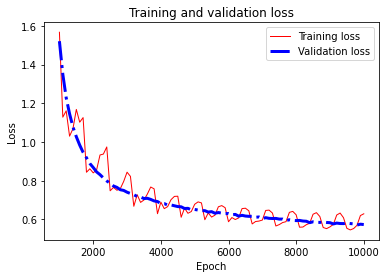

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.62891316, Final Validation loss: 0.57333356, Training RMSE: 0.75157404, Validation RMSE: 0.7571879
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.0303282, Validation loss: 0.81377864, 
Epoch: 2000, Training loss: 0.6468267, Validation loss: 0.66429275, 
Epoch: 3000, Training loss: 0.6398754, Validation loss: 0.61146384, 
Epoch: 4000, Training loss: 0.56295586, Validation loss: 0.585702, 
Epoch: 5000, Training loss: 0.64925003, Validation loss: 0.570298, 
Epoch: 6000, Training loss: 0.5441484, Validation loss: 0.56429535, 
Epoch: 7000, Training loss: 0.5611358, Validation loss: 0.5604544, 
Epoch: 8000, Training loss: 0.6035804, Validation loss: 0.5562429, 
Epoch: 9000, Training loss: 0.5380536, Validation loss: 0.55410665, 
Epoch: 10000, Training

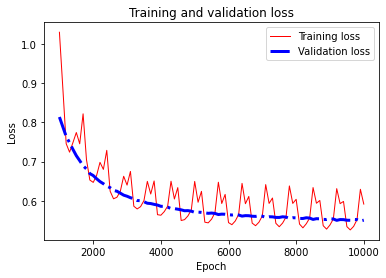

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5914165, Final Validation loss: 0.5503422, Training RMSE: 0.74171, Validation RMSE: 0.74185055
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.7436124 

Average Validation RMSE for the 10 folds: 0.74348754 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.101023, Validation loss: 1.3141265, 
Epoch: 2000, Training loss: 0.7721022, Validation loss: 0.8195422, 
Epoch: 3000, Training loss: 0.6881076, Validation loss: 0.6796992, 
Epoch: 4000, Training loss: 0.5961687, Validation loss: 0.6106656, 
Epoch: 5000, Training lo

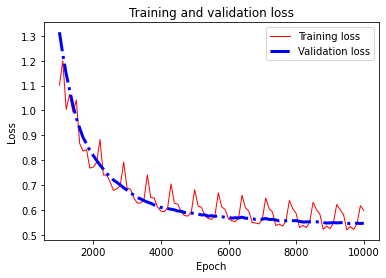

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5983592, Final Validation loss: 0.5473089, Training RMSE: 0.73703456, Validation RMSE: 0.7398033
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 7.22054, Validation loss: 7.9115863, 
Epoch: 2000, Training loss: 2.918416, Validation loss: 2.8726034, 
Epoch: 3000, Training loss: 1.6962361, Validation loss: 1.8195144, 
Epoch: 4000, Training loss: 1.2574922, Validation loss: 1.3643306, 
Epoch: 5000, Training loss: 1.2427163, Validation loss: 1.0776882, 
Epoch: 6000, Training loss: 0.758273, Validation loss: 0.8818146, 
Epoch: 7000, Training loss: 0.76497823, Validation loss: 0.77874, 
Epoch: 8000, Training loss: 0.7653259, Validation loss: 0.6998109, 
Epoch: 9000, Training loss: 0.67665195, Validation loss: 0.6529958, 
Epoch: 10000, Training loss: 0.662

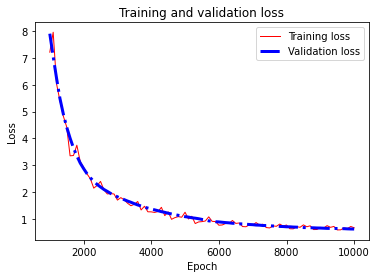

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.66285264, Final Validation loss: 0.615293, Training RMSE: 0.78976625, Validation RMSE: 0.7844062
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.540918, Validation loss: 2.8316436, 
Epoch: 2000, Training loss: 1.1697106, Validation loss: 1.2925307, 
Epoch: 3000, Training loss: 0.83828926, Validation loss: 0.8882789, 
Epoch: 4000, Training loss: 0.71910536, Validation loss: 0.7401699, 
Epoch: 5000, Training loss: 0.7094475, Validation loss: 0.6733703, 
Epoch: 6000, Training loss: 0.6212035, Validation loss: 0.6333921, 
Epoch: 7000, Training loss: 0.60013187, Validation loss: 0.6068347, 
Epoch: 8000, Training loss: 0.6395565, Validation loss: 0.5830232, 
Epoch: 9000, Training loss: 0.54172814, Validation loss: 0.5665106, 
Epoch: 10000, Training loss

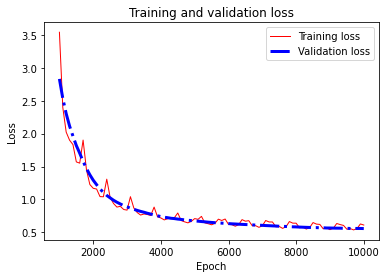

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6114431, Final Validation loss: 0.55786765, Training RMSE: 0.7459841, Validation RMSE: 0.7469054
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 2.9307787, Validation loss: 2.446384, 
Epoch: 2000, Training loss: 0.94080603, Validation loss: 1.0272167, 
Epoch: 3000, Training loss: 0.73744476, Validation loss: 0.7397273, 
Epoch: 4000, Training loss: 0.6554134, Validation loss: 0.66798306, 
Epoch: 5000, Training loss: 0.6948899, Validation loss: 0.6330543, 
Epoch: 6000, Training loss: 0.6045531, Validation loss: 0.61573255, 
Epoch: 7000, Training loss: 0.5891078, Validation loss: 0.6101096, 
Epoch: 8000, Training loss: 0.6585869, Validation loss: 0.5929383, 
Epoch: 9000, Training loss: 0.5554358, Validation loss: 0.5876845, 
Epoch: 10000, Training loss

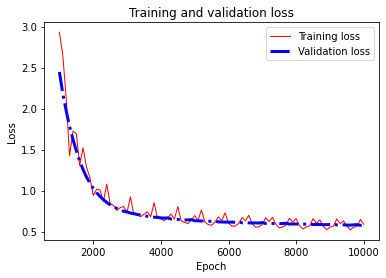

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58956766, Final Validation loss: 0.578419, Training RMSE: 0.74318963, Validation RMSE: 0.76053864
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.3814738, Validation loss: 3.436263, 
Epoch: 2000, Training loss: 2.005094, Validation loss: 1.787559, 
Epoch: 3000, Training loss: 1.3507147, Validation loss: 1.2473663, 
Epoch: 4000, Training loss: 0.91572255, Validation loss: 0.9672412, 
Epoch: 5000, Training loss: 0.81047714, Validation loss: 0.8024144, 
Epoch: 6000, Training loss: 0.6733388, Validation loss: 0.7021999, 
Epoch: 7000, Training loss: 0.65186, Validation loss: 0.6495969, 
Epoch: 8000, Training loss: 0.684605, Validation loss: 0.6127527, 
Epoch: 9000, Training loss: 0.60290015, Validation loss: 0.59343857, 
Epoch: 10000, Training loss: 0.

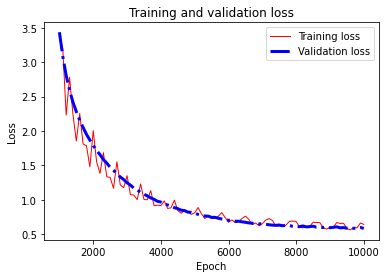

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.64242566, Final Validation loss: 0.58406454, Training RMSE: 0.76534617, Validation RMSE: 0.76424116
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 8.163862, Validation loss: 7.624445, 
Epoch: 2000, Training loss: 2.7913864, Validation loss: 2.930693, 
Epoch: 3000, Training loss: 1.7337654, Validation loss: 1.7167109, 
Epoch: 4000, Training loss: 1.2754292, Validation loss: 1.2881635, 
Epoch: 5000, Training loss: 1.2254617, Validation loss: 1.032294, 
Epoch: 6000, Training loss: 0.8043741, Validation loss: 0.859601, 
Epoch: 7000, Training loss: 0.75213724, Validation loss: 0.7433944, 
Epoch: 8000, Training loss: 0.7492534, Validation loss: 0.6693974, 
Epoch: 9000, Training loss: 0.591115, Validation loss: 0.6205294, 
Epoch: 10000, Training loss: 0.6

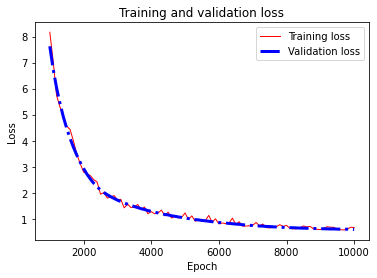

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6643454, Final Validation loss: 0.5923901, Training RMSE: 0.7792991, Validation RMSE: 0.7696688
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.2685302, Validation loss: 1.3495318, 
Epoch: 2000, Training loss: 0.8434056, Validation loss: 0.8649182, 
Epoch: 3000, Training loss: 0.8096372, Validation loss: 0.7218717, 
Epoch: 4000, Training loss: 0.61366665, Validation loss: 0.6528739, 
Epoch: 5000, Training loss: 0.6627228, Validation loss: 0.617335, 
Epoch: 6000, Training loss: 0.54878193, Validation loss: 0.59458864, 
Epoch: 7000, Training loss: 0.5720116, Validation loss: 0.5806564, 
Epoch: 8000, Training loss: 0.5972895, Validation loss: 0.5715492, 
Epoch: 9000, Training loss: 0.5575126, Validation loss: 0.56713724, 
Epoch: 10000, Training loss:

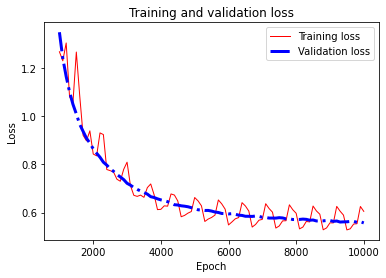

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6051858, Final Validation loss: 0.55726504, Training RMSE: 0.7427176, Validation RMSE: 0.74650186
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.2618604, Validation loss: 3.149641, 
Epoch: 2000, Training loss: 1.2762005, Validation loss: 1.4157711, 
Epoch: 3000, Training loss: 0.9532123, Validation loss: 0.94426215, 
Epoch: 4000, Training loss: 0.7817921, Validation loss: 0.7680262, 
Epoch: 5000, Training loss: 1.0306063, Validation loss: 0.6681272, 
Epoch: 6000, Training loss: 0.6297976, Validation loss: 0.6052194, 
Epoch: 7000, Training loss: 0.5928877, Validation loss: 0.58351463, 
Epoch: 8000, Training loss: 0.65424025, Validation loss: 0.57272834, 
Epoch: 9000, Training loss: 0.5807662, Validation loss: 0.5641689, 
Epoch: 10000, Training los

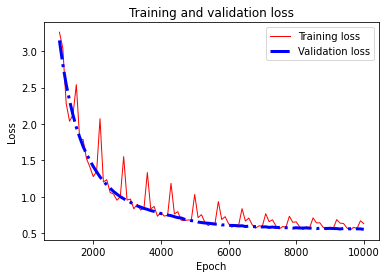

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.62981826, Final Validation loss: 0.5505293, Training RMSE: 0.7501753, Validation RMSE: 0.7419766
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.6592122, Validation loss: 1.6272252, 
Epoch: 2000, Training loss: 0.8968469, Validation loss: 0.9388703, 
Epoch: 3000, Training loss: 0.8102176, Validation loss: 0.764138, 
Epoch: 4000, Training loss: 0.6251691, Validation loss: 0.67312366, 
Epoch: 5000, Training loss: 0.71376646, Validation loss: 0.63371086, 
Epoch: 6000, Training loss: 0.5637613, Validation loss: 0.603955, 
Epoch: 7000, Training loss: 0.58081174, Validation loss: 0.5785163, 
Epoch: 8000, Training loss: 0.5961797, Validation loss: 0.56940323, 
Epoch: 9000, Training loss: 0.5446942, Validation loss: 0.56146383, 
Epoch: 10000, Training los

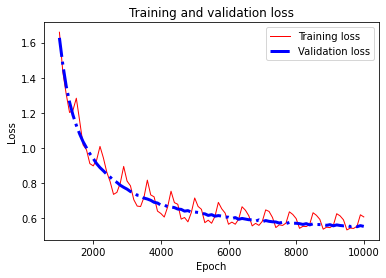

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6056351, Final Validation loss: 0.5516219, Training RMSE: 0.74346286, Validation RMSE: 0.74271256
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 2.6266875, Validation loss: 2.4318464, 
Epoch: 2000, Training loss: 1.2552061, Validation loss: 1.1474589, 
Epoch: 3000, Training loss: 0.89915913, Validation loss: 0.80376345, 
Epoch: 4000, Training loss: 0.6838431, Validation loss: 0.6777696, 
Epoch: 5000, Training loss: 0.7152986, Validation loss: 0.63150805, 
Epoch: 6000, Training loss: 0.602272, Validation loss: 0.59964705, 
Epoch: 7000, Training loss: 0.58315575, Validation loss: 0.58244854, 
Epoch: 8000, Training loss: 0.5978439, Validation loss: 0.5714391, 
Epoch: 9000, Training loss: 0.5397322, Validation loss: 0.5625817, 
Epoch: 10000, Training 

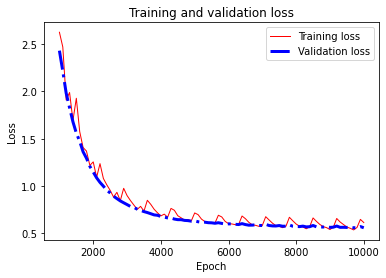

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6137486, Final Validation loss: 0.5583711, Training RMSE: 0.7459847, Validation RMSE: 0.74724233
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7457491 

Average Validation RMSE for the 10 folds: 0.74567 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 5.391117, Validation loss: 4.7984953, 
Epoch: 2000, Training loss: 1.667377, Validation loss: 1.7377137, 
Epoch: 3000, Training loss: 1.0899754, Validation loss: 1.1083152, 
Epoch: 4000, Training loss: 0.69711876, Validation loss: 0.85826963, 
Epoch: 5000, Training lo

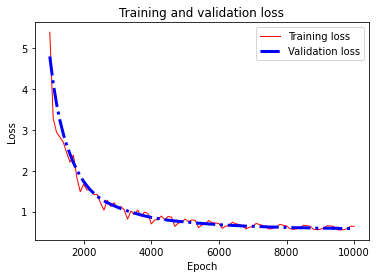

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.63681555, Final Validation loss: 0.58441913, Training RMSE: 0.7640169, Validation RMSE: 0.7644731
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.7911282, Validation loss: 1.641655, 
Epoch: 2000, Training loss: 0.74990654, Validation loss: 0.7286013, 
Epoch: 3000, Training loss: 0.7449336, Validation loss: 0.6436508, 
Epoch: 4000, Training loss: 0.6094043, Validation loss: 0.60679597, 
Epoch: 5000, Training loss: 0.62783813, Validation loss: 0.57762665, 
Epoch: 6000, Training loss: 0.5345075, Validation loss: 0.5690787, 
Epoch: 7000, Training loss: 0.5549718, Validation loss: 0.55479467, 
Epoch: 8000, Training loss: 0.5990749, Validation loss: 0.54270875, 
Epoch: 9000, Training loss: 0.5416988, Validation loss: 0.5429589, 
Epoch: 10000, Training l

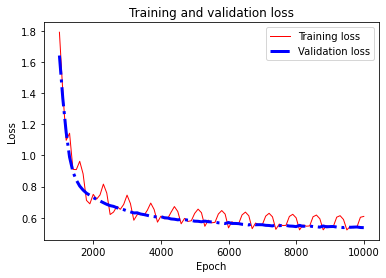

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6082731, Final Validation loss: 0.536089, Training RMSE: 0.7336375, Validation RMSE: 0.732181
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.80160034, Validation loss: 0.73857075, 
Epoch: 2000, Training loss: 0.57829, Validation loss: 0.6177837, 
Epoch: 3000, Training loss: 0.64542615, Validation loss: 0.5825565, 
Epoch: 4000, Training loss: 0.5296246, Validation loss: 0.5659799, 
Epoch: 5000, Training loss: 0.61495984, Validation loss: 0.55299217, 
Epoch: 6000, Training loss: 0.5145194, Validation loss: 0.54230404, 
Epoch: 7000, Training loss: 0.53470474, Validation loss: 0.5372834, 
Epoch: 8000, Training loss: 0.57866144, Validation loss: 0.53262615, 
Epoch: 9000, Training loss: 0.52277696, Validation loss: 0.529504, 
Epoch: 10000, Training los

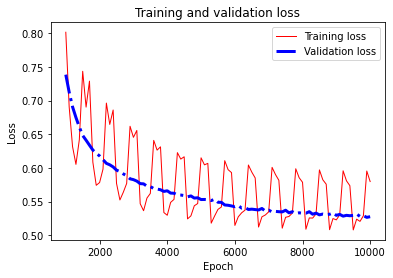

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.579709, Final Validation loss: 0.52749133, Training RMSE: 0.72753155, Validation RMSE: 0.726286
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 18.47246, Validation loss: 19.751925, 
Epoch: 2000, Training loss: 6.149682, Validation loss: 6.503486, 
Epoch: 3000, Training loss: 3.6009793, Validation loss: 3.7129896, 
Epoch: 4000, Training loss: 2.1540434, Validation loss: 2.3360884, 
Epoch: 5000, Training loss: 1.7792431, Validation loss: 1.628481, 
Epoch: 6000, Training loss: 1.3470201, Validation loss: 1.2921267, 
Epoch: 7000, Training loss: 1.0333662, Validation loss: 1.0475106, 
Epoch: 8000, Training loss: 0.934535, Validation loss: 0.87876946, 
Epoch: 9000, Training loss: 0.7386792, Validation loss: 0.7489287, 
Epoch: 10000, Training loss: 0.7229

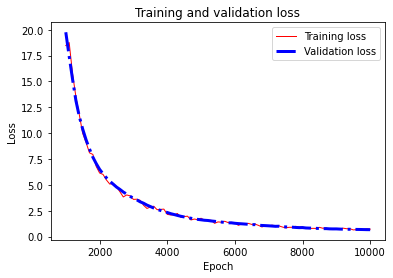

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.7229319, Final Validation loss: 0.6748333, Training RMSE: 0.81974626, Validation RMSE: 0.82148236
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.8092623, Validation loss: 2.7353337, 
Epoch: 2000, Training loss: 1.059479, Validation loss: 1.3524628, 
Epoch: 3000, Training loss: 0.9575489, Validation loss: 0.87703145, 
Epoch: 4000, Training loss: 0.64585227, Validation loss: 0.7302082, 
Epoch: 5000, Training loss: 0.7821072, Validation loss: 0.64739215, 
Epoch: 6000, Training loss: 0.5556317, Validation loss: 0.60298085, 
Epoch: 7000, Training loss: 0.5844842, Validation loss: 0.5809881, 
Epoch: 8000, Training loss: 0.6170276, Validation loss: 0.5662209, 
Epoch: 9000, Training loss: 0.5633707, Validation loss: 0.55843574, 
Epoch: 10000, Training lo

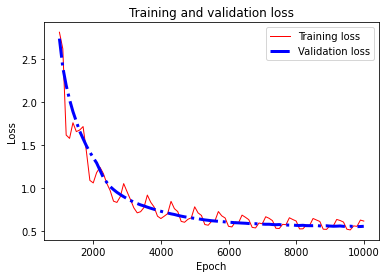

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6165184, Final Validation loss: 0.55569154, Training RMSE: 0.7469983, Validation RMSE: 0.7454472
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 7.9285927, Validation loss: 8.818645, 
Epoch: 2000, Training loss: 3.3327804, Validation loss: 3.3460197, 
Epoch: 3000, Training loss: 1.6262735, Validation loss: 1.7656189, 
Epoch: 4000, Training loss: 1.1852735, Validation loss: 1.2654805, 
Epoch: 5000, Training loss: 1.055106, Validation loss: 1.0504231, 
Epoch: 6000, Training loss: 0.94254184, Validation loss: 0.91706467, 
Epoch: 7000, Training loss: 0.8379161, Validation loss: 0.8161112, 
Epoch: 8000, Training loss: 0.8083904, Validation loss: 0.7457963, 
Epoch: 9000, Training loss: 0.67859876, Validation loss: 0.69485044, 
Epoch: 10000, Training loss:

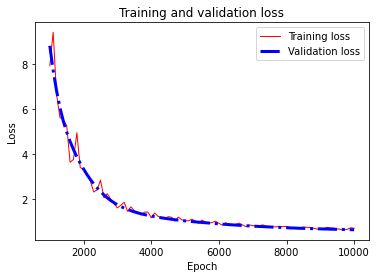

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.7235241, Final Validation loss: 0.6545231, Training RMSE: 0.8208704, Validation RMSE: 0.809026
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.071643, Validation loss: 1.7933344, 
Epoch: 2000, Training loss: 0.6614149, Validation loss: 0.6973344, 
Epoch: 3000, Training loss: 0.66295147, Validation loss: 0.6309462, 
Epoch: 4000, Training loss: 0.5898544, Validation loss: 0.60177654, 
Epoch: 5000, Training loss: 0.64268655, Validation loss: 0.5858101, 
Epoch: 6000, Training loss: 0.58037424, Validation loss: 0.57715964, 
Epoch: 7000, Training loss: 0.5631626, Validation loss: 0.5692029, 
Epoch: 8000, Training loss: 0.6010281, Validation loss: 0.56597865, 
Epoch: 9000, Training loss: 0.5389378, Validation loss: 0.56310254, 
Epoch: 10000, Training los

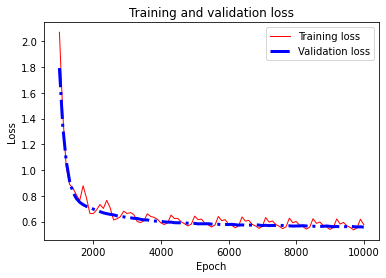

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5768516, Final Validation loss: 0.5571906, Training RMSE: 0.74212545, Validation RMSE: 0.74645203
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 14.706044, Validation loss: 13.653765, 
Epoch: 2000, Training loss: 4.665558, Validation loss: 5.0708256, 
Epoch: 3000, Training loss: 2.0839007, Validation loss: 2.1180649, 
Epoch: 4000, Training loss: 1.1835209, Validation loss: 1.2954224, 
Epoch: 5000, Training loss: 0.930012, Validation loss: 0.9562809, 
Epoch: 6000, Training loss: 0.7235543, Validation loss: 0.7748157, 
Epoch: 7000, Training loss: 0.6852654, Validation loss: 0.6768107, 
Epoch: 8000, Training loss: 0.7291846, Validation loss: 0.6350166, 
Epoch: 9000, Training loss: 0.6496445, Validation loss: 0.6157372, 
Epoch: 10000, Training loss: 0.

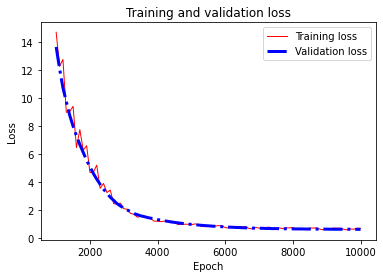

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.67491966, Final Validation loss: 0.5990365, Training RMSE: 0.7791847, Validation RMSE: 0.7739745
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 3.601077, Validation loss: 3.8174021, 
Epoch: 2000, Training loss: 1.8453372, Validation loss: 1.9620725, 
Epoch: 3000, Training loss: 1.3247261, Validation loss: 1.336014, 
Epoch: 4000, Training loss: 0.91353166, Validation loss: 0.99624854, 
Epoch: 5000, Training loss: 0.88084865, Validation loss: 0.79727185, 
Epoch: 6000, Training loss: 0.6326671, Validation loss: 0.6909784, 
Epoch: 7000, Training loss: 0.6328499, Validation loss: 0.62383795, 
Epoch: 8000, Training loss: 0.64611036, Validation loss: 0.60306567, 
Epoch: 9000, Training loss: 0.5528332, Validation loss: 0.5816453, 
Epoch: 10000, Training lo

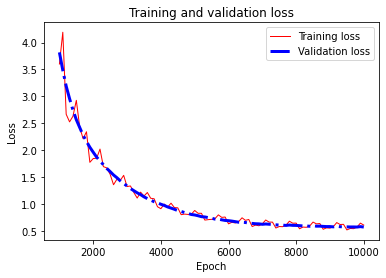

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60871625, Final Validation loss: 0.5725895, Training RMSE: 0.75510234, Validation RMSE: 0.75669646
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.1791553, Validation loss: 2.3210251, 
Epoch: 2000, Training loss: 0.99187803, Validation loss: 1.195434, 
Epoch: 3000, Training loss: 0.94454044, Validation loss: 0.8558271, 
Epoch: 4000, Training loss: 0.64397407, Validation loss: 0.7333251, 
Epoch: 5000, Training loss: 0.8272877, Validation loss: 0.67399955, 
Epoch: 6000, Training loss: 0.5984401, Validation loss: 0.6398486, 
Epoch: 7000, Training loss: 0.59750354, Validation loss: 0.60499674, 
Epoch: 8000, Training loss: 0.62497234, Validation loss: 0.5853511, 
Epoch: 9000, Training loss: 0.5424805, Validation loss: 0.5695584, 
Epoch: 10000, Trainin

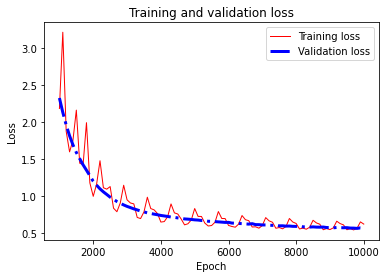

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6165068, Final Validation loss: 0.5622073, Training RMSE: 0.7478084, Validation RMSE: 0.74980485
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7487414 

Average Validation RMSE for the 10 folds: 0.74848866 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.3752388, Validation loss: 1.0635726, 
Epoch: 2000, Training loss: 0.6117804, Validation loss: 0.6667269, 
Epoch: 3000, Training loss: 0.6194566, Validation loss: 0.6103021, 
Epoch: 4000, Training loss: 0.55931765, Validation loss: 0.5867585, 
Epoch: 5000, Trai

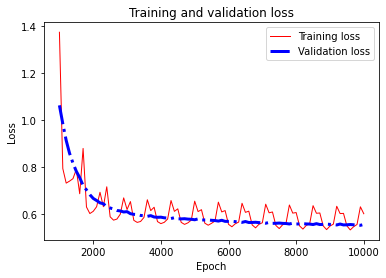

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6014775, Final Validation loss: 0.55576897, Training RMSE: 0.74520457, Validation RMSE: 0.74549913
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.1834893, Validation loss: 0.91178215, 
Epoch: 2000, Training loss: 0.66047704, Validation loss: 0.65011895, 
Epoch: 3000, Training loss: 0.6767421, Validation loss: 0.60777634, 
Epoch: 4000, Training loss: 0.55341643, Validation loss: 0.5846114, 
Epoch: 5000, Training loss: 0.64310175, Validation loss: 0.5752336, 
Epoch: 6000, Training loss: 0.55904293, Validation loss: 0.56473356, 
Epoch: 7000, Training loss: 0.5646831, Validation loss: 0.5602878, 
Epoch: 8000, Training loss: 0.6100624, Validation loss: 0.5563641, 
Epoch: 9000, Training loss: 0.5414009, Validation loss: 0.5533394, 
Epoch: 10000, Tra

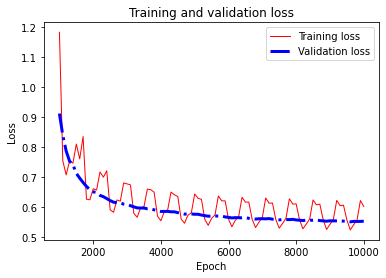

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60112524, Final Validation loss: 0.55200577, Training RMSE: 0.74520063, Validation RMSE: 0.7429709
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7687608, Validation loss: 0.6836645, 
Epoch: 2000, Training loss: 0.5876758, Validation loss: 0.6022068, 
Epoch: 3000, Training loss: 0.60510564, Validation loss: 0.57763314, 
Epoch: 4000, Training loss: 0.55319923, Validation loss: 0.5681897, 
Epoch: 5000, Training loss: 0.63065326, Validation loss: 0.561019, 
Epoch: 6000, Training loss: 0.53152794, Validation loss: 0.5621965, 
Epoch: 7000, Training loss: 0.5538093, Validation loss: 0.55408335, 
Epoch: 8000, Training loss: 0.6095774, Validation loss: 0.550842, 
Epoch: 9000, Training loss: 0.5446749, Validation loss: 0.5500467, 
Epoch: 10000, Trainin

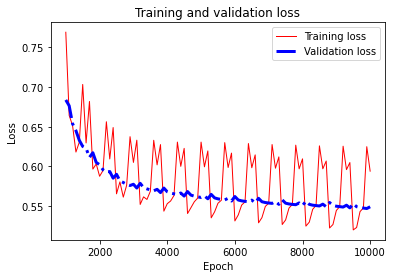

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.594101, Final Validation loss: 0.54932505, Training RMSE: 0.7388812, Validation RMSE: 0.7411647
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.73863345, Validation loss: 0.6702018, 
Epoch: 2000, Training loss: 0.58962286, Validation loss: 0.612435, 
Epoch: 3000, Training loss: 0.62368363, Validation loss: 0.5934165, 
Epoch: 4000, Training loss: 0.5575421, Validation loss: 0.57957727, 
Epoch: 5000, Training loss: 0.6410155, Validation loss: 0.5674652, 
Epoch: 6000, Training loss: 0.5492284, Validation loss: 0.56431603, 
Epoch: 7000, Training loss: 0.5461818, Validation loss: 0.56337875, 
Epoch: 8000, Training loss: 0.5941155, Validation loss: 0.56185776, 
Epoch: 9000, Training loss: 0.53345215, Validation loss: 0.5586293, 
Epoch: 10000, Trainin

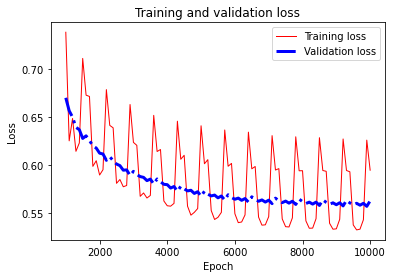

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59464395, Final Validation loss: 0.562687, Training RMSE: 0.735884, Validation RMSE: 0.75012463
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7561907, Validation loss: 0.64251304, 
Epoch: 2000, Training loss: 0.5689842, Validation loss: 0.57153225, 
Epoch: 3000, Training loss: 0.6333031, Validation loss: 0.5602185, 
Epoch: 4000, Training loss: 0.5184921, Validation loss: 0.55327433, 
Epoch: 5000, Training loss: 0.6317452, Validation loss: 0.550493, 
Epoch: 6000, Training loss: 0.53950036, Validation loss: 0.5485208, 
Epoch: 7000, Training loss: 0.5463237, Validation loss: 0.5461876, 
Epoch: 8000, Training loss: 0.59421813, Validation loss: 0.54727966, 
Epoch: 9000, Training loss: 0.5277598, Validation loss: 0.54555196, 
Epoch: 10000, Training

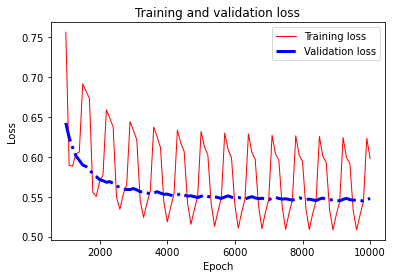

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5977442, Final Validation loss: 0.5477651, Training RMSE: 0.7367937, Validation RMSE: 0.74011153
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.9127296, Validation loss: 0.7592823, 
Epoch: 2000, Training loss: 0.5803818, Validation loss: 0.59128326, 
Epoch: 3000, Training loss: 0.64627564, Validation loss: 0.5697185, 
Epoch: 4000, Training loss: 0.5480515, Validation loss: 0.558003, 
Epoch: 5000, Training loss: 0.6573281, Validation loss: 0.55125564, 
Epoch: 6000, Training loss: 0.5428805, Validation loss: 0.5474881, 
Epoch: 7000, Training loss: 0.5584217, Validation loss: 0.5464359, 
Epoch: 8000, Training loss: 0.616683, Validation loss: 0.54506516, 
Epoch: 9000, Training loss: 0.5391392, Validation loss: 0.543164, 
Epoch: 10000, Training los

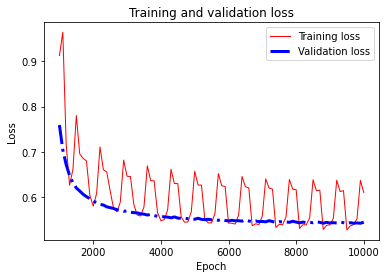

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6104705, Final Validation loss: 0.5447252, Training RMSE: 0.744121, Validation RMSE: 0.738055
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.0682379, Validation loss: 0.8788721, 
Epoch: 2000, Training loss: 0.56869143, Validation loss: 0.6127505, 
Epoch: 3000, Training loss: 0.6121259, Validation loss: 0.57213926, 
Epoch: 4000, Training loss: 0.5590459, Validation loss: 0.5524677, 
Epoch: 5000, Training loss: 0.6256606, Validation loss: 0.5486267, 
Epoch: 6000, Training loss: 0.53330505, Validation loss: 0.5434701, 
Epoch: 7000, Training loss: 0.54474074, Validation loss: 0.5414793, 
Epoch: 8000, Training loss: 0.57631534, Validation loss: 0.53945196, 
Epoch: 9000, Training loss: 0.5227594, Validation loss: 0.54129815, 
Epoch: 10000, Training 

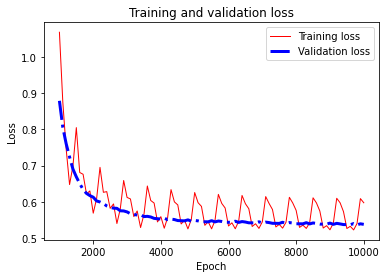

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59736514, Final Validation loss: 0.5377524, Training RMSE: 0.73509514, Validation RMSE: 0.733316
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.9214845, Validation loss: 0.8526699, 
Epoch: 2000, Training loss: 0.6229072, Validation loss: 0.6309183, 
Epoch: 3000, Training loss: 0.6407767, Validation loss: 0.5834871, 
Epoch: 4000, Training loss: 0.54984015, Validation loss: 0.5712616, 
Epoch: 5000, Training loss: 0.64771146, Validation loss: 0.560633, 
Epoch: 6000, Training loss: 0.53573567, Validation loss: 0.55360574, 
Epoch: 7000, Training loss: 0.5571242, Validation loss: 0.5483113, 
Epoch: 8000, Training loss: 0.6046594, Validation loss: 0.5426342, 
Epoch: 9000, Training loss: 0.5379311, Validation loss: 0.544741, 
Epoch: 10000, Training lo

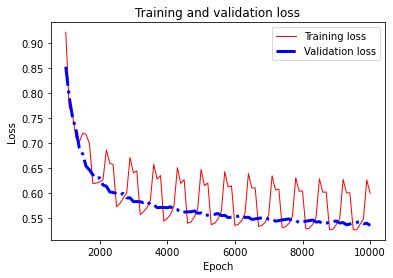

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60007626, Final Validation loss: 0.53594214, Training RMSE: 0.74102795, Validation RMSE: 0.7320807
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8605726, Validation loss: 0.8102594, 
Epoch: 2000, Training loss: 0.65755564, Validation loss: 0.6254377, 
Epoch: 3000, Training loss: 0.6158909, Validation loss: 0.58658236, 
Epoch: 4000, Training loss: 0.5373451, Validation loss: 0.57128674, 
Epoch: 5000, Training loss: 0.6517589, Validation loss: 0.5671354, 
Epoch: 6000, Training loss: 0.5503654, Validation loss: 0.563382, 
Epoch: 7000, Training loss: 0.5593646, Validation loss: 0.54774624, 
Epoch: 8000, Training loss: 0.61555296, Validation loss: 0.5459622, 
Epoch: 9000, Training loss: 0.53612006, Validation loss: 0.54685384, 
Epoch: 10000, Train

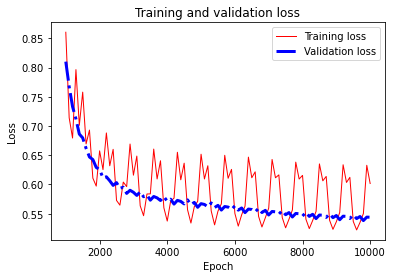

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6016234, Final Validation loss: 0.5438902, Training RMSE: 0.7412651, Validation RMSE: 0.7374891
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.66666174, Validation loss: 0.63847584, 
Epoch: 2000, Training loss: 0.5630466, Validation loss: 0.5798518, 
Epoch: 3000, Training loss: 0.6014829, Validation loss: 0.5614121, 
Epoch: 4000, Training loss: 0.5224677, Validation loss: 0.5546684, 
Epoch: 5000, Training loss: 0.65079397, Validation loss: 0.5476464, 
Epoch: 6000, Training loss: 0.57166284, Validation loss: 0.54635024, 
Epoch: 7000, Training loss: 0.54978365, Validation loss: 0.54201066, 
Epoch: 8000, Training loss: 0.58776647, Validation loss: 0.5417439, 
Epoch: 9000, Training loss: 0.5305695, Validation loss: 0.53994715, 
Epoch: 10000, Trai

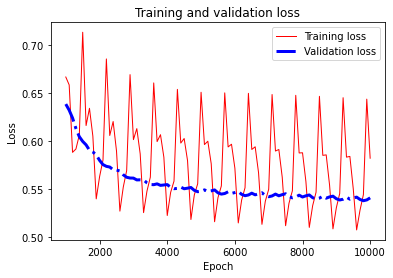

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5821279, Final Validation loss: 0.5408565, Training RMSE: 0.736199, Validation RMSE: 0.73542947
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.74748784 

Average Validation RMSE for the 10 folds: 0.7472223 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.05475, Validation loss: 0.9240164, 
Epoch: 2000, Training loss: 0.62509227, Validation loss: 0.65816516, 
Epoch: 3000, Training loss: 0.64705896, Validation loss: 0.6088348, 
Epoch: 4000, Training loss: 0.55366576, Validation loss: 0.5893186, 
Epoch: 5000, T

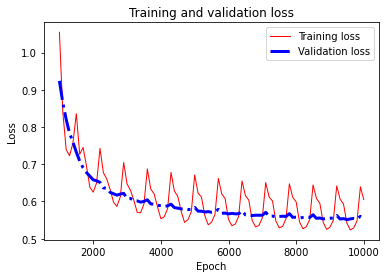

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6050936, Final Validation loss: 0.5515655, Training RMSE: 0.7380041, Validation RMSE: 0.7426746
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6964333, Validation loss: 0.6359317, 
Epoch: 2000, Training loss: 0.5538757, Validation loss: 0.5703047, 
Epoch: 3000, Training loss: 0.5850943, Validation loss: 0.56372106, 
Epoch: 4000, Training loss: 0.5266489, Validation loss: 0.54955065, 
Epoch: 5000, Training loss: 0.62330395, Validation loss: 0.54928, 
Epoch: 6000, Training loss: 0.52960217, Validation loss: 0.53664666, 
Epoch: 7000, Training loss: 0.541338, Validation loss: 0.53638214, 
Epoch: 8000, Training loss: 0.5955036, Validation loss: 0.5320897, 
Epoch: 9000, Training loss: 0.52771115, Validation loss: 0.53053135, 
Epoch: 10000, Training 

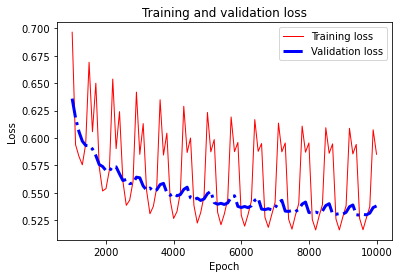

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5852095, Final Validation loss: 0.53805906, Training RMSE: 0.7363841, Validation RMSE: 0.7335251
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7790543, Validation loss: 0.7104141, 
Epoch: 2000, Training loss: 0.5576929, Validation loss: 0.5868055, 
Epoch: 3000, Training loss: 0.5919361, Validation loss: 0.5639752, 
Epoch: 4000, Training loss: 0.5281961, Validation loss: 0.55405974, 
Epoch: 5000, Training loss: 0.6180911, Validation loss: 0.5567054, 
Epoch: 6000, Training loss: 0.5412792, Validation loss: 0.544949, 
Epoch: 7000, Training loss: 0.541311, Validation loss: 0.5395044, 
Epoch: 8000, Training loss: 0.58781534, Validation loss: 0.5389499, 
Epoch: 9000, Training loss: 0.5272895, Validation loss: 0.5367397, 
Epoch: 10000, Training loss

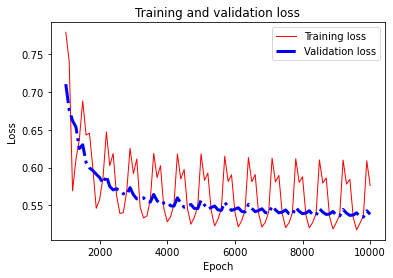

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.57625455, Final Validation loss: 0.5381706, Training RMSE: 0.7328197, Validation RMSE: 0.7336011
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.82261515, Validation loss: 0.74510515, 
Epoch: 2000, Training loss: 0.5834296, Validation loss: 0.6189889, 
Epoch: 3000, Training loss: 0.6436075, Validation loss: 0.6062405, 
Epoch: 4000, Training loss: 0.54064745, Validation loss: 0.58797, 
Epoch: 5000, Training loss: 0.6699524, Validation loss: 0.5790875, 
Epoch: 6000, Training loss: 0.5637184, Validation loss: 0.5734271, 
Epoch: 7000, Training loss: 0.54768836, Validation loss: 0.5645815, 
Epoch: 8000, Training loss: 0.58039165, Validation loss: 0.5627067, 
Epoch: 9000, Training loss: 0.5257899, Validation loss: 0.5568198, 
Epoch: 10000, Training l

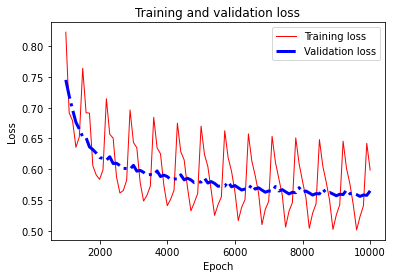

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5985711, Final Validation loss: 0.56478417, Training RMSE: 0.7344598, Validation RMSE: 0.7515212
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8962318, Validation loss: 0.7469528, 
Epoch: 2000, Training loss: 0.5940999, Validation loss: 0.6010461, 
Epoch: 3000, Training loss: 0.6514592, Validation loss: 0.58646494, 
Epoch: 4000, Training loss: 0.56094456, Validation loss: 0.57223415, 
Epoch: 5000, Training loss: 0.65419376, Validation loss: 0.56936926, 
Epoch: 6000, Training loss: 0.52095896, Validation loss: 0.5546065, 
Epoch: 7000, Training loss: 0.5496832, Validation loss: 0.5485904, 
Epoch: 8000, Training loss: 0.5899097, Validation loss: 0.5476541, 
Epoch: 9000, Training loss: 0.53414905, Validation loss: 0.5436555, 
Epoch: 10000, Traini

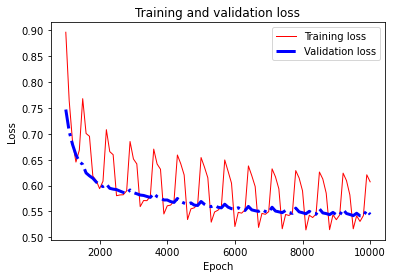

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6073291, Final Validation loss: 0.5442549, Training RMSE: 0.7361089, Validation RMSE: 0.73773634
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8592191, Validation loss: 0.805842, 
Epoch: 2000, Training loss: 0.61892307, Validation loss: 0.6259926, 
Epoch: 3000, Training loss: 0.65733814, Validation loss: 0.58941215, 
Epoch: 4000, Training loss: 0.56819123, Validation loss: 0.5763591, 
Epoch: 5000, Training loss: 0.62536836, Validation loss: 0.5719206, 
Epoch: 6000, Training loss: 0.5373048, Validation loss: 0.55362445, 
Epoch: 7000, Training loss: 0.5594072, Validation loss: 0.5483994, 
Epoch: 8000, Training loss: 0.6152744, Validation loss: 0.5447735, 
Epoch: 9000, Training loss: 0.5450023, Validation loss: 0.54052263, 
Epoch: 10000, Trainin

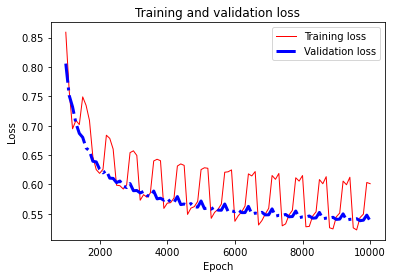

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60138106, Final Validation loss: 0.5377373, Training RMSE: 0.74112904, Validation RMSE: 0.73330575
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8316544, Validation loss: 0.696165, 
Epoch: 2000, Training loss: 0.5688938, Validation loss: 0.5982186, 
Epoch: 3000, Training loss: 0.6104933, Validation loss: 0.5799513, 
Epoch: 4000, Training loss: 0.5394778, Validation loss: 0.56310743, 
Epoch: 5000, Training loss: 0.63505566, Validation loss: 0.5604428, 
Epoch: 6000, Training loss: 0.5170953, Validation loss: 0.54776764, 
Epoch: 7000, Training loss: 0.5499016, Validation loss: 0.5440562, 
Epoch: 8000, Training loss: 0.6052908, Validation loss: 0.5458989, 
Epoch: 9000, Training loss: 0.532094, Validation loss: 0.543531, 
Epoch: 10000, Training lo

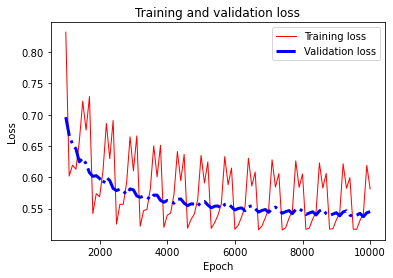

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58147836, Final Validation loss: 0.5451699, Training RMSE: 0.73981375, Validation RMSE: 0.73835623
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.65291345, Validation loss: 0.5901679, 
Epoch: 2000, Training loss: 0.53523505, Validation loss: 0.5531, 
Epoch: 3000, Training loss: 0.5994199, Validation loss: 0.53537, 
Epoch: 4000, Training loss: 0.522372, Validation loss: 0.5338661, 
Epoch: 5000, Training loss: 0.5941534, Validation loss: 0.5295582, 
Epoch: 6000, Training loss: 0.52107, Validation loss: 0.5286517, 
Epoch: 7000, Training loss: 0.52801675, Validation loss: 0.52357405, 
Epoch: 8000, Training loss: 0.5695099, Validation loss: 0.52042425, 
Epoch: 9000, Training loss: 0.5246787, Validation loss: 0.52334696, 
Epoch: 10000, Training loss

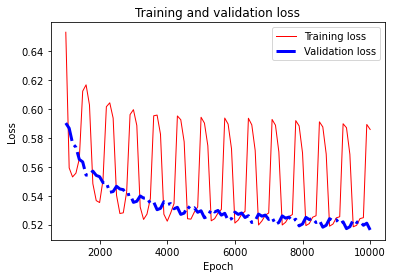

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5857509, Final Validation loss: 0.51633066, Training RMSE: 0.7250457, Validation RMSE: 0.71856153
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8037404, Validation loss: 0.67503345, 
Epoch: 2000, Training loss: 0.59071517, Validation loss: 0.5861665, 
Epoch: 3000, Training loss: 0.6441464, Validation loss: 0.5661482, 
Epoch: 4000, Training loss: 0.5395991, Validation loss: 0.5530771, 
Epoch: 5000, Training loss: 0.6201227, Validation loss: 0.54721934, 
Epoch: 6000, Training loss: 0.53843844, Validation loss: 0.543071, 
Epoch: 7000, Training loss: 0.5419092, Validation loss: 0.533303, 
Epoch: 8000, Training loss: 0.6014962, Validation loss: 0.5318007, 
Epoch: 9000, Training loss: 0.5319002, Validation loss: 0.53292114, 
Epoch: 10000, Training 

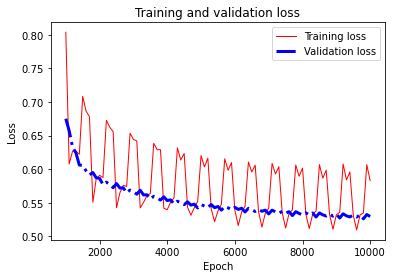

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58270293, Final Validation loss: 0.52942425, Training RMSE: 0.729948, Validation RMSE: 0.7276155
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.2111158, Validation loss: 1.0419186, 
Epoch: 2000, Training loss: 0.68621665, Validation loss: 0.7309529, 
Epoch: 3000, Training loss: 0.71055424, Validation loss: 0.67690045, 
Epoch: 4000, Training loss: 0.6342389, Validation loss: 0.6626958, 
Epoch: 5000, Training loss: 0.63921934, Validation loss: 0.61711663, 
Epoch: 6000, Training loss: 0.57334167, Validation loss: 0.60725045, 
Epoch: 7000, Training loss: 0.596897, Validation loss: 0.59775156, 
Epoch: 8000, Training loss: 0.6769776, Validation loss: 0.59848225, 
Epoch: 9000, Training loss: 0.5738678, Validation loss: 0.5901436, 
Epoch: 10000, Trai

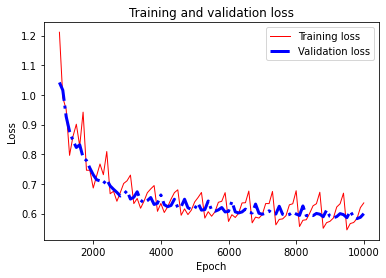

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.63593876, Final Validation loss: 0.59969425, Training RMSE: 0.76603, Validation RMSE: 0.7743993
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7462987 

Average Validation RMSE for the 10 folds: 0.74621075 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6593326, Validation loss: 0.59971714, 
Epoch: 2000, Training loss: 0.55543256, Validation loss: 0.5638972, 
Epoch: 3000, Training loss: 0.6293937, Validation loss: 0.55382687, 
Epoch: 4000, Training loss: 0.5153688, Validation loss: 0.5495991, 
Epoch: 5000, 

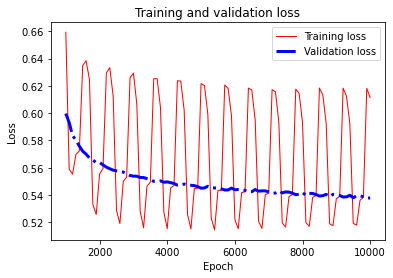

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.61139023, Final Validation loss: 0.5378512, Training RMSE: 0.7328873, Validation RMSE: 0.7333834
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.74397016, Validation loss: 0.6752574, 
Epoch: 2000, Training loss: 0.5643523, Validation loss: 0.5693652, 
Epoch: 3000, Training loss: 0.61548704, Validation loss: 0.5562118, 
Epoch: 4000, Training loss: 0.5342912, Validation loss: 0.54576904, 
Epoch: 5000, Training loss: 0.6103312, Validation loss: 0.54912776, 
Epoch: 6000, Training loss: 0.5393946, Validation loss: 0.53784776, 
Epoch: 7000, Training loss: 0.54075295, Validation loss: 0.5364156, 
Epoch: 8000, Training loss: 0.5812644, Validation loss: 0.53290266, 
Epoch: 9000, Training loss: 0.52019835, Validation loss: 0.53072816, 
Epoch: 10000, Trai

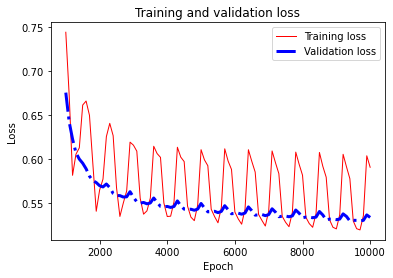

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.590322, Final Validation loss: 0.5332591, Training RMSE: 0.7321491, Validation RMSE: 0.7302459
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.72997624, Validation loss: 0.64828444, 
Epoch: 2000, Training loss: 0.563713, Validation loss: 0.57545555, 
Epoch: 3000, Training loss: 0.6045948, Validation loss: 0.5558765, 
Epoch: 4000, Training loss: 0.5153091, Validation loss: 0.5486206, 
Epoch: 5000, Training loss: 0.60820407, Validation loss: 0.54049057, 
Epoch: 6000, Training loss: 0.5088865, Validation loss: 0.5388431, 
Epoch: 7000, Training loss: 0.53554934, Validation loss: 0.5337124, 
Epoch: 8000, Training loss: 0.5776471, Validation loss: 0.53035337, 
Epoch: 9000, Training loss: 0.5230885, Validation loss: 0.5304373, 
Epoch: 10000, Training 

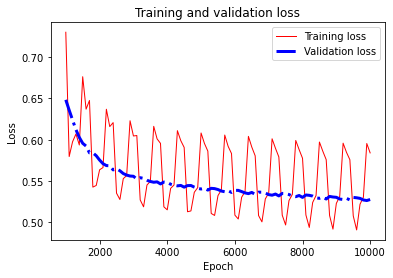

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.584146, Final Validation loss: 0.52777606, Training RMSE: 0.72808594, Validation RMSE: 0.726482
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7146988, Validation loss: 0.6850399, 
Epoch: 2000, Training loss: 0.5719897, Validation loss: 0.6042525, 
Epoch: 3000, Training loss: 0.62228763, Validation loss: 0.59417146, 
Epoch: 4000, Training loss: 0.5433964, Validation loss: 0.5799082, 
Epoch: 5000, Training loss: 0.647202, Validation loss: 0.5744868, 
Epoch: 6000, Training loss: 0.5339668, Validation loss: 0.568601, 
Epoch: 7000, Training loss: 0.55078566, Validation loss: 0.5644841, 
Epoch: 8000, Training loss: 0.59559035, Validation loss: 0.5597403, 
Epoch: 9000, Training loss: 0.5153278, Validation loss: 0.5565946, 
Epoch: 10000, Training los

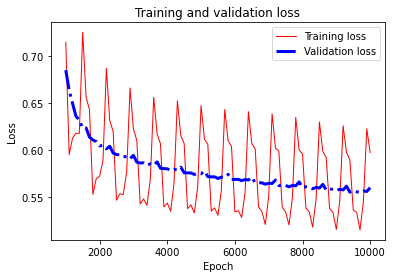

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59719336, Final Validation loss: 0.5597493, Training RMSE: 0.736595, Validation RMSE: 0.74816394
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.1452868, Validation loss: 1.0402846, 
Epoch: 2000, Training loss: 0.7632746, Validation loss: 0.81294036, 
Epoch: 3000, Training loss: 0.73986113, Validation loss: 0.6297427, 
Epoch: 4000, Training loss: 0.6466565, Validation loss: 0.62015384, 
Epoch: 5000, Training loss: 0.63861793, Validation loss: 0.59856033, 
Epoch: 6000, Training loss: 0.53869385, Validation loss: 0.58805543, 
Epoch: 7000, Training loss: 0.59057397, Validation loss: 0.5906236, 
Epoch: 8000, Training loss: 0.6004399, Validation loss: 0.56064534, 
Epoch: 9000, Training loss: 0.5796782, Validation loss: 0.5781636, 
Epoch: 10000, Trai

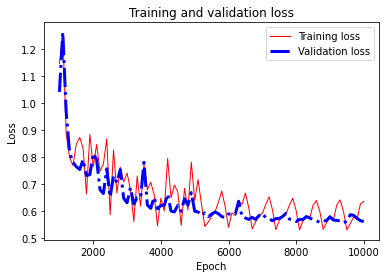

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.63484156, Final Validation loss: 0.56017053, Training RMSE: 0.74570036, Validation RMSE: 0.7484454
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.74229515, Validation loss: 0.6686714, 
Epoch: 2000, Training loss: 0.5836136, Validation loss: 0.5852143, 
Epoch: 3000, Training loss: 0.61121166, Validation loss: 0.563289, 
Epoch: 4000, Training loss: 0.5401148, Validation loss: 0.5540595, 
Epoch: 5000, Training loss: 0.65397155, Validation loss: 0.55226785, 
Epoch: 6000, Training loss: 0.5447791, Validation loss: 0.5458189, 
Epoch: 7000, Training loss: 0.5452868, Validation loss: 0.54130405, 
Epoch: 8000, Training loss: 0.5918517, Validation loss: 0.53691256, 
Epoch: 9000, Training loss: 0.53668696, Validation loss: 0.53429407, 
Epoch: 10000, Trai

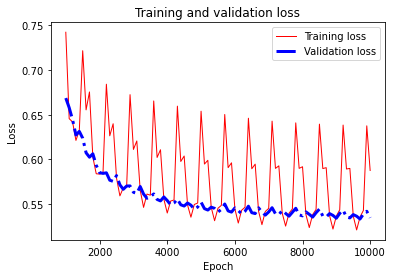

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58766663, Final Validation loss: 0.53476995, Training RMSE: 0.73523206, Validation RMSE: 0.7312797
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7677541, Validation loss: 0.7482455, 
Epoch: 2000, Training loss: 0.5817177, Validation loss: 0.59567213, 
Epoch: 3000, Training loss: 0.614997, Validation loss: 0.56851196, 
Epoch: 4000, Training loss: 0.55066913, Validation loss: 0.56126773, 
Epoch: 5000, Training loss: 0.6024493, Validation loss: 0.5603994, 
Epoch: 6000, Training loss: 0.5307453, Validation loss: 0.54638475, 
Epoch: 7000, Training loss: 0.5439575, Validation loss: 0.542736, 
Epoch: 8000, Training loss: 0.574757, Validation loss: 0.5411329, 
Epoch: 9000, Training loss: 0.55436283, Validation loss: 0.54164195, 
Epoch: 10000, Trainin

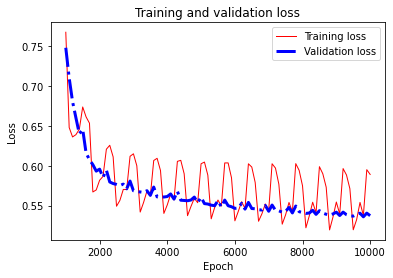

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5890435, Final Validation loss: 0.5371916, Training RMSE: 0.7341084, Validation RMSE: 0.7329336
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7534627, Validation loss: 0.62251115, 
Epoch: 2000, Training loss: 0.5525744, Validation loss: 0.5631224, 
Epoch: 3000, Training loss: 0.60788643, Validation loss: 0.5478102, 
Epoch: 4000, Training loss: 0.5271489, Validation loss: 0.5437742, 
Epoch: 5000, Training loss: 0.6178442, Validation loss: 0.5449448, 
Epoch: 6000, Training loss: 0.52832085, Validation loss: 0.533918, 
Epoch: 7000, Training loss: 0.5405071, Validation loss: 0.5320662, 
Epoch: 8000, Training loss: 0.57888, Validation loss: 0.5304249, 
Epoch: 9000, Training loss: 0.5306299, Validation loss: 0.530141, 
Epoch: 10000, Training loss: 

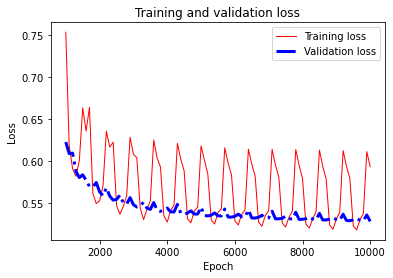

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5931424, Final Validation loss: 0.5279202, Training RMSE: 0.7353772, Validation RMSE: 0.72658116
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.64755625, Validation loss: 0.6223741, 
Epoch: 2000, Training loss: 0.55868095, Validation loss: 0.5802597, 
Epoch: 3000, Training loss: 0.6040502, Validation loss: 0.5635001, 
Epoch: 4000, Training loss: 0.5621743, Validation loss: 0.55315024, 
Epoch: 5000, Training loss: 0.632622, Validation loss: 0.5526497, 
Epoch: 6000, Training loss: 0.53140855, Validation loss: 0.54802936, 
Epoch: 7000, Training loss: 0.5451544, Validation loss: 0.54002184, 
Epoch: 8000, Training loss: 0.57678866, Validation loss: 0.54068094, 
Epoch: 9000, Training loss: 0.52782685, Validation loss: 0.5447646, 
Epoch: 10000, Train

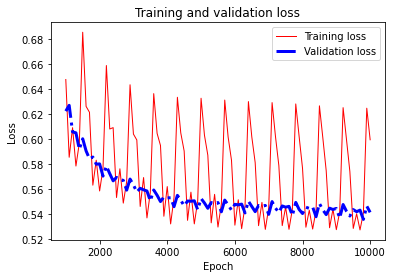

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5995002, Final Validation loss: 0.5416263, Training RMSE: 0.7373389, Validation RMSE: 0.7359526
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.73763967, Validation loss: 0.62266487, 
Epoch: 2000, Training loss: 0.57300824, Validation loss: 0.56751746, 
Epoch: 3000, Training loss: 0.63428885, Validation loss: 0.5584627, 
Epoch: 4000, Training loss: 0.5355431, Validation loss: 0.5622088, 
Epoch: 5000, Training loss: 0.64352643, Validation loss: 0.55427814, 
Epoch: 6000, Training loss: 0.5477424, Validation loss: 0.5474951, 
Epoch: 7000, Training loss: 0.55529356, Validation loss: 0.54545414, 
Epoch: 8000, Training loss: 0.5952325, Validation loss: 0.55608207, 
Epoch: 9000, Training loss: 0.5358053, Validation loss: 0.5378697, 
Epoch: 10000, Tra

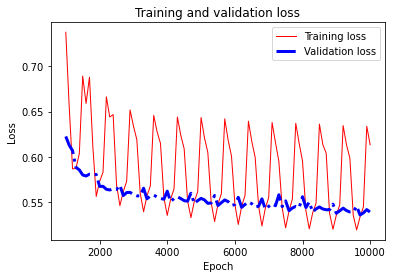

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6134404, Final Validation loss: 0.53902674, Training RMSE: 0.7407579, Validation RMSE: 0.7341844
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7451347 

Average Validation RMSE for the 10 folds: 0.74493897 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.1392875, Validation loss: 1.0098796, 
Epoch: 2000, Training loss: 0.6755655, Validation loss: 0.7278035, 
Epoch: 3000, Training loss: 0.7167778, Validation loss: 0.6465033, 
Epoch: 4000, Training loss: 0.5841749, Validation loss: 0.61076427, 
Epoch: 5000, Trai

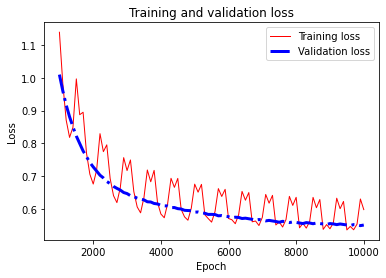

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5975404, Final Validation loss: 0.5504128, Training RMSE: 0.7425589, Validation RMSE: 0.74189806
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.0787829, Validation loss: 1.0412049, 
Epoch: 2000, Training loss: 0.8260717, Validation loss: 0.76575714, 
Epoch: 3000, Training loss: 0.71597743, Validation loss: 0.64949757, 
Epoch: 4000, Training loss: 0.60193783, Validation loss: 0.6114359, 
Epoch: 5000, Training loss: 0.640047, Validation loss: 0.5881579, 
Epoch: 6000, Training loss: 0.5431379, Validation loss: 0.57435685, 
Epoch: 7000, Training loss: 0.5639919, Validation loss: 0.5686012, 
Epoch: 8000, Training loss: 0.6050456, Validation loss: 0.5552213, 
Epoch: 9000, Training loss: 0.5469615, Validation loss: 0.55175304, 
Epoch: 10000, Training lo

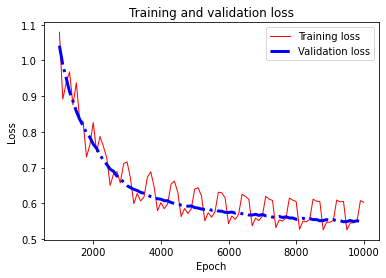

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6030329, Final Validation loss: 0.5490147, Training RMSE: 0.741223, Validation RMSE: 0.74095523
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8388306, Validation loss: 0.8560248, 
Epoch: 2000, Training loss: 0.6390121, Validation loss: 0.66687983, 
Epoch: 3000, Training loss: 0.6500504, Validation loss: 0.6052287, 
Epoch: 4000, Training loss: 0.5448365, Validation loss: 0.57292956, 
Epoch: 5000, Training loss: 0.6501906, Validation loss: 0.5587782, 
Epoch: 6000, Training loss: 0.5394552, Validation loss: 0.55445814, 
Epoch: 7000, Training loss: 0.5508674, Validation loss: 0.5497118, 
Epoch: 8000, Training loss: 0.5946437, Validation loss: 0.54640067, 
Epoch: 9000, Training loss: 0.5337176, Validation loss: 0.542524, 
Epoch: 10000, Training loss:

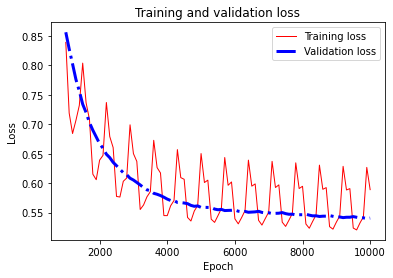

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.588947, Final Validation loss: 0.54071885, Training RMSE: 0.7363388, Validation RMSE: 0.7353359
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.9803126, Validation loss: 1.8030592, 
Epoch: 2000, Training loss: 0.8513246, Validation loss: 0.9048619, 
Epoch: 3000, Training loss: 0.7564846, Validation loss: 0.72256005, 
Epoch: 4000, Training loss: 0.6152005, Validation loss: 0.6623345, 
Epoch: 5000, Training loss: 0.6646638, Validation loss: 0.6243063, 
Epoch: 6000, Training loss: 0.5881726, Validation loss: 0.60329497, 
Epoch: 7000, Training loss: 0.5797994, Validation loss: 0.5919334, 
Epoch: 8000, Training loss: 0.60701203, Validation loss: 0.58101916, 
Epoch: 9000, Training loss: 0.5467713, Validation loss: 0.5741897, 
Epoch: 10000, Training loss

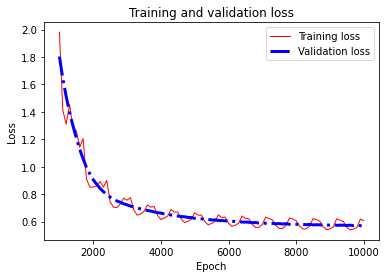

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6075047, Final Validation loss: 0.57160336, Training RMSE: 0.7463203, Validation RMSE: 0.75604457
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.0343163, Validation loss: 0.92599165, 
Epoch: 2000, Training loss: 0.6988125, Validation loss: 0.68591213, 
Epoch: 3000, Training loss: 0.68688697, Validation loss: 0.6207707, 
Epoch: 4000, Training loss: 0.593981, Validation loss: 0.5960015, 
Epoch: 5000, Training loss: 0.67158854, Validation loss: 0.5846614, 
Epoch: 6000, Training loss: 0.5447069, Validation loss: 0.5743088, 
Epoch: 7000, Training loss: 0.57103115, Validation loss: 0.5680255, 
Epoch: 8000, Training loss: 0.61614037, Validation loss: 0.56429845, 
Epoch: 9000, Training loss: 0.5434926, Validation loss: 0.5599578, 
Epoch: 10000, Training 

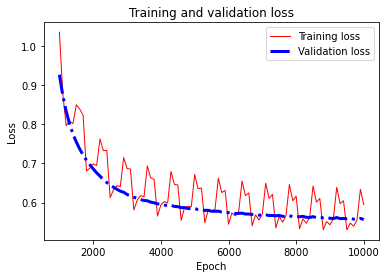

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5947338, Final Validation loss: 0.5568772, Training RMSE: 0.74412316, Validation RMSE: 0.74624205
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.7671688, Validation loss: 1.773873, 
Epoch: 2000, Training loss: 0.6960678, Validation loss: 0.78161615, 
Epoch: 3000, Training loss: 0.68876016, Validation loss: 0.6240181, 
Epoch: 4000, Training loss: 0.59558225, Validation loss: 0.59577924, 
Epoch: 5000, Training loss: 0.6686857, Validation loss: 0.58283925, 
Epoch: 6000, Training loss: 0.5549063, Validation loss: 0.57153684, 
Epoch: 7000, Training loss: 0.577035, Validation loss: 0.5646345, 
Epoch: 8000, Training loss: 0.5965324, Validation loss: 0.55764866, 
Epoch: 9000, Training loss: 0.5377613, Validation loss: 0.5525295, 
Epoch: 10000, Training l

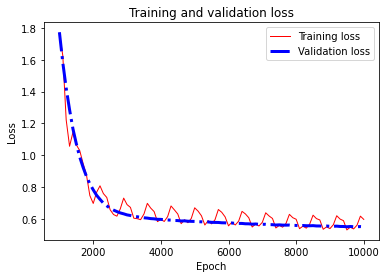

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59560794, Final Validation loss: 0.54852974, Training RMSE: 0.7480751, Validation RMSE: 0.74062794
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 2.1734502, Validation loss: 1.7445126, 
Epoch: 2000, Training loss: 1.038978, Validation loss: 0.9733133, 
Epoch: 3000, Training loss: 0.9031405, Validation loss: 0.7719639, 
Epoch: 4000, Training loss: 0.62213427, Validation loss: 0.6870279, 
Epoch: 5000, Training loss: 0.6944846, Validation loss: 0.6395957, 
Epoch: 6000, Training loss: 0.61935633, Validation loss: 0.6128164, 
Epoch: 7000, Training loss: 0.5921814, Validation loss: 0.59327316, 
Epoch: 8000, Training loss: 0.6238066, Validation loss: 0.58007485, 
Epoch: 9000, Training loss: 0.5540063, Validation loss: 0.5721727, 
Epoch: 10000, Training lo

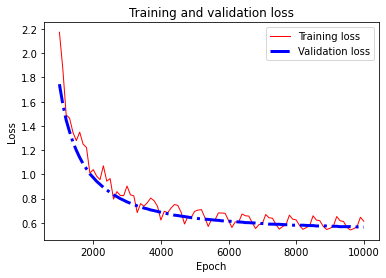

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6124705, Final Validation loss: 0.56291074, Training RMSE: 0.75215185, Validation RMSE: 0.75027376
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.4721001, Validation loss: 1.570472, 
Epoch: 2000, Training loss: 0.7825979, Validation loss: 0.78357816, 
Epoch: 3000, Training loss: 0.7251517, Validation loss: 0.65285426, 
Epoch: 4000, Training loss: 0.59366703, Validation loss: 0.6033548, 
Epoch: 5000, Training loss: 0.68406713, Validation loss: 0.5787848, 
Epoch: 6000, Training loss: 0.5502804, Validation loss: 0.560466, 
Epoch: 7000, Training loss: 0.56535774, Validation loss: 0.54808456, 
Epoch: 8000, Training loss: 0.6055633, Validation loss: 0.5403377, 
Epoch: 9000, Training loss: 0.53691626, Validation loss: 0.53476775, 
Epoch: 10000, Training

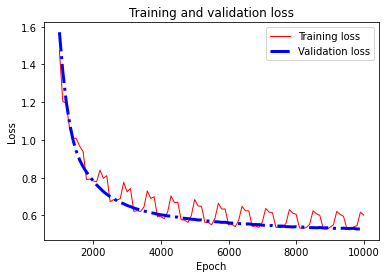

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60133845, Final Validation loss: 0.52756864, Training RMSE: 0.7391794, Validation RMSE: 0.7263392
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.8453184, Validation loss: 1.7158449, 
Epoch: 2000, Training loss: 0.9250608, Validation loss: 0.9893787, 
Epoch: 3000, Training loss: 0.8712603, Validation loss: 0.79155624, 
Epoch: 4000, Training loss: 0.6434719, Validation loss: 0.7097413, 
Epoch: 5000, Training loss: 0.72406703, Validation loss: 0.66552716, 
Epoch: 6000, Training loss: 0.6501052, Validation loss: 0.63492715, 
Epoch: 7000, Training loss: 0.6066244, Validation loss: 0.6140375, 
Epoch: 8000, Training loss: 0.6144527, Validation loss: 0.60174423, 
Epoch: 9000, Training loss: 0.5755892, Validation loss: 0.5900995, 
Epoch: 10000, Training l

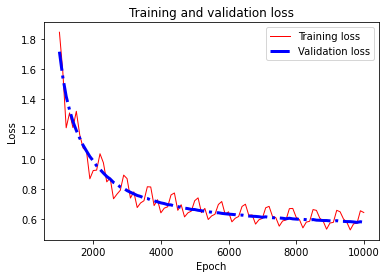

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.64556277, Final Validation loss: 0.5803857, Training RMSE: 0.75612414, Validation RMSE: 0.7618305
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.5855851, Validation loss: 1.4630115, 
Epoch: 2000, Training loss: 0.80636084, Validation loss: 0.97001594, 
Epoch: 3000, Training loss: 0.8469784, Validation loss: 0.78408915, 
Epoch: 4000, Training loss: 0.6349596, Validation loss: 0.6848407, 
Epoch: 5000, Training loss: 0.729273, Validation loss: 0.6366974, 
Epoch: 6000, Training loss: 0.59507275, Validation loss: 0.60941184, 
Epoch: 7000, Training loss: 0.5994914, Validation loss: 0.59197396, 
Epoch: 8000, Training loss: 0.65473676, Validation loss: 0.5796632, 
Epoch: 9000, Training loss: 0.5583958, Validation loss: 0.571467, 
Epoch: 10000, Training 

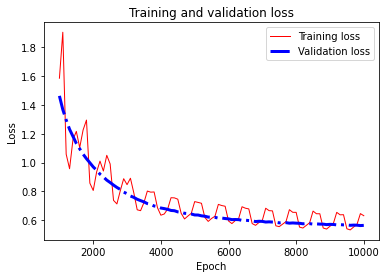

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.63142794, Final Validation loss: 0.56439507, Training RMSE: 0.7539276, Validation RMSE: 0.7512623
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.74522156 

Average Validation RMSE for the 10 folds: 0.7449532 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.6596441, Validation loss: 2.8378286, 
Epoch: 2000, Training loss: 1.0245032, Validation loss: 1.2265753, 
Epoch: 3000, Training loss: 0.84841514, Validation loss: 0.83000803, 
Epoch: 4000, Training loss: 0.649924, Validation loss: 0.6872437, 
Epoch: 5000, Traini

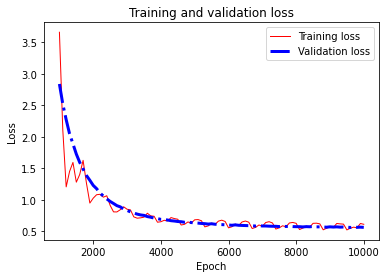

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6091395, Final Validation loss: 0.56033856, Training RMSE: 0.7417707, Validation RMSE: 0.7485576
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.6137443, Validation loss: 1.5154214, 
Epoch: 2000, Training loss: 0.8033057, Validation loss: 0.8876501, 
Epoch: 3000, Training loss: 0.8198652, Validation loss: 0.72882473, 
Epoch: 4000, Training loss: 0.71519685, Validation loss: 0.6706843, 
Epoch: 5000, Training loss: 0.7092641, Validation loss: 0.62726825, 
Epoch: 6000, Training loss: 0.5814594, Validation loss: 0.6017357, 
Epoch: 7000, Training loss: 0.5838147, Validation loss: 0.58588785, 
Epoch: 8000, Training loss: 0.6373426, Validation loss: 0.5699212, 
Epoch: 9000, Training loss: 0.5372622, Validation loss: 0.559884, 
Epoch: 10000, Training loss

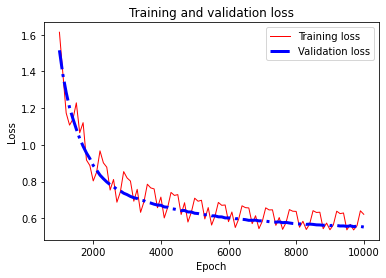

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.62147856, Final Validation loss: 0.55205786, Training RMSE: 0.7472421, Validation RMSE: 0.743006
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 26.128525, Validation loss: 21.692474, 
Epoch: 2000, Training loss: 3.4595947, Validation loss: 4.4220324, 
Epoch: 3000, Training loss: 2.3151002, Validation loss: 2.5799208, 
Epoch: 4000, Training loss: 1.8727691, Validation loss: 1.8103458, 
Epoch: 5000, Training loss: 1.782733, Validation loss: 1.3705692, 
Epoch: 6000, Training loss: 1.1549715, Validation loss: 1.0836294, 
Epoch: 7000, Training loss: 0.89110255, Validation loss: 0.88369584, 
Epoch: 8000, Training loss: 0.7500574, Validation loss: 0.76711303, 
Epoch: 9000, Training loss: 0.6476498, Validation loss: 0.69467866, 
Epoch: 10000, Training loss

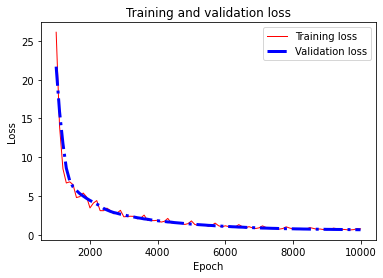

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.7497846, Final Validation loss: 0.64766294, Training RMSE: 0.8074822, Validation RMSE: 0.80477506
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 5.622913, Validation loss: 4.3322706, 
Epoch: 2000, Training loss: 1.7933543, Validation loss: 1.7963384, 
Epoch: 3000, Training loss: 1.1609863, Validation loss: 1.2093072, 
Epoch: 4000, Training loss: 0.87817085, Validation loss: 0.92560273, 
Epoch: 5000, Training loss: 0.8299155, Validation loss: 0.7738425, 
Epoch: 6000, Training loss: 0.67439514, Validation loss: 0.6870033, 
Epoch: 7000, Training loss: 0.63385594, Validation loss: 0.64567643, 
Epoch: 8000, Training loss: 0.66002214, Validation loss: 0.61392456, 
Epoch: 9000, Training loss: 0.56194663, Validation loss: 0.59568185, 
Epoch: 10000, Trainin

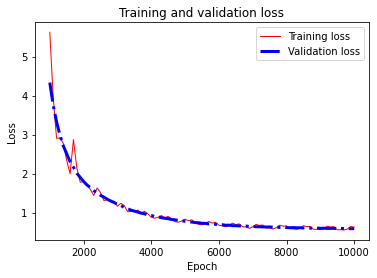

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6237603, Final Validation loss: 0.5876721, Training RMSE: 0.7563152, Validation RMSE: 0.76659775
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 8.340021, Validation loss: 7.602374, 
Epoch: 2000, Training loss: 3.0607948, Validation loss: 3.2260485, 
Epoch: 3000, Training loss: 1.7890089, Validation loss: 1.9791715, 
Epoch: 4000, Training loss: 1.3558699, Validation loss: 1.396448, 
Epoch: 5000, Training loss: 1.2695307, Validation loss: 1.0895035, 
Epoch: 6000, Training loss: 0.9126482, Validation loss: 0.891652, 
Epoch: 7000, Training loss: 0.7470258, Validation loss: 0.77506155, 
Epoch: 8000, Training loss: 0.7190953, Validation loss: 0.7031556, 
Epoch: 9000, Training loss: 0.60690665, Validation loss: 0.65661633, 
Epoch: 10000, Training loss: 0.

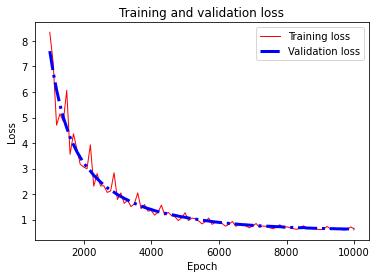

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6318239, Final Validation loss: 0.62527543, Training RMSE: 0.78223705, Validation RMSE: 0.7907436
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 6.985569, Validation loss: 7.2475085, 
Epoch: 2000, Training loss: 2.6553888, Validation loss: 2.8056428, 
Epoch: 3000, Training loss: 1.7833196, Validation loss: 1.7076193, 
Epoch: 4000, Training loss: 1.1922239, Validation loss: 1.2426497, 
Epoch: 5000, Training loss: 1.1667109, Validation loss: 1.0001084, 
Epoch: 6000, Training loss: 0.8817545, Validation loss: 0.8497997, 
Epoch: 7000, Training loss: 0.7518454, Validation loss: 0.75161225, 
Epoch: 8000, Training loss: 0.7240957, Validation loss: 0.67781556, 
Epoch: 9000, Training loss: 0.60825545, Validation loss: 0.6396245, 
Epoch: 10000, Training loss

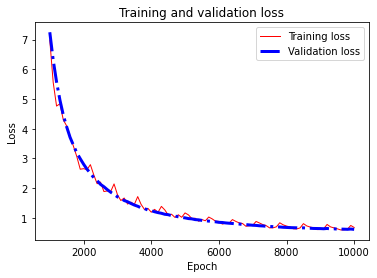

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.67655736, Final Validation loss: 0.612784, Training RMSE: 0.7853956, Validation RMSE: 0.7828052
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.190709, Validation loss: 2.8744469, 
Epoch: 2000, Training loss: 1.0744338, Validation loss: 1.2652804, 
Epoch: 3000, Training loss: 0.91036355, Validation loss: 0.9197289, 
Epoch: 4000, Training loss: 0.71316797, Validation loss: 0.78515846, 
Epoch: 5000, Training loss: 0.8238931, Validation loss: 0.7046385, 
Epoch: 6000, Training loss: 0.69035643, Validation loss: 0.6601539, 
Epoch: 7000, Training loss: 0.61536837, Validation loss: 0.62191194, 
Epoch: 8000, Training loss: 0.64269507, Validation loss: 0.5962432, 
Epoch: 9000, Training loss: 0.57652164, Validation loss: 0.5871707, 
Epoch: 10000, Training l

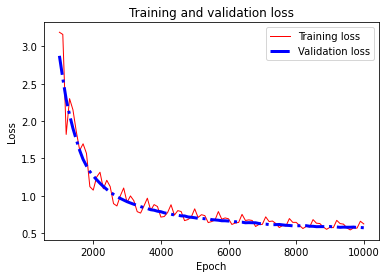

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6214028, Final Validation loss: 0.57021576, Training RMSE: 0.74911946, Validation RMSE: 0.7551263
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.1593853, Validation loss: 0.9960645, 
Epoch: 2000, Training loss: 0.6633355, Validation loss: 0.7254291, 
Epoch: 3000, Training loss: 0.66694653, Validation loss: 0.6196248, 
Epoch: 4000, Training loss: 0.52944523, Validation loss: 0.5694772, 
Epoch: 5000, Training loss: 0.6495246, Validation loss: 0.54832685, 
Epoch: 6000, Training loss: 0.53496903, Validation loss: 0.54016405, 
Epoch: 7000, Training loss: 0.5492638, Validation loss: 0.5314416, 
Epoch: 8000, Training loss: 0.6020169, Validation loss: 0.52909505, 
Epoch: 9000, Training loss: 0.53461725, Validation loss: 0.525496, 
Epoch: 10000, Training 

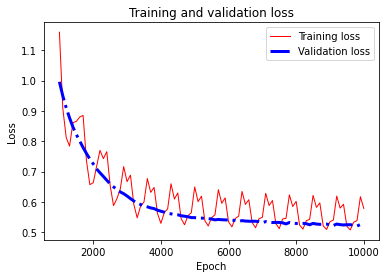

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5788488, Final Validation loss: 0.5236673, Training RMSE: 0.73480815, Validation RMSE: 0.7236486
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 15.519387, Validation loss: 15.300335, 
Epoch: 2000, Training loss: 3.8294024, Validation loss: 4.252878, 
Epoch: 3000, Training loss: 1.1527545, Validation loss: 1.1667943, 
Epoch: 4000, Training loss: 0.7850244, Validation loss: 0.85577494, 
Epoch: 5000, Training loss: 0.83985007, Validation loss: 0.71408236, 
Epoch: 6000, Training loss: 0.648996, Validation loss: 0.6611937, 
Epoch: 7000, Training loss: 0.6197713, Validation loss: 0.6298368, 
Epoch: 8000, Training loss: 0.63236904, Validation loss: 0.6110214, 
Epoch: 9000, Training loss: 0.5757818, Validation loss: 0.5955853, 
Epoch: 10000, Training loss:

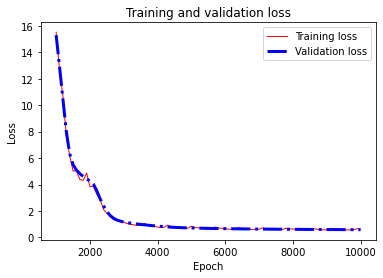

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6295593, Final Validation loss: 0.5830614, Training RMSE: 0.7615955, Validation RMSE: 0.76358455
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 7.3213115, Validation loss: 4.4675317, 
Epoch: 2000, Training loss: 1.9189084, Validation loss: 1.7486614, 
Epoch: 3000, Training loss: 1.1363263, Validation loss: 1.0863093, 
Epoch: 4000, Training loss: 0.69001335, Validation loss: 0.8334883, 
Epoch: 5000, Training loss: 0.8958252, Validation loss: 0.72601247, 
Epoch: 6000, Training loss: 0.6213833, Validation loss: 0.6668584, 
Epoch: 7000, Training loss: 0.62905777, Validation loss: 0.638318, 
Epoch: 8000, Training loss: 0.6583875, Validation loss: 0.6076727, 
Epoch: 9000, Training loss: 0.56166905, Validation loss: 0.59192073, 
Epoch: 10000, Training lo

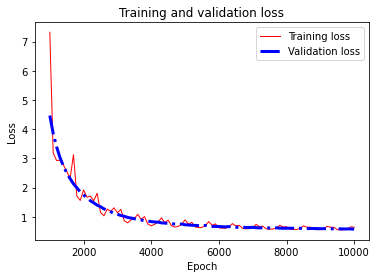

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6399921, Final Validation loss: 0.5763936, Training RMSE: 0.7539351, Validation RMSE: 0.7592059
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.74674594 

Average Validation RMSE for the 10 folds: 0.7466671 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.90139604, Validation loss: 0.8397663, 
Epoch: 2000, Training loss: 0.63170916, Validation loss: 0.6360482, 
Epoch: 3000, Training loss: 0.6192421, Validation loss: 0.58413166, 
Epoch: 4000, Training loss: 0.5678444, Validation loss: 0.564123, 
Epoch: 5000, Trainin

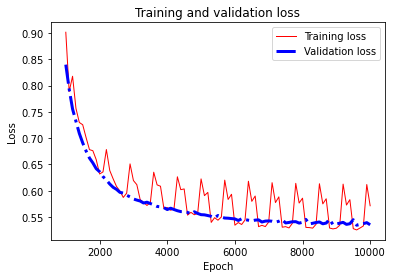

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5712879, Final Validation loss: 0.53508383, Training RMSE: 0.72988194, Validation RMSE: 0.73149425
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 5.1710215, Validation loss: 6.02184, 
Epoch: 2000, Training loss: 2.9129007, Validation loss: 2.8673625, 
Epoch: 3000, Training loss: 1.8762703, Validation loss: 1.778246, 
Epoch: 4000, Training loss: 1.1792314, Validation loss: 1.2324355, 
Epoch: 5000, Training loss: 1.0439658, Validation loss: 0.9320395, 
Epoch: 6000, Training loss: 0.76219213, Validation loss: 0.77365464, 
Epoch: 7000, Training loss: 0.69312257, Validation loss: 0.68859595, 
Epoch: 8000, Training loss: 0.66152227, Validation loss: 0.6359287, 
Epoch: 9000, Training loss: 0.59954447, Validation loss: 0.60617644, 
Epoch: 10000, Training l

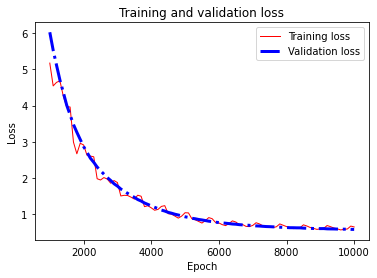

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6517827, Final Validation loss: 0.5838906, Training RMSE: 0.7690175, Validation RMSE: 0.7641274
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.6385279, Validation loss: 1.589407, 
Epoch: 2000, Training loss: 0.9430108, Validation loss: 0.8991735, 
Epoch: 3000, Training loss: 0.81068605, Validation loss: 0.73914105, 
Epoch: 4000, Training loss: 0.6215893, Validation loss: 0.6660428, 
Epoch: 5000, Training loss: 0.68875813, Validation loss: 0.62066704, 
Epoch: 6000, Training loss: 0.5985002, Validation loss: 0.5940277, 
Epoch: 7000, Training loss: 0.5767051, Validation loss: 0.56981856, 
Epoch: 8000, Training loss: 0.60548365, Validation loss: 0.5526191, 
Epoch: 9000, Training loss: 0.5390111, Validation loss: 0.54215, 
Epoch: 10000, Training loss:

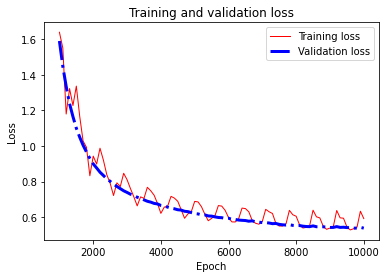

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5922283, Final Validation loss: 0.53858584, Training RMSE: 0.7380754, Validation RMSE: 0.7338841
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 40.059006, Validation loss: 32.52084, 
Epoch: 2000, Training loss: 7.166356, Validation loss: 7.592078, 
Epoch: 3000, Training loss: 4.73838, Validation loss: 4.0569153, 
Epoch: 4000, Training loss: 3.0493872, Validation loss: 2.6632745, 
Epoch: 5000, Training loss: 2.1428525, Validation loss: 1.7585801, 
Epoch: 6000, Training loss: 1.492766, Validation loss: 1.2850759, 
Epoch: 7000, Training loss: 1.0264698, Validation loss: 1.0564399, 
Epoch: 8000, Training loss: 0.94747776, Validation loss: 0.90779823, 
Epoch: 9000, Training loss: 0.78307563, Validation loss: 0.80316615, 
Epoch: 10000, Training loss: 0.7

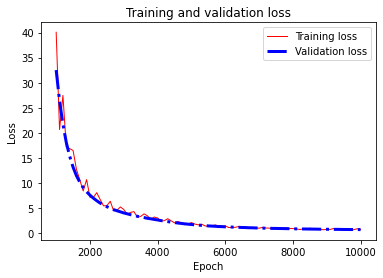

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.7826811, Final Validation loss: 0.7421537, Training RMSE: 0.84271026, Validation RMSE: 0.86148345
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.2743833, Validation loss: 1.0745213, 
Epoch: 2000, Training loss: 0.7077016, Validation loss: 0.70512325, 
Epoch: 3000, Training loss: 0.66162705, Validation loss: 0.62058467, 
Epoch: 4000, Training loss: 0.56328064, Validation loss: 0.59020793, 
Epoch: 5000, Training loss: 0.6396476, Validation loss: 0.57191855, 
Epoch: 6000, Training loss: 0.53987384, Validation loss: 0.5586044, 
Epoch: 7000, Training loss: 0.5492616, Validation loss: 0.55197525, 
Epoch: 8000, Training loss: 0.58737785, Validation loss: 0.5503555, 
Epoch: 9000, Training loss: 0.5472942, Validation loss: 0.545376, 
Epoch: 10000, Trainin

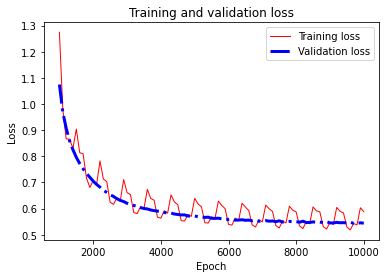

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58839595, Final Validation loss: 0.5444833, Training RMSE: 0.7320669, Validation RMSE: 0.73789114
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.145855, Validation loss: 2.3748238, 
Epoch: 2000, Training loss: 1.4387472, Validation loss: 1.4885193, 
Epoch: 3000, Training loss: 1.1544459, Validation loss: 1.0955231, 
Epoch: 4000, Training loss: 0.7344091, Validation loss: 0.8762224, 
Epoch: 5000, Training loss: 0.86797434, Validation loss: 0.7439351, 
Epoch: 6000, Training loss: 0.6298072, Validation loss: 0.6656404, 
Epoch: 7000, Training loss: 0.61911315, Validation loss: 0.6146928, 
Epoch: 8000, Training loss: 0.6130254, Validation loss: 0.5903153, 
Epoch: 9000, Training loss: 0.5916116, Validation loss: 0.5748799, 
Epoch: 10000, Training loss:

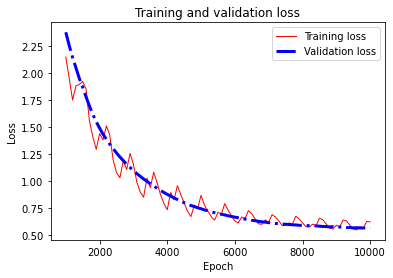

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.62166566, Final Validation loss: 0.5609058, Training RMSE: 0.7517508, Validation RMSE: 0.7489365
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 5.9005294, Validation loss: 6.0397816, 
Epoch: 2000, Training loss: 2.016928, Validation loss: 2.443858, 
Epoch: 3000, Training loss: 1.4964479, Validation loss: 1.5063415, 
Epoch: 4000, Training loss: 0.9383562, Validation loss: 1.133901, 
Epoch: 5000, Training loss: 1.2200147, Validation loss: 0.9171472, 
Epoch: 6000, Training loss: 0.83431727, Validation loss: 0.7844938, 
Epoch: 7000, Training loss: 0.70253366, Validation loss: 0.71293753, 
Epoch: 8000, Training loss: 0.6929908, Validation loss: 0.66257423, 
Epoch: 9000, Training loss: 0.583538, Validation loss: 0.6404841, 
Epoch: 10000, Training loss: 0

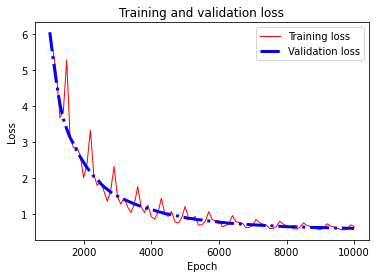

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6638763, Final Validation loss: 0.6087336, Training RMSE: 0.7765246, Validation RMSE: 0.78021383
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.5357935, Validation loss: 2.56089, 
Epoch: 2000, Training loss: 1.242757, Validation loss: 1.1725622, 
Epoch: 3000, Training loss: 0.8312587, Validation loss: 0.8189061, 
Epoch: 4000, Training loss: 0.6352545, Validation loss: 0.67934614, 
Epoch: 5000, Training loss: 0.7204755, Validation loss: 0.62833303, 
Epoch: 6000, Training loss: 0.53380007, Validation loss: 0.5943597, 
Epoch: 7000, Training loss: 0.5760457, Validation loss: 0.56504816, 
Epoch: 8000, Training loss: 0.6158619, Validation loss: 0.55576676, 
Epoch: 9000, Training loss: 0.5397376, Validation loss: 0.5477013, 
Epoch: 10000, Training loss:

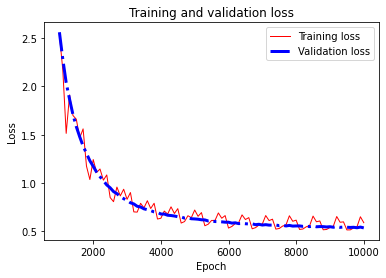

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5895254, Final Validation loss: 0.53562194, Training RMSE: 0.7384597, Validation RMSE: 0.73186195
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 8.8472595, Validation loss: 9.903887, 
Epoch: 2000, Training loss: 2.0132434, Validation loss: 2.4347885, 
Epoch: 3000, Training loss: 1.3839037, Validation loss: 1.3201334, 
Epoch: 4000, Training loss: 0.8390886, Validation loss: 0.9757535, 
Epoch: 5000, Training loss: 0.8407719, Validation loss: 0.8388299, 
Epoch: 6000, Training loss: 0.71473527, Validation loss: 0.74824095, 
Epoch: 7000, Training loss: 0.67171484, Validation loss: 0.6821719, 
Epoch: 8000, Training loss: 0.6907378, Validation loss: 0.6391721, 
Epoch: 9000, Training loss: 0.60390496, Validation loss: 0.6136042, 
Epoch: 10000, Training los

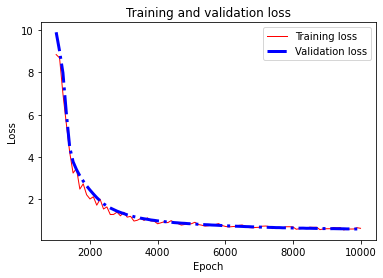

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.62435424, Final Validation loss: 0.5908984, Training RMSE: 0.7663632, Validation RMSE: 0.76869917
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 4.325884, Validation loss: 4.6216364, 
Epoch: 2000, Training loss: 2.0183313, Validation loss: 2.2544272, 
Epoch: 3000, Training loss: 1.5430393, Validation loss: 1.5862978, 
Epoch: 4000, Training loss: 1.0764595, Validation loss: 1.2324718, 
Epoch: 5000, Training loss: 1.0849481, Validation loss: 0.998514, 
Epoch: 6000, Training loss: 0.7343591, Validation loss: 0.79181755, 
Epoch: 7000, Training loss: 0.6807114, Validation loss: 0.6838386, 
Epoch: 8000, Training loss: 0.67144066, Validation loss: 0.6344609, 
Epoch: 9000, Training loss: 0.56451344, Validation loss: 0.6075197, 
Epoch: 10000, Training loss

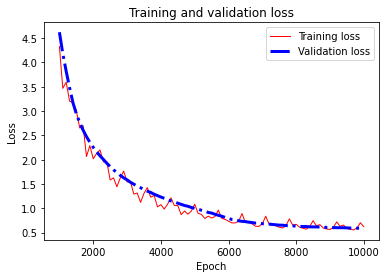

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6241439, Final Validation loss: 0.5898857, Training RMSE: 0.7714444, Validation RMSE: 0.7680402
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7479862 

Average Validation RMSE for the 10 folds: 0.748 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.70533395, Validation loss: 0.73214567, 
Epoch: 2000, Training loss: 0.62993103, Validation loss: 0.6102232, 
Epoch: 3000, Training loss: 0.5839077, Validation loss: 0.58056045, 
Epoch: 4000, Training loss: 0.5847279, Validation loss: 0.56381905, 
Epoch: 5000, Train

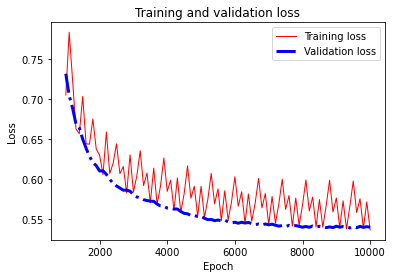

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5364075, Final Validation loss: 0.5398491, Training RMSE: 0.7317805, Validation RMSE: 0.73474425
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7351936, Validation loss: 0.7442128, 
Epoch: 2000, Training loss: 0.63987666, Validation loss: 0.605861, 
Epoch: 3000, Training loss: 0.5778957, Validation loss: 0.5766727, 
Epoch: 4000, Training loss: 0.5895451, Validation loss: 0.56419784, 
Epoch: 5000, Training loss: 0.5961924, Validation loss: 0.558014, 
Epoch: 6000, Training loss: 0.6098741, Validation loss: 0.55163455, 
Epoch: 7000, Training loss: 0.54980403, Validation loss: 0.54900765, 
Epoch: 8000, Training loss: 0.57499766, Validation loss: 0.5462331, 
Epoch: 9000, Training loss: 0.5748704, Validation loss: 0.54323095, 
Epoch: 10000, Trainin

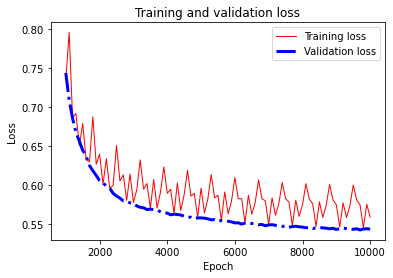

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55894756, Final Validation loss: 0.54361826, Training RMSE: 0.737398, Validation RMSE: 0.73730475
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.9245023, Validation loss: 0.87951654, 
Epoch: 2000, Training loss: 0.6077126, Validation loss: 0.5947186, 
Epoch: 3000, Training loss: 0.55737936, Validation loss: 0.56568485, 
Epoch: 4000, Training loss: 0.58172536, Validation loss: 0.55258894, 
Epoch: 5000, Training loss: 0.58033705, Validation loss: 0.5463636, 
Epoch: 6000, Training loss: 0.59704196, Validation loss: 0.54107785, 
Epoch: 7000, Training loss: 0.54032, Validation loss: 0.5383335, 
Epoch: 8000, Training loss: 0.578833, Validation loss: 0.53633535, 
Epoch: 9000, Training loss: 0.5557449, Validation loss: 0.53648174, 
Epoch: 10000, Trai

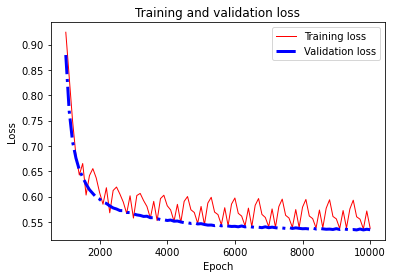

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5374118, Final Validation loss: 0.5343815, Training RMSE: 0.73162544, Validation RMSE: 0.731014
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7314869, Validation loss: 0.75572085, 
Epoch: 2000, Training loss: 0.6020765, Validation loss: 0.62393665, 
Epoch: 3000, Training loss: 0.57314986, Validation loss: 0.5881121, 
Epoch: 4000, Training loss: 0.58508664, Validation loss: 0.5754093, 
Epoch: 5000, Training loss: 0.60065067, Validation loss: 0.57120484, 
Epoch: 6000, Training loss: 0.60341775, Validation loss: 0.56490004, 
Epoch: 7000, Training loss: 0.5482333, Validation loss: 0.56291837, 
Epoch: 8000, Training loss: 0.57419103, Validation loss: 0.55857, 
Epoch: 9000, Training loss: 0.5699706, Validation loss: 0.5591681, 
Epoch: 10000, Train

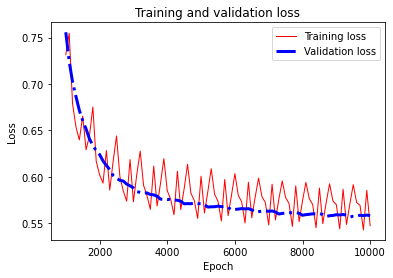

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54730725, Final Validation loss: 0.55815643, Training RMSE: 0.7360761, Validation RMSE: 0.7470987
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6833071, Validation loss: 0.677088, 
Epoch: 2000, Training loss: 0.6245839, Validation loss: 0.58346874, 
Epoch: 3000, Training loss: 0.5714396, Validation loss: 0.565705, 
Epoch: 4000, Training loss: 0.5784605, Validation loss: 0.55990213, 
Epoch: 5000, Training loss: 0.584477, Validation loss: 0.5546987, 
Epoch: 6000, Training loss: 0.60325277, Validation loss: 0.5521335, 
Epoch: 7000, Training loss: 0.54761225, Validation loss: 0.54936355, 
Epoch: 8000, Training loss: 0.57412744, Validation loss: 0.5464275, 
Epoch: 9000, Training loss: 0.5818835, Validation loss: 0.5457968, 
Epoch: 10000, Training

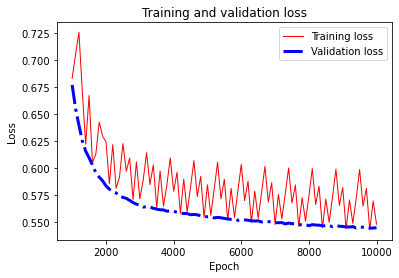

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54785585, Final Validation loss: 0.5445958, Training RMSE: 0.7352695, Validation RMSE: 0.7379673
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8899759, Validation loss: 0.8451694, 
Epoch: 2000, Training loss: 0.6618112, Validation loss: 0.62149066, 
Epoch: 3000, Training loss: 0.5901883, Validation loss: 0.57092553, 
Epoch: 4000, Training loss: 0.59982014, Validation loss: 0.555809, 
Epoch: 5000, Training loss: 0.59400964, Validation loss: 0.5482092, 
Epoch: 6000, Training loss: 0.600971, Validation loss: 0.54357255, 
Epoch: 7000, Training loss: 0.5525982, Validation loss: 0.5415175, 
Epoch: 8000, Training loss: 0.5787674, Validation loss: 0.5382078, 
Epoch: 9000, Training loss: 0.5757446, Validation loss: 0.5380337, 
Epoch: 10000, Training 

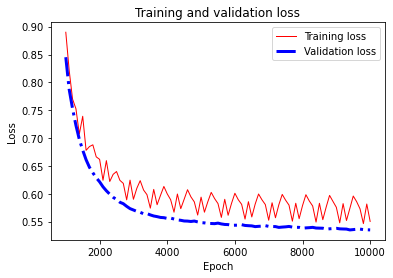

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55038357, Final Validation loss: 0.5351716, Training RMSE: 0.7398607, Validation RMSE: 0.73155427
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6478233, Validation loss: 0.6122118, 
Epoch: 2000, Training loss: 0.61699826, Validation loss: 0.57488775, 
Epoch: 3000, Training loss: 0.5665922, Validation loss: 0.5581137, 
Epoch: 4000, Training loss: 0.5811441, Validation loss: 0.55131745, 
Epoch: 5000, Training loss: 0.5876595, Validation loss: 0.5464717, 
Epoch: 6000, Training loss: 0.5989748, Validation loss: 0.5450203, 
Epoch: 7000, Training loss: 0.5418195, Validation loss: 0.5385704, 
Epoch: 8000, Training loss: 0.57221806, Validation loss: 0.5378667, 
Epoch: 9000, Training loss: 0.5647231, Validation loss: 0.5365311, 
Epoch: 10000, Trainin

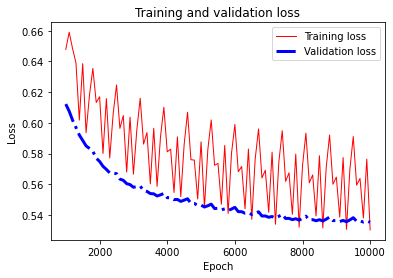

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5303312, Final Validation loss: 0.5353438, Training RMSE: 0.73278135, Validation RMSE: 0.7316719
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.661495, Validation loss: 0.6459046, 
Epoch: 2000, Training loss: 0.6164938, Validation loss: 0.5889622, 
Epoch: 3000, Training loss: 0.54941636, Validation loss: 0.56863564, 
Epoch: 4000, Training loss: 0.58420384, Validation loss: 0.5549409, 
Epoch: 5000, Training loss: 0.59788126, Validation loss: 0.54416144, 
Epoch: 6000, Training loss: 0.5999171, Validation loss: 0.54532087, 
Epoch: 7000, Training loss: 0.54645, Validation loss: 0.53960663, 
Epoch: 8000, Training loss: 0.5742635, Validation loss: 0.5389491, 
Epoch: 9000, Training loss: 0.568042, Validation loss: 0.5364413, 
Epoch: 10000, Training 

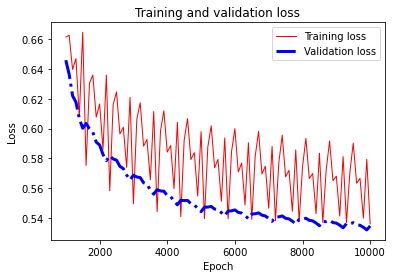

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5359474, Final Validation loss: 0.534554, Training RMSE: 0.7343408, Validation RMSE: 0.73113203
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.72209024, Validation loss: 0.70685744, 
Epoch: 2000, Training loss: 0.61111885, Validation loss: 0.58337533, 
Epoch: 3000, Training loss: 0.5494512, Validation loss: 0.5579122, 
Epoch: 4000, Training loss: 0.5780792, Validation loss: 0.5507354, 
Epoch: 5000, Training loss: 0.58081883, Validation loss: 0.5482078, 
Epoch: 6000, Training loss: 0.59421223, Validation loss: 0.5488985, 
Epoch: 7000, Training loss: 0.54610366, Validation loss: 0.5431546, 
Epoch: 8000, Training loss: 0.56861925, Validation loss: 0.5438059, 
Epoch: 9000, Training loss: 0.57039344, Validation loss: 0.54315716, 
Epoch: 10000, Tra

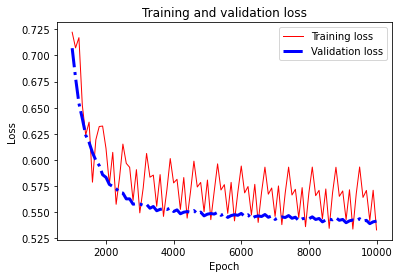

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53315026, Final Validation loss: 0.54160017, Training RMSE: 0.7346456, Validation RMSE: 0.7359349
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.69627297, Validation loss: 0.69901896, 
Epoch: 2000, Training loss: 0.612503, Validation loss: 0.5863217, 
Epoch: 3000, Training loss: 0.5727463, Validation loss: 0.5667818, 
Epoch: 4000, Training loss: 0.583246, Validation loss: 0.5606211, 
Epoch: 5000, Training loss: 0.5973054, Validation loss: 0.55777586, 
Epoch: 6000, Training loss: 0.59600514, Validation loss: 0.55667394, 
Epoch: 7000, Training loss: 0.5528902, Validation loss: 0.5516937, 
Epoch: 8000, Training loss: 0.57888526, Validation loss: 0.5524211, 
Epoch: 9000, Training loss: 0.5797812, Validation loss: 0.5540119, 
Epoch: 10000, Traini

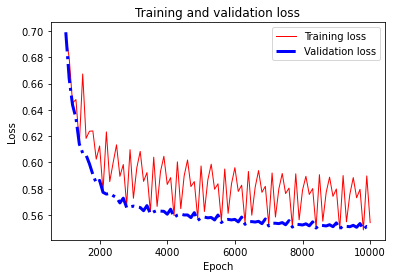

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55420506, Final Validation loss: 0.55085367, Training RMSE: 0.7399565, Validation RMSE: 0.7421952
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.74701595 

Average Validation RMSE for the 10 folds: 0.7470817 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6774932, Validation loss: 0.63725334, 
Epoch: 2000, Training loss: 0.6022196, Validation loss: 0.58229816, 
Epoch: 3000, Training loss: 0.5754778, Validation loss: 0.55965525, 
Epoch: 4000, Training loss: 0.5781914, Validation loss: 0.55017006, 
Epoch: 5

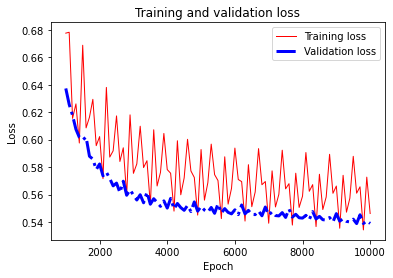

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54623044, Final Validation loss: 0.539025, Training RMSE: 0.7283299, Validation RMSE: 0.73418325
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6379061, Validation loss: 0.618792, 
Epoch: 2000, Training loss: 0.58333695, Validation loss: 0.5593821, 
Epoch: 3000, Training loss: 0.5572146, Validation loss: 0.54523534, 
Epoch: 4000, Training loss: 0.57750213, Validation loss: 0.5380418, 
Epoch: 5000, Training loss: 0.5867309, Validation loss: 0.5339545, 
Epoch: 6000, Training loss: 0.59232485, Validation loss: 0.5303832, 
Epoch: 7000, Training loss: 0.5397635, Validation loss: 0.52860045, 
Epoch: 8000, Training loss: 0.56129366, Validation loss: 0.52676815, 
Epoch: 9000, Training loss: 0.5601395, Validation loss: 0.5254273, 
Epoch: 10000, Traini

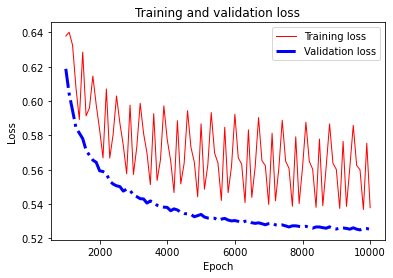

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5378688, Final Validation loss: 0.52521676, Training RMSE: 0.7323411, Validation RMSE: 0.7247184
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6957807, Validation loss: 0.63924116, 
Epoch: 2000, Training loss: 0.6139879, Validation loss: 0.5758111, 
Epoch: 3000, Training loss: 0.56522316, Validation loss: 0.5599766, 
Epoch: 4000, Training loss: 0.5764257, Validation loss: 0.54616106, 
Epoch: 5000, Training loss: 0.5888221, Validation loss: 0.5469304, 
Epoch: 6000, Training loss: 0.58771336, Validation loss: 0.5429035, 
Epoch: 7000, Training loss: 0.5439906, Validation loss: 0.5392754, 
Epoch: 8000, Training loss: 0.5741894, Validation loss: 0.5399046, 
Epoch: 9000, Training loss: 0.58104396, Validation loss: 0.5447004, 
Epoch: 10000, Trainin

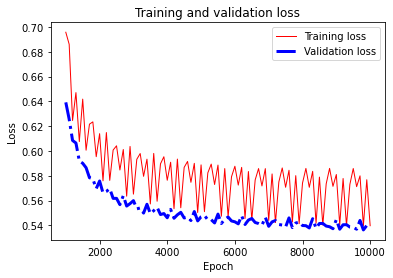

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53977144, Final Validation loss: 0.53954345, Training RMSE: 0.73398066, Validation RMSE: 0.73453623
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.63179266, Validation loss: 0.6269011, 
Epoch: 2000, Training loss: 0.5960885, Validation loss: 0.5815614, 
Epoch: 3000, Training loss: 0.534633, Validation loss: 0.5618499, 
Epoch: 4000, Training loss: 0.57530946, Validation loss: 0.5551985, 
Epoch: 5000, Training loss: 0.59227073, Validation loss: 0.5556888, 
Epoch: 6000, Training loss: 0.59579486, Validation loss: 0.5512646, 
Epoch: 7000, Training loss: 0.538168, Validation loss: 0.5488599, 
Epoch: 8000, Training loss: 0.5640402, Validation loss: 0.544824, 
Epoch: 9000, Training loss: 0.5620265, Validation loss: 0.54971313, 
Epoch: 10000, Trainin

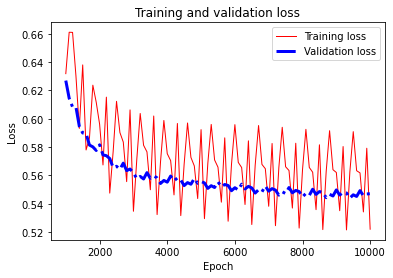

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5219759, Final Validation loss: 0.5470194, Training RMSE: 0.7303093, Validation RMSE: 0.73960763
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.79297787, Validation loss: 0.75774425, 
Epoch: 2000, Training loss: 0.6243258, Validation loss: 0.6137316, 
Epoch: 3000, Training loss: 0.581676, Validation loss: 0.5803043, 
Epoch: 4000, Training loss: 0.5896025, Validation loss: 0.5822626, 
Epoch: 5000, Training loss: 0.5922282, Validation loss: 0.56383085, 
Epoch: 6000, Training loss: 0.6360204, Validation loss: 0.5789167, 
Epoch: 7000, Training loss: 0.57165146, Validation loss: 0.5691262, 
Epoch: 8000, Training loss: 0.59979904, Validation loss: 0.55637527, 
Epoch: 9000, Training loss: 0.56780314, Validation loss: 0.5564296, 
Epoch: 10000, Traini

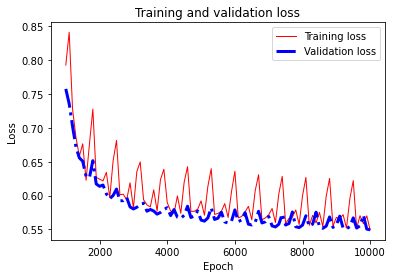

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5493073, Final Validation loss: 0.54944336, Training RMSE: 0.73509145, Validation RMSE: 0.7412445
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6631227, Validation loss: 0.61703277, 
Epoch: 2000, Training loss: 0.5922692, Validation loss: 0.57220584, 
Epoch: 3000, Training loss: 0.54913753, Validation loss: 0.56158495, 
Epoch: 4000, Training loss: 0.58235884, Validation loss: 0.55525935, 
Epoch: 5000, Training loss: 0.5757866, Validation loss: 0.55209714, 
Epoch: 6000, Training loss: 0.6087472, Validation loss: 0.552258, 
Epoch: 7000, Training loss: 0.54511297, Validation loss: 0.5445123, 
Epoch: 8000, Training loss: 0.59032935, Validation loss: 0.5403745, 
Epoch: 9000, Training loss: 0.5669902, Validation loss: 0.5383262, 
Epoch: 10000, Tra

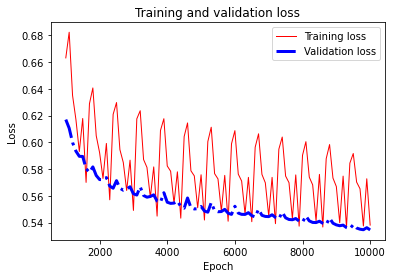

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53817225, Final Validation loss: 0.53457063, Training RMSE: 0.7327856, Validation RMSE: 0.73114336
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.73827696, Validation loss: 0.7372578, 
Epoch: 2000, Training loss: 0.60904753, Validation loss: 0.5724384, 
Epoch: 3000, Training loss: 0.537894, Validation loss: 0.55102974, 
Epoch: 4000, Training loss: 0.57251656, Validation loss: 0.543487, 
Epoch: 5000, Training loss: 0.58004797, Validation loss: 0.5409593, 
Epoch: 6000, Training loss: 0.5912294, Validation loss: 0.5424168, 
Epoch: 7000, Training loss: 0.5348403, Validation loss: 0.53382194, 
Epoch: 8000, Training loss: 0.5697265, Validation loss: 0.5339645, 
Epoch: 9000, Training loss: 0.5598422, Validation loss: 0.53092825, 
Epoch: 10000, Train

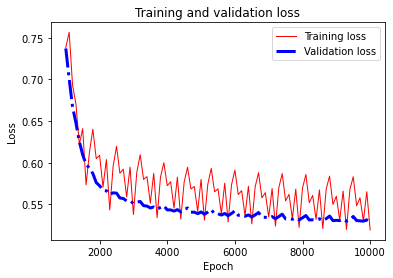

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5194154, Final Validation loss: 0.52900517, Training RMSE: 0.72684157, Validation RMSE: 0.7273274
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8336799, Validation loss: 0.7992943, 
Epoch: 2000, Training loss: 0.6953787, Validation loss: 0.6099466, 
Epoch: 3000, Training loss: 0.57741773, Validation loss: 0.56864107, 
Epoch: 4000, Training loss: 0.59446967, Validation loss: 0.5579972, 
Epoch: 5000, Training loss: 0.60095584, Validation loss: 0.54457766, 
Epoch: 6000, Training loss: 0.6048662, Validation loss: 0.54388434, 
Epoch: 7000, Training loss: 0.55221945, Validation loss: 0.53395677, 
Epoch: 8000, Training loss: 0.5923676, Validation loss: 0.5357, 
Epoch: 9000, Training loss: 0.61232096, Validation loss: 0.54541385, 
Epoch: 10000, Trai

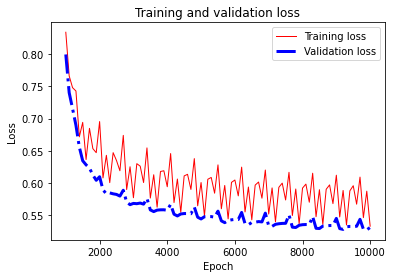

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.533393, Final Validation loss: 0.53151417, Training RMSE: 0.7379088, Validation RMSE: 0.72905016
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6714698, Validation loss: 0.6983905, 
Epoch: 2000, Training loss: 0.6105991, Validation loss: 0.5942936, 
Epoch: 3000, Training loss: 0.5506167, Validation loss: 0.56982714, 
Epoch: 4000, Training loss: 0.58293617, Validation loss: 0.558208, 
Epoch: 5000, Training loss: 0.60632336, Validation loss: 0.5695713, 
Epoch: 6000, Training loss: 0.61534816, Validation loss: 0.5585397, 
Epoch: 7000, Training loss: 0.5427519, Validation loss: 0.5429649, 
Epoch: 8000, Training loss: 0.5734327, Validation loss: 0.54788923, 
Epoch: 9000, Training loss: 0.569661, Validation loss: 0.55312186, 
Epoch: 10000, Training

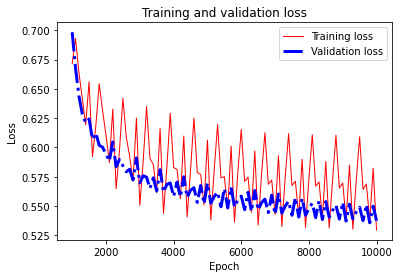

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.529622, Final Validation loss: 0.5374797, Training RMSE: 0.7310724, Validation RMSE: 0.7331301
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7200892, Validation loss: 0.64506376, 
Epoch: 2000, Training loss: 0.6092867, Validation loss: 0.5787832, 
Epoch: 3000, Training loss: 0.57683426, Validation loss: 0.56980366, 
Epoch: 4000, Training loss: 0.5874481, Validation loss: 0.5531633, 
Epoch: 5000, Training loss: 0.60176986, Validation loss: 0.56888, 
Epoch: 6000, Training loss: 0.6215722, Validation loss: 0.5514613, 
Epoch: 7000, Training loss: 0.54532593, Validation loss: 0.5413019, 
Epoch: 8000, Training loss: 0.5721544, Validation loss: 0.5503144, 
Epoch: 9000, Training loss: 0.5867301, Validation loss: 0.5622425, 
Epoch: 10000, Training l

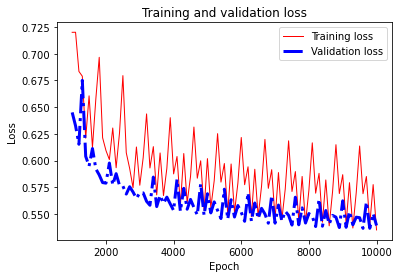

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5349721, Final Validation loss: 0.53911746, Training RMSE: 0.73390514, Validation RMSE: 0.7342462
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7459618 

Average Validation RMSE for the 10 folds: 0.74607 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6727611, Validation loss: 0.647537, 
Epoch: 2000, Training loss: 0.612177, Validation loss: 0.5849652, 
Epoch: 3000, Training loss: 0.54759586, Validation loss: 0.56540996, 
Epoch: 4000, Training loss: 0.5640823, Validation loss: 0.55317163, 
Epoch: 5000, T

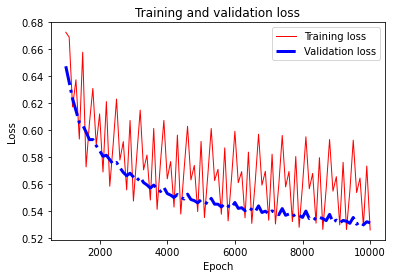

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5261741, Final Validation loss: 0.5313936, Training RMSE: 0.7271319, Validation RMSE: 0.7289675
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.62397414, Validation loss: 0.5985736, 
Epoch: 2000, Training loss: 0.6034441, Validation loss: 0.56746656, 
Epoch: 3000, Training loss: 0.5551344, Validation loss: 0.55718434, 
Epoch: 4000, Training loss: 0.5655652, Validation loss: 0.5461815, 
Epoch: 5000, Training loss: 0.5779616, Validation loss: 0.54220796, 
Epoch: 6000, Training loss: 0.59833825, Validation loss: 0.53610504, 
Epoch: 7000, Training loss: 0.536721, Validation loss: 0.5315402, 
Epoch: 8000, Training loss: 0.56854165, Validation loss: 0.52685934, 
Epoch: 9000, Training loss: 0.5563129, Validation loss: 0.5256444, 
Epoch: 10000, Traini

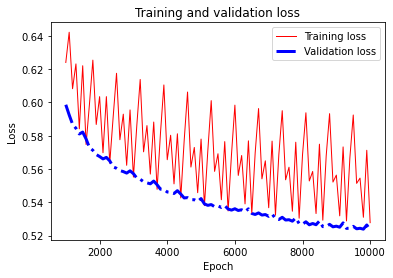

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5277624, Final Validation loss: 0.52339697, Training RMSE: 0.7280289, Validation RMSE: 0.7234618
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.63056576, Validation loss: 0.595102, 
Epoch: 2000, Training loss: 0.5729382, Validation loss: 0.555249, 
Epoch: 3000, Training loss: 0.541135, Validation loss: 0.54168457, 
Epoch: 4000, Training loss: 0.5550435, Validation loss: 0.53505504, 
Epoch: 5000, Training loss: 0.58321226, Validation loss: 0.532904, 
Epoch: 6000, Training loss: 0.5834345, Validation loss: 0.5311685, 
Epoch: 7000, Training loss: 0.5359185, Validation loss: 0.5291007, 
Epoch: 8000, Training loss: 0.5687612, Validation loss: 0.52736974, 
Epoch: 9000, Training loss: 0.5518112, Validation loss: 0.5291599, 
Epoch: 10000, Training lo

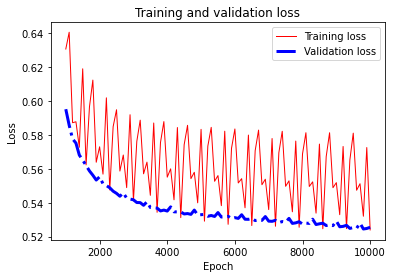

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5239331, Final Validation loss: 0.52549195, Training RMSE: 0.729731, Validation RMSE: 0.72490823
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.71603787, Validation loss: 0.65442824, 
Epoch: 2000, Training loss: 0.57282966, Validation loss: 0.5827045, 
Epoch: 3000, Training loss: 0.553736, Validation loss: 0.5664569, 
Epoch: 4000, Training loss: 0.5760567, Validation loss: 0.56391764, 
Epoch: 5000, Training loss: 0.5904478, Validation loss: 0.5688349, 
Epoch: 6000, Training loss: 0.60060537, Validation loss: 0.55276716, 
Epoch: 7000, Training loss: 0.53739387, Validation loss: 0.55076796, 
Epoch: 8000, Training loss: 0.5709732, Validation loss: 0.5442549, 
Epoch: 9000, Training loss: 0.55282, Validation loss: 0.54497397, 
Epoch: 10000, Traini

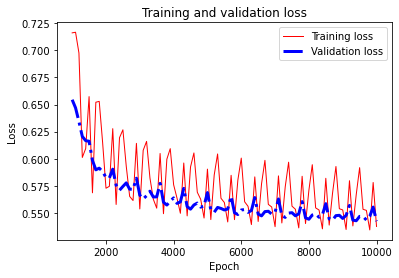

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5375899, Final Validation loss: 0.5424687, Training RMSE: 0.7269658, Validation RMSE: 0.73652476
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.61577797, Validation loss: 0.5916578, 
Epoch: 2000, Training loss: 0.58056927, Validation loss: 0.5639646, 
Epoch: 3000, Training loss: 0.5309941, Validation loss: 0.5474093, 
Epoch: 4000, Training loss: 0.57056314, Validation loss: 0.5448341, 
Epoch: 5000, Training loss: 0.5824163, Validation loss: 0.5444545, 
Epoch: 6000, Training loss: 0.6014161, Validation loss: 0.54226047, 
Epoch: 7000, Training loss: 0.53106576, Validation loss: 0.53487086, 
Epoch: 8000, Training loss: 0.55757904, Validation loss: 0.5328108, 
Epoch: 9000, Training loss: 0.55011606, Validation loss: 0.5365068, 
Epoch: 10000, Trai

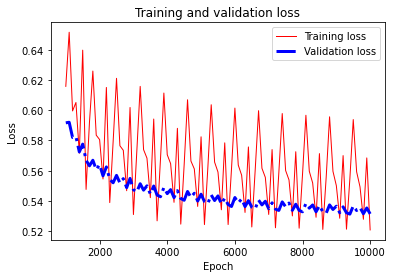

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52083635, Final Validation loss: 0.5314396, Training RMSE: 0.72524595, Validation RMSE: 0.728999
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.624987, Validation loss: 0.6078033, 
Epoch: 2000, Training loss: 0.592823, Validation loss: 0.5685667, 
Epoch: 3000, Training loss: 0.57125705, Validation loss: 0.5467437, 
Epoch: 4000, Training loss: 0.5775182, Validation loss: 0.541802, 
Epoch: 5000, Training loss: 0.58341825, Validation loss: 0.541985, 
Epoch: 6000, Training loss: 0.60822594, Validation loss: 0.5417863, 
Epoch: 7000, Training loss: 0.5367139, Validation loss: 0.53110695, 
Epoch: 8000, Training loss: 0.569936, Validation loss: 0.5322515, 
Epoch: 9000, Training loss: 0.57942927, Validation loss: 0.5365289, 
Epoch: 10000, Training los

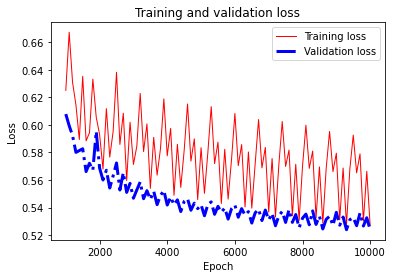

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.526862, Final Validation loss: 0.523752, Training RMSE: 0.7275015, Validation RMSE: 0.7237071
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.5500263, Validation loss: 1.6244991, 
Epoch: 2000, Training loss: 0.85713744, Validation loss: 0.8955524, 
Epoch: 3000, Training loss: 0.8130098, Validation loss: 0.80003554, 
Epoch: 4000, Training loss: 0.7887118, Validation loss: 0.7021093, 
Epoch: 5000, Training loss: 0.82733357, Validation loss: 0.7512198, 
Epoch: 6000, Training loss: 0.7323281, Validation loss: 0.6425235, 
Epoch: 7000, Training loss: 0.7366603, Validation loss: 0.69736814, 
Epoch: 8000, Training loss: 0.6443424, Validation loss: 0.6166425, 
Epoch: 9000, Training loss: 0.61774194, Validation loss: 0.62312746, 
Epoch: 10000, Training 

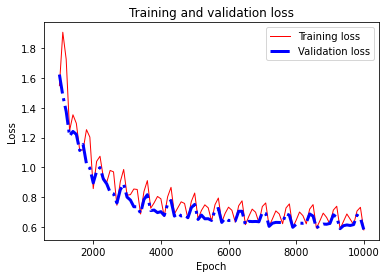

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5793298, Final Validation loss: 0.5820087, Training RMSE: 0.7707172, Validation RMSE: 0.762895
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6134522, Validation loss: 0.5838038, 
Epoch: 2000, Training loss: 0.57679987, Validation loss: 0.554475, 
Epoch: 3000, Training loss: 0.5428292, Validation loss: 0.54040104, 
Epoch: 4000, Training loss: 0.56607866, Validation loss: 0.53521496, 
Epoch: 5000, Training loss: 0.5751648, Validation loss: 0.5318109, 
Epoch: 6000, Training loss: 0.57919, Validation loss: 0.5365169, 
Epoch: 7000, Training loss: 0.5316747, Validation loss: 0.5267554, 
Epoch: 8000, Training loss: 0.55325484, Validation loss: 0.5274706, 
Epoch: 9000, Training loss: 0.55239445, Validation loss: 0.5263814, 
Epoch: 10000, Training lo

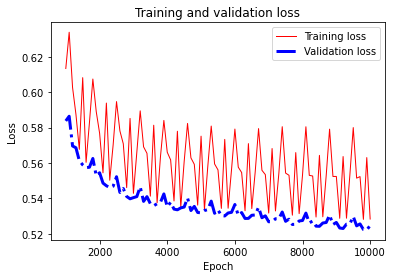

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52829915, Final Validation loss: 0.5246514, Training RMSE: 0.7283003, Validation RMSE: 0.7243282
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.62663555, Validation loss: 0.62033087, 
Epoch: 2000, Training loss: 0.60082847, Validation loss: 0.56873214, 
Epoch: 3000, Training loss: 0.56599325, Validation loss: 0.5570696, 
Epoch: 4000, Training loss: 0.56902516, Validation loss: 0.5484584, 
Epoch: 5000, Training loss: 0.5917668, Validation loss: 0.5477809, 
Epoch: 6000, Training loss: 0.60887253, Validation loss: 0.551262, 
Epoch: 7000, Training loss: 0.5398088, Validation loss: 0.5347018, 
Epoch: 8000, Training loss: 0.572423, Validation loss: 0.53785443, 
Epoch: 9000, Training loss: 0.5708721, Validation loss: 0.5309569, 
Epoch: 10000, Traini

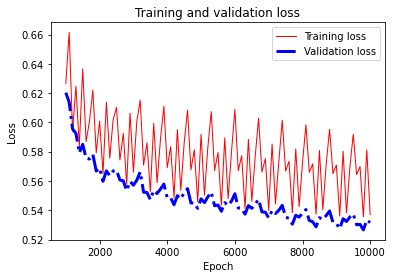

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53696215, Final Validation loss: 0.5315912, Training RMSE: 0.7309477, Validation RMSE: 0.72910297
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6130549, Validation loss: 0.6001202, 
Epoch: 2000, Training loss: 0.60547876, Validation loss: 0.5642973, 
Epoch: 3000, Training loss: 0.5532554, Validation loss: 0.54472077, 
Epoch: 4000, Training loss: 0.57214123, Validation loss: 0.54040277, 
Epoch: 5000, Training loss: 0.5867251, Validation loss: 0.5389066, 
Epoch: 6000, Training loss: 0.5782428, Validation loss: 0.5363991, 
Epoch: 7000, Training loss: 0.5370573, Validation loss: 0.53126174, 
Epoch: 8000, Training loss: 0.56152225, Validation loss: 0.5321976, 
Epoch: 9000, Training loss: 0.5719079, Validation loss: 0.53305596, 
Epoch: 10000, Tra

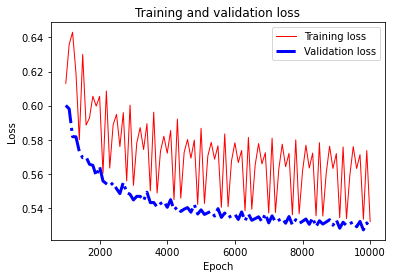

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5320935, Final Validation loss: 0.5278148, Training RMSE: 0.7279454, Validation RMSE: 0.7265086
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7450478 

Average Validation RMSE for the 10 folds: 0.74506134 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.571217, Validation loss: 1.557833, 
Epoch: 2000, Training loss: 0.9205901, Validation loss: 0.90784955, 
Epoch: 3000, Training loss: 0.69421494, Validation loss: 0.7195763, 
Epoch: 4000, Training loss: 0.680518, Validation loss: 0.6481697, 
Epoch: 5000, Train

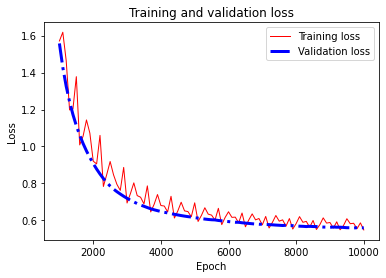

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54849094, Final Validation loss: 0.5598852, Training RMSE: 0.74412215, Validation RMSE: 0.7482548
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.5258574, Validation loss: 1.6853611, 
Epoch: 2000, Training loss: 0.8780333, Validation loss: 0.9139499, 
Epoch: 3000, Training loss: 0.6932945, Validation loss: 0.70929295, 
Epoch: 4000, Training loss: 0.6705452, Validation loss: 0.62334305, 
Epoch: 5000, Training loss: 0.6700566, Validation loss: 0.5902101, 
Epoch: 6000, Training loss: 0.607934, Validation loss: 0.57261574, 
Epoch: 7000, Training loss: 0.57160413, Validation loss: 0.56474113, 
Epoch: 8000, Training loss: 0.6014034, Validation loss: 0.5554558, 
Epoch: 9000, Training loss: 0.58064646, Validation loss: 0.55049837, 
Epoch: 10000, Training

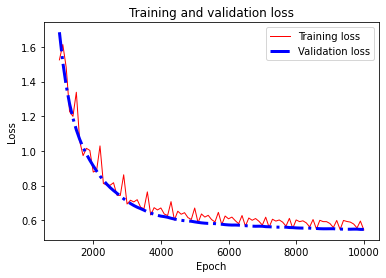

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54372746, Final Validation loss: 0.54656917, Training RMSE: 0.74486995, Validation RMSE: 0.7393032
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.82383496, Validation loss: 0.8073999, 
Epoch: 2000, Training loss: 0.6490896, Validation loss: 0.6605218, 
Epoch: 3000, Training loss: 0.5962226, Validation loss: 0.6107222, 
Epoch: 4000, Training loss: 0.59581393, Validation loss: 0.5800493, 
Epoch: 5000, Training loss: 0.61384153, Validation loss: 0.56468374, 
Epoch: 6000, Training loss: 0.60182804, Validation loss: 0.5581646, 
Epoch: 7000, Training loss: 0.55456686, Validation loss: 0.5541131, 
Epoch: 8000, Training loss: 0.5826553, Validation loss: 0.5499296, 
Epoch: 9000, Training loss: 0.5756956, Validation loss: 0.5473291, 
Epoch: 10000, Trainin

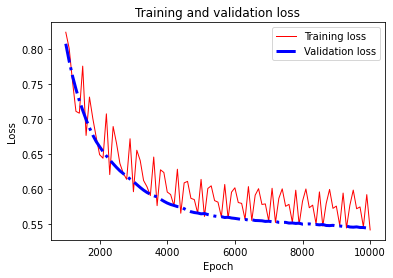

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5417145, Final Validation loss: 0.544724, Training RMSE: 0.73806345, Validation RMSE: 0.7380542
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.6909633, Validation loss: 1.6351657, 
Epoch: 2000, Training loss: 0.9500617, Validation loss: 0.9089443, 
Epoch: 3000, Training loss: 0.69598544, Validation loss: 0.7338102, 
Epoch: 4000, Training loss: 0.67459774, Validation loss: 0.66040725, 
Epoch: 5000, Training loss: 0.66906893, Validation loss: 0.6222736, 
Epoch: 6000, Training loss: 0.6227902, Validation loss: 0.6015685, 
Epoch: 7000, Training loss: 0.5722972, Validation loss: 0.5945271, 
Epoch: 8000, Training loss: 0.59102726, Validation loss: 0.5812826, 
Epoch: 9000, Training loss: 0.5861404, Validation loss: 0.57940865, 
Epoch: 10000, Training l

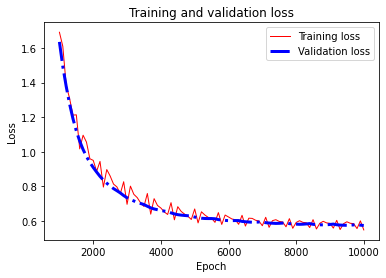

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54796094, Final Validation loss: 0.57360786, Training RMSE: 0.74326617, Validation RMSE: 0.75736904
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.3664343, Validation loss: 1.3460184, 
Epoch: 2000, Training loss: 0.78201133, Validation loss: 0.763906, 
Epoch: 3000, Training loss: 0.64962447, Validation loss: 0.67315704, 
Epoch: 4000, Training loss: 0.6482737, Validation loss: 0.6253526, 
Epoch: 5000, Training loss: 0.64611644, Validation loss: 0.5950604, 
Epoch: 6000, Training loss: 0.628999, Validation loss: 0.57962203, 
Epoch: 7000, Training loss: 0.5695218, Validation loss: 0.5685648, 
Epoch: 8000, Training loss: 0.5930082, Validation loss: 0.56179625, 
Epoch: 9000, Training loss: 0.58028924, Validation loss: 0.5595955, 
Epoch: 10000, Trainin

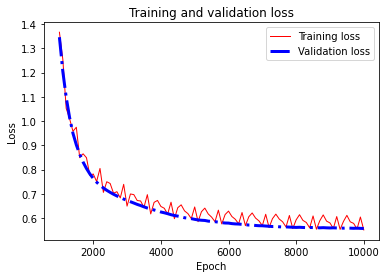

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55148304, Final Validation loss: 0.55734324, Training RMSE: 0.7437512, Validation RMSE: 0.74655426
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.5466208, Validation loss: 1.7818245, 
Epoch: 2000, Training loss: 1.0374357, Validation loss: 0.91831523, 
Epoch: 3000, Training loss: 0.7087072, Validation loss: 0.71223027, 
Epoch: 4000, Training loss: 0.6706864, Validation loss: 0.64095926, 
Epoch: 5000, Training loss: 0.6663386, Validation loss: 0.6053335, 
Epoch: 6000, Training loss: 0.6346381, Validation loss: 0.58499926, 
Epoch: 7000, Training loss: 0.57425576, Validation loss: 0.56428486, 
Epoch: 8000, Training loss: 0.5821178, Validation loss: 0.5488874, 
Epoch: 9000, Training loss: 0.57668185, Validation loss: 0.5445541, 
Epoch: 10000, Traini

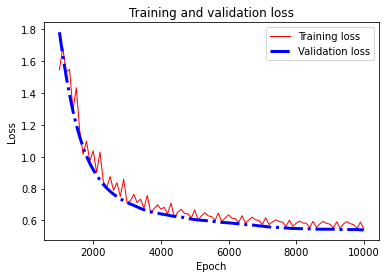

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5480075, Final Validation loss: 0.54033965, Training RMSE: 0.741966, Validation RMSE: 0.735078
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.5132188, Validation loss: 1.4814887, 
Epoch: 2000, Training loss: 0.9009373, Validation loss: 0.8594602, 
Epoch: 3000, Training loss: 0.71256304, Validation loss: 0.67656463, 
Epoch: 4000, Training loss: 0.6467994, Validation loss: 0.6108591, 
Epoch: 5000, Training loss: 0.6442215, Validation loss: 0.58060294, 
Epoch: 6000, Training loss: 0.6113832, Validation loss: 0.5662706, 
Epoch: 7000, Training loss: 0.55607694, Validation loss: 0.557299, 
Epoch: 8000, Training loss: 0.5663873, Validation loss: 0.5538758, 
Epoch: 9000, Training loss: 0.5734032, Validation loss: 0.5485739, 
Epoch: 10000, Training loss:

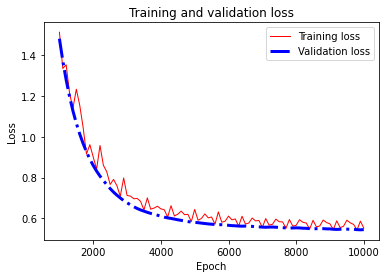

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5529977, Final Validation loss: 0.5451332, Training RMSE: 0.73652637, Validation RMSE: 0.7383313
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.1831328, Validation loss: 1.1541795, 
Epoch: 2000, Training loss: 0.749329, Validation loss: 0.69691664, 
Epoch: 3000, Training loss: 0.6075159, Validation loss: 0.61616725, 
Epoch: 4000, Training loss: 0.62264574, Validation loss: 0.58465016, 
Epoch: 5000, Training loss: 0.62937516, Validation loss: 0.5679755, 
Epoch: 6000, Training loss: 0.6005377, Validation loss: 0.5574503, 
Epoch: 7000, Training loss: 0.5591613, Validation loss: 0.54742134, 
Epoch: 8000, Training loss: 0.5811993, Validation loss: 0.54475516, 
Epoch: 9000, Training loss: 0.5802089, Validation loss: 0.5401973, 
Epoch: 10000, Training 

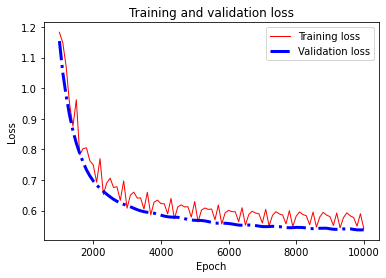

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5410921, Final Validation loss: 0.5369539, Training RMSE: 0.7415275, Validation RMSE: 0.7327714
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.3701414, Validation loss: 1.2309343, 
Epoch: 2000, Training loss: 0.9301678, Validation loss: 0.8650867, 
Epoch: 3000, Training loss: 0.7326183, Validation loss: 0.69999814, 
Epoch: 4000, Training loss: 0.70101184, Validation loss: 0.63675433, 
Epoch: 5000, Training loss: 0.6675683, Validation loss: 0.6010781, 
Epoch: 6000, Training loss: 0.6240843, Validation loss: 0.579656, 
Epoch: 7000, Training loss: 0.5692455, Validation loss: 0.56359226, 
Epoch: 8000, Training loss: 0.5804983, Validation loss: 0.5554132, 
Epoch: 9000, Training loss: 0.56587195, Validation loss: 0.5476084, 
Epoch: 10000, Training los

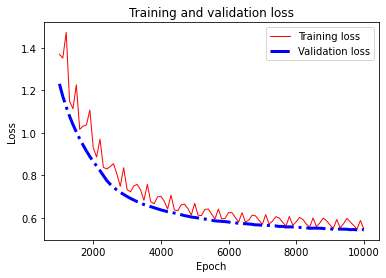

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5471626, Final Validation loss: 0.5438207, Training RMSE: 0.7386951, Validation RMSE: 0.73744196
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.4500408, Validation loss: 1.6029359, 
Epoch: 2000, Training loss: 0.9229436, Validation loss: 0.8923076, 
Epoch: 3000, Training loss: 0.7090136, Validation loss: 0.7318512, 
Epoch: 4000, Training loss: 0.6798444, Validation loss: 0.6542863, 
Epoch: 5000, Training loss: 0.65236527, Validation loss: 0.6073171, 
Epoch: 6000, Training loss: 0.6423384, Validation loss: 0.5780385, 
Epoch: 7000, Training loss: 0.56705934, Validation loss: 0.5666617, 
Epoch: 8000, Training loss: 0.58443975, Validation loss: 0.55321866, 
Epoch: 9000, Training loss: 0.57765925, Validation loss: 0.54686505, 
Epoch: 10000, Training

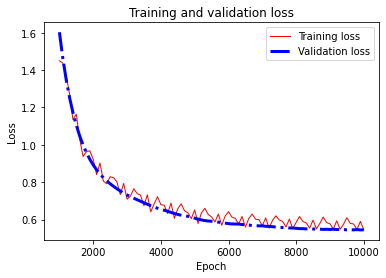

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54533815, Final Validation loss: 0.5449285, Training RMSE: 0.7388063, Validation RMSE: 0.73819274
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.74480474 

Average Validation RMSE for the 10 folds: 0.744816 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.1228495, Validation loss: 1.035066, 
Epoch: 2000, Training loss: 0.75806516, Validation loss: 0.71302754, 
Epoch: 3000, Training loss: 0.6019642, Validation loss: 0.61742693, 
Epoch: 4000, Training loss: 0.6099062, Validation loss: 0.5827682, 
Epoch: 5000, Trai

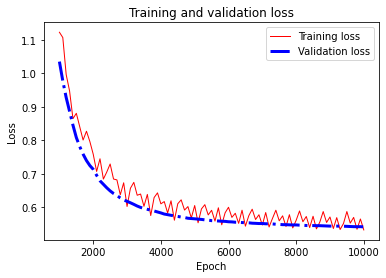

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5319413, Final Validation loss: 0.54112834, Training RMSE: 0.73029864, Validation RMSE: 0.73561424
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.4703178, Validation loss: 3.0258718, 
Epoch: 2000, Training loss: 1.2591236, Validation loss: 1.2764517, 
Epoch: 3000, Training loss: 0.9113649, Validation loss: 0.8989613, 
Epoch: 4000, Training loss: 0.7446639, Validation loss: 0.74518335, 
Epoch: 5000, Training loss: 0.7834273, Validation loss: 0.666491, 
Epoch: 6000, Training loss: 0.6601782, Validation loss: 0.62475526, 
Epoch: 7000, Training loss: 0.59805834, Validation loss: 0.5969688, 
Epoch: 8000, Training loss: 0.6122183, Validation loss: 0.5760999, 
Epoch: 9000, Training loss: 0.59887415, Validation loss: 0.5687183, 
Epoch: 10000, Training l

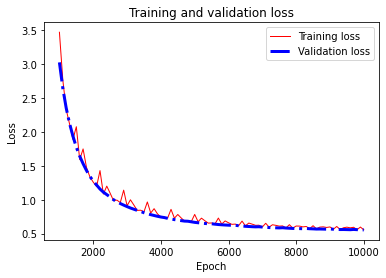

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5568221, Final Validation loss: 0.55501163, Training RMSE: 0.74749315, Validation RMSE: 0.744991
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.730834, Validation loss: 4.6610656, 
Epoch: 2000, Training loss: 1.5880611, Validation loss: 1.9240819, 
Epoch: 3000, Training loss: 1.2247801, Validation loss: 1.305283, 
Epoch: 4000, Training loss: 1.0077336, Validation loss: 0.99110824, 
Epoch: 5000, Training loss: 0.99454606, Validation loss: 0.81578237, 
Epoch: 6000, Training loss: 0.7146805, Validation loss: 0.6971213, 
Epoch: 7000, Training loss: 0.6388419, Validation loss: 0.6380299, 
Epoch: 8000, Training loss: 0.61784726, Validation loss: 0.6027498, 
Epoch: 9000, Training loss: 0.5911572, Validation loss: 0.57860106, 
Epoch: 10000, Training los

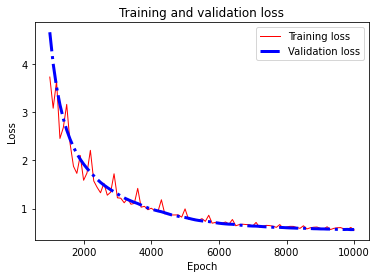

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55780023, Final Validation loss: 0.56521493, Training RMSE: 0.7513373, Validation RMSE: 0.75180775
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.5010536, Validation loss: 1.4268773, 
Epoch: 2000, Training loss: 0.9095238, Validation loss: 0.9380092, 
Epoch: 3000, Training loss: 0.76426834, Validation loss: 0.7612187, 
Epoch: 4000, Training loss: 0.80144316, Validation loss: 0.6682637, 
Epoch: 5000, Training loss: 0.6778586, Validation loss: 0.61183715, 
Epoch: 6000, Training loss: 0.6335331, Validation loss: 0.5833263, 
Epoch: 7000, Training loss: 0.56245637, Validation loss: 0.56822973, 
Epoch: 8000, Training loss: 0.56794196, Validation loss: 0.55620444, 
Epoch: 9000, Training loss: 0.5808717, Validation loss: 0.5546868, 
Epoch: 10000, Traini

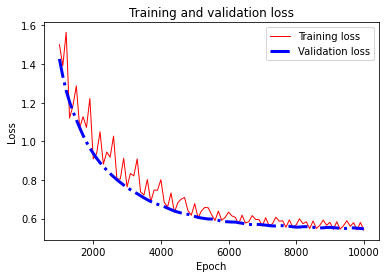

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5416517, Final Validation loss: 0.54715896, Training RMSE: 0.73589385, Validation RMSE: 0.7397019
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 2.6015902, Validation loss: 2.7908273, 
Epoch: 2000, Training loss: 1.0987889, Validation loss: 1.1610976, 
Epoch: 3000, Training loss: 0.8565573, Validation loss: 0.8082813, 
Epoch: 4000, Training loss: 0.69306004, Validation loss: 0.6934392, 
Epoch: 5000, Training loss: 0.6921961, Validation loss: 0.6458616, 
Epoch: 6000, Training loss: 0.657997, Validation loss: 0.61987627, 
Epoch: 7000, Training loss: 0.59735966, Validation loss: 0.60503894, 
Epoch: 8000, Training loss: 0.6111131, Validation loss: 0.5854376, 
Epoch: 9000, Training loss: 0.59402245, Validation loss: 0.57671314, 
Epoch: 10000, Training 

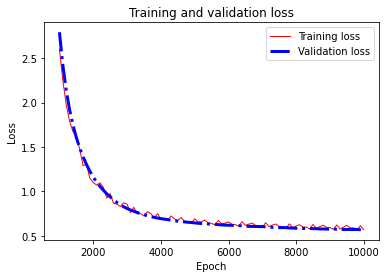

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.56929874, Final Validation loss: 0.56810004, Training RMSE: 0.749742, Validation RMSE: 0.7537241
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.0082694, Validation loss: 1.0112123, 
Epoch: 2000, Training loss: 0.7859672, Validation loss: 0.72972, 
Epoch: 3000, Training loss: 0.70391, Validation loss: 0.64436996, 
Epoch: 4000, Training loss: 0.64200795, Validation loss: 0.60521954, 
Epoch: 5000, Training loss: 0.62166524, Validation loss: 0.5787515, 
Epoch: 6000, Training loss: 0.61493367, Validation loss: 0.56282955, 
Epoch: 7000, Training loss: 0.5571882, Validation loss: 0.55562675, 
Epoch: 8000, Training loss: 0.5931437, Validation loss: 0.5435624, 
Epoch: 9000, Training loss: 0.5732046, Validation loss: 0.53901, 
Epoch: 10000, Training loss:

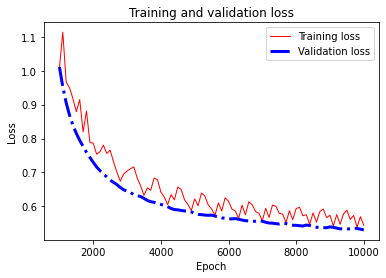

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5435887, Final Validation loss: 0.53004956, Training RMSE: 0.7333873, Validation RMSE: 0.72804505
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.9283624, Validation loss: 1.9579582, 
Epoch: 2000, Training loss: 1.0201523, Validation loss: 1.0341766, 
Epoch: 3000, Training loss: 0.77447546, Validation loss: 0.7779361, 
Epoch: 4000, Training loss: 0.7500456, Validation loss: 0.6719706, 
Epoch: 5000, Training loss: 0.68864036, Validation loss: 0.62414265, 
Epoch: 6000, Training loss: 0.6607875, Validation loss: 0.5981684, 
Epoch: 7000, Training loss: 0.59086156, Validation loss: 0.58168066, 
Epoch: 8000, Training loss: 0.6102496, Validation loss: 0.56813866, 
Epoch: 9000, Training loss: 0.58302295, Validation loss: 0.5578461, 
Epoch: 10000, Trainin

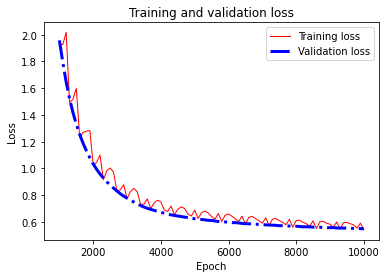

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5408061, Final Validation loss: 0.5500459, Training RMSE: 0.74381506, Validation RMSE: 0.7416508
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 6.49576, Validation loss: 5.953351, 
Epoch: 2000, Training loss: 2.2000299, Validation loss: 2.0971284, 
Epoch: 3000, Training loss: 1.1641043, Validation loss: 1.2708191, 
Epoch: 4000, Training loss: 0.89265394, Validation loss: 0.92353004, 
Epoch: 5000, Training loss: 0.8380535, Validation loss: 0.763102, 
Epoch: 6000, Training loss: 0.8048445, Validation loss: 0.6852642, 
Epoch: 7000, Training loss: 0.6429503, Validation loss: 0.63617307, 
Epoch: 8000, Training loss: 0.63092417, Validation loss: 0.61359227, 
Epoch: 9000, Training loss: 0.6352724, Validation loss: 0.5919164, 
Epoch: 10000, Training loss:

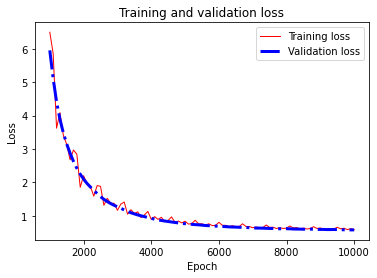

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58496255, Final Validation loss: 0.5783823, Training RMSE: 0.763896, Validation RMSE: 0.7605145
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.5320346, Validation loss: 1.7312728, 
Epoch: 2000, Training loss: 0.90833867, Validation loss: 0.9215228, 
Epoch: 3000, Training loss: 0.6997546, Validation loss: 0.72050595, 
Epoch: 4000, Training loss: 0.6554252, Validation loss: 0.6442802, 
Epoch: 5000, Training loss: 0.6393242, Validation loss: 0.6126229, 
Epoch: 6000, Training loss: 0.65172416, Validation loss: 0.59695226, 
Epoch: 7000, Training loss: 0.5848968, Validation loss: 0.5826587, 
Epoch: 8000, Training loss: 0.59909415, Validation loss: 0.5733735, 
Epoch: 9000, Training loss: 0.6067672, Validation loss: 0.56632525, 
Epoch: 10000, Training l

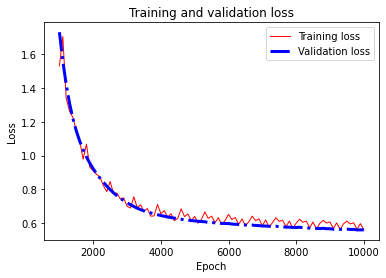

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.56054807, Final Validation loss: 0.559425, Training RMSE: 0.75049156, Validation RMSE: 0.7479472
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 2.7231479, Validation loss: 2.6556945, 
Epoch: 2000, Training loss: 1.2394065, Validation loss: 1.2885535, 
Epoch: 3000, Training loss: 0.8979272, Validation loss: 0.92344785, 
Epoch: 4000, Training loss: 0.7685066, Validation loss: 0.75304335, 
Epoch: 5000, Training loss: 0.76679826, Validation loss: 0.6698035, 
Epoch: 6000, Training loss: 0.6681539, Validation loss: 0.61832494, 
Epoch: 7000, Training loss: 0.5860899, Validation loss: 0.5854295, 
Epoch: 8000, Training loss: 0.5980132, Validation loss: 0.56487554, 
Epoch: 9000, Training loss: 0.5836519, Validation loss: 0.5527034, 
Epoch: 10000, Training 

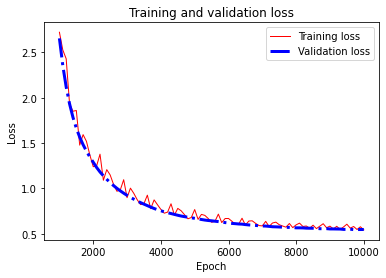

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54193866, Final Validation loss: 0.5466149, Training RMSE: 0.73804605, Validation RMSE: 0.7393341
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7447832 

Average Validation RMSE for the 10 folds: 0.7447876 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.0956609, Validation loss: 1.0845914, 
Epoch: 2000, Training loss: 0.7471493, Validation loss: 0.71172166, 
Epoch: 3000, Training loss: 0.60905975, Validation loss: 0.6306605, 
Epoch: 4000, Training loss: 0.62457114, Validation loss: 0.58973837, 
Epoch: 5000, Tr

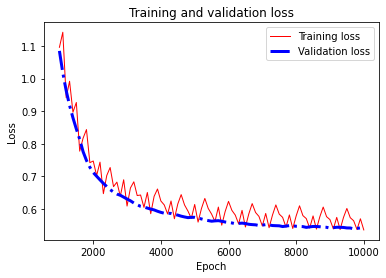

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53589594, Final Validation loss: 0.54266, Training RMSE: 0.7328905, Validation RMSE: 0.7366546
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 15.618778, Validation loss: 14.996532, 
Epoch: 2000, Training loss: 3.1291587, Validation loss: 2.9781814, 
Epoch: 3000, Training loss: 1.5854187, Validation loss: 1.4985223, 
Epoch: 4000, Training loss: 1.1155039, Validation loss: 1.1147556, 
Epoch: 5000, Training loss: 0.9787109, Validation loss: 0.90937394, 
Epoch: 6000, Training loss: 0.76099634, Validation loss: 0.73883224, 
Epoch: 7000, Training loss: 0.6513384, Validation loss: 0.6511594, 
Epoch: 8000, Training loss: 0.640852, Validation loss: 0.61444265, 
Epoch: 9000, Training loss: 0.6076158, Validation loss: 0.5946674, 
Epoch: 10000, Training loss:

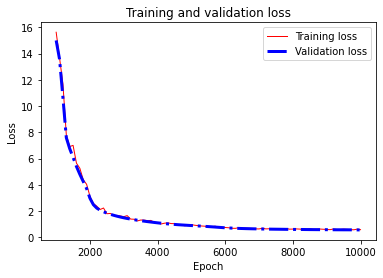

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5961506, Final Validation loss: 0.57694995, Training RMSE: 0.7649231, Validation RMSE: 0.7595722
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 3.6748962, Validation loss: 3.7651067, 
Epoch: 2000, Training loss: 1.7759235, Validation loss: 1.7176367, 
Epoch: 3000, Training loss: 1.1240226, Validation loss: 1.0906942, 
Epoch: 4000, Training loss: 0.85259545, Validation loss: 0.8453003, 
Epoch: 5000, Training loss: 0.7572466, Validation loss: 0.724401, 
Epoch: 6000, Training loss: 0.70406127, Validation loss: 0.6594699, 
Epoch: 7000, Training loss: 0.6147702, Validation loss: 0.61610645, 
Epoch: 8000, Training loss: 0.590012, Validation loss: 0.5864617, 
Epoch: 9000, Training loss: 0.59346825, Validation loss: 0.5711969, 
Epoch: 10000, Training loss

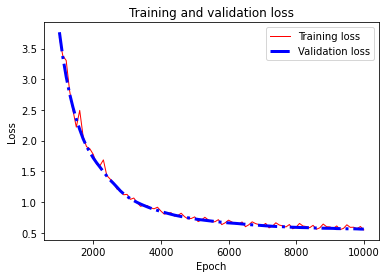

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5449069, Final Validation loss: 0.5576889, Training RMSE: 0.74862415, Validation RMSE: 0.7467857
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 6.486864, Validation loss: 6.351212, 
Epoch: 2000, Training loss: 2.351528, Validation loss: 2.062935, 
Epoch: 3000, Training loss: 1.146085, Validation loss: 1.1563483, 
Epoch: 4000, Training loss: 0.933624, Validation loss: 0.8311629, 
Epoch: 5000, Training loss: 0.7352731, Validation loss: 0.71287334, 
Epoch: 6000, Training loss: 0.714581, Validation loss: 0.6529275, 
Epoch: 7000, Training loss: 0.61927605, Validation loss: 0.62579834, 
Epoch: 8000, Training loss: 0.62131816, Validation loss: 0.6026719, 
Epoch: 9000, Training loss: 0.6121971, Validation loss: 0.59088737, 
Epoch: 10000, Training loss: 0.

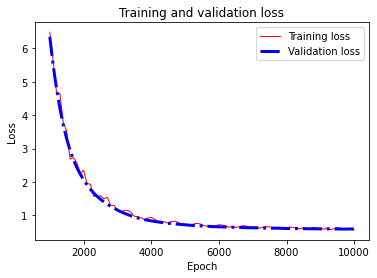

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5603496, Final Validation loss: 0.58808804, Training RMSE: 0.7568979, Validation RMSE: 0.766869
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.8317251, Validation loss: 1.8032024, 
Epoch: 2000, Training loss: 0.9865263, Validation loss: 0.96620935, 
Epoch: 3000, Training loss: 0.7351138, Validation loss: 0.75160563, 
Epoch: 4000, Training loss: 0.660209, Validation loss: 0.6604631, 
Epoch: 5000, Training loss: 0.6513314, Validation loss: 0.615919, 
Epoch: 6000, Training loss: 0.64232165, Validation loss: 0.5922564, 
Epoch: 7000, Training loss: 0.57308114, Validation loss: 0.5768261, 
Epoch: 8000, Training loss: 0.5868236, Validation loss: 0.5667577, 
Epoch: 9000, Training loss: 0.58606005, Validation loss: 0.56031233, 
Epoch: 10000, Training los

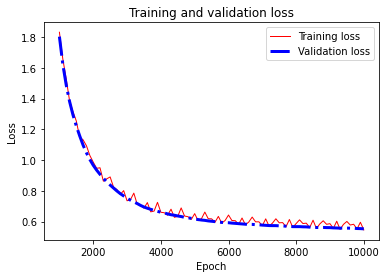

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54543924, Final Validation loss: 0.55244064, Training RMSE: 0.74287313, Validation RMSE: 0.7432635
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.95126015, Validation loss: 0.922657, 
Epoch: 2000, Training loss: 0.752782, Validation loss: 0.6947466, 
Epoch: 3000, Training loss: 0.6158136, Validation loss: 0.60624844, 
Epoch: 4000, Training loss: 0.59223515, Validation loss: 0.5707531, 
Epoch: 5000, Training loss: 0.6059568, Validation loss: 0.5518018, 
Epoch: 6000, Training loss: 0.60570586, Validation loss: 0.54122335, 
Epoch: 7000, Training loss: 0.54654527, Validation loss: 0.5331907, 
Epoch: 8000, Training loss: 0.5542708, Validation loss: 0.52426916, 
Epoch: 9000, Training loss: 0.5716898, Validation loss: 0.5215395, 
Epoch: 10000, Training

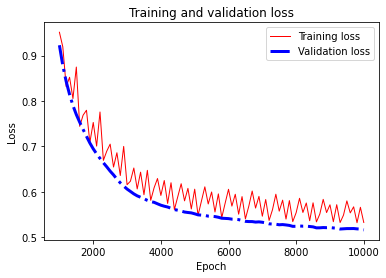

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53272367, Final Validation loss: 0.516349, Training RMSE: 0.7302166, Validation RMSE: 0.7185743
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.2735088, Validation loss: 1.3378371, 
Epoch: 2000, Training loss: 0.8599222, Validation loss: 0.8769483, 
Epoch: 3000, Training loss: 0.7204343, Validation loss: 0.7432571, 
Epoch: 4000, Training loss: 0.6664355, Validation loss: 0.64848983, 
Epoch: 5000, Training loss: 0.67598075, Validation loss: 0.5968698, 
Epoch: 6000, Training loss: 0.6223866, Validation loss: 0.5707463, 
Epoch: 7000, Training loss: 0.5607029, Validation loss: 0.5539725, 
Epoch: 8000, Training loss: 0.57369125, Validation loss: 0.54533523, 
Epoch: 9000, Training loss: 0.58318424, Validation loss: 0.5381462, 
Epoch: 10000, Training lo

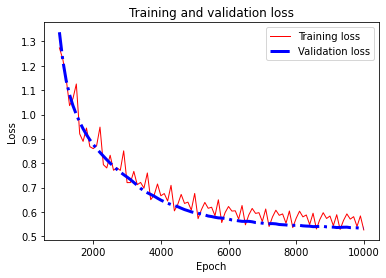

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5262027, Final Validation loss: 0.5335815, Training RMSE: 0.73502976, Validation RMSE: 0.7304666
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.6261181, Validation loss: 1.8939005, 
Epoch: 2000, Training loss: 0.8917695, Validation loss: 0.9099155, 
Epoch: 3000, Training loss: 0.68624157, Validation loss: 0.69693625, 
Epoch: 4000, Training loss: 0.6509725, Validation loss: 0.6266467, 
Epoch: 5000, Training loss: 0.6467406, Validation loss: 0.5865479, 
Epoch: 6000, Training loss: 0.6282547, Validation loss: 0.5682013, 
Epoch: 7000, Training loss: 0.56247175, Validation loss: 0.55180514, 
Epoch: 8000, Training loss: 0.5834805, Validation loss: 0.5443846, 
Epoch: 9000, Training loss: 0.56977326, Validation loss: 0.5347482, 
Epoch: 10000, Training l

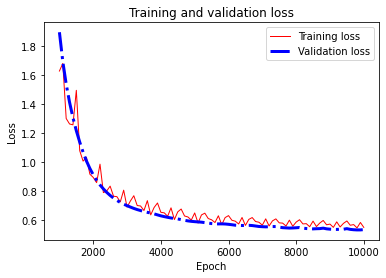

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5469798, Final Validation loss: 0.5316242, Training RMSE: 0.7368681, Validation RMSE: 0.7291256
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 10.158053, Validation loss: 12.12109, 
Epoch: 2000, Training loss: 4.32896, Validation loss: 4.1217747, 
Epoch: 3000, Training loss: 1.9454505, Validation loss: 2.143987, 
Epoch: 4000, Training loss: 1.4786181, Validation loss: 1.3713272, 
Epoch: 5000, Training loss: 1.1149861, Validation loss: 0.9796914, 
Epoch: 6000, Training loss: 0.87319744, Validation loss: 0.8132856, 
Epoch: 7000, Training loss: 0.721102, Validation loss: 0.715324, 
Epoch: 8000, Training loss: 0.6786479, Validation loss: 0.66432565, 
Epoch: 9000, Training loss: 0.67492354, Validation loss: 0.63408536, 
Epoch: 10000, Training loss: 0.6

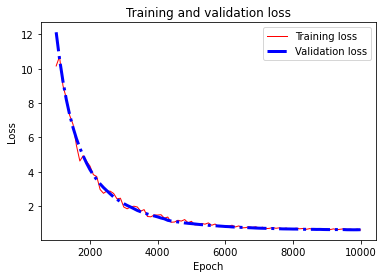

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6136419, Final Validation loss: 0.6263437, Training RMSE: 0.78761965, Validation RMSE: 0.7914188
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.4959254, Validation loss: 1.5286374, 
Epoch: 2000, Training loss: 1.093946, Validation loss: 0.9942039, 
Epoch: 3000, Training loss: 0.84602505, Validation loss: 0.83892924, 
Epoch: 4000, Training loss: 0.80480313, Validation loss: 0.74907273, 
Epoch: 5000, Training loss: 0.763093, Validation loss: 0.68871987, 
Epoch: 6000, Training loss: 0.7018132, Validation loss: 0.640371, 
Epoch: 7000, Training loss: 0.62004817, Validation loss: 0.60788167, 
Epoch: 8000, Training loss: 0.6227863, Validation loss: 0.58965266, 
Epoch: 9000, Training loss: 0.6121298, Validation loss: 0.5759472, 
Epoch: 10000, Training 

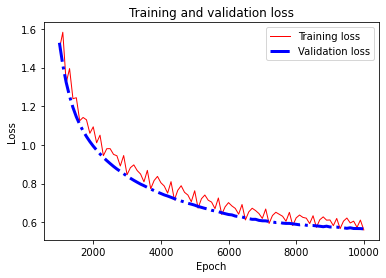

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5606686, Final Validation loss: 0.56603485, Training RMSE: 0.75632244, Validation RMSE: 0.7523529
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7450302 

Average Validation RMSE for the 10 folds: 0.74493873 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6500422, Validation loss: 0.64210385, 
Epoch: 2000, Training loss: 0.61444527, Validation loss: 0.5794241, 
Epoch: 3000, Training loss: 0.5650387, Validation loss: 0.56326586, 
Epoch: 4000, Training loss: 0.5891202, Validation loss: 0.5571676, 
Epoch: 5000,

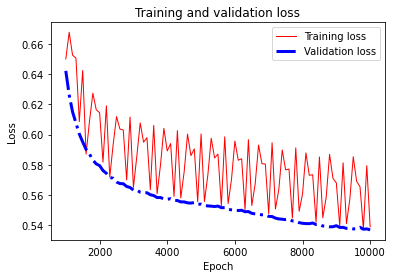

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.538932, Final Validation loss: 0.53687257, Training RMSE: 0.73219526, Validation RMSE: 0.7327159
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7362576, Validation loss: 0.7311134, 
Epoch: 2000, Training loss: 0.65134287, Validation loss: 0.60983646, 
Epoch: 3000, Training loss: 0.5939196, Validation loss: 0.5833834, 
Epoch: 4000, Training loss: 0.5998829, Validation loss: 0.5728074, 
Epoch: 5000, Training loss: 0.6175553, Validation loss: 0.5672514, 
Epoch: 6000, Training loss: 0.6095854, Validation loss: 0.56091046, 
Epoch: 7000, Training loss: 0.55955833, Validation loss: 0.55807704, 
Epoch: 8000, Training loss: 0.59297365, Validation loss: 0.5553816, 
Epoch: 9000, Training loss: 0.5913044, Validation loss: 0.55295104, 
Epoch: 10000, Train

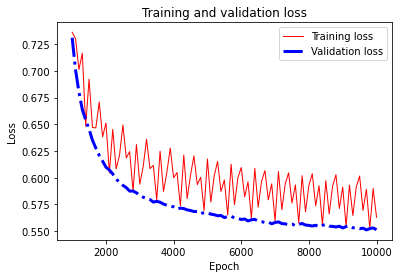

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.56300724, Final Validation loss: 0.55134505, Training RMSE: 0.74225783, Validation RMSE: 0.7425261
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7411345, Validation loss: 0.7308812, 
Epoch: 2000, Training loss: 0.6204354, Validation loss: 0.5930687, 
Epoch: 3000, Training loss: 0.5677292, Validation loss: 0.56651425, 
Epoch: 4000, Training loss: 0.5834827, Validation loss: 0.5560538, 
Epoch: 5000, Training loss: 0.5972553, Validation loss: 0.5513433, 
Epoch: 6000, Training loss: 0.5958543, Validation loss: 0.54518193, 
Epoch: 7000, Training loss: 0.5451774, Validation loss: 0.54248255, 
Epoch: 8000, Training loss: 0.5724245, Validation loss: 0.53977966, 
Epoch: 9000, Training loss: 0.56263244, Validation loss: 0.5380217, 
Epoch: 10000, Train

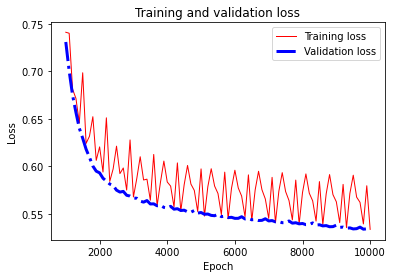

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53358483, Final Validation loss: 0.5330157, Training RMSE: 0.73431027, Validation RMSE: 0.73007923
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6787847, Validation loss: 0.6575616, 
Epoch: 2000, Training loss: 0.61770076, Validation loss: 0.60321325, 
Epoch: 3000, Training loss: 0.55209947, Validation loss: 0.58591443, 
Epoch: 4000, Training loss: 0.58053154, Validation loss: 0.5780361, 
Epoch: 5000, Training loss: 0.6018818, Validation loss: 0.57600576, 
Epoch: 6000, Training loss: 0.60660106, Validation loss: 0.5686489, 
Epoch: 7000, Training loss: 0.5501137, Validation loss: 0.56699383, 
Epoch: 8000, Training loss: 0.58770335, Validation loss: 0.56205183, 
Epoch: 9000, Training loss: 0.57627, Validation loss: 0.5620104, 
Epoch: 10000, Tr

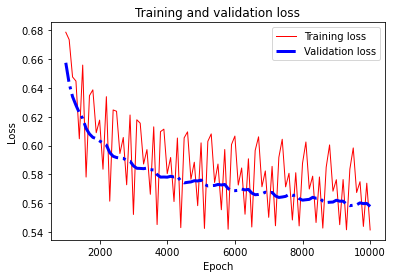

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5413711, Final Validation loss: 0.5577019, Training RMSE: 0.7350548, Validation RMSE: 0.7467944
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8299888, Validation loss: 0.84411263, 
Epoch: 2000, Training loss: 0.6268407, Validation loss: 0.59749883, 
Epoch: 3000, Training loss: 0.57395756, Validation loss: 0.571831, 
Epoch: 4000, Training loss: 0.5912789, Validation loss: 0.5650517, 
Epoch: 5000, Training loss: 0.60639393, Validation loss: 0.56071824, 
Epoch: 6000, Training loss: 0.62239057, Validation loss: 0.56011534, 
Epoch: 7000, Training loss: 0.5569323, Validation loss: 0.55750936, 
Epoch: 8000, Training loss: 0.5842194, Validation loss: 0.5567752, 
Epoch: 9000, Training loss: 0.5818994, Validation loss: 0.5572735, 
Epoch: 10000, Traini

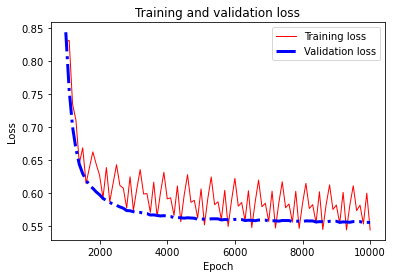

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5441514, Final Validation loss: 0.5555344, Training RMSE: 0.741906, Validation RMSE: 0.74534184
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8181539, Validation loss: 0.8180836, 
Epoch: 2000, Training loss: 0.6620069, Validation loss: 0.6167429, 
Epoch: 3000, Training loss: 0.5763029, Validation loss: 0.58128446, 
Epoch: 4000, Training loss: 0.57084626, Validation loss: 0.5688879, 
Epoch: 5000, Training loss: 0.6051541, Validation loss: 0.56058836, 
Epoch: 6000, Training loss: 0.60398734, Validation loss: 0.55500114, 
Epoch: 7000, Training loss: 0.55286413, Validation loss: 0.55018556, 
Epoch: 8000, Training loss: 0.57558876, Validation loss: 0.54683375, 
Epoch: 9000, Training loss: 0.5730429, Validation loss: 0.54549414, 
Epoch: 10000, Tra

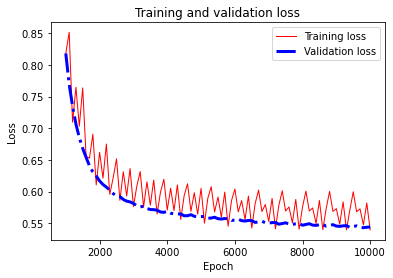

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53943187, Final Validation loss: 0.5440629, Training RMSE: 0.7383419, Validation RMSE: 0.7376062
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.728721, Validation loss: 0.70720845, 
Epoch: 2000, Training loss: 0.5965052, Validation loss: 0.5970913, 
Epoch: 3000, Training loss: 0.5632048, Validation loss: 0.56899405, 
Epoch: 4000, Training loss: 0.5879871, Validation loss: 0.5588541, 
Epoch: 5000, Training loss: 0.60579944, Validation loss: 0.55383736, 
Epoch: 6000, Training loss: 0.60584766, Validation loss: 0.55338645, 
Epoch: 7000, Training loss: 0.5484539, Validation loss: 0.5472306, 
Epoch: 8000, Training loss: 0.57665724, Validation loss: 0.54668945, 
Epoch: 9000, Training loss: 0.5614769, Validation loss: 0.5445525, 
Epoch: 10000, Train

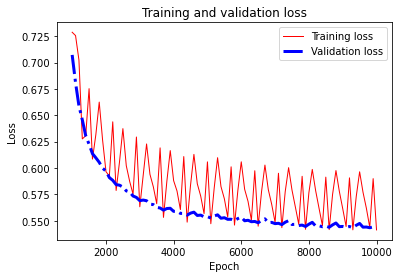

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5412623, Final Validation loss: 0.54284996, Training RMSE: 0.736189, Validation RMSE: 0.7367835
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7473532, Validation loss: 0.69853103, 
Epoch: 2000, Training loss: 0.65306747, Validation loss: 0.57633674, 
Epoch: 3000, Training loss: 0.5695051, Validation loss: 0.56138015, 
Epoch: 4000, Training loss: 0.59185207, Validation loss: 0.55548984, 
Epoch: 5000, Training loss: 0.5910413, Validation loss: 0.5508194, 
Epoch: 6000, Training loss: 0.61241037, Validation loss: 0.55002135, 
Epoch: 7000, Training loss: 0.55750835, Validation loss: 0.54697734, 
Epoch: 8000, Training loss: 0.5878751, Validation loss: 0.5448409, 
Epoch: 9000, Training loss: 0.5916419, Validation loss: 0.54463375, 
Epoch: 10000, Tr

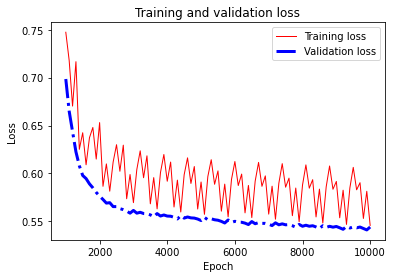

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5457119, Final Validation loss: 0.5440841, Training RMSE: 0.74255395, Validation RMSE: 0.73762053
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.713212, Validation loss: 0.6685522, 
Epoch: 2000, Training loss: 0.6155807, Validation loss: 0.58297205, 
Epoch: 3000, Training loss: 0.5639489, Validation loss: 0.56102157, 
Epoch: 4000, Training loss: 0.5885183, Validation loss: 0.5498209, 
Epoch: 5000, Training loss: 0.59281564, Validation loss: 0.54574996, 
Epoch: 6000, Training loss: 0.59932065, Validation loss: 0.54328364, 
Epoch: 7000, Training loss: 0.5448022, Validation loss: 0.537982, 
Epoch: 8000, Training loss: 0.57723, Validation loss: 0.5394574, 
Epoch: 9000, Training loss: 0.57534707, Validation loss: 0.5360392, 
Epoch: 10000, Training

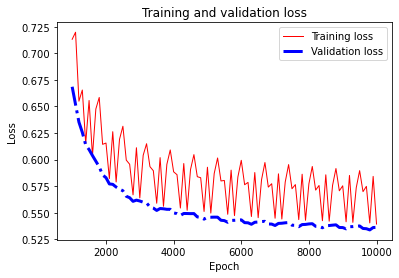

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53936607, Final Validation loss: 0.5362422, Training RMSE: 0.7351246, Validation RMSE: 0.7322856
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.66182464, Validation loss: 0.6485246, 
Epoch: 2000, Training loss: 0.6110932, Validation loss: 0.5858149, 
Epoch: 3000, Training loss: 0.5670339, Validation loss: 0.56832343, 
Epoch: 4000, Training loss: 0.58360636, Validation loss: 0.55984, 
Epoch: 5000, Training loss: 0.60240006, Validation loss: 0.5587806, 
Epoch: 6000, Training loss: 0.6025169, Validation loss: 0.55378014, 
Epoch: 7000, Training loss: 0.55009377, Validation loss: 0.54931223, 
Epoch: 8000, Training loss: 0.5774841, Validation loss: 0.54666066, 
Epoch: 9000, Training loss: 0.58542746, Validation loss: 0.54562366, 
Epoch: 10000, Tra

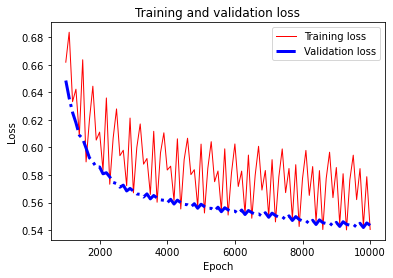

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5404818, Final Validation loss: 0.5434686, Training RMSE: 0.73672646, Validation RMSE: 0.73720324
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.74463195 

Average Validation RMSE for the 10 folds: 0.74456805 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.78065604, Validation loss: 0.6923056, 
Epoch: 2000, Training loss: 0.6203641, Validation loss: 0.617104, 
Epoch: 3000, Training loss: 0.593161, Validation loss: 0.60684097, 
Epoch: 4000, Training loss: 0.6048275, Validation loss: 0.5924527, 
Epoch: 5000

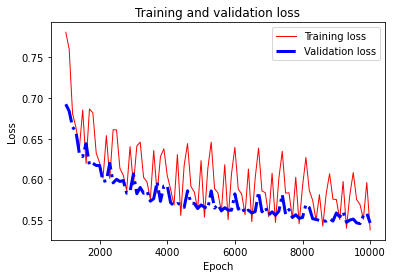

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53804094, Final Validation loss: 0.5465709, Training RMSE: 0.73798794, Validation RMSE: 0.7393043
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7332122, Validation loss: 0.6583842, 
Epoch: 2000, Training loss: 0.60908073, Validation loss: 0.58374375, 
Epoch: 3000, Training loss: 0.5741976, Validation loss: 0.5620251, 
Epoch: 4000, Training loss: 0.5705466, Validation loss: 0.5527887, 
Epoch: 5000, Training loss: 0.5877973, Validation loss: 0.5679323, 
Epoch: 6000, Training loss: 0.6044912, Validation loss: 0.5479354, 
Epoch: 7000, Training loss: 0.54374397, Validation loss: 0.5396125, 
Epoch: 8000, Training loss: 0.5750183, Validation loss: 0.53872603, 
Epoch: 9000, Training loss: 0.5850444, Validation loss: 0.54140186, 
Epoch: 10000, Traini

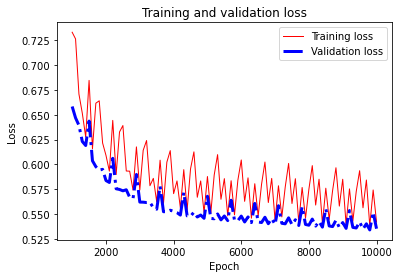

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5419463, Final Validation loss: 0.53522074, Training RMSE: 0.7338089, Validation RMSE: 0.7315878
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6593933, Validation loss: 0.6370376, 
Epoch: 2000, Training loss: 0.5791299, Validation loss: 0.5873751, 
Epoch: 3000, Training loss: 0.5416968, Validation loss: 0.5733574, 
Epoch: 4000, Training loss: 0.59192353, Validation loss: 0.55275756, 
Epoch: 5000, Training loss: 0.5827311, Validation loss: 0.5479125, 
Epoch: 6000, Training loss: 0.60795456, Validation loss: 0.5402717, 
Epoch: 7000, Training loss: 0.53799397, Validation loss: 0.53621, 
Epoch: 8000, Training loss: 0.55978745, Validation loss: 0.5343377, 
Epoch: 9000, Training loss: 0.5585332, Validation loss: 0.53558856, 
Epoch: 10000, Training

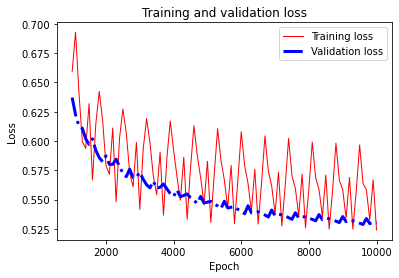

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52418256, Final Validation loss: 0.53000987, Training RMSE: 0.729139, Validation RMSE: 0.72801775
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.69255114, Validation loss: 0.70243967, 
Epoch: 2000, Training loss: 0.6025156, Validation loss: 0.6065353, 
Epoch: 3000, Training loss: 0.55287415, Validation loss: 0.57849276, 
Epoch: 4000, Training loss: 0.58504266, Validation loss: 0.57289946, 
Epoch: 5000, Training loss: 0.6097576, Validation loss: 0.5844292, 
Epoch: 6000, Training loss: 0.61332065, Validation loss: 0.55958116, 
Epoch: 7000, Training loss: 0.54404235, Validation loss: 0.55639774, 
Epoch: 8000, Training loss: 0.56227714, Validation loss: 0.5511929, 
Epoch: 9000, Training loss: 0.570153, Validation loss: 0.5556275, 
Epoch: 10000, T

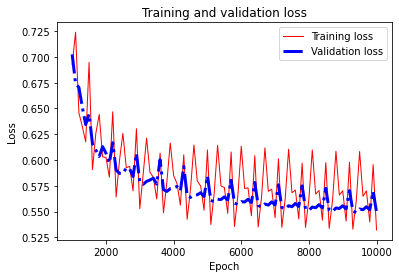

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53219, Final Validation loss: 0.5495665, Training RMSE: 0.7329393, Validation RMSE: 0.7413275
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6504565, Validation loss: 0.60950124, 
Epoch: 2000, Training loss: 0.60697854, Validation loss: 0.5725132, 
Epoch: 3000, Training loss: 0.55508703, Validation loss: 0.5532867, 
Epoch: 4000, Training loss: 0.57520866, Validation loss: 0.5463563, 
Epoch: 5000, Training loss: 0.57764125, Validation loss: 0.54506224, 
Epoch: 6000, Training loss: 0.588551, Validation loss: 0.54726, 
Epoch: 7000, Training loss: 0.5352819, Validation loss: 0.5361395, 
Epoch: 8000, Training loss: 0.5689236, Validation loss: 0.53823316, 
Epoch: 9000, Training loss: 0.56573546, Validation loss: 0.5407427, 
Epoch: 10000, Training l

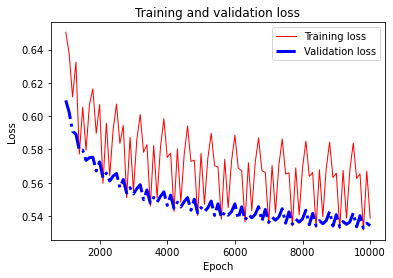

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.538773, Final Validation loss: 0.53414714, Training RMSE: 0.72807574, Validation RMSE: 0.73085374
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.77536047, Validation loss: 0.7617418, 
Epoch: 2000, Training loss: 0.6506119, Validation loss: 0.6111613, 
Epoch: 3000, Training loss: 0.57191026, Validation loss: 0.5712501, 
Epoch: 4000, Training loss: 0.58098584, Validation loss: 0.55266744, 
Epoch: 5000, Training loss: 0.61566174, Validation loss: 0.58773935, 
Epoch: 6000, Training loss: 0.6242839, Validation loss: 0.56309295, 
Epoch: 7000, Training loss: 0.54638416, Validation loss: 0.5387101, 
Epoch: 8000, Training loss: 0.5747168, Validation loss: 0.53847706, 
Epoch: 9000, Training loss: 0.5885798, Validation loss: 0.5505658, 
Epoch: 10000, Tr

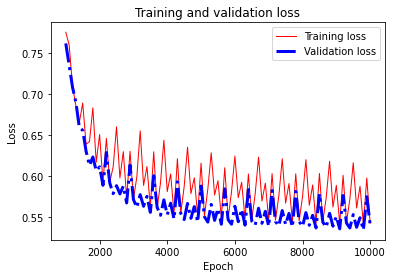

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54220784, Final Validation loss: 0.54074705, Training RMSE: 0.7382719, Validation RMSE: 0.735355
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.71956134, Validation loss: 0.700125, 
Epoch: 2000, Training loss: 0.6458786, Validation loss: 0.5991117, 
Epoch: 3000, Training loss: 0.5746423, Validation loss: 0.5678203, 
Epoch: 4000, Training loss: 0.5993917, Validation loss: 0.5654444, 
Epoch: 5000, Training loss: 0.60903245, Validation loss: 0.56245315, 
Epoch: 6000, Training loss: 0.5910194, Validation loss: 0.55415106, 
Epoch: 7000, Training loss: 0.5434771, Validation loss: 0.5464851, 
Epoch: 8000, Training loss: 0.5692708, Validation loss: 0.55029064, 
Epoch: 9000, Training loss: 0.5750528, Validation loss: 0.54361105, 
Epoch: 10000, Trainin

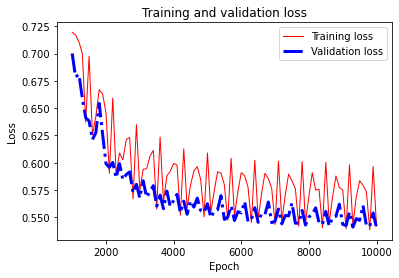

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54198694, Final Validation loss: 0.54038244, Training RMSE: 0.73254484, Validation RMSE: 0.7351071
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.70547545, Validation loss: 0.723785, 
Epoch: 2000, Training loss: 0.6080918, Validation loss: 0.58471185, 
Epoch: 3000, Training loss: 0.53652614, Validation loss: 0.55735433, 
Epoch: 4000, Training loss: 0.56947434, Validation loss: 0.54457515, 
Epoch: 5000, Training loss: 0.5956943, Validation loss: 0.5366056, 
Epoch: 6000, Training loss: 0.5884541, Validation loss: 0.5379574, 
Epoch: 7000, Training loss: 0.5378504, Validation loss: 0.53211534, 
Epoch: 8000, Training loss: 0.5622604, Validation loss: 0.53234476, 
Epoch: 9000, Training loss: 0.56729794, Validation loss: 0.52971804, 
Epoch: 10000, T

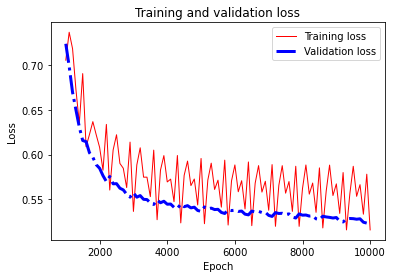

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5159058, Final Validation loss: 0.5270136, Training RMSE: 0.7295561, Validation RMSE: 0.72595704
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.67475414, Validation loss: 0.6921124, 
Epoch: 2000, Training loss: 0.6237019, Validation loss: 0.6020935, 
Epoch: 3000, Training loss: 0.5666614, Validation loss: 0.5766587, 
Epoch: 4000, Training loss: 0.5901741, Validation loss: 0.56444734, 
Epoch: 5000, Training loss: 0.5918766, Validation loss: 0.56605226, 
Epoch: 6000, Training loss: 0.6193961, Validation loss: 0.5570619, 
Epoch: 7000, Training loss: 0.5516711, Validation loss: 0.5520188, 
Epoch: 8000, Training loss: 0.57824904, Validation loss: 0.5521796, 
Epoch: 9000, Training loss: 0.56841236, Validation loss: 0.5466281, 
Epoch: 10000, Trainin

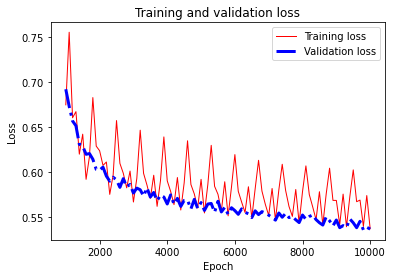

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5369295, Final Validation loss: 0.5365724, Training RMSE: 0.73415387, Validation RMSE: 0.73251104
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6845489, Validation loss: 0.7112243, 
Epoch: 2000, Training loss: 0.60467196, Validation loss: 0.59002465, 
Epoch: 3000, Training loss: 0.5560601, Validation loss: 0.5667713, 
Epoch: 4000, Training loss: 0.5774163, Validation loss: 0.5569498, 
Epoch: 5000, Training loss: 0.590147, Validation loss: 0.5536582, 
Epoch: 6000, Training loss: 0.60171914, Validation loss: 0.5485889, 
Epoch: 7000, Training loss: 0.5426428, Validation loss: 0.5447614, 
Epoch: 8000, Training loss: 0.5737725, Validation loss: 0.54281235, 
Epoch: 9000, Training loss: 0.5648239, Validation loss: 0.5438534, 
Epoch: 10000, Trainin

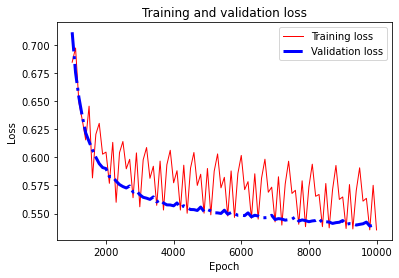

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5355176, Final Validation loss: 0.5394113, Training RMSE: 0.7304528, Validation RMSE: 0.7344463
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.744035 

Average Validation RMSE for the 10 folds: 0.744012 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7486317, Validation loss: 0.75432014, 
Epoch: 2000, Training loss: 0.64224154, Validation loss: 0.60774964, 
Epoch: 3000, Training loss: 0.56683964, Validation loss: 0.5695134, 
Epoch: 4000, Training loss: 0.58212304, Validation loss: 0.5599261, 
Epoch: 5000,

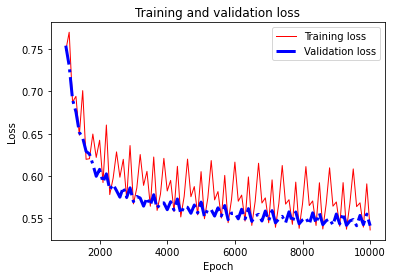

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5359827, Final Validation loss: 0.5409664, Training RMSE: 0.733178, Validation RMSE: 0.73550415
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7053516, Validation loss: 0.66897506, 
Epoch: 2000, Training loss: 0.5886004, Validation loss: 0.5673026, 
Epoch: 3000, Training loss: 0.5686122, Validation loss: 0.5482509, 
Epoch: 4000, Training loss: 0.57412326, Validation loss: 0.5402225, 
Epoch: 5000, Training loss: 0.59144664, Validation loss: 0.53651184, 
Epoch: 6000, Training loss: 0.6087567, Validation loss: 0.53853, 
Epoch: 7000, Training loss: 0.5382786, Validation loss: 0.5260083, 
Epoch: 8000, Training loss: 0.5782015, Validation loss: 0.5239786, 
Epoch: 9000, Training loss: 0.55492574, Validation loss: 0.52714086, 
Epoch: 10000, Training 

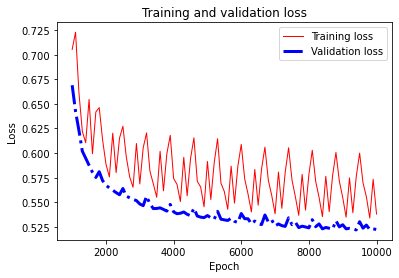

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53801125, Final Validation loss: 0.5222456, Training RMSE: 0.73007756, Validation RMSE: 0.7226656
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6060699, Validation loss: 0.5867963, 
Epoch: 2000, Training loss: 0.5812798, Validation loss: 0.55625963, 
Epoch: 3000, Training loss: 0.5406638, Validation loss: 0.5425113, 
Epoch: 4000, Training loss: 0.57245076, Validation loss: 0.5378123, 
Epoch: 5000, Training loss: 0.5815119, Validation loss: 0.53702873, 
Epoch: 6000, Training loss: 0.5869297, Validation loss: 0.5343657, 
Epoch: 7000, Training loss: 0.5330692, Validation loss: 0.5312312, 
Epoch: 8000, Training loss: 0.5578402, Validation loss: 0.5315255, 
Epoch: 9000, Training loss: 0.55871236, Validation loss: 0.531088, 
Epoch: 10000, Training

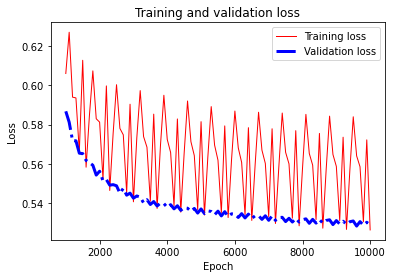

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52633464, Final Validation loss: 0.5288476, Training RMSE: 0.7282046, Validation RMSE: 0.72721905
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6131781, Validation loss: 0.5953875, 
Epoch: 2000, Training loss: 0.58185524, Validation loss: 0.5700389, 
Epoch: 3000, Training loss: 0.54950196, Validation loss: 0.55756176, 
Epoch: 4000, Training loss: 0.55095744, Validation loss: 0.55451596, 
Epoch: 5000, Training loss: 0.581228, Validation loss: 0.54932314, 
Epoch: 6000, Training loss: 0.59648573, Validation loss: 0.5440157, 
Epoch: 7000, Training loss: 0.5318852, Validation loss: 0.5435872, 
Epoch: 8000, Training loss: 0.55940735, Validation loss: 0.53928274, 
Epoch: 9000, Training loss: 0.5561316, Validation loss: 0.54300636, 
Epoch: 10000, Tr

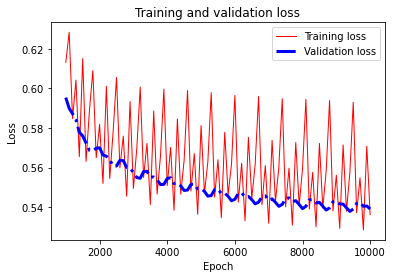

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5363056, Final Validation loss: 0.5390952, Training RMSE: 0.7246818, Validation RMSE: 0.73423105
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6372029, Validation loss: 0.6247062, 
Epoch: 2000, Training loss: 0.6109197, Validation loss: 0.5795229, 
Epoch: 3000, Training loss: 0.5505651, Validation loss: 0.5614108, 
Epoch: 4000, Training loss: 0.574468, Validation loss: 0.557122, 
Epoch: 5000, Training loss: 0.58982384, Validation loss: 0.55539197, 
Epoch: 6000, Training loss: 0.5831088, Validation loss: 0.5572928, 
Epoch: 7000, Training loss: 0.5364627, Validation loss: 0.5439946, 
Epoch: 8000, Training loss: 0.56790876, Validation loss: 0.54328215, 
Epoch: 9000, Training loss: 0.57137394, Validation loss: 0.54212445, 
Epoch: 10000, Training

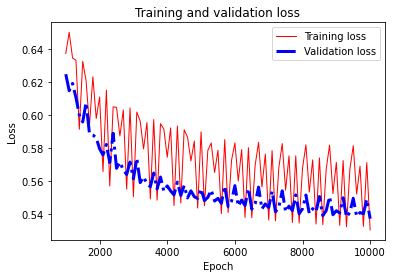

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53050524, Final Validation loss: 0.53728336, Training RMSE: 0.72700727, Validation RMSE: 0.73299617
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.69063187, Validation loss: 0.6621861, 
Epoch: 2000, Training loss: 0.61205137, Validation loss: 0.5869679, 
Epoch: 3000, Training loss: 0.54002863, Validation loss: 0.5586417, 
Epoch: 4000, Training loss: 0.58710676, Validation loss: 0.55678195, 
Epoch: 5000, Training loss: 0.5931319, Validation loss: 0.5744249, 
Epoch: 6000, Training loss: 0.61955166, Validation loss: 0.55975664, 
Epoch: 7000, Training loss: 0.5578372, Validation loss: 0.54609954, 
Epoch: 8000, Training loss: 0.56673056, Validation loss: 0.5339636, 
Epoch: 9000, Training loss: 0.5593459, Validation loss: 0.532144, 
Epoch: 10000, T

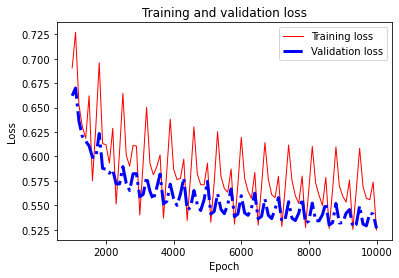

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52474856, Final Validation loss: 0.5263271, Training RMSE: 0.731969, Validation RMSE: 0.725484
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6105699, Validation loss: 0.58617246, 
Epoch: 2000, Training loss: 0.5999184, Validation loss: 0.565224, 
Epoch: 3000, Training loss: 0.5452658, Validation loss: 0.5505297, 
Epoch: 4000, Training loss: 0.58793604, Validation loss: 0.54945755, 
Epoch: 5000, Training loss: 0.59258515, Validation loss: 0.54508096, 
Epoch: 6000, Training loss: 0.60281384, Validation loss: 0.55761135, 
Epoch: 7000, Training loss: 0.5410264, Validation loss: 0.5393363, 
Epoch: 8000, Training loss: 0.5752353, Validation loss: 0.5425317, 
Epoch: 9000, Training loss: 0.5745123, Validation loss: 0.5451417, 
Epoch: 10000, Training

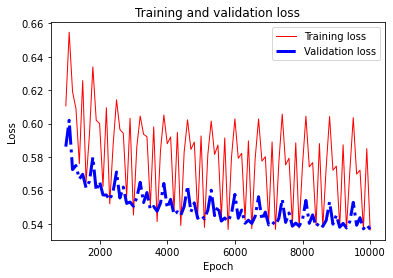

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5363569, Final Validation loss: 0.5367413, Training RMSE: 0.7313687, Validation RMSE: 0.7326263
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.0577497, Validation loss: 1.0226563, 
Epoch: 2000, Training loss: 0.68049294, Validation loss: 0.6707682, 
Epoch: 3000, Training loss: 0.6250197, Validation loss: 0.6153482, 
Epoch: 4000, Training loss: 0.6073035, Validation loss: 0.58079594, 
Epoch: 5000, Training loss: 0.7049062, Validation loss: 0.7500526, 
Epoch: 6000, Training loss: 0.651139, Validation loss: 0.57604337, 
Epoch: 7000, Training loss: 0.57155985, Validation loss: 0.5540335, 
Epoch: 8000, Training loss: 0.60629505, Validation loss: 0.55454415, 
Epoch: 9000, Training loss: 0.5977229, Validation loss: 0.5576532, 
Epoch: 10000, Training

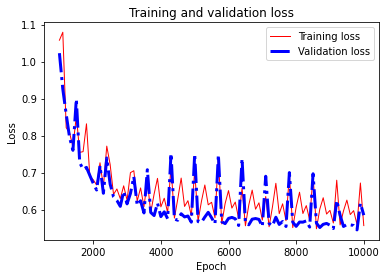

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5566282, Final Validation loss: 0.5847358, Training RMSE: 0.77226526, Validation RMSE: 0.7646802
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.0179275, Validation loss: 0.97251415, 
Epoch: 2000, Training loss: 0.74590397, Validation loss: 0.6506931, 
Epoch: 3000, Training loss: 0.603814, Validation loss: 0.60615593, 
Epoch: 4000, Training loss: 0.66745985, Validation loss: 0.6664348, 
Epoch: 5000, Training loss: 0.5939796, Validation loss: 0.75570494, 
Epoch: 6000, Training loss: 0.62847704, Validation loss: 0.5820233, 
Epoch: 7000, Training loss: 0.5871752, Validation loss: 0.5595813, 
Epoch: 8000, Training loss: 0.5857751, Validation loss: 0.5498973, 
Epoch: 9000, Training loss: 0.5715138, Validation loss: 0.54703194, 
Epoch: 10000, Traini

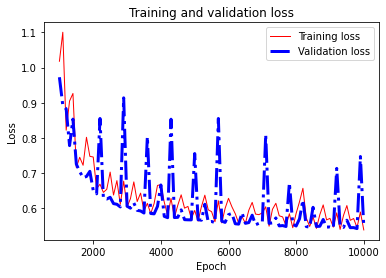

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53871316, Final Validation loss: 0.5478122, Training RMSE: 0.7372037, Validation RMSE: 0.74014336
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.68112814, Validation loss: 0.68656343, 
Epoch: 2000, Training loss: 0.6481412, Validation loss: 0.6075818, 
Epoch: 3000, Training loss: 0.5695734, Validation loss: 0.5741447, 
Epoch: 4000, Training loss: 0.5966554, Validation loss: 0.57461697, 
Epoch: 5000, Training loss: 0.5907463, Validation loss: 0.5504411, 
Epoch: 6000, Training loss: 0.61509585, Validation loss: 0.5655828, 
Epoch: 7000, Training loss: 0.54758763, Validation loss: 0.54355526, 
Epoch: 8000, Training loss: 0.5802802, Validation loss: 0.54141134, 
Epoch: 9000, Training loss: 0.58478546, Validation loss: 0.55370766, 
Epoch: 10000, T

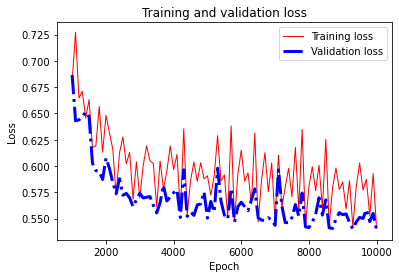

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5409046, Final Validation loss: 0.53921425, Training RMSE: 0.7361735, Validation RMSE: 0.7343121
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.743615 

Average Validation RMSE for the 10 folds: 0.74358225 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.6561731, Validation loss: 1.7853161, 
Epoch: 2000, Training loss: 0.985394, Validation loss: 0.9870146, 
Epoch: 3000, Training loss: 0.7366734, Validation loss: 0.72764724, 
Epoch: 4000, Training loss: 0.6461874, Validation loss: 0.627592, 
Epoch: 5000, Train

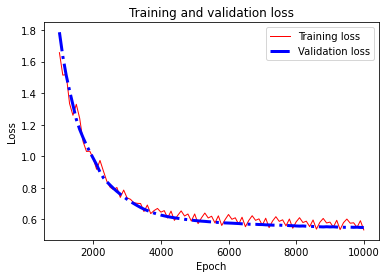

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53370345, Final Validation loss: 0.5491966, Training RMSE: 0.7404899, Validation RMSE: 0.741078
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.2572438, Validation loss: 1.2734907, 
Epoch: 2000, Training loss: 0.8237217, Validation loss: 0.8107386, 
Epoch: 3000, Training loss: 0.6868378, Validation loss: 0.6679831, 
Epoch: 4000, Training loss: 0.63133276, Validation loss: 0.6146659, 
Epoch: 5000, Training loss: 0.645592, Validation loss: 0.5899785, 
Epoch: 6000, Training loss: 0.63053435, Validation loss: 0.5730502, 
Epoch: 7000, Training loss: 0.5663247, Validation loss: 0.56308573, 
Epoch: 8000, Training loss: 0.5837461, Validation loss: 0.5513419, 
Epoch: 9000, Training loss: 0.5742556, Validation loss: 0.54518735, 
Epoch: 10000, Training loss

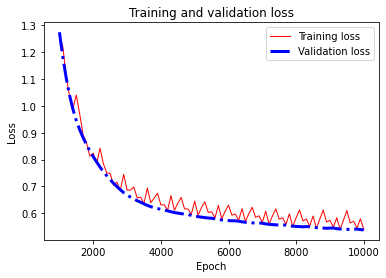

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53945345, Final Validation loss: 0.5382892, Training RMSE: 0.73718697, Validation RMSE: 0.7336819
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8758203, Validation loss: 0.9432935, 
Epoch: 2000, Training loss: 0.6919425, Validation loss: 0.69249904, 
Epoch: 3000, Training loss: 0.63153267, Validation loss: 0.6422892, 
Epoch: 4000, Training loss: 0.63851994, Validation loss: 0.6183923, 
Epoch: 5000, Training loss: 0.6448405, Validation loss: 0.5988761, 
Epoch: 6000, Training loss: 0.6216976, Validation loss: 0.5847553, 
Epoch: 7000, Training loss: 0.5751757, Validation loss: 0.5754879, 
Epoch: 8000, Training loss: 0.5964996, Validation loss: 0.56579417, 
Epoch: 9000, Training loss: 0.5924655, Validation loss: 0.5598951, 
Epoch: 10000, Training l

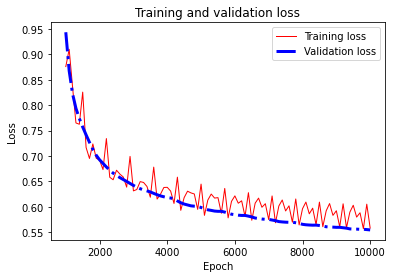

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5585049, Final Validation loss: 0.5548186, Training RMSE: 0.74590105, Validation RMSE: 0.7448614
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.1727241, Validation loss: 1.1819385, 
Epoch: 2000, Training loss: 0.80575806, Validation loss: 0.7786123, 
Epoch: 3000, Training loss: 0.66971165, Validation loss: 0.6539421, 
Epoch: 4000, Training loss: 0.63096756, Validation loss: 0.62309295, 
Epoch: 5000, Training loss: 0.6540767, Validation loss: 0.60148376, 
Epoch: 6000, Training loss: 0.6412934, Validation loss: 0.58383644, 
Epoch: 7000, Training loss: 0.56064296, Validation loss: 0.5759582, 
Epoch: 8000, Training loss: 0.56792825, Validation loss: 0.5618348, 
Epoch: 9000, Training loss: 0.56346536, Validation loss: 0.5599023, 
Epoch: 10000, Traini

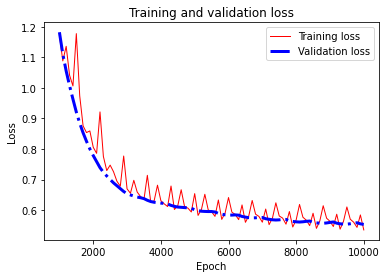

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5353693, Final Validation loss: 0.5533558, Training RMSE: 0.73557717, Validation RMSE: 0.7438789
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 2.7967703, Validation loss: 2.768702, 
Epoch: 2000, Training loss: 1.1863922, Validation loss: 1.1232316, 
Epoch: 3000, Training loss: 0.73123837, Validation loss: 0.75978726, 
Epoch: 4000, Training loss: 0.67917985, Validation loss: 0.6620364, 
Epoch: 5000, Training loss: 0.6453701, Validation loss: 0.6169644, 
Epoch: 6000, Training loss: 0.64676845, Validation loss: 0.59571177, 
Epoch: 7000, Training loss: 0.56951505, Validation loss: 0.5843563, 
Epoch: 8000, Training loss: 0.6086731, Validation loss: 0.5739384, 
Epoch: 9000, Training loss: 0.5859458, Validation loss: 0.5679888, 
Epoch: 10000, Training l

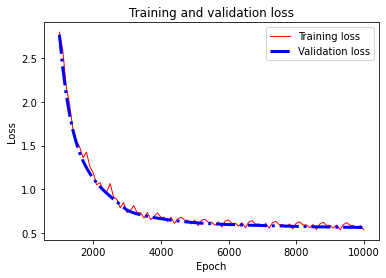

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53371215, Final Validation loss: 0.5609994, Training RMSE: 0.74113435, Validation RMSE: 0.74899894
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 3.1835165, Validation loss: 3.1411564, 
Epoch: 2000, Training loss: 1.4268428, Validation loss: 1.3953302, 
Epoch: 3000, Training loss: 1.0266225, Validation loss: 1.0174677, 
Epoch: 4000, Training loss: 0.914494, Validation loss: 0.8529295, 
Epoch: 5000, Training loss: 0.7797933, Validation loss: 0.7370893, 
Epoch: 6000, Training loss: 0.69745696, Validation loss: 0.67739654, 
Epoch: 7000, Training loss: 0.64431477, Validation loss: 0.64247954, 
Epoch: 8000, Training loss: 0.65981054, Validation loss: 0.61506224, 
Epoch: 9000, Training loss: 0.61577076, Validation loss: 0.59452647, 
Epoch: 10000, Traini

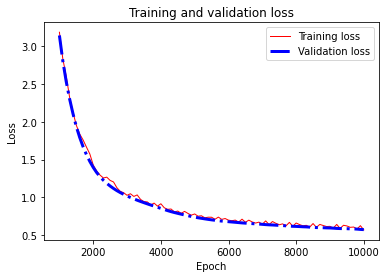

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5685533, Final Validation loss: 0.57238483, Training RMSE: 0.7591033, Validation RMSE: 0.7565612
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.8572857, Validation loss: 1.7007937, 
Epoch: 2000, Training loss: 0.9229639, Validation loss: 0.94523627, 
Epoch: 3000, Training loss: 0.8126483, Validation loss: 0.7518693, 
Epoch: 4000, Training loss: 0.67619604, Validation loss: 0.66779685, 
Epoch: 5000, Training loss: 0.676589, Validation loss: 0.6254836, 
Epoch: 6000, Training loss: 0.63671654, Validation loss: 0.5960272, 
Epoch: 7000, Training loss: 0.58034873, Validation loss: 0.57690233, 
Epoch: 8000, Training loss: 0.60036176, Validation loss: 0.5681621, 
Epoch: 9000, Training loss: 0.5807086, Validation loss: 0.55872244, 
Epoch: 10000, Training

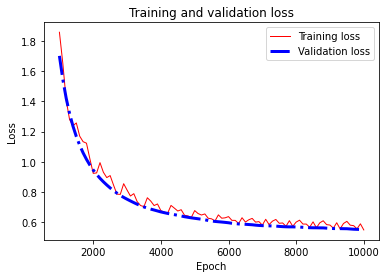

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5486213, Final Validation loss: 0.5519535, Training RMSE: 0.7446369, Validation RMSE: 0.7429357
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8808843, Validation loss: 0.84497297, 
Epoch: 2000, Training loss: 0.6925719, Validation loss: 0.6616872, 
Epoch: 3000, Training loss: 0.59672475, Validation loss: 0.61113364, 
Epoch: 4000, Training loss: 0.6274251, Validation loss: 0.5854352, 
Epoch: 5000, Training loss: 0.61958736, Validation loss: 0.5662053, 
Epoch: 6000, Training loss: 0.6082961, Validation loss: 0.5554979, 
Epoch: 7000, Training loss: 0.55728567, Validation loss: 0.54418486, 
Epoch: 8000, Training loss: 0.5653701, Validation loss: 0.539899, 
Epoch: 9000, Training loss: 0.5656185, Validation loss: 0.5347559, 
Epoch: 10000, Training lo

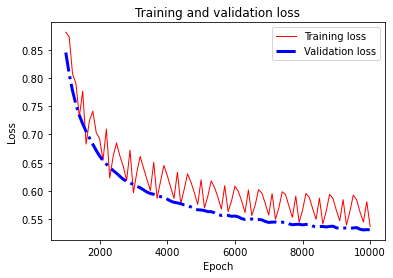

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5372399, Final Validation loss: 0.5313068, Training RMSE: 0.73800576, Validation RMSE: 0.72890794
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.2089643, Validation loss: 1.3024875, 
Epoch: 2000, Training loss: 0.90640146, Validation loss: 0.8627945, 
Epoch: 3000, Training loss: 0.65968025, Validation loss: 0.69564605, 
Epoch: 4000, Training loss: 0.6541244, Validation loss: 0.6341732, 
Epoch: 5000, Training loss: 0.6543847, Validation loss: 0.604333, 
Epoch: 6000, Training loss: 0.64495355, Validation loss: 0.58644956, 
Epoch: 7000, Training loss: 0.573864, Validation loss: 0.57160145, 
Epoch: 8000, Training loss: 0.58548075, Validation loss: 0.5648257, 
Epoch: 9000, Training loss: 0.58472735, Validation loss: 0.5548311, 
Epoch: 10000, Training

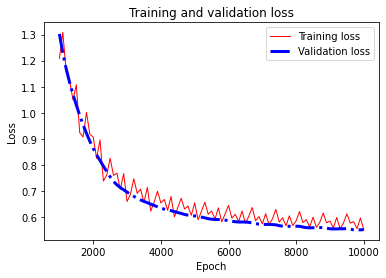

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55182976, Final Validation loss: 0.55160296, Training RMSE: 0.74433875, Validation RMSE: 0.7426998
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.5835073, Validation loss: 1.5802726, 
Epoch: 2000, Training loss: 0.7959472, Validation loss: 0.82084215, 
Epoch: 3000, Training loss: 0.681384, Validation loss: 0.66440594, 
Epoch: 4000, Training loss: 0.69193834, Validation loss: 0.6113834, 
Epoch: 5000, Training loss: 0.61550474, Validation loss: 0.594771, 
Epoch: 6000, Training loss: 0.62679034, Validation loss: 0.5800364, 
Epoch: 7000, Training loss: 0.5731866, Validation loss: 0.5647448, 
Epoch: 8000, Training loss: 0.5968566, Validation loss: 0.5556714, 
Epoch: 9000, Training loss: 0.58715177, Validation loss: 0.55077726, 
Epoch: 10000, Trainin

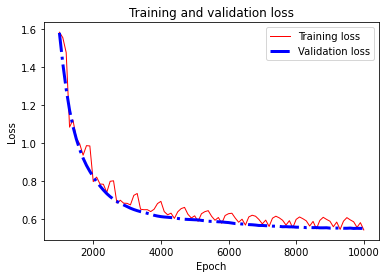

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5412647, Final Validation loss: 0.54986537, Training RMSE: 0.744297, Validation RMSE: 0.74152905
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.74359006 

Average Validation RMSE for the 10 folds: 0.7435336 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 2.350832, Validation loss: 2.4813478, 
Epoch: 2000, Training loss: 1.1001, Validation loss: 1.0624073, 
Epoch: 3000, Training loss: 0.7691656, Validation loss: 0.8425478, 
Epoch: 4000, Training loss: 0.71000147, Validation loss: 0.73150915, 
Epoch: 5000, Training

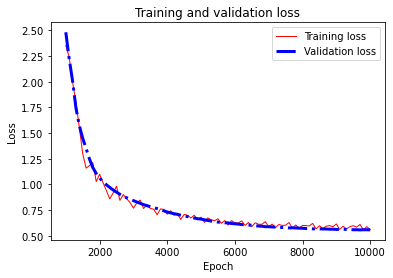

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.561452, Final Validation loss: 0.5575139, Training RMSE: 0.7457137, Validation RMSE: 0.7466685
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 2.041107, Validation loss: 1.9772075, 
Epoch: 2000, Training loss: 1.037365, Validation loss: 1.0287907, 
Epoch: 3000, Training loss: 0.7546045, Validation loss: 0.7786612, 
Epoch: 4000, Training loss: 0.7268413, Validation loss: 0.66374534, 
Epoch: 5000, Training loss: 0.67851865, Validation loss: 0.6130508, 
Epoch: 6000, Training loss: 0.653961, Validation loss: 0.58636814, 
Epoch: 7000, Training loss: 0.57727927, Validation loss: 0.5732681, 
Epoch: 8000, Training loss: 0.5894232, Validation loss: 0.55562985, 
Epoch: 9000, Training loss: 0.57560444, Validation loss: 0.5484777, 
Epoch: 10000, Training loss:

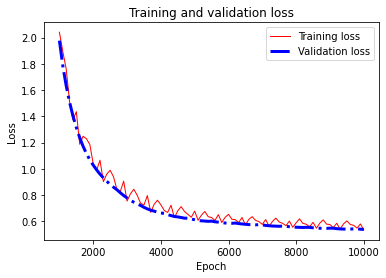

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5351479, Final Validation loss: 0.53839535, Training RMSE: 0.7397285, Validation RMSE: 0.7337543
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.0076187, Validation loss: 3.375113, 
Epoch: 2000, Training loss: 1.5437437, Validation loss: 1.6984092, 
Epoch: 3000, Training loss: 0.97096133, Validation loss: 1.0813174, 
Epoch: 4000, Training loss: 0.82790107, Validation loss: 0.83123225, 
Epoch: 5000, Training loss: 0.7427878, Validation loss: 0.7076473, 
Epoch: 6000, Training loss: 0.69808125, Validation loss: 0.64464164, 
Epoch: 7000, Training loss: 0.5944246, Validation loss: 0.6131144, 
Epoch: 8000, Training loss: 0.61919594, Validation loss: 0.5905753, 
Epoch: 9000, Training loss: 0.58448493, Validation loss: 0.5803358, 
Epoch: 10000, Training 

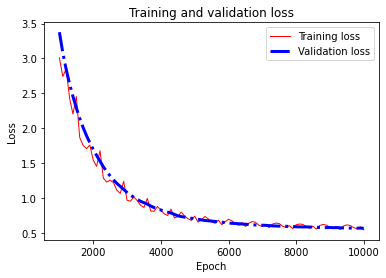

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54583657, Final Validation loss: 0.5690954, Training RMSE: 0.74687463, Validation RMSE: 0.7543841
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.55898, Validation loss: 4.094988, 
Epoch: 2000, Training loss: 1.7430209, Validation loss: 1.9917029, 
Epoch: 3000, Training loss: 1.1254644, Validation loss: 1.3133936, 
Epoch: 4000, Training loss: 0.9159503, Validation loss: 0.9917889, 
Epoch: 5000, Training loss: 0.8803295, Validation loss: 0.8236539, 
Epoch: 6000, Training loss: 0.7989815, Validation loss: 0.7335998, 
Epoch: 7000, Training loss: 0.6591206, Validation loss: 0.6770078, 
Epoch: 8000, Training loss: 0.64600503, Validation loss: 0.6298172, 
Epoch: 9000, Training loss: 0.6230036, Validation loss: 0.60550314, 
Epoch: 10000, Training loss: 

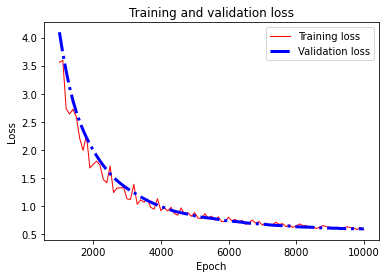

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.572834, Final Validation loss: 0.5917165, Training RMSE: 0.7585701, Validation RMSE: 0.76923114
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 7.126354, Validation loss: 7.5396614, 
Epoch: 2000, Training loss: 2.7875195, Validation loss: 2.6585205, 
Epoch: 3000, Training loss: 1.4711753, Validation loss: 1.5555148, 
Epoch: 4000, Training loss: 1.1489762, Validation loss: 1.1306117, 
Epoch: 5000, Training loss: 0.98725855, Validation loss: 0.861228, 
Epoch: 6000, Training loss: 0.7626843, Validation loss: 0.71017677, 
Epoch: 7000, Training loss: 0.63522786, Validation loss: 0.6332288, 
Epoch: 8000, Training loss: 0.6212201, Validation loss: 0.5991977, 
Epoch: 9000, Training loss: 0.60489225, Validation loss: 0.58211404, 
Epoch: 10000, Training loss

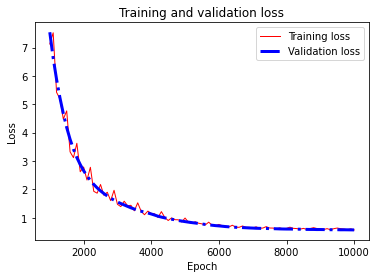

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5684726, Final Validation loss: 0.5686744, Training RMSE: 0.75774306, Validation RMSE: 0.75410503
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.5112499, Validation loss: 1.2736316, 
Epoch: 2000, Training loss: 0.7644036, Validation loss: 0.8071785, 
Epoch: 3000, Training loss: 0.66394615, Validation loss: 0.6729931, 
Epoch: 4000, Training loss: 0.6245237, Validation loss: 0.620713, 
Epoch: 5000, Training loss: 0.6245135, Validation loss: 0.581766, 
Epoch: 6000, Training loss: 0.6240474, Validation loss: 0.5665654, 
Epoch: 7000, Training loss: 0.55945134, Validation loss: 0.5558795, 
Epoch: 8000, Training loss: 0.5774403, Validation loss: 0.543621, 
Epoch: 9000, Training loss: 0.56615627, Validation loss: 0.5402871, 
Epoch: 10000, Training loss:

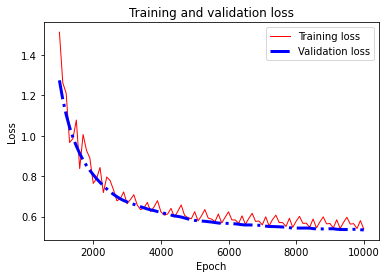

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53873, Final Validation loss: 0.5344598, Training RMSE: 0.73552644, Validation RMSE: 0.7310676
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.4667242, Validation loss: 1.4026692, 
Epoch: 2000, Training loss: 0.9247581, Validation loss: 0.82994324, 
Epoch: 3000, Training loss: 0.69919765, Validation loss: 0.6889151, 
Epoch: 4000, Training loss: 0.6382691, Validation loss: 0.617922, 
Epoch: 5000, Training loss: 0.6238964, Validation loss: 0.5905426, 
Epoch: 6000, Training loss: 0.61247, Validation loss: 0.575375, 
Epoch: 7000, Training loss: 0.5630329, Validation loss: 0.5624413, 
Epoch: 8000, Training loss: 0.5759118, Validation loss: 0.5576166, 
Epoch: 9000, Training loss: 0.577892, Validation loss: 0.55110985, 
Epoch: 10000, Training loss: 0.54

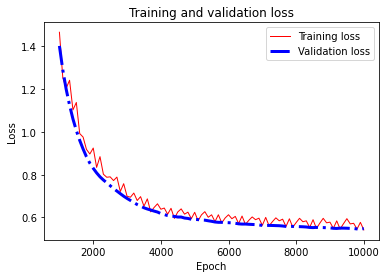

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.541491, Final Validation loss: 0.5476913, Training RMSE: 0.73775977, Validation RMSE: 0.7400617
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.7665455, Validation loss: 1.9516968, 
Epoch: 2000, Training loss: 0.98448455, Validation loss: 1.0330079, 
Epoch: 3000, Training loss: 0.7335057, Validation loss: 0.761009, 
Epoch: 4000, Training loss: 0.67037773, Validation loss: 0.6516875, 
Epoch: 5000, Training loss: 0.6590494, Validation loss: 0.60212636, 
Epoch: 6000, Training loss: 0.63551813, Validation loss: 0.583464, 
Epoch: 7000, Training loss: 0.57777864, Validation loss: 0.5676697, 
Epoch: 8000, Training loss: 0.58820117, Validation loss: 0.56008565, 
Epoch: 9000, Training loss: 0.5937196, Validation loss: 0.5474759, 
Epoch: 10000, Training lo

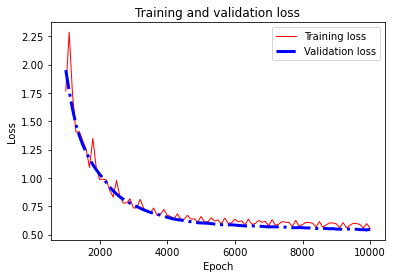

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55328184, Final Validation loss: 0.5451488, Training RMSE: 0.7454767, Validation RMSE: 0.7383419
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.8487914, Validation loss: 1.9798322, 
Epoch: 2000, Training loss: 1.1261045, Validation loss: 1.0394495, 
Epoch: 3000, Training loss: 0.797282, Validation loss: 0.7768905, 
Epoch: 4000, Training loss: 0.701563, Validation loss: 0.67339, 
Epoch: 5000, Training loss: 0.6518868, Validation loss: 0.62561893, 
Epoch: 6000, Training loss: 0.6346152, Validation loss: 0.594355, 
Epoch: 7000, Training loss: 0.5793508, Validation loss: 0.5735872, 
Epoch: 8000, Training loss: 0.5847915, Validation loss: 0.5651138, 
Epoch: 9000, Training loss: 0.58525276, Validation loss: 0.5550524, 
Epoch: 10000, Training loss: 0.5

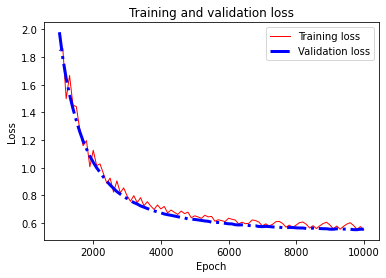

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.549928, Final Validation loss: 0.5548863, Training RMSE: 0.7450352, Validation RMSE: 0.7449069
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.7122471, Validation loss: 3.4740238, 
Epoch: 2000, Training loss: 1.5710237, Validation loss: 1.6054065, 
Epoch: 3000, Training loss: 0.99595046, Validation loss: 1.0383917, 
Epoch: 4000, Training loss: 0.76873463, Validation loss: 0.81106836, 
Epoch: 5000, Training loss: 0.75224173, Validation loss: 0.7063786, 
Epoch: 6000, Training loss: 0.70259726, Validation loss: 0.6365308, 
Epoch: 7000, Training loss: 0.6014624, Validation loss: 0.59845906, 
Epoch: 8000, Training loss: 0.5911975, Validation loss: 0.5771915, 
Epoch: 9000, Training loss: 0.58570427, Validation loss: 0.56343126, 
Epoch: 10000, Training

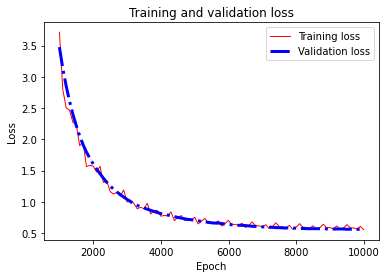

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5499589, Final Validation loss: 0.5609416, Training RMSE: 0.75089, Validation RMSE: 0.7489603
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.74370927 

Average Validation RMSE for the 10 folds: 0.7436473 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 6.713548, Validation loss: 7.2486615, 
Epoch: 2000, Training loss: 2.534963, Validation loss: 2.543092, 
Epoch: 3000, Training loss: 1.4630005, Validation loss: 1.5682868, 
Epoch: 4000, Training loss: 0.999884, Validation loss: 1.0580789, 
Epoch: 5000, Training loss

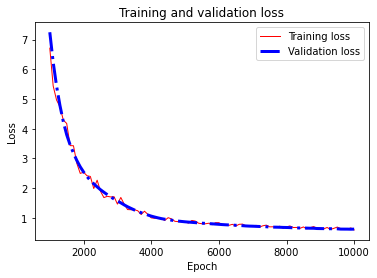

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5935312, Final Validation loss: 0.620359, Training RMSE: 0.78234273, Validation RMSE: 0.7876287
-------------------------------------------------------------------------------------


Fold 2, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.74568737, Validation loss: 0.7059986, 
Epoch: 2000, Training loss: 0.62697005, Validation loss: 0.6130844, 
Epoch: 3000, Training loss: 0.58118844, Validation loss: 0.57947206, 
Epoch: 4000, Training loss: 0.5824321, Validation loss: 0.5605179, 
Epoch: 5000, Training loss: 0.57517934, Validation loss: 0.5459704, 
Epoch: 6000, Training loss: 0.59804606, Validation loss: 0.5351439, 
Epoch: 7000, Training loss: 0.5357727, Validation loss: 0.52863455, 
Epoch: 8000, Training loss: 0.5606256, Validation loss: 0.52365977, 
Epoch: 9000, Training loss: 0.559615, Validation loss: 0.52354664, 
Epoch: 10000, Training

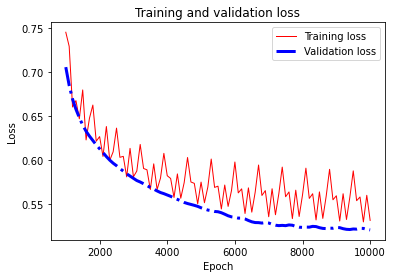

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53160286, Final Validation loss: 0.52078104, Training RMSE: 0.7281407, Validation RMSE: 0.7216516
-------------------------------------------------------------------------------------


Fold 3, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 3.827258, Validation loss: 3.8017247, 
Epoch: 2000, Training loss: 1.6804622, Validation loss: 1.6317496, 
Epoch: 3000, Training loss: 0.9595192, Validation loss: 1.0383782, 
Epoch: 4000, Training loss: 0.82315964, Validation loss: 0.82757473, 
Epoch: 5000, Training loss: 0.74975836, Validation loss: 0.7262771, 
Epoch: 6000, Training loss: 0.6908411, Validation loss: 0.659195, 
Epoch: 7000, Training loss: 0.6058927, Validation loss: 0.61382604, 
Epoch: 8000, Training loss: 0.631034, Validation loss: 0.5842972, 
Epoch: 9000, Training loss: 0.6099406, Validation loss: 0.5718099, 
Epoch: 10000, Training loss

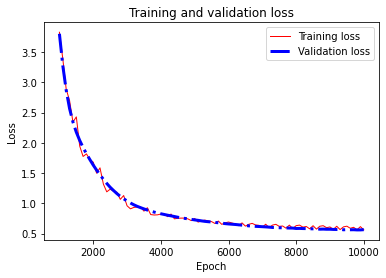

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5610285, Final Validation loss: 0.56451154, Training RMSE: 0.7508775, Validation RMSE: 0.75133985
-------------------------------------------------------------------------------------


Fold 4, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 3.1626384, Validation loss: 3.7764945, 
Epoch: 2000, Training loss: 1.5829417, Validation loss: 1.5024867, 
Epoch: 3000, Training loss: 1.063883, Validation loss: 1.0227103, 
Epoch: 4000, Training loss: 0.85795057, Validation loss: 0.82521766, 
Epoch: 5000, Training loss: 0.72057706, Validation loss: 0.70769334, 
Epoch: 6000, Training loss: 0.69977987, Validation loss: 0.6544291, 
Epoch: 7000, Training loss: 0.6081383, Validation loss: 0.6245138, 
Epoch: 8000, Training loss: 0.6058578, Validation loss: 0.5940084, 
Epoch: 9000, Training loss: 0.6135444, Validation loss: 0.58497566, 
Epoch: 10000, Training 

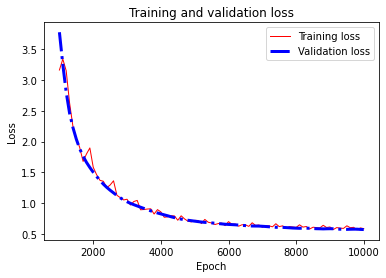

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5858687, Final Validation loss: 0.57157856, Training RMSE: 0.74964684, Validation RMSE: 0.7560282
-------------------------------------------------------------------------------------


Fold 5, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.828526, Validation loss: 2.7093148, 
Epoch: 2000, Training loss: 1.4888976, Validation loss: 1.4786303, 
Epoch: 3000, Training loss: 1.0178616, Validation loss: 1.0037829, 
Epoch: 4000, Training loss: 0.81162405, Validation loss: 0.8205821, 
Epoch: 5000, Training loss: 0.7631812, Validation loss: 0.69815826, 
Epoch: 6000, Training loss: 0.6888698, Validation loss: 0.63911915, 
Epoch: 7000, Training loss: 0.59987056, Validation loss: 0.60070026, 
Epoch: 8000, Training loss: 0.5933634, Validation loss: 0.5785298, 
Epoch: 9000, Training loss: 0.5926524, Validation loss: 0.56676394, 
Epoch: 10000, Training 

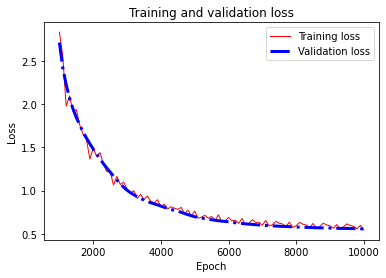

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5455507, Final Validation loss: 0.5576407, Training RMSE: 0.74647605, Validation RMSE: 0.7467534
-------------------------------------------------------------------------------------


Fold 6, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.63213, Validation loss: 2.6898506, 
Epoch: 2000, Training loss: 1.3904412, Validation loss: 1.3075247, 
Epoch: 3000, Training loss: 0.9475091, Validation loss: 0.9415585, 
Epoch: 4000, Training loss: 0.76169527, Validation loss: 0.759969, 
Epoch: 5000, Training loss: 0.70509005, Validation loss: 0.65794873, 
Epoch: 6000, Training loss: 0.6906584, Validation loss: 0.61174613, 
Epoch: 7000, Training loss: 0.60118985, Validation loss: 0.5872631, 
Epoch: 8000, Training loss: 0.61385053, Validation loss: 0.5731933, 
Epoch: 9000, Training loss: 0.6008512, Validation loss: 0.56629443, 
Epoch: 10000, Training lo

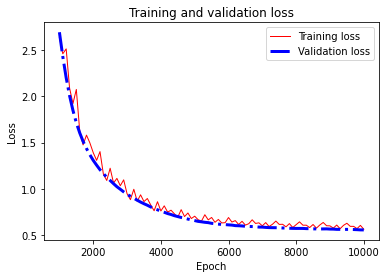

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.56430185, Final Validation loss: 0.55711293, Training RMSE: 0.7548626, Validation RMSE: 0.7464
-------------------------------------------------------------------------------------


Fold 7, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.1966798, Validation loss: 1.186641, 
Epoch: 2000, Training loss: 0.7942581, Validation loss: 0.7500885, 
Epoch: 3000, Training loss: 0.6628134, Validation loss: 0.63678426, 
Epoch: 4000, Training loss: 0.6236041, Validation loss: 0.5878242, 
Epoch: 5000, Training loss: 0.6256257, Validation loss: 0.5643931, 
Epoch: 6000, Training loss: 0.6281812, Validation loss: 0.55306417, 
Epoch: 7000, Training loss: 0.5556281, Validation loss: 0.5453057, 
Epoch: 8000, Training loss: 0.56302595, Validation loss: 0.5404187, 
Epoch: 9000, Training loss: 0.5751177, Validation loss: 0.5352037, 
Epoch: 10000, Training loss: 

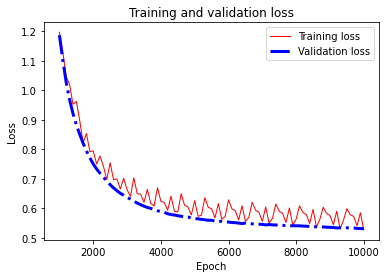

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5264323, Final Validation loss: 0.5309942, Training RMSE: 0.7357925, Validation RMSE: 0.7286935
-------------------------------------------------------------------------------------


Fold 8, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 4.3688154, Validation loss: 4.3837852, 
Epoch: 2000, Training loss: 1.1289352, Validation loss: 1.2426047, 
Epoch: 3000, Training loss: 0.8995331, Validation loss: 0.92068934, 
Epoch: 4000, Training loss: 0.8271696, Validation loss: 0.8253081, 
Epoch: 5000, Training loss: 0.7968138, Validation loss: 0.7493975, 
Epoch: 6000, Training loss: 0.7331687, Validation loss: 0.6753742, 
Epoch: 7000, Training loss: 0.6213922, Validation loss: 0.62252253, 
Epoch: 8000, Training loss: 0.61006933, Validation loss: 0.59585655, 
Epoch: 9000, Training loss: 0.62277836, Validation loss: 0.5794387, 
Epoch: 10000, Training lo

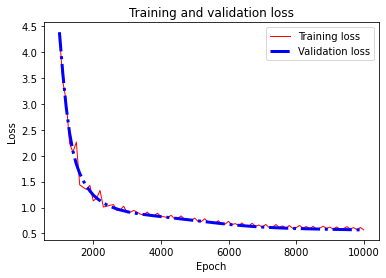

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5690746, Final Validation loss: 0.56796235, Training RMSE: 0.7549865, Validation RMSE: 0.7536328
-------------------------------------------------------------------------------------


Fold 9, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.1785892, Validation loss: 1.2902819, 
Epoch: 2000, Training loss: 0.8178725, Validation loss: 0.81969076, 
Epoch: 3000, Training loss: 0.69694144, Validation loss: 0.6799424, 
Epoch: 4000, Training loss: 0.64057875, Validation loss: 0.62268233, 
Epoch: 5000, Training loss: 0.64110076, Validation loss: 0.5968522, 
Epoch: 6000, Training loss: 0.6455625, Validation loss: 0.5769493, 
Epoch: 7000, Training loss: 0.5579689, Validation loss: 0.55591345, 
Epoch: 8000, Training loss: 0.5735028, Validation loss: 0.54670656, 
Epoch: 9000, Training loss: 0.57322085, Validation loss: 0.5419258, 
Epoch: 10000, Trainin

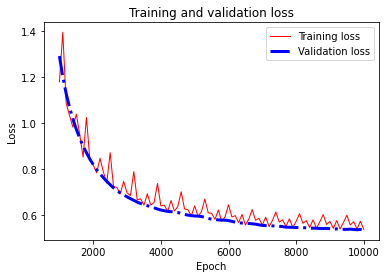

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.538861, Final Validation loss: 0.53650445, Training RMSE: 0.7340379, Validation RMSE: 0.7324646
-------------------------------------------------------------------------------------


Fold 10, lr: 0.001, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 3.3406262, Validation loss: 3.6897717, 
Epoch: 2000, Training loss: 1.7618746, Validation loss: 1.7601942, 
Epoch: 3000, Training loss: 1.1602848, Validation loss: 1.2100455, 
Epoch: 4000, Training loss: 0.94444466, Validation loss: 0.9475269, 
Epoch: 5000, Training loss: 0.84304583, Validation loss: 0.7931459, 
Epoch: 6000, Training loss: 0.73828405, Validation loss: 0.70919544, 
Epoch: 7000, Training loss: 0.6546559, Validation loss: 0.6627118, 
Epoch: 8000, Training loss: 0.64075446, Validation loss: 0.6319712, 
Epoch: 9000, Training loss: 0.64408565, Validation loss: 0.6048835, 
Epoch: 10000, Training 

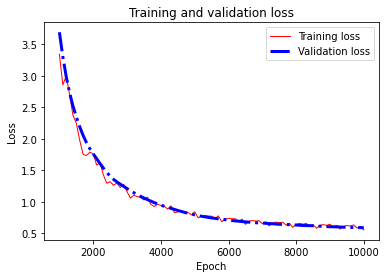

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5542276, Final Validation loss: 0.5900052, Training RMSE: 0.76163954, Validation RMSE: 0.76811796
-------------------------------------------------------------------------------------


For the model with learning rate: 0.001, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7439664 

Average Validation RMSE for the 10 folds: 0.7438816 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6952399, Validation loss: 0.6161299, 
Epoch: 2000, Training loss: 0.5893165, Validation loss: 0.5859862, 
Epoch: 3000, Training loss: 0.62569404, Validation loss: 0.5809871, 
Epoch: 4000, Training loss: 0.5319851, Validation loss: 0.5834803, 
Epoch: 5000, Tra

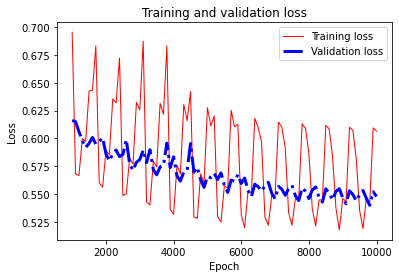

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6064025, Final Validation loss: 0.54781866, Training RMSE: 0.7359863, Validation RMSE: 0.7401477
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6929754, Validation loss: 0.58516896, 
Epoch: 2000, Training loss: 0.54434764, Validation loss: 0.55131, 
Epoch: 3000, Training loss: 0.5977613, Validation loss: 0.555412, 
Epoch: 4000, Training loss: 0.52761817, Validation loss: 0.5443832, 
Epoch: 5000, Training loss: 0.61787605, Validation loss: 0.5512426, 
Epoch: 6000, Training loss: 0.5414638, Validation loss: 0.53919864, 
Epoch: 7000, Training loss: 0.5547355, Validation loss: 0.5497055, 
Epoch: 8000, Training loss: 0.60684913, Validation loss: 0.53062594, 
Epoch: 9000, Training loss: 0.5295343, Validation loss: 0.5293902, 
Epoch: 10000, Training 

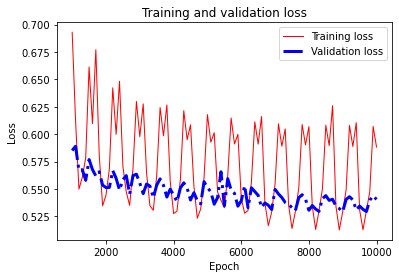

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5882438, Final Validation loss: 0.5405298, Training RMSE: 0.737936, Validation RMSE: 0.7352073
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.652667, Validation loss: 0.5933115, 
Epoch: 2000, Training loss: 0.5602284, Validation loss: 0.57675236, 
Epoch: 3000, Training loss: 0.61443967, Validation loss: 0.58567935, 
Epoch: 4000, Training loss: 0.5423908, Validation loss: 0.5855589, 
Epoch: 5000, Training loss: 0.60533774, Validation loss: 0.56410813, 
Epoch: 6000, Training loss: 0.53988975, Validation loss: 0.5595649, 
Epoch: 7000, Training loss: 0.55365473, Validation loss: 0.5477702, 
Epoch: 8000, Training loss: 0.6116872, Validation loss: 0.5791837, 
Epoch: 9000, Training loss: 0.5361262, Validation loss: 0.5500003, 
Epoch: 10000, Training 

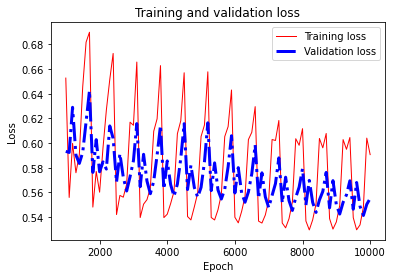

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5906565, Final Validation loss: 0.5551837, Training RMSE: 0.742444, Validation RMSE: 0.7451065
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6090021, Validation loss: 0.5834899, 
Epoch: 2000, Training loss: 0.542718, Validation loss: 0.563587, 
Epoch: 3000, Training loss: 0.5910483, Validation loss: 0.56933963, 
Epoch: 4000, Training loss: 0.51582706, Validation loss: 0.5589796, 
Epoch: 5000, Training loss: 0.62432164, Validation loss: 0.5663131, 
Epoch: 6000, Training loss: 0.53090423, Validation loss: 0.5569326, 
Epoch: 7000, Training loss: 0.5437183, Validation loss: 0.56041783, 
Epoch: 8000, Training loss: 0.6012434, Validation loss: 0.56177133, 
Epoch: 9000, Training loss: 0.5357366, Validation loss: 0.54939336, 
Epoch: 10000, Training l

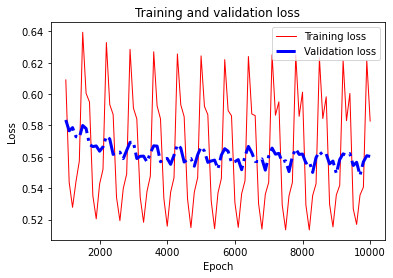

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5827951, Final Validation loss: 0.560286, Training RMSE: 0.73377776, Validation RMSE: 0.7485225
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.64802617, Validation loss: 0.63310087, 
Epoch: 2000, Training loss: 0.5833812, Validation loss: 0.5783389, 
Epoch: 3000, Training loss: 0.62094545, Validation loss: 0.56731784, 
Epoch: 4000, Training loss: 0.53985846, Validation loss: 0.56225413, 
Epoch: 5000, Training loss: 0.60175365, Validation loss: 0.5620748, 
Epoch: 6000, Training loss: 0.5237578, Validation loss: 0.5484332, 
Epoch: 7000, Training loss: 0.5582742, Validation loss: 0.5632045, 
Epoch: 8000, Training loss: 0.5789358, Validation loss: 0.5450978, 
Epoch: 9000, Training loss: 0.5443207, Validation loss: 0.54374313, 
Epoch: 10000, Traini

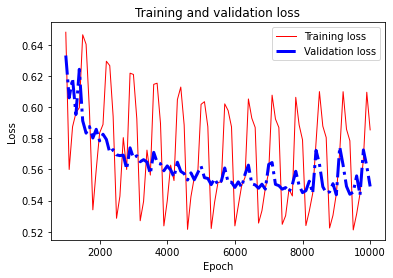

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5853705, Final Validation loss: 0.5490565, Training RMSE: 0.7352963, Validation RMSE: 0.7409834
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.670083, Validation loss: 0.6081342, 
Epoch: 2000, Training loss: 0.56052446, Validation loss: 0.5737182, 
Epoch: 3000, Training loss: 0.5997619, Validation loss: 0.5619302, 
Epoch: 4000, Training loss: 0.57137424, Validation loss: 0.59984785, 
Epoch: 5000, Training loss: 0.61832297, Validation loss: 0.5396724, 
Epoch: 6000, Training loss: 0.5269542, Validation loss: 0.5390376, 
Epoch: 7000, Training loss: 0.54732114, Validation loss: 0.53198564, 
Epoch: 8000, Training loss: 0.59817535, Validation loss: 0.54185194, 
Epoch: 9000, Training loss: 0.5241539, Validation loss: 0.531529, 
Epoch: 10000, Training

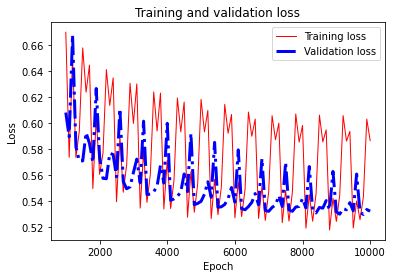

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.586475, Final Validation loss: 0.5321001, Training RMSE: 0.73554075, Validation RMSE: 0.7294519
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6088753, Validation loss: 0.5643534, 
Epoch: 2000, Training loss: 0.5411883, Validation loss: 0.5549559, 
Epoch: 3000, Training loss: 0.6066373, Validation loss: 0.555446, 
Epoch: 4000, Training loss: 0.54294956, Validation loss: 0.5515407, 
Epoch: 5000, Training loss: 0.6113931, Validation loss: 0.5519006, 
Epoch: 6000, Training loss: 0.5216742, Validation loss: 0.5409806, 
Epoch: 7000, Training loss: 0.5406146, Validation loss: 0.531852, 
Epoch: 8000, Training loss: 0.58621323, Validation loss: 0.5417942, 
Epoch: 9000, Training loss: 0.52615774, Validation loss: 0.53738165, 
Epoch: 10000, Training los

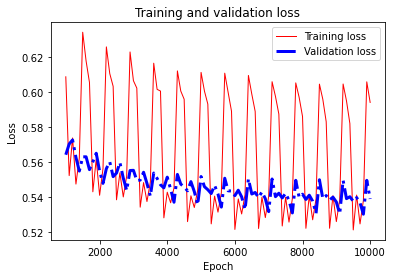

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59424186, Final Validation loss: 0.5390957, Training RMSE: 0.7355725, Validation RMSE: 0.73423135
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.65471387, Validation loss: 0.5950448, 
Epoch: 2000, Training loss: 0.5553467, Validation loss: 0.5511385, 
Epoch: 3000, Training loss: 0.61874264, Validation loss: 0.54645896, 
Epoch: 4000, Training loss: 0.57388896, Validation loss: 0.56634593, 
Epoch: 5000, Training loss: 0.614541, Validation loss: 0.54175925, 
Epoch: 6000, Training loss: 0.5278019, Validation loss: 0.53248686, 
Epoch: 7000, Training loss: 0.54539734, Validation loss: 0.5281485, 
Epoch: 8000, Training loss: 0.6258361, Validation loss: 0.55642605, 
Epoch: 9000, Training loss: 0.5296348, Validation loss: 0.53281206, 
Epoch: 10000, Tra

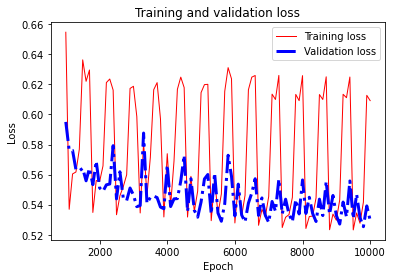

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6092079, Final Validation loss: 0.5296006, Training RMSE: 0.741524, Validation RMSE: 0.72773665
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6403552, Validation loss: 0.59020287, 
Epoch: 2000, Training loss: 0.5567265, Validation loss: 0.5593623, 
Epoch: 3000, Training loss: 0.58974016, Validation loss: 0.553949, 
Epoch: 4000, Training loss: 0.55090517, Validation loss: 0.55236727, 
Epoch: 5000, Training loss: 0.6189392, Validation loss: 0.557146, 
Epoch: 6000, Training loss: 0.5365308, Validation loss: 0.5423855, 
Epoch: 7000, Training loss: 0.5418086, Validation loss: 0.5364839, 
Epoch: 8000, Training loss: 0.6135839, Validation loss: 0.56400394, 
Epoch: 9000, Training loss: 0.53537446, Validation loss: 0.5440406, 
Epoch: 10000, Training l

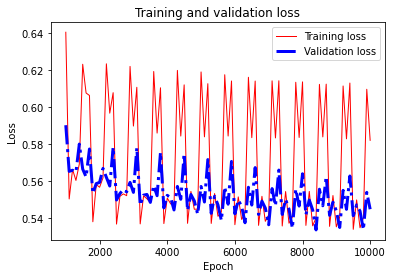

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5820321, Final Validation loss: 0.54487866, Training RMSE: 0.73894405, Validation RMSE: 0.73815894
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.66805035, Validation loss: 0.5771836, 
Epoch: 2000, Training loss: 0.5480155, Validation loss: 0.5659912, 
Epoch: 3000, Training loss: 0.59262556, Validation loss: 0.5871894, 
Epoch: 4000, Training loss: 0.5300894, Validation loss: 0.5613959, 
Epoch: 5000, Training loss: 0.61398494, Validation loss: 0.54272753, 
Epoch: 6000, Training loss: 0.51794106, Validation loss: 0.54532355, 
Epoch: 7000, Training loss: 0.5436073, Validation loss: 0.5372332, 
Epoch: 8000, Training loss: 0.6231509, Validation loss: 0.55261433, 
Epoch: 9000, Training loss: 0.53556514, Validation loss: 0.5440772, 
Epoch: 10000, Tr

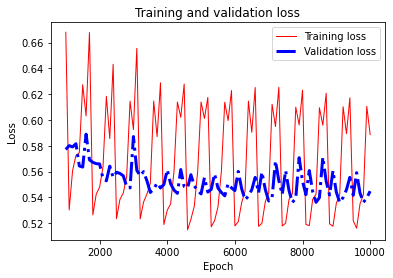

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5887629, Final Validation loss: 0.5448758, Training RMSE: 0.73766494, Validation RMSE: 0.73815703
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.74370646 

Average Validation RMSE for the 10 folds: 0.7436372 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.66065097, Validation loss: 0.6125908, 
Epoch: 2000, Training loss: 0.62769055, Validation loss: 0.5709543, 
Epoch: 3000, Training loss: 0.63384354, Validation loss: 0.5703352, 
Epoch: 4000, Training loss: 0.5281443, Validation loss: 0.54499435, 
Epoch: 500

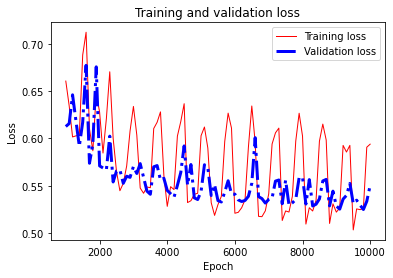

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59393084, Final Validation loss: 0.55034983, Training RMSE: 0.73474747, Validation RMSE: 0.7418557
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6393158, Validation loss: 0.62349105, 
Epoch: 2000, Training loss: 0.5791366, Validation loss: 0.5556671, 
Epoch: 3000, Training loss: 0.5991474, Validation loss: 0.56614405, 
Epoch: 4000, Training loss: 0.62231183, Validation loss: 0.58320737, 
Epoch: 5000, Training loss: 0.61491454, Validation loss: 0.54138815, 
Epoch: 6000, Training loss: 0.534571, Validation loss: 0.52860504, 
Epoch: 7000, Training loss: 0.5439324, Validation loss: 0.52724546, 
Epoch: 8000, Training loss: 0.60064167, Validation loss: 0.55309224, 
Epoch: 9000, Training loss: 0.532308, Validation loss: 0.5216661, 
Epoch: 10000, Tra

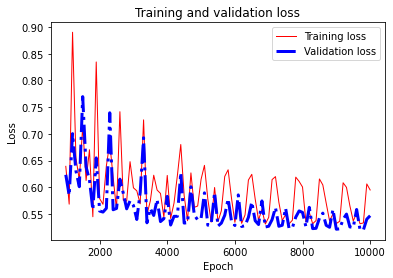

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5951115, Final Validation loss: 0.54693943, Training RMSE: 0.7448027, Validation RMSE: 0.7395535
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.65812474, Validation loss: 0.637645, 
Epoch: 2000, Training loss: 0.5527846, Validation loss: 0.54957294, 
Epoch: 3000, Training loss: 0.73104185, Validation loss: 0.68922055, 
Epoch: 4000, Training loss: 0.59465337, Validation loss: 0.59565836, 
Epoch: 5000, Training loss: 0.5983549, Validation loss: 0.5358505, 
Epoch: 6000, Training loss: 0.54981816, Validation loss: 0.54995555, 
Epoch: 7000, Training loss: 0.54044074, Validation loss: 0.5305184, 
Epoch: 8000, Training loss: 0.58273387, Validation loss: 0.55846035, 
Epoch: 9000, Training loss: 0.5230992, Validation loss: 0.52359426, 
Epoch: 10000, Tr

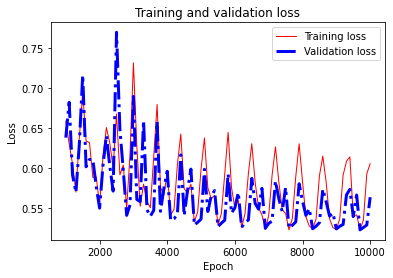

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6052061, Final Validation loss: 0.56324106, Training RMSE: 0.7517174, Validation RMSE: 0.7504939
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6621182, Validation loss: 0.61782765, 
Epoch: 2000, Training loss: 0.56863683, Validation loss: 0.5912517, 
Epoch: 3000, Training loss: 0.64911896, Validation loss: 0.60747594, 
Epoch: 4000, Training loss: 0.634055, Validation loss: 0.57989407, 
Epoch: 5000, Training loss: 0.60447484, Validation loss: 0.5590829, 
Epoch: 6000, Training loss: 0.545366, Validation loss: 0.5530287, 
Epoch: 7000, Training loss: 0.5311323, Validation loss: 0.54525626, 
Epoch: 8000, Training loss: 0.57619834, Validation loss: 0.5552134, 
Epoch: 9000, Training loss: 0.5242143, Validation loss: 0.5382593, 
Epoch: 10000, Trainin

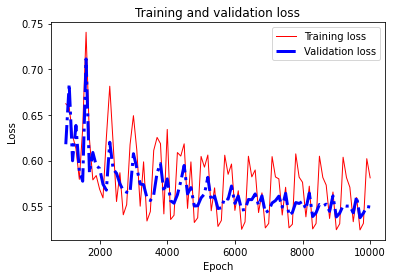

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5810454, Final Validation loss: 0.5490532, Training RMSE: 0.7285273, Validation RMSE: 0.7409812
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7289289, Validation loss: 0.654811, 
Epoch: 2000, Training loss: 1.2788887, Validation loss: 0.7746572, 
Epoch: 3000, Training loss: 0.8065729, Validation loss: 0.7349853, 
Epoch: 4000, Training loss: 0.75613475, Validation loss: 0.6689552, 
Epoch: 5000, Training loss: 0.5977166, Validation loss: 0.55606157, 
Epoch: 6000, Training loss: 0.5290984, Validation loss: 0.5655976, 
Epoch: 7000, Training loss: 0.5650864, Validation loss: 0.55869, 
Epoch: 8000, Training loss: 0.5869444, Validation loss: 0.5445762, 
Epoch: 9000, Training loss: 0.5371398, Validation loss: 0.53593975, 
Epoch: 10000, Training loss:

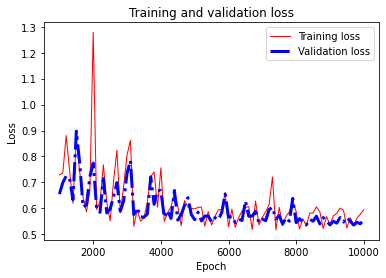

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59427714, Final Validation loss: 0.5586984, Training RMSE: 0.74611276, Validation RMSE: 0.7474613
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6306018, Validation loss: 0.5641698, 
Epoch: 2000, Training loss: 0.5510107, Validation loss: 0.5717378, 
Epoch: 3000, Training loss: 0.6062884, Validation loss: 0.546505, 
Epoch: 4000, Training loss: 0.56864274, Validation loss: 0.550247, 
Epoch: 5000, Training loss: 0.6137978, Validation loss: 0.5469093, 
Epoch: 6000, Training loss: 0.5247933, Validation loss: 0.5240218, 
Epoch: 7000, Training loss: 0.5324355, Validation loss: 0.52125204, 
Epoch: 8000, Training loss: 0.59982353, Validation loss: 0.5352841, 
Epoch: 9000, Training loss: 0.53218764, Validation loss: 0.51932526, 
Epoch: 10000, Training 

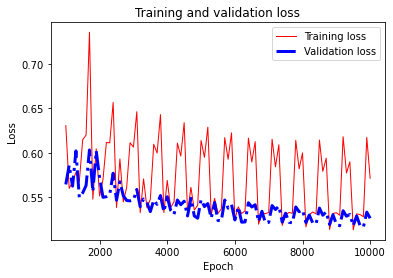

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5711671, Final Validation loss: 0.525936, Training RMSE: 0.731386, Validation RMSE: 0.7252145
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8140936, Validation loss: 0.8073565, 
Epoch: 2000, Training loss: 0.6274519, Validation loss: 0.6732979, 
Epoch: 3000, Training loss: 0.61659133, Validation loss: 0.5827474, 
Epoch: 4000, Training loss: 0.5563501, Validation loss: 0.55202043, 
Epoch: 5000, Training loss: 0.62070036, Validation loss: 0.5462437, 
Epoch: 6000, Training loss: 0.52219707, Validation loss: 0.5364409, 
Epoch: 7000, Training loss: 0.54287946, Validation loss: 0.5308028, 
Epoch: 8000, Training loss: 0.5830798, Validation loss: 0.53251845, 
Epoch: 9000, Training loss: 0.53201693, Validation loss: 0.5315194, 
Epoch: 10000, Training 

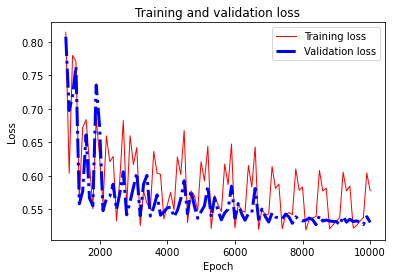

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.57762194, Final Validation loss: 0.5303468, Training RMSE: 0.730676, Validation RMSE: 0.72824913
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.61936957, Validation loss: 0.5722331, 
Epoch: 2000, Training loss: 0.5570133, Validation loss: 0.5555681, 
Epoch: 3000, Training loss: 0.6046092, Validation loss: 0.5440379, 
Epoch: 4000, Training loss: 0.5344167, Validation loss: 0.5506197, 
Epoch: 5000, Training loss: 0.6029717, Validation loss: 0.53899056, 
Epoch: 6000, Training loss: 0.5534745, Validation loss: 0.57497925, 
Epoch: 7000, Training loss: 0.5458406, Validation loss: 0.53295135, 
Epoch: 8000, Training loss: 0.575715, Validation loss: 0.52602166, 
Epoch: 9000, Training loss: 0.5329119, Validation loss: 0.52505845, 
Epoch: 10000, Training

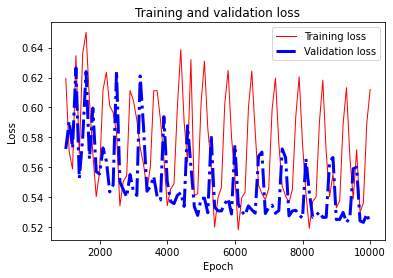

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6120264, Final Validation loss: 0.52241653, Training RMSE: 0.7312929, Validation RMSE: 0.72278386
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.2296343, Validation loss: 1.4994129, 
Epoch: 2000, Training loss: 0.6220402, Validation loss: 0.64633274, 
Epoch: 3000, Training loss: 0.9373781, Validation loss: 0.8467551, 
Epoch: 4000, Training loss: 0.65247416, Validation loss: 0.61746997, 
Epoch: 5000, Training loss: 0.68900424, Validation loss: 0.7873754, 
Epoch: 6000, Training loss: 0.63021064, Validation loss: 0.6276111, 
Epoch: 7000, Training loss: 0.57479376, Validation loss: 0.56434095, 
Epoch: 8000, Training loss: 0.61182445, Validation loss: 0.597135, 
Epoch: 9000, Training loss: 0.5501771, Validation loss: 0.54449946, 
Epoch: 10000, Trai

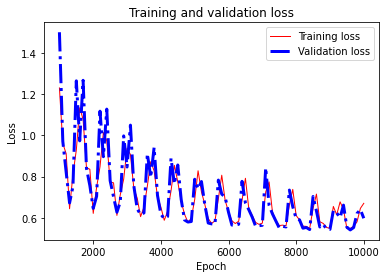

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.67074156, Final Validation loss: 0.5984367, Training RMSE: 0.7721333, Validation RMSE: 0.7735869
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6586138, Validation loss: 0.63801724, 
Epoch: 2000, Training loss: 0.5743871, Validation loss: 0.60462797, 
Epoch: 3000, Training loss: 0.73954767, Validation loss: 0.68417567, 
Epoch: 4000, Training loss: 0.5850685, Validation loss: 0.58500904, 
Epoch: 5000, Training loss: 0.6048118, Validation loss: 0.5498156, 
Epoch: 6000, Training loss: 0.5400858, Validation loss: 0.5422535, 
Epoch: 7000, Training loss: 0.54561406, Validation loss: 0.5310798, 
Epoch: 8000, Training loss: 0.57394075, Validation loss: 0.5363488, 
Epoch: 9000, Training loss: 0.54791176, Validation loss: 0.5350206, 
Epoch: 10000, Trai

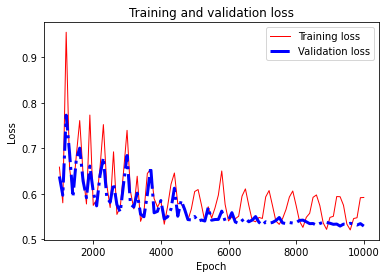

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5917886, Final Validation loss: 0.528788, Training RMSE: 0.72856665, Validation RMSE: 0.7271781
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7435637 

Average Validation RMSE for the 10 folds: 0.74348706 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.69769704, Validation loss: 0.66537553, 
Epoch: 2000, Training loss: 0.5517665, Validation loss: 0.57466274, 
Epoch: 3000, Training loss: 0.63990146, Validation loss: 0.60323143, 
Epoch: 4000, Training loss: 0.5402868, Validation loss: 0.5581616, 
Epoch: 5000

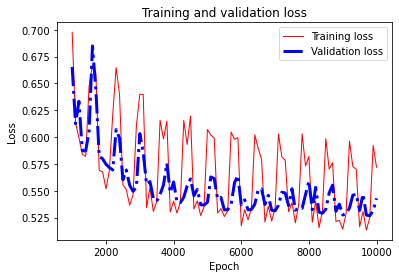

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.571987, Final Validation loss: 0.54288226, Training RMSE: 0.72842777, Validation RMSE: 0.73680544
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.8264488, Validation loss: 0.95124304, 
Epoch: 2000, Training loss: 0.66083777, Validation loss: 0.7017857, 
Epoch: 3000, Training loss: 0.64743286, Validation loss: 0.57722485, 
Epoch: 4000, Training loss: 0.60425335, Validation loss: 0.58091044, 
Epoch: 5000, Training loss: 0.5958643, Validation loss: 0.5366672, 
Epoch: 6000, Training loss: 0.5221383, Validation loss: 0.5286929, 
Epoch: 7000, Training loss: 0.5436952, Validation loss: 0.5331299, 
Epoch: 8000, Training loss: 0.61517817, Validation loss: 0.5309636, 
Epoch: 9000, Training loss: 0.52161336, Validation loss: 0.5178821, 
Epoch: 10000, Trai

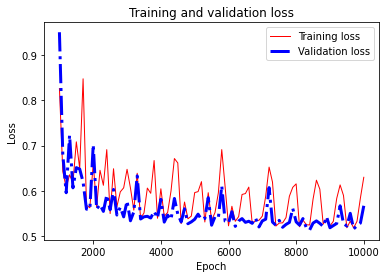

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.62974465, Final Validation loss: 0.5665942, Training RMSE: 0.75478905, Validation RMSE: 0.7527245
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.60260427, Validation loss: 0.56642777, 
Epoch: 2000, Training loss: 0.52247417, Validation loss: 0.53901047, 
Epoch: 3000, Training loss: 0.58760965, Validation loss: 0.5386829, 
Epoch: 4000, Training loss: 0.51137304, Validation loss: 0.5353794, 
Epoch: 5000, Training loss: 0.6015157, Validation loss: 0.5409422, 
Epoch: 6000, Training loss: 0.5177754, Validation loss: 0.5297305, 
Epoch: 7000, Training loss: 0.5274886, Validation loss: 0.5220726, 
Epoch: 8000, Training loss: 0.56897473, Validation loss: 0.52944523, 
Epoch: 9000, Training loss: 0.5121375, Validation loss: 0.51657873, 
Epoch: 10000, Tra

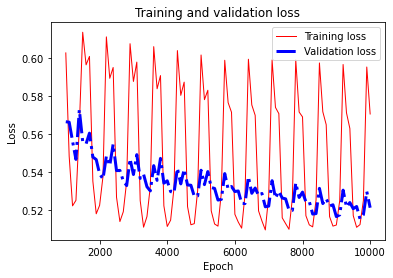

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5705034, Final Validation loss: 0.5212316, Training RMSE: 0.7268652, Validation RMSE: 0.7219637
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.59359944, Validation loss: 0.5702753, 
Epoch: 2000, Training loss: 0.5314038, Validation loss: 0.5437566, 
Epoch: 3000, Training loss: 0.5862111, Validation loss: 0.5590124, 
Epoch: 4000, Training loss: 0.5493128, Validation loss: 0.56921405, 
Epoch: 5000, Training loss: 0.6060199, Validation loss: 0.54765093, 
Epoch: 6000, Training loss: 0.54483205, Validation loss: 0.54267484, 
Epoch: 7000, Training loss: 0.53019965, Validation loss: 0.5384077, 
Epoch: 8000, Training loss: 0.5545614, Validation loss: 0.53356755, 
Epoch: 9000, Training loss: 0.51820666, Validation loss: 0.52575755, 
Epoch: 10000, Train

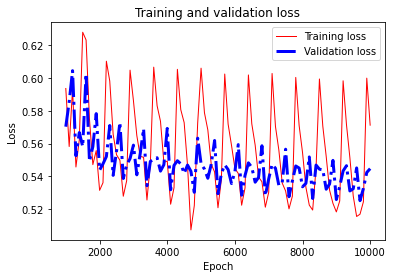

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5712047, Final Validation loss: 0.54464185, Training RMSE: 0.7260842, Validation RMSE: 0.73799855
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.58900833, Validation loss: 0.5668534, 
Epoch: 2000, Training loss: 0.55010444, Validation loss: 0.54855776, 
Epoch: 3000, Training loss: 0.5881293, Validation loss: 0.5503407, 
Epoch: 4000, Training loss: 0.5274271, Validation loss: 0.55641025, 
Epoch: 5000, Training loss: 0.60579985, Validation loss: 0.54730356, 
Epoch: 6000, Training loss: 0.5466212, Validation loss: 0.5452114, 
Epoch: 7000, Training loss: 0.5328211, Validation loss: 0.53616244, 
Epoch: 8000, Training loss: 0.5840975, Validation loss: 0.5382726, 
Epoch: 9000, Training loss: 0.52526546, Validation loss: 0.529405, 
Epoch: 10000, Train

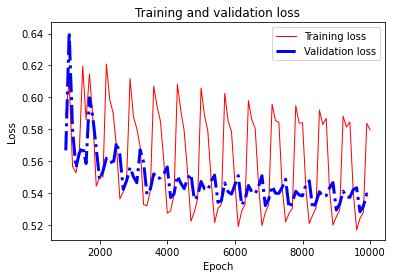

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5795751, Final Validation loss: 0.5372058, Training RMSE: 0.72800976, Validation RMSE: 0.73294324
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 3.9248376, Validation loss: 3.9349186, 
Epoch: 2000, Training loss: 0.7828433, Validation loss: 0.81148005, 
Epoch: 3000, Training loss: 1.3925929, Validation loss: 1.675386, 
Epoch: 4000, Training loss: 1.617519, Validation loss: 1.128415, 
Epoch: 5000, Training loss: 0.6545005, Validation loss: 0.5507635, 
Epoch: 6000, Training loss: 0.57440704, Validation loss: 0.5654775, 
Epoch: 7000, Training loss: 0.5952038, Validation loss: 0.5587111, 
Epoch: 8000, Training loss: 0.58443946, Validation loss: 0.53301555, 
Epoch: 9000, Training loss: 0.54002607, Validation loss: 0.53451365, 
Epoch: 10000, Training 

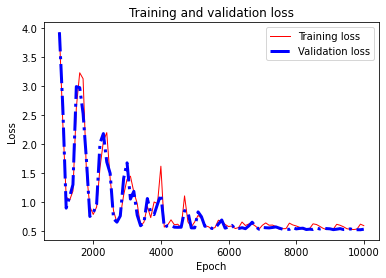

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58981776, Final Validation loss: 0.52744514, Training RMSE: 0.7334224, Validation RMSE: 0.72625417
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.5984482, Validation loss: 0.55542654, 
Epoch: 2000, Training loss: 0.52775335, Validation loss: 0.54727703, 
Epoch: 3000, Training loss: 0.60891056, Validation loss: 0.5691486, 
Epoch: 4000, Training loss: 0.55157775, Validation loss: 0.5539373, 
Epoch: 5000, Training loss: 0.6114854, Validation loss: 0.53878313, 
Epoch: 6000, Training loss: 0.5564888, Validation loss: 0.55479467, 
Epoch: 7000, Training loss: 0.5265, Validation loss: 0.52523357, 
Epoch: 8000, Training loss: 0.5763895, Validation loss: 0.53097564, 
Epoch: 9000, Training loss: 0.51512253, Validation loss: 0.5279591, 
Epoch: 10000, Trai

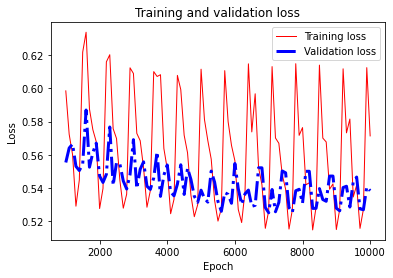

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5713992, Final Validation loss: 0.53847116, Training RMSE: 0.73230934, Validation RMSE: 0.73380595
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.78913695, Validation loss: 0.6751827, 
Epoch: 2000, Training loss: 0.6348872, Validation loss: 0.64632475, 
Epoch: 3000, Training loss: 0.6990967, Validation loss: 0.6819087, 
Epoch: 4000, Training loss: 0.53041124, Validation loss: 0.55175596, 
Epoch: 5000, Training loss: 0.6095742, Validation loss: 0.53368807, 
Epoch: 6000, Training loss: 0.55127275, Validation loss: 0.54919046, 
Epoch: 7000, Training loss: 0.53212184, Validation loss: 0.5122136, 
Epoch: 8000, Training loss: 0.5696035, Validation loss: 0.5391823, 
Epoch: 9000, Training loss: 0.526436, Validation loss: 0.5185228, 
Epoch: 10000, Trai

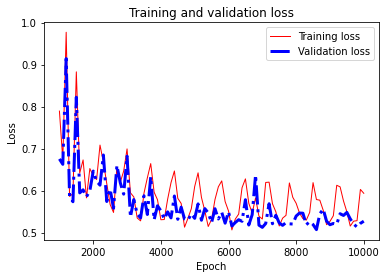

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59338367, Final Validation loss: 0.5269477, Training RMSE: 0.7417256, Validation RMSE: 0.7259116
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.60683274, Validation loss: 0.5718595, 
Epoch: 2000, Training loss: 0.5425581, Validation loss: 0.54339474, 
Epoch: 3000, Training loss: 0.6035273, Validation loss: 0.57743686, 
Epoch: 4000, Training loss: 0.5552381, Validation loss: 0.5487066, 
Epoch: 5000, Training loss: 0.5973721, Validation loss: 0.54706544, 
Epoch: 6000, Training loss: 0.5156721, Validation loss: 0.5304133, 
Epoch: 7000, Training loss: 0.5269747, Validation loss: 0.52008253, 
Epoch: 8000, Training loss: 0.57192826, Validation loss: 0.5318859, 
Epoch: 9000, Training loss: 0.51897764, Validation loss: 0.52896637, 
Epoch: 10000, Train

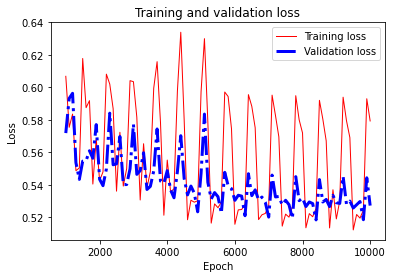

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.57932377, Final Validation loss: 0.52717614, Training RMSE: 0.72613436, Validation RMSE: 0.726069
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.64739436, Validation loss: 0.5703499, 
Epoch: 2000, Training loss: 0.5320055, Validation loss: 0.5402203, 
Epoch: 3000, Training loss: 0.58976823, Validation loss: 0.5497346, 
Epoch: 4000, Training loss: 0.52115524, Validation loss: 0.53898805, 
Epoch: 5000, Training loss: 0.59235686, Validation loss: 0.5342484, 
Epoch: 6000, Training loss: 0.52154917, Validation loss: 0.52370435, 
Epoch: 7000, Training loss: 0.5241755, Validation loss: 0.5212578, 
Epoch: 8000, Training loss: 0.5777079, Validation loss: 0.54323554, 
Epoch: 9000, Training loss: 0.50968546, Validation loss: 0.5246308, 
Epoch: 10000, Tr

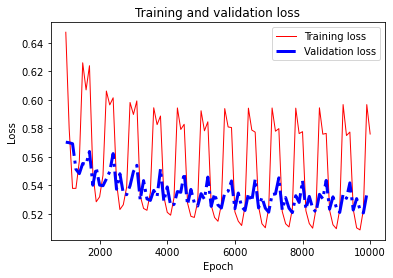

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.576045, Final Validation loss: 0.53445995, Training RMSE: 0.72759134, Validation RMSE: 0.73106766
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.74315536 

Average Validation RMSE for the 10 folds: 0.7430822 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7079656, Validation loss: 0.66938734, 
Epoch: 2000, Training loss: 0.5547297, Validation loss: 0.58848196, 
Epoch: 3000, Training loss: 0.5950153, Validation loss: 0.57000715, 
Epoch: 4000, Training loss: 0.5390224, Validation loss: 0.55807495, 
Epoch: 5000, 

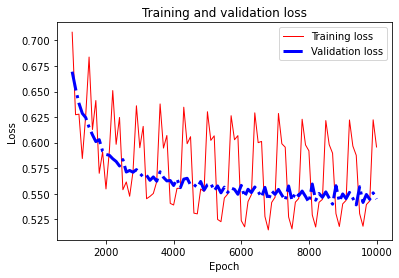

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59575266, Final Validation loss: 0.54489124, Training RMSE: 0.73850936, Validation RMSE: 0.73816746
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.93675953, Validation loss: 0.74628377, 
Epoch: 2000, Training loss: 0.5972105, Validation loss: 0.6356485, 
Epoch: 3000, Training loss: 0.6559305, Validation loss: 0.58834445, 
Epoch: 4000, Training loss: 0.5707674, Validation loss: 0.5747349, 
Epoch: 5000, Training loss: 0.63641495, Validation loss: 0.5570338, 
Epoch: 6000, Training loss: 0.5383071, Validation loss: 0.54832965, 
Epoch: 7000, Training loss: 0.553184, Validation loss: 0.55010855, 
Epoch: 8000, Training loss: 0.60689473, Validation loss: 0.5423965, 
Epoch: 9000, Training loss: 0.54283816, Validation loss: 0.53437996, 
Epoch: 10000, Train

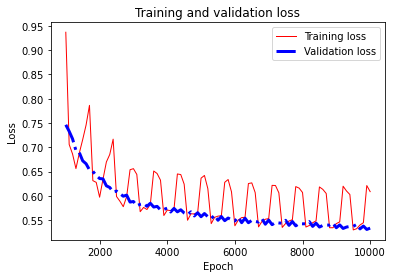

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60863847, Final Validation loss: 0.533567, Training RMSE: 0.7390129, Validation RMSE: 0.7304567
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8658956, Validation loss: 0.793542, 
Epoch: 2000, Training loss: 0.608325, Validation loss: 0.6663735, 
Epoch: 3000, Training loss: 0.6638971, Validation loss: 0.6110296, 
Epoch: 4000, Training loss: 0.55295646, Validation loss: 0.58775747, 
Epoch: 5000, Training loss: 0.6623799, Validation loss: 0.5731339, 
Epoch: 6000, Training loss: 0.52383316, Validation loss: 0.5553436, 
Epoch: 7000, Training loss: 0.5570965, Validation loss: 0.5542412, 
Epoch: 8000, Training loss: 0.6004325, Validation loss: 0.5593958, 
Epoch: 9000, Training loss: 0.53810495, Validation loss: 0.5387131, 
Epoch: 10000, Training loss: 

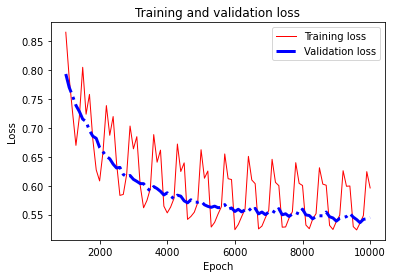

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5961305, Final Validation loss: 0.54486287, Training RMSE: 0.73884517, Validation RMSE: 0.7381483
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.79640526, Validation loss: 0.76233697, 
Epoch: 2000, Training loss: 0.6022563, Validation loss: 0.6393758, 
Epoch: 3000, Training loss: 0.63453186, Validation loss: 0.6053726, 
Epoch: 4000, Training loss: 0.56365883, Validation loss: 0.58540624, 
Epoch: 5000, Training loss: 0.65225327, Validation loss: 0.5719482, 
Epoch: 6000, Training loss: 0.53348804, Validation loss: 0.564246, 
Epoch: 7000, Training loss: 0.5457909, Validation loss: 0.56291, 
Epoch: 8000, Training loss: 0.5943254, Validation loss: 0.5620317, 
Epoch: 9000, Training loss: 0.53566617, Validation loss: 0.5570531, 
Epoch: 10000, Training l

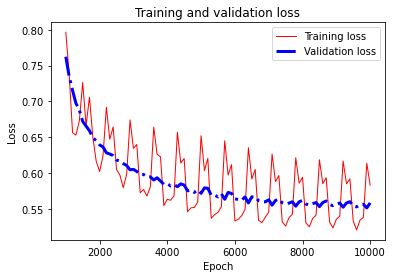

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5833824, Final Validation loss: 0.5585818, Training RMSE: 0.73385364, Validation RMSE: 0.7473833
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.75143516, Validation loss: 0.70973736, 
Epoch: 2000, Training loss: 0.5646517, Validation loss: 0.58543116, 
Epoch: 3000, Training loss: 0.62158644, Validation loss: 0.56569654, 
Epoch: 4000, Training loss: 0.5315344, Validation loss: 0.5596687, 
Epoch: 5000, Training loss: 0.6310791, Validation loss: 0.55469483, 
Epoch: 6000, Training loss: 0.512341, Validation loss: 0.5482601, 
Epoch: 7000, Training loss: 0.54169476, Validation loss: 0.54890215, 
Epoch: 8000, Training loss: 0.5900978, Validation loss: 0.5459328, 
Epoch: 9000, Training loss: 0.5388457, Validation loss: 0.5500552, 
Epoch: 10000, Training 

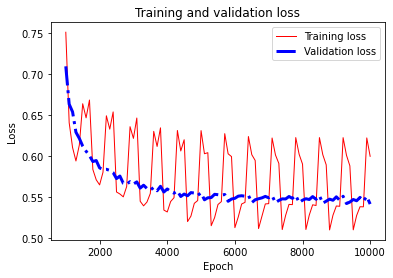

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59962416, Final Validation loss: 0.5412126, Training RMSE: 0.7317452, Validation RMSE: 0.7356715
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.67416084, Validation loss: 0.6372889, 
Epoch: 2000, Training loss: 0.573656, Validation loss: 0.5901281, 
Epoch: 3000, Training loss: 0.63948107, Validation loss: 0.56975615, 
Epoch: 4000, Training loss: 0.5309106, Validation loss: 0.56032073, 
Epoch: 5000, Training loss: 0.6450856, Validation loss: 0.5566272, 
Epoch: 6000, Training loss: 0.52078986, Validation loss: 0.545223, 
Epoch: 7000, Training loss: 0.54269004, Validation loss: 0.5416324, 
Epoch: 8000, Training loss: 0.58810365, Validation loss: 0.5441595, 
Epoch: 9000, Training loss: 0.53167963, Validation loss: 0.5418923, 
Epoch: 10000, Training l

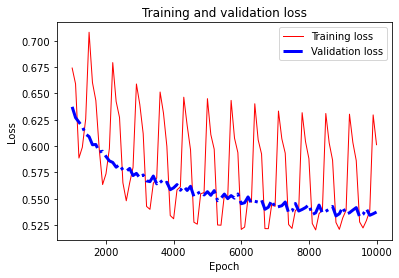

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6013138, Final Validation loss: 0.5373166, Training RMSE: 0.73806435, Validation RMSE: 0.7330188
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.9617036, Validation loss: 0.8817786, 
Epoch: 2000, Training loss: 0.67241657, Validation loss: 0.68529195, 
Epoch: 3000, Training loss: 0.66381717, Validation loss: 0.61744606, 
Epoch: 4000, Training loss: 0.569181, Validation loss: 0.59506005, 
Epoch: 5000, Training loss: 0.64389, Validation loss: 0.58596253, 
Epoch: 6000, Training loss: 0.5315578, Validation loss: 0.5612061, 
Epoch: 7000, Training loss: 0.5577923, Validation loss: 0.5558301, 
Epoch: 8000, Training loss: 0.6328701, Validation loss: 0.55513614, 
Epoch: 9000, Training loss: 0.54638696, Validation loss: 0.54686904, 
Epoch: 10000, Training l

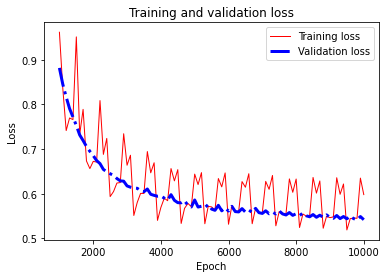

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5979997, Final Validation loss: 0.54174364, Training RMSE: 0.7377075, Validation RMSE: 0.73603237
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.75891733, Validation loss: 0.71829027, 
Epoch: 2000, Training loss: 0.6106919, Validation loss: 0.6154174, 
Epoch: 3000, Training loss: 0.6486397, Validation loss: 0.57451177, 
Epoch: 4000, Training loss: 0.5542741, Validation loss: 0.56014776, 
Epoch: 5000, Training loss: 0.63553387, Validation loss: 0.5625228, 
Epoch: 6000, Training loss: 0.52808344, Validation loss: 0.5507276, 
Epoch: 7000, Training loss: 0.55229574, Validation loss: 0.5457725, 
Epoch: 8000, Training loss: 0.6133747, Validation loss: 0.5387474, 
Epoch: 9000, Training loss: 0.5398857, Validation loss: 0.53361917, 
Epoch: 10000, Trainin

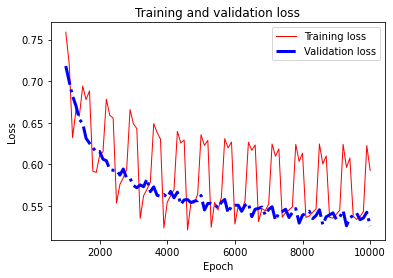

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5926195, Final Validation loss: 0.52561307, Training RMSE: 0.7383517, Validation RMSE: 0.7249918
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6814077, Validation loss: 0.601915, 
Epoch: 2000, Training loss: 0.5570319, Validation loss: 0.57750463, 
Epoch: 3000, Training loss: 0.6293892, Validation loss: 0.56748354, 
Epoch: 4000, Training loss: 0.54066896, Validation loss: 0.5620604, 
Epoch: 5000, Training loss: 0.62662226, Validation loss: 0.56134, 
Epoch: 6000, Training loss: 0.5205737, Validation loss: 0.5536761, 
Epoch: 7000, Training loss: 0.54619074, Validation loss: 0.54393905, 
Epoch: 8000, Training loss: 0.59981626, Validation loss: 0.54739225, 
Epoch: 9000, Training loss: 0.52774334, Validation loss: 0.5434068, 
Epoch: 10000, Training l

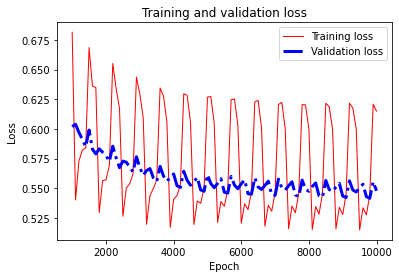

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.61492616, Final Validation loss: 0.54784334, Training RMSE: 0.7383253, Validation RMSE: 0.7401644
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8149709, Validation loss: 0.7803786, 
Epoch: 2000, Training loss: 0.6543734, Validation loss: 0.6577298, 
Epoch: 3000, Training loss: 0.66389775, Validation loss: 0.6045313, 
Epoch: 4000, Training loss: 0.57192934, Validation loss: 0.5802146, 
Epoch: 5000, Training loss: 0.651211, Validation loss: 0.5733501, 
Epoch: 6000, Training loss: 0.5507861, Validation loss: 0.5622237, 
Epoch: 7000, Training loss: 0.5614048, Validation loss: 0.5586059, 
Epoch: 8000, Training loss: 0.6056139, Validation loss: 0.54982626, 
Epoch: 9000, Training loss: 0.54966736, Validation loss: 0.54961896, 
Epoch: 10000, Training l

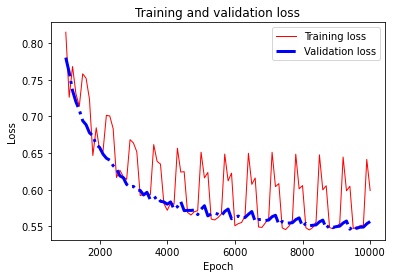

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5988994, Final Validation loss: 0.5565424, Training RMSE: 0.7445226, Validation RMSE: 0.7460177
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.7429674 

Average Validation RMSE for the 10 folds: 0.74286515 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.69811034, Validation loss: 0.6898457, 
Epoch: 2000, Training loss: 0.5989437, Validation loss: 0.6194735, 
Epoch: 3000, Training loss: 0.6602484, Validation loss: 0.58464926, 
Epoch: 4000, Training loss: 0.54317725, Validation loss: 0.5751369, 
Epoch: 5000, Traini

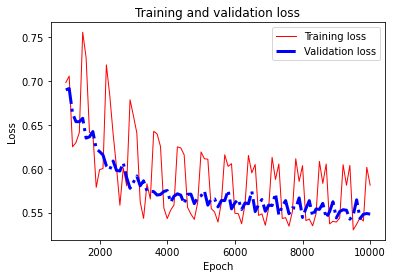

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5812303, Final Validation loss: 0.54822147, Training RMSE: 0.73280656, Validation RMSE: 0.7404198
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.0798669, Validation loss: 1.0200958, 
Epoch: 2000, Training loss: 0.6947864, Validation loss: 0.71047103, 
Epoch: 3000, Training loss: 0.632642, Validation loss: 0.61532277, 
Epoch: 4000, Training loss: 0.55794114, Validation loss: 0.5882399, 
Epoch: 5000, Training loss: 0.6695346, Validation loss: 0.5746448, 
Epoch: 6000, Training loss: 0.5335557, Validation loss: 0.56987387, 
Epoch: 7000, Training loss: 0.57452893, Validation loss: 0.5712507, 
Epoch: 8000, Training loss: 0.58985764, Validation loss: 0.54970527, 
Epoch: 9000, Training loss: 0.5508563, Validation loss: 0.5411697, 
Epoch: 10000, Training 

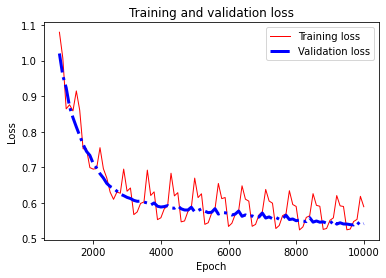

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5890793, Final Validation loss: 0.54140353, Training RMSE: 0.7424967, Validation RMSE: 0.7358013
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.0833265, Validation loss: 0.9685155, 
Epoch: 2000, Training loss: 0.71176326, Validation loss: 0.7126031, 
Epoch: 3000, Training loss: 0.67318684, Validation loss: 0.61937475, 
Epoch: 4000, Training loss: 0.5641129, Validation loss: 0.5806634, 
Epoch: 5000, Training loss: 0.6533353, Validation loss: 0.55961007, 
Epoch: 6000, Training loss: 0.52664924, Validation loss: 0.5448224, 
Epoch: 7000, Training loss: 0.552814, Validation loss: 0.54134506, 
Epoch: 8000, Training loss: 0.5714588, Validation loss: 0.5429494, 
Epoch: 9000, Training loss: 0.53226775, Validation loss: 0.5440828, 
Epoch: 10000, Training l

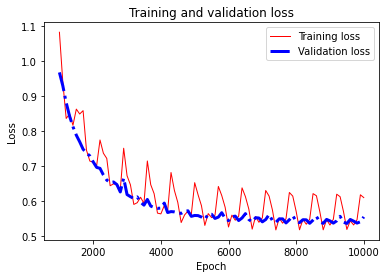

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6106427, Final Validation loss: 0.55555713, Training RMSE: 0.74259055, Validation RMSE: 0.74535704
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.77608293, Validation loss: 0.728542, 
Epoch: 2000, Training loss: 0.58229077, Validation loss: 0.6147981, 
Epoch: 3000, Training loss: 0.62499774, Validation loss: 0.5931432, 
Epoch: 4000, Training loss: 0.5422758, Validation loss: 0.57578963, 
Epoch: 5000, Training loss: 0.68865895, Validation loss: 0.56978047, 
Epoch: 6000, Training loss: 0.562423, Validation loss: 0.5732044, 
Epoch: 7000, Training loss: 0.54873115, Validation loss: 0.5658568, 
Epoch: 8000, Training loss: 0.594542, Validation loss: 0.56491, 
Epoch: 9000, Training loss: 0.53501236, Validation loss: 0.5613576, 
Epoch: 10000, Training lo

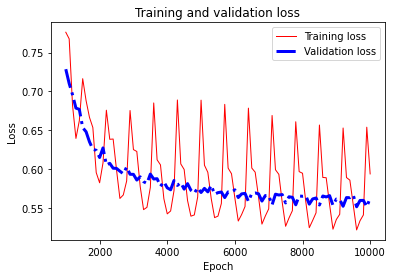

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5937019, Final Validation loss: 0.56250966, Training RMSE: 0.7371478, Validation RMSE: 0.75000644
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.0596138, Validation loss: 1.002229, 
Epoch: 2000, Training loss: 0.659285, Validation loss: 0.7401349, 
Epoch: 3000, Training loss: 0.6610601, Validation loss: 0.63008076, 
Epoch: 4000, Training loss: 0.58840495, Validation loss: 0.5879013, 
Epoch: 5000, Training loss: 0.6126256, Validation loss: 0.5692584, 
Epoch: 6000, Training loss: 0.53890467, Validation loss: 0.55527496, 
Epoch: 7000, Training loss: 0.54287255, Validation loss: 0.5516437, 
Epoch: 8000, Training loss: 0.58214045, Validation loss: 0.5442819, 
Epoch: 9000, Training loss: 0.5332628, Validation loss: 0.53858125, 
Epoch: 10000, Training l

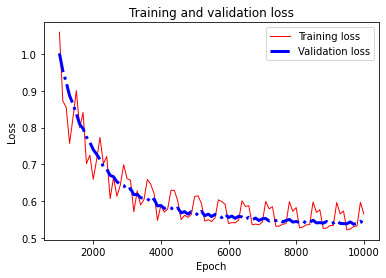

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5653229, Final Validation loss: 0.5379696, Training RMSE: 0.72780716, Validation RMSE: 0.7334641
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.9831194, Validation loss: 0.9711702, 
Epoch: 2000, Training loss: 0.6518014, Validation loss: 0.6876681, 
Epoch: 3000, Training loss: 0.6617525, Validation loss: 0.60571647, 
Epoch: 4000, Training loss: 0.5451592, Validation loss: 0.57323337, 
Epoch: 5000, Training loss: 0.64982903, Validation loss: 0.55575097, 
Epoch: 6000, Training loss: 0.558555, Validation loss: 0.54767084, 
Epoch: 7000, Training loss: 0.5538999, Validation loss: 0.54562956, 
Epoch: 8000, Training loss: 0.5815653, Validation loss: 0.5429015, 
Epoch: 9000, Training loss: 0.5467366, Validation loss: 0.5399399, 
Epoch: 10000, Training lo

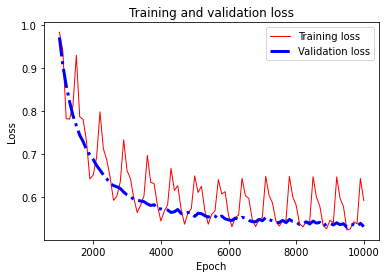

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59235686, Final Validation loss: 0.53206146, Training RMSE: 0.73591715, Validation RMSE: 0.72942543
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.964049, Validation loss: 0.85055256, 
Epoch: 2000, Training loss: 0.61703336, Validation loss: 0.65783066, 
Epoch: 3000, Training loss: 0.6556545, Validation loss: 0.6023313, 
Epoch: 4000, Training loss: 0.56193644, Validation loss: 0.5779107, 
Epoch: 5000, Training loss: 0.6695101, Validation loss: 0.5678409, 
Epoch: 6000, Training loss: 0.52761036, Validation loss: 0.563519, 
Epoch: 7000, Training loss: 0.5518716, Validation loss: 0.5529281, 
Epoch: 8000, Training loss: 0.5964717, Validation loss: 0.54660356, 
Epoch: 9000, Training loss: 0.53475845, Validation loss: 0.5504703, 
Epoch: 10000, Training

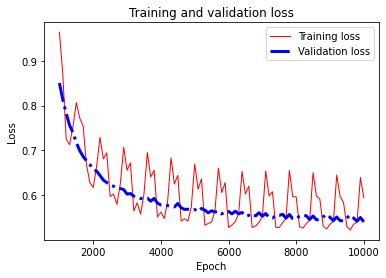

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5941496, Final Validation loss: 0.5402173, Training RMSE: 0.7367171, Validation RMSE: 0.73499477
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7195076, Validation loss: 0.67804474, 
Epoch: 2000, Training loss: 0.60472006, Validation loss: 0.5983589, 
Epoch: 3000, Training loss: 0.62430453, Validation loss: 0.5747193, 
Epoch: 4000, Training loss: 0.54756296, Validation loss: 0.56710297, 
Epoch: 5000, Training loss: 0.6425608, Validation loss: 0.5570722, 
Epoch: 6000, Training loss: 0.5112525, Validation loss: 0.5497721, 
Epoch: 7000, Training loss: 0.5511174, Validation loss: 0.54019296, 
Epoch: 8000, Training loss: 0.59323525, Validation loss: 0.53453606, 
Epoch: 9000, Training loss: 0.5337128, Validation loss: 0.53075796, 
Epoch: 10000, Trainin

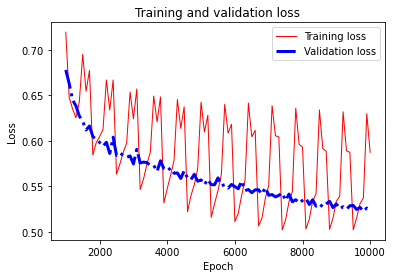

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58747023, Final Validation loss: 0.5232028, Training RMSE: 0.73522174, Validation RMSE: 0.7233276
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.9250774, Validation loss: 0.8818183, 
Epoch: 2000, Training loss: 0.6871169, Validation loss: 0.6408461, 
Epoch: 3000, Training loss: 0.64783067, Validation loss: 0.5918818, 
Epoch: 4000, Training loss: 0.5743999, Validation loss: 0.57232475, 
Epoch: 5000, Training loss: 0.64588135, Validation loss: 0.565435, 
Epoch: 6000, Training loss: 0.5197611, Validation loss: 0.5561418, 
Epoch: 7000, Training loss: 0.54816306, Validation loss: 0.5385662, 
Epoch: 8000, Training loss: 0.5808221, Validation loss: 0.53663176, 
Epoch: 9000, Training loss: 0.53933716, Validation loss: 0.5390962, 
Epoch: 10000, Training l

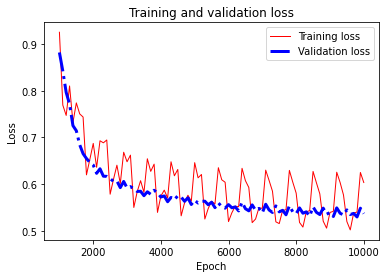

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6033769, Final Validation loss: 0.53687894, Training RMSE: 0.7336119, Validation RMSE: 0.73272026
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.9775113, Validation loss: 0.81512296, 
Epoch: 2000, Training loss: 0.64008147, Validation loss: 0.6370242, 
Epoch: 3000, Training loss: 0.6364718, Validation loss: 0.58749264, 
Epoch: 4000, Training loss: 0.56983745, Validation loss: 0.55502325, 
Epoch: 5000, Training loss: 0.6183385, Validation loss: 0.5518548, 
Epoch: 6000, Training loss: 0.5487179, Validation loss: 0.54900664, 
Epoch: 7000, Training loss: 0.539554, Validation loss: 0.53345245, 
Epoch: 8000, Training loss: 0.5836594, Validation loss: 0.5338526, 
Epoch: 9000, Training loss: 0.53872955, Validation loss: 0.53264487, 
Epoch: 10000, Traini

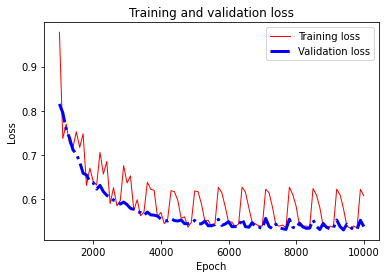

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6076771, Final Validation loss: 0.537892, Training RMSE: 0.7321088, Validation RMSE: 0.7334112
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7427148 

Average Validation RMSE for the 10 folds: 0.7426247 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.9233546, Validation loss: 1.7053508, 
Epoch: 2000, Training loss: 0.88102144, Validation loss: 0.90370756, 
Epoch: 3000, Training loss: 0.78408575, Validation loss: 0.7335996, 
Epoch: 4000, Training loss: 0.61945057, Validation loss: 0.65809155, 
Epoch: 5000, Traini

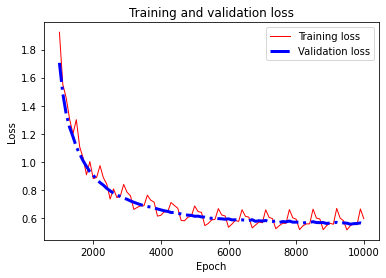

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5954783, Final Validation loss: 0.558238, Training RMSE: 0.7394483, Validation RMSE: 0.7471533
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.1718402, Validation loss: 2.1154501, 
Epoch: 2000, Training loss: 0.9355956, Validation loss: 1.040042, 
Epoch: 3000, Training loss: 0.8038632, Validation loss: 0.73595303, 
Epoch: 4000, Training loss: 0.63565534, Validation loss: 0.63383317, 
Epoch: 5000, Training loss: 0.68316364, Validation loss: 0.572615, 
Epoch: 6000, Training loss: 0.5340092, Validation loss: 0.5641263, 
Epoch: 7000, Training loss: 0.54681784, Validation loss: 0.5509768, 
Epoch: 8000, Training loss: 0.5841059, Validation loss: 0.5380876, 
Epoch: 9000, Training loss: 0.5386926, Validation loss: 0.53613, 
Epoch: 10000, Training loss: 0.

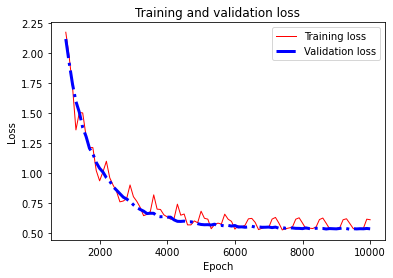

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6120196, Final Validation loss: 0.53659344, Training RMSE: 0.73431975, Validation RMSE: 0.7325254
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7166773, Validation loss: 0.63185596, 
Epoch: 2000, Training loss: 0.5482651, Validation loss: 0.5639005, 
Epoch: 3000, Training loss: 0.6155966, Validation loss: 0.5492545, 
Epoch: 4000, Training loss: 0.5274663, Validation loss: 0.5401237, 
Epoch: 5000, Training loss: 0.6654696, Validation loss: 0.55087554, 
Epoch: 6000, Training loss: 0.5143354, Validation loss: 0.54032356, 
Epoch: 7000, Training loss: 0.54265714, Validation loss: 0.5412854, 
Epoch: 8000, Training loss: 0.58106, Validation loss: 0.5408411, 
Epoch: 9000, Training loss: 0.53569114, Validation loss: 0.5309738, 
Epoch: 10000, Training los

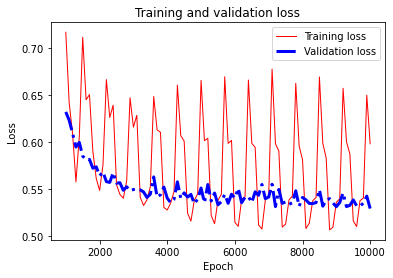

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5979629, Final Validation loss: 0.52900785, Training RMSE: 0.7292952, Validation RMSE: 0.72732925
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7393764, Validation loss: 0.7363297, 
Epoch: 2000, Training loss: 0.6356595, Validation loss: 0.6551494, 
Epoch: 3000, Training loss: 0.6419999, Validation loss: 0.6083201, 
Epoch: 4000, Training loss: 0.55824226, Validation loss: 0.58600897, 
Epoch: 5000, Training loss: 0.64904267, Validation loss: 0.5782122, 
Epoch: 6000, Training loss: 0.5380002, Validation loss: 0.5671182, 
Epoch: 7000, Training loss: 0.55762464, Validation loss: 0.57422644, 
Epoch: 8000, Training loss: 0.58133924, Validation loss: 0.55882853, 
Epoch: 9000, Training loss: 0.53386027, Validation loss: 0.54939204, 
Epoch: 10000, Traini

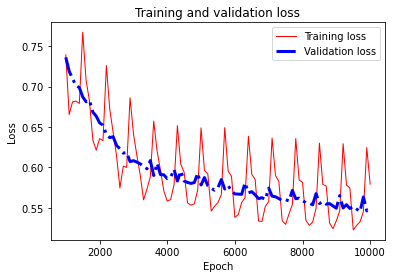

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5792655, Final Validation loss: 0.55010253, Training RMSE: 0.7327338, Validation RMSE: 0.74168897
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7179368, Validation loss: 0.78815484, 
Epoch: 2000, Training loss: 0.5985596, Validation loss: 0.6017898, 
Epoch: 3000, Training loss: 0.6092555, Validation loss: 0.57057226, 
Epoch: 4000, Training loss: 0.5333576, Validation loss: 0.5727307, 
Epoch: 5000, Training loss: 0.6625472, Validation loss: 0.55380315, 
Epoch: 6000, Training loss: 0.5304365, Validation loss: 0.5429638, 
Epoch: 7000, Training loss: 0.5444975, Validation loss: 0.54805267, 
Epoch: 8000, Training loss: 0.5766204, Validation loss: 0.544921, 
Epoch: 9000, Training loss: 0.53710735, Validation loss: 0.53778976, 
Epoch: 10000, Training l

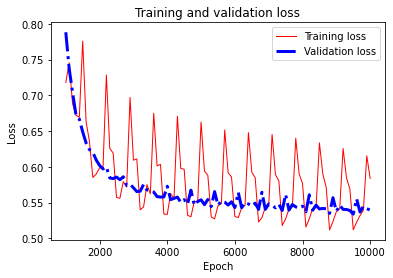

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58367246, Final Validation loss: 0.53932905, Training RMSE: 0.73107857, Validation RMSE: 0.73439026
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6448111, Validation loss: 0.6265203, 
Epoch: 2000, Training loss: 0.565275, Validation loss: 0.58731353, 
Epoch: 3000, Training loss: 0.61674964, Validation loss: 0.56600803, 
Epoch: 4000, Training loss: 0.55827343, Validation loss: 0.56114566, 
Epoch: 5000, Training loss: 0.6298614, Validation loss: 0.5569262, 
Epoch: 6000, Training loss: 0.548394, Validation loss: 0.5455133, 
Epoch: 7000, Training loss: 0.5450485, Validation loss: 0.5509875, 
Epoch: 8000, Training loss: 0.57124686, Validation loss: 0.5433528, 
Epoch: 9000, Training loss: 0.53280014, Validation loss: 0.5426917, 
Epoch: 10000, Training

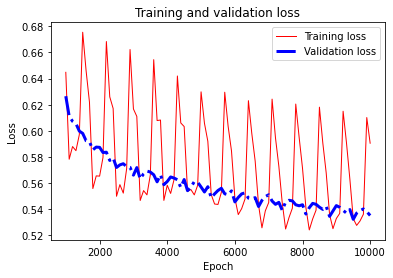

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59048975, Final Validation loss: 0.53510374, Training RMSE: 0.7303075, Validation RMSE: 0.73150784
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.0709654, Validation loss: 1.0455755, 
Epoch: 2000, Training loss: 0.69168365, Validation loss: 0.7579235, 
Epoch: 3000, Training loss: 0.72727174, Validation loss: 0.646882, 
Epoch: 4000, Training loss: 0.6092339, Validation loss: 0.6080499, 
Epoch: 5000, Training loss: 0.6629543, Validation loss: 0.588393, 
Epoch: 6000, Training loss: 0.5714762, Validation loss: 0.5864694, 
Epoch: 7000, Training loss: 0.5531051, Validation loss: 0.56647336, 
Epoch: 8000, Training loss: 0.60109013, Validation loss: 0.580338, 
Epoch: 9000, Training loss: 0.54734105, Validation loss: 0.56159437, 
Epoch: 10000, Training lo

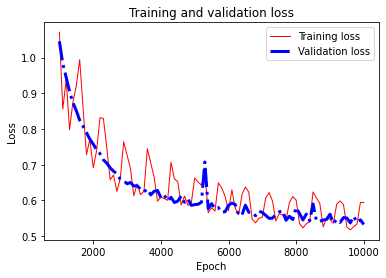

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5942356, Final Validation loss: 0.532831, Training RMSE: 0.7334304, Validation RMSE: 0.72995275
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.99476194, Validation loss: 1.02954, 
Epoch: 2000, Training loss: 0.7249501, Validation loss: 0.76132506, 
Epoch: 3000, Training loss: 0.74231225, Validation loss: 0.67846715, 
Epoch: 4000, Training loss: 0.59881127, Validation loss: 0.6202456, 
Epoch: 5000, Training loss: 0.70814335, Validation loss: 0.5912597, 
Epoch: 6000, Training loss: 0.5380124, Validation loss: 0.5706978, 
Epoch: 7000, Training loss: 0.55964226, Validation loss: 0.550841, 
Epoch: 8000, Training loss: 0.60390073, Validation loss: 0.5466578, 
Epoch: 9000, Training loss: 0.5333408, Validation loss: 0.5373567, 
Epoch: 10000, Training los

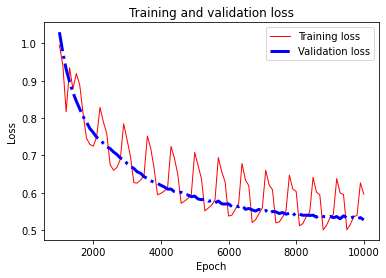

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5965419, Final Validation loss: 0.5277877, Training RMSE: 0.73388183, Validation RMSE: 0.72648996
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.3561499, Validation loss: 1.216912, 
Epoch: 2000, Training loss: 0.76104414, Validation loss: 0.7858878, 
Epoch: 3000, Training loss: 0.7219968, Validation loss: 0.65110874, 
Epoch: 4000, Training loss: 0.59295845, Validation loss: 0.6142939, 
Epoch: 5000, Training loss: 0.66013473, Validation loss: 0.5714658, 
Epoch: 6000, Training loss: 0.5358921, Validation loss: 0.55211425, 
Epoch: 7000, Training loss: 0.54328305, Validation loss: 0.53208697, 
Epoch: 8000, Training loss: 0.57367903, Validation loss: 0.53893673, 
Epoch: 9000, Training loss: 0.52475977, Validation loss: 0.531715, 
Epoch: 10000, Trainin

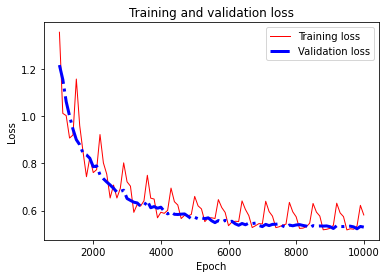

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58143586, Final Validation loss: 0.52989316, Training RMSE: 0.7290046, Validation RMSE: 0.7279376
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.2914915, Validation loss: 1.3079466, 
Epoch: 2000, Training loss: 0.7133822, Validation loss: 0.7592827, 
Epoch: 3000, Training loss: 0.67965466, Validation loss: 0.6481332, 
Epoch: 4000, Training loss: 0.53064626, Validation loss: 0.5974704, 
Epoch: 5000, Training loss: 0.67763853, Validation loss: 0.5865573, 
Epoch: 6000, Training loss: 0.5360265, Validation loss: 0.5666623, 
Epoch: 7000, Training loss: 0.56904346, Validation loss: 0.56793296, 
Epoch: 8000, Training loss: 0.6332988, Validation loss: 0.557009, 
Epoch: 9000, Training loss: 0.5325274, Validation loss: 0.5514136, 
Epoch: 10000, Training l

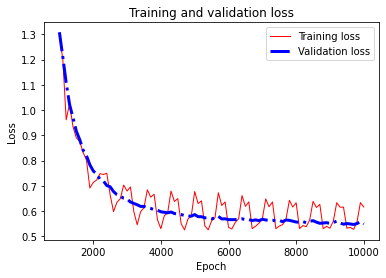

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6166177, Final Validation loss: 0.54907537, Training RMSE: 0.7417828, Validation RMSE: 0.7409962
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.74240863 

Average Validation RMSE for the 10 folds: 0.74233717 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.61967844, Validation loss: 0.5797121, 
Epoch: 2000, Training loss: 0.5503316, Validation loss: 0.5656374, 
Epoch: 3000, Training loss: 0.6054559, Validation loss: 0.5675695, 
Epoch: 4000, Training loss: 0.54498523, Validation loss: 0.56465286, 
Epoch: 5000, T

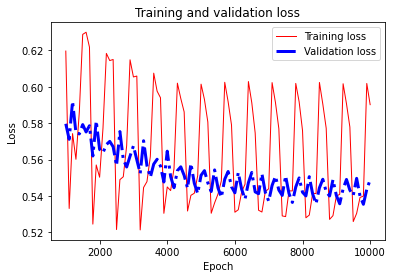

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59021723, Final Validation loss: 0.5489347, Training RMSE: 0.73633, Validation RMSE: 0.7409013
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6402798, Validation loss: 0.57593864, 
Epoch: 2000, Training loss: 0.54466206, Validation loss: 0.55192363, 
Epoch: 3000, Training loss: 0.5905791, Validation loss: 0.55042154, 
Epoch: 4000, Training loss: 0.5328753, Validation loss: 0.5513267, 
Epoch: 5000, Training loss: 0.60746145, Validation loss: 0.5382813, 
Epoch: 6000, Training loss: 0.5144053, Validation loss: 0.5365768, 
Epoch: 7000, Training loss: 0.54458076, Validation loss: 0.52701294, 
Epoch: 8000, Training loss: 0.5775528, Validation loss: 0.52806467, 
Epoch: 9000, Training loss: 0.5233571, Validation loss: 0.5248055, 
Epoch: 10000, Trainin

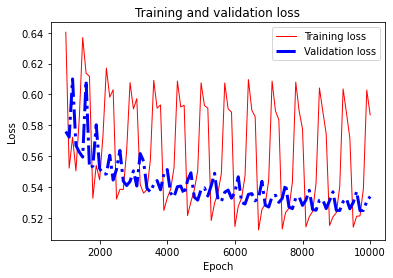

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5867444, Final Validation loss: 0.53383076, Training RMSE: 0.733907, Validation RMSE: 0.73063725
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6799943, Validation loss: 0.6240969, 
Epoch: 2000, Training loss: 0.5657621, Validation loss: 0.59073466, 
Epoch: 3000, Training loss: 0.61899227, Validation loss: 0.5744364, 
Epoch: 4000, Training loss: 0.55763763, Validation loss: 0.5773554, 
Epoch: 5000, Training loss: 0.61076874, Validation loss: 0.54939437, 
Epoch: 6000, Training loss: 0.5495107, Validation loss: 0.55499077, 
Epoch: 7000, Training loss: 0.54685736, Validation loss: 0.5390668, 
Epoch: 8000, Training loss: 0.60828394, Validation loss: 0.56656307, 
Epoch: 9000, Training loss: 0.5367428, Validation loss: 0.5399546, 
Epoch: 10000, Trai

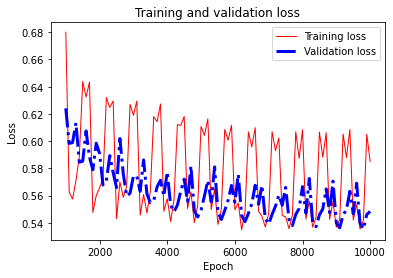

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58504796, Final Validation loss: 0.5483022, Training RMSE: 0.7405419, Validation RMSE: 0.7404743
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.73179376, Validation loss: 0.60818565, 
Epoch: 2000, Training loss: 0.57538164, Validation loss: 0.58505535, 
Epoch: 3000, Training loss: 0.6151334, Validation loss: 0.5845966, 
Epoch: 4000, Training loss: 0.53026164, Validation loss: 0.5817936, 
Epoch: 5000, Training loss: 0.6166324, Validation loss: 0.572263, 
Epoch: 6000, Training loss: 0.53204256, Validation loss: 0.5627832, 
Epoch: 7000, Training loss: 0.54918414, Validation loss: 0.55595756, 
Epoch: 8000, Training loss: 0.6235491, Validation loss: 0.55882263, 
Epoch: 9000, Training loss: 0.5342505, Validation loss: 0.55903894, 
Epoch: 10000, Trai

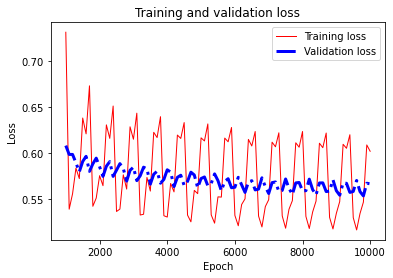

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6020039, Final Validation loss: 0.56648386, Training RMSE: 0.73888034, Validation RMSE: 0.7526512
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.65337735, Validation loss: 0.6088102, 
Epoch: 2000, Training loss: 0.54396504, Validation loss: 0.5645362, 
Epoch: 3000, Training loss: 0.6013696, Validation loss: 0.5680588, 
Epoch: 4000, Training loss: 0.53312445, Validation loss: 0.5610974, 
Epoch: 5000, Training loss: 0.62216896, Validation loss: 0.5499475, 
Epoch: 6000, Training loss: 0.5308481, Validation loss: 0.54764676, 
Epoch: 7000, Training loss: 0.5401872, Validation loss: 0.5400225, 
Epoch: 8000, Training loss: 0.59114987, Validation loss: 0.55798084, 
Epoch: 9000, Training loss: 0.52670807, Validation loss: 0.5406797, 
Epoch: 10000, Trai

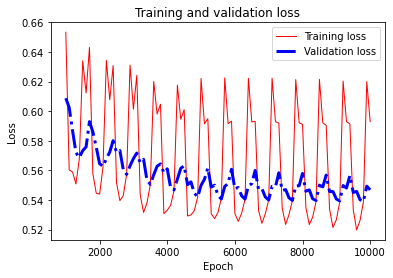

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59298986, Final Validation loss: 0.54686296, Training RMSE: 0.7367896, Validation RMSE: 0.73950183
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6264419, Validation loss: 0.56549835, 
Epoch: 2000, Training loss: 0.5472764, Validation loss: 0.54195976, 
Epoch: 3000, Training loss: 0.59621304, Validation loss: 0.54153776, 
Epoch: 4000, Training loss: 0.51774246, Validation loss: 0.5529846, 
Epoch: 5000, Training loss: 0.5998022, Validation loss: 0.54775935, 
Epoch: 6000, Training loss: 0.5458393, Validation loss: 0.5355001, 
Epoch: 7000, Training loss: 0.54620093, Validation loss: 0.5308495, 
Epoch: 8000, Training loss: 0.6064924, Validation loss: 0.54246324, 
Epoch: 9000, Training loss: 0.5305242, Validation loss: 0.53091615, 
Epoch: 10000, Tr

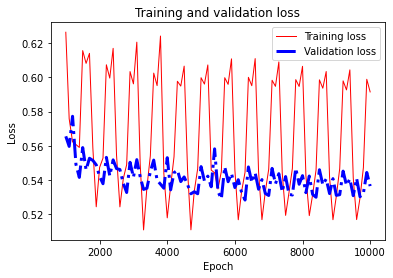

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5914991, Final Validation loss: 0.5363364, Training RMSE: 0.73871017, Validation RMSE: 0.73234993
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6214812, Validation loss: 0.5769301, 
Epoch: 2000, Training loss: 0.5447375, Validation loss: 0.5620636, 
Epoch: 3000, Training loss: 0.6044338, Validation loss: 0.5530873, 
Epoch: 4000, Training loss: 0.54952, Validation loss: 0.566385, 
Epoch: 5000, Training loss: 0.6166984, Validation loss: 0.5531564, 
Epoch: 6000, Training loss: 0.52357614, Validation loss: 0.5485858, 
Epoch: 7000, Training loss: 0.5573256, Validation loss: 0.5432114, 
Epoch: 8000, Training loss: 0.578578, Validation loss: 0.5378246, 
Epoch: 9000, Training loss: 0.5280639, Validation loss: 0.537715, 
Epoch: 10000, Training loss: 0

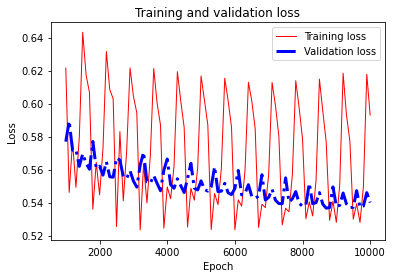

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5930524, Final Validation loss: 0.5400339, Training RMSE: 0.73691666, Validation RMSE: 0.73486996
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6597739, Validation loss: 0.59002554, 
Epoch: 2000, Training loss: 0.5744942, Validation loss: 0.5644727, 
Epoch: 3000, Training loss: 0.6110402, Validation loss: 0.54741997, 
Epoch: 4000, Training loss: 0.5447297, Validation loss: 0.5494437, 
Epoch: 5000, Training loss: 0.6257201, Validation loss: 0.5474, 
Epoch: 6000, Training loss: 0.5187824, Validation loss: 0.5367663, 
Epoch: 7000, Training loss: 0.57496405, Validation loss: 0.53892285, 
Epoch: 8000, Training loss: 0.6190643, Validation loss: 0.5362146, 
Epoch: 9000, Training loss: 0.54182327, Validation loss: 0.53732485, 
Epoch: 10000, Training 

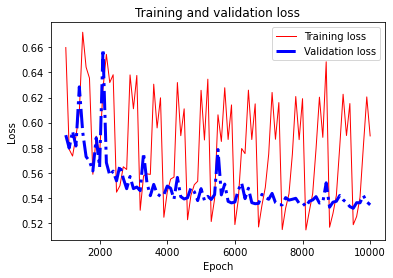

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5894057, Final Validation loss: 0.53450257, Training RMSE: 0.7435278, Validation RMSE: 0.7310968
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.65273076, Validation loss: 0.601958, 
Epoch: 2000, Training loss: 0.5639584, Validation loss: 0.56095695, 
Epoch: 3000, Training loss: 0.6116313, Validation loss: 0.5563037, 
Epoch: 4000, Training loss: 0.5396335, Validation loss: 0.54913175, 
Epoch: 5000, Training loss: 0.6416444, Validation loss: 0.5723306, 
Epoch: 6000, Training loss: 0.5480278, Validation loss: 0.56404555, 
Epoch: 7000, Training loss: 0.55579287, Validation loss: 0.5483397, 
Epoch: 8000, Training loss: 0.6104303, Validation loss: 0.5627516, 
Epoch: 9000, Training loss: 0.54409766, Validation loss: 0.54385656, 
Epoch: 10000, Trainin

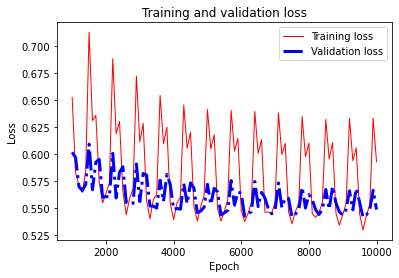

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59329146, Final Validation loss: 0.5489615, Training RMSE: 0.73966336, Validation RMSE: 0.74091935
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6273426, Validation loss: 0.5752087, 
Epoch: 2000, Training loss: 0.5775932, Validation loss: 0.56493825, 
Epoch: 3000, Training loss: 0.59726334, Validation loss: 0.55212027, 
Epoch: 4000, Training loss: 0.54087186, Validation loss: 0.54006386, 
Epoch: 5000, Training loss: 0.6203946, Validation loss: 0.5365083, 
Epoch: 6000, Training loss: 0.53162897, Validation loss: 0.53942233, 
Epoch: 7000, Training loss: 0.5486219, Validation loss: 0.5408165, 
Epoch: 8000, Training loss: 0.57269967, Validation loss: 0.539575, 
Epoch: 9000, Training loss: 0.52246624, Validation loss: 0.5370472, 
Epoch: 10000, Tr

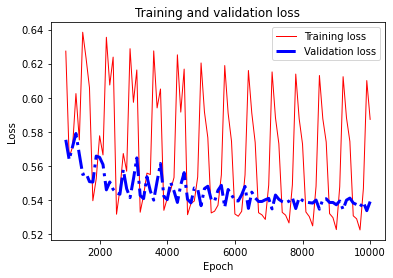

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58724093, Final Validation loss: 0.538932, Training RMSE: 0.73395395, Validation RMSE: 0.7341199
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.7422639 

Average Validation RMSE for the 10 folds: 0.7421892 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6753235, Validation loss: 0.64609796, 
Epoch: 2000, Training loss: 0.62402725, Validation loss: 0.6282945, 
Epoch: 3000, Training loss: 0.6227207, Validation loss: 0.5892567, 
Epoch: 4000, Training loss: 0.5668353, Validation loss: 0.5968058, 
Epoch: 5000, T

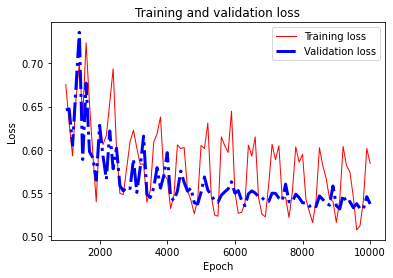

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5844863, Final Validation loss: 0.53753704, Training RMSE: 0.7283434, Validation RMSE: 0.7331692
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 3.019691, Validation loss: 2.6732538, 
Epoch: 2000, Training loss: 1.0599872, Validation loss: 0.998085, 
Epoch: 3000, Training loss: 0.7071092, Validation loss: 0.6774528, 
Epoch: 4000, Training loss: 1.1195972, Validation loss: 0.8476693, 
Epoch: 5000, Training loss: 0.7356495, Validation loss: 0.7181653, 
Epoch: 6000, Training loss: 0.5582463, Validation loss: 0.5562985, 
Epoch: 7000, Training loss: 0.5940957, Validation loss: 0.5592439, 
Epoch: 8000, Training loss: 0.60645336, Validation loss: 0.550405, 
Epoch: 9000, Training loss: 0.5470084, Validation loss: 0.5527255, 
Epoch: 10000, Training loss: 

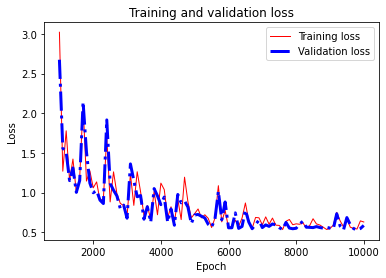

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6297717, Final Validation loss: 0.58625114, Training RMSE: 0.7709539, Validation RMSE: 0.76567036
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.65072566, Validation loss: 0.60380244, 
Epoch: 2000, Training loss: 0.55079114, Validation loss: 0.56529176, 
Epoch: 3000, Training loss: 0.6476456, Validation loss: 0.5568861, 
Epoch: 4000, Training loss: 0.5766609, Validation loss: 0.5959795, 
Epoch: 5000, Training loss: 0.60564786, Validation loss: 0.53729177, 
Epoch: 6000, Training loss: 0.54472536, Validation loss: 0.539892, 
Epoch: 7000, Training loss: 0.5294874, Validation loss: 0.52014947, 
Epoch: 8000, Training loss: 0.5680662, Validation loss: 0.5207886, 
Epoch: 9000, Training loss: 0.51948756, Validation loss: 0.5221509, 
Epoch: 10000, Trai

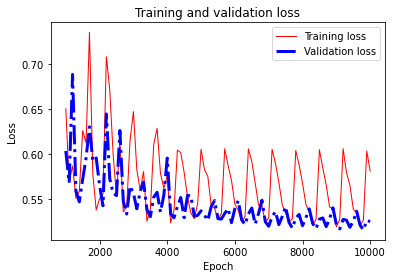

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58146054, Final Validation loss: 0.52537733, Training RMSE: 0.72894293, Validation RMSE: 0.7248292
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.86163217, Validation loss: 0.73534477, 
Epoch: 2000, Training loss: 0.6939431, Validation loss: 0.7087396, 
Epoch: 3000, Training loss: 0.8335335, Validation loss: 0.747514, 
Epoch: 4000, Training loss: 0.61355966, Validation loss: 0.6500627, 
Epoch: 5000, Training loss: 0.6133529, Validation loss: 0.5605249, 
Epoch: 6000, Training loss: 0.5312449, Validation loss: 0.5489966, 
Epoch: 7000, Training loss: 0.5509579, Validation loss: 0.552516, 
Epoch: 8000, Training loss: 0.6224094, Validation loss: 0.54917103, 
Epoch: 9000, Training loss: 0.52766633, Validation loss: 0.5457715, 
Epoch: 10000, Training

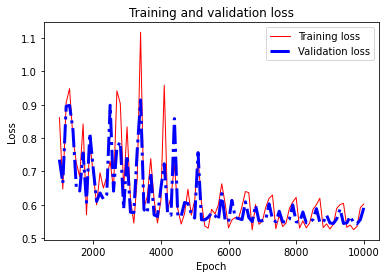

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6023186, Final Validation loss: 0.5910009, Training RMSE: 0.76940167, Validation RMSE: 0.76876587
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6266044, Validation loss: 0.5871899, 
Epoch: 2000, Training loss: 0.5364044, Validation loss: 0.54654515, 
Epoch: 3000, Training loss: 0.6051009, Validation loss: 0.5718063, 
Epoch: 4000, Training loss: 0.5544121, Validation loss: 0.582558, 
Epoch: 5000, Training loss: 0.59027344, Validation loss: 0.54908967, 
Epoch: 6000, Training loss: 0.5084764, Validation loss: 0.544621, 
Epoch: 7000, Training loss: 0.53271836, Validation loss: 0.53697914, 
Epoch: 8000, Training loss: 0.5870868, Validation loss: 0.5500997, 
Epoch: 9000, Training loss: 0.51505136, Validation loss: 0.52890867, 
Epoch: 10000, Trainin

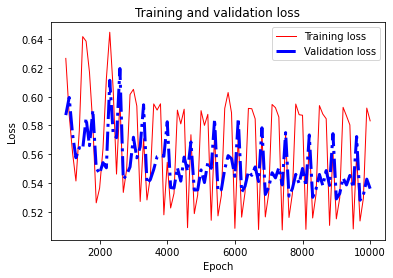

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58319414, Final Validation loss: 0.53604907, Training RMSE: 0.7253398, Validation RMSE: 0.7321537
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.0503347, Validation loss: 0.89366764, 
Epoch: 2000, Training loss: 0.6132406, Validation loss: 0.60234046, 
Epoch: 3000, Training loss: 0.71058166, Validation loss: 0.610909, 
Epoch: 4000, Training loss: 0.7004621, Validation loss: 0.62564087, 
Epoch: 5000, Training loss: 0.61545706, Validation loss: 0.5450934, 
Epoch: 6000, Training loss: 0.5802725, Validation loss: 0.5675138, 
Epoch: 7000, Training loss: 0.54025865, Validation loss: 0.5302585, 
Epoch: 8000, Training loss: 0.66427565, Validation loss: 0.5578527, 
Epoch: 9000, Training loss: 0.5475975, Validation loss: 0.53256273, 
Epoch: 10000, Train

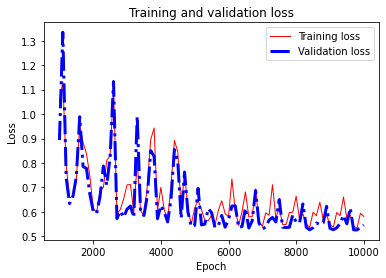

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5813786, Final Validation loss: 0.5464711, Training RMSE: 0.7424338, Validation RMSE: 0.73923683
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.623561, Validation loss: 0.55794203, 
Epoch: 2000, Training loss: 0.53877443, Validation loss: 0.54633856, 
Epoch: 3000, Training loss: 0.6030108, Validation loss: 0.55198777, 
Epoch: 4000, Training loss: 0.53159314, Validation loss: 0.55771023, 
Epoch: 5000, Training loss: 0.6220362, Validation loss: 0.53310865, 
Epoch: 6000, Training loss: 0.53031766, Validation loss: 0.54531616, 
Epoch: 7000, Training loss: 0.53004175, Validation loss: 0.5234738, 
Epoch: 8000, Training loss: 0.5645753, Validation loss: 0.5222234, 
Epoch: 9000, Training loss: 0.52247363, Validation loss: 0.5231187, 
Epoch: 10000, Tra

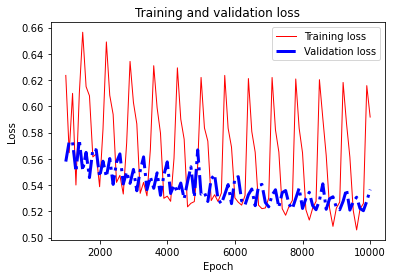

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5918523, Final Validation loss: 0.5365916, Training RMSE: 0.73602635, Validation RMSE: 0.7325241
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8183166, Validation loss: 0.8033785, 
Epoch: 2000, Training loss: 0.6280647, Validation loss: 0.646292, 
Epoch: 3000, Training loss: 1.1566211, Validation loss: 0.91930604, 
Epoch: 4000, Training loss: 0.68917763, Validation loss: 0.81800777, 
Epoch: 5000, Training loss: 0.67191696, Validation loss: 0.61108893, 
Epoch: 6000, Training loss: 0.54957306, Validation loss: 0.58836675, 
Epoch: 7000, Training loss: 0.5420469, Validation loss: 0.5271715, 
Epoch: 8000, Training loss: 0.5911646, Validation loss: 0.56714195, 
Epoch: 9000, Training loss: 0.52339804, Validation loss: 0.52414876, 
Epoch: 10000, Trai

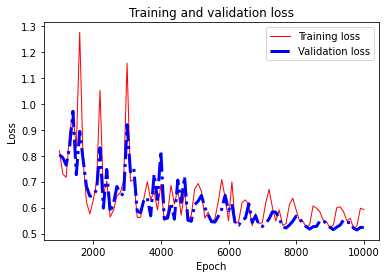

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.592298, Final Validation loss: 0.523764, Training RMSE: 0.7381438, Validation RMSE: 0.7237154
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.0735126, Validation loss: 0.90856266, 
Epoch: 2000, Training loss: 0.5862469, Validation loss: 0.57629484, 
Epoch: 3000, Training loss: 0.6056799, Validation loss: 0.559263, 
Epoch: 4000, Training loss: 0.5594054, Validation loss: 0.561095, 
Epoch: 5000, Training loss: 0.6234895, Validation loss: 0.5374492, 
Epoch: 6000, Training loss: 0.5722285, Validation loss: 0.59080255, 
Epoch: 7000, Training loss: 0.53437257, Validation loss: 0.52215636, 
Epoch: 8000, Training loss: 0.566133, Validation loss: 0.5330244, 
Epoch: 9000, Training loss: 0.5301702, Validation loss: 0.52641547, 
Epoch: 10000, Training loss

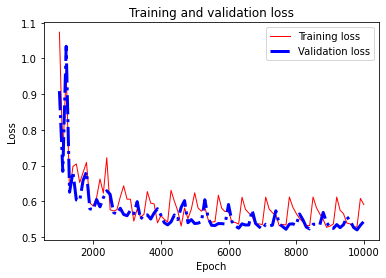

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5907205, Final Validation loss: 0.5431655, Training RMSE: 0.74031186, Validation RMSE: 0.7369976
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7487746, Validation loss: 0.74974334, 
Epoch: 2000, Training loss: 0.55096865, Validation loss: 0.55297154, 
Epoch: 3000, Training loss: 0.5945842, Validation loss: 0.56708854, 
Epoch: 4000, Training loss: 0.60502166, Validation loss: 0.5887931, 
Epoch: 5000, Training loss: 0.59424186, Validation loss: 0.53983593, 
Epoch: 6000, Training loss: 0.55834067, Validation loss: 0.5623447, 
Epoch: 7000, Training loss: 0.53357697, Validation loss: 0.53499424, 
Epoch: 8000, Training loss: 0.5653972, Validation loss: 0.54342604, 
Epoch: 9000, Training loss: 0.51269084, Validation loss: 0.5291381, 
Epoch: 10000, 

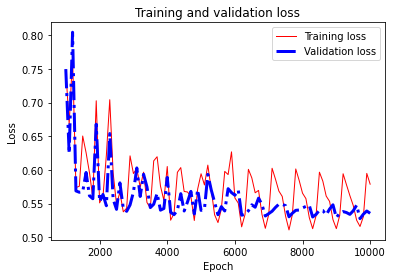

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.578772, Final Validation loss: 0.535472, Training RMSE: 0.7294303, Validation RMSE: 0.7317595
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7422223 

Average Validation RMSE for the 10 folds: 0.7420859 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.60263854, Validation loss: 0.5603147, 
Epoch: 2000, Training loss: 0.53991497, Validation loss: 0.5428084, 
Epoch: 3000, Training loss: 0.5755616, Validation loss: 0.54122967, 
Epoch: 4000, Training loss: 0.51722443, Validation loss: 0.53421617, 
Epoch: 5000, T

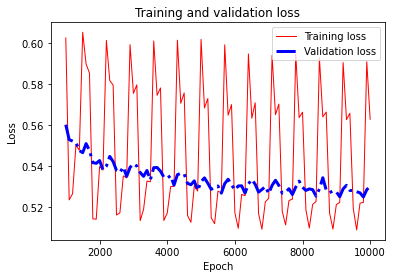

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5629312, Final Validation loss: 0.5302104, Training RMSE: 0.7272148, Validation RMSE: 0.72815543
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.63306147, Validation loss: 0.54746413, 
Epoch: 2000, Training loss: 0.5361643, Validation loss: 0.53056467, 
Epoch: 3000, Training loss: 0.60705227, Validation loss: 0.5569926, 
Epoch: 4000, Training loss: 0.50171655, Validation loss: 0.5201643, 
Epoch: 5000, Training loss: 0.5933194, Validation loss: 0.534107, 
Epoch: 6000, Training loss: 0.5148256, Validation loss: 0.51861227, 
Epoch: 7000, Training loss: 0.5253904, Validation loss: 0.51485944, 
Epoch: 8000, Training loss: 0.56890935, Validation loss: 0.5191443, 
Epoch: 9000, Training loss: 0.5276126, Validation loss: 0.5104509, 
Epoch: 10000, Traini

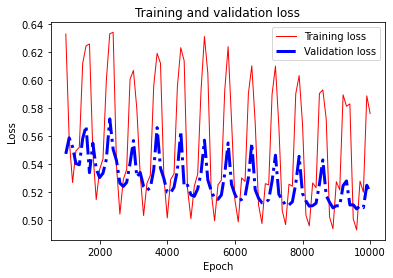

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5763063, Final Validation loss: 0.5201081, Training RMSE: 0.7269645, Validation RMSE: 0.7211852
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7063992, Validation loss: 0.63633436, 
Epoch: 2000, Training loss: 0.53009, Validation loss: 0.5429216, 
Epoch: 3000, Training loss: 0.5862015, Validation loss: 0.53937614, 
Epoch: 4000, Training loss: 0.523522, Validation loss: 0.548557, 
Epoch: 5000, Training loss: 0.58934903, Validation loss: 0.5287909, 
Epoch: 6000, Training loss: 0.56305546, Validation loss: 0.5708031, 
Epoch: 7000, Training loss: 0.5373693, Validation loss: 0.52956355, 
Epoch: 8000, Training loss: 0.5751676, Validation loss: 0.53855455, 
Epoch: 9000, Training loss: 0.52799755, Validation loss: 0.52292955, 
Epoch: 10000, Training l

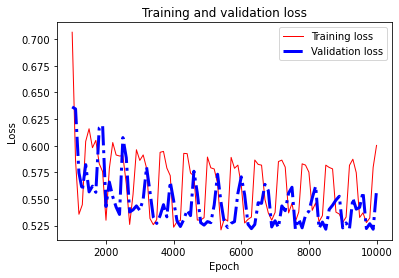

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6002521, Final Validation loss: 0.55826217, Training RMSE: 0.75078297, Validation RMSE: 0.74716944
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6369717, Validation loss: 0.58911633, 
Epoch: 2000, Training loss: 0.58991873, Validation loss: 0.6041133, 
Epoch: 3000, Training loss: 0.59192353, Validation loss: 0.57309055, 
Epoch: 4000, Training loss: 0.55844355, Validation loss: 0.57832134, 
Epoch: 5000, Training loss: 0.58552456, Validation loss: 0.5595264, 
Epoch: 6000, Training loss: 0.5572607, Validation loss: 0.5958063, 
Epoch: 7000, Training loss: 0.52947295, Validation loss: 0.54005265, 
Epoch: 8000, Training loss: 0.6029653, Validation loss: 0.5677164, 
Epoch: 9000, Training loss: 0.51525337, Validation loss: 0.53240126, 
Epoch: 10000, 

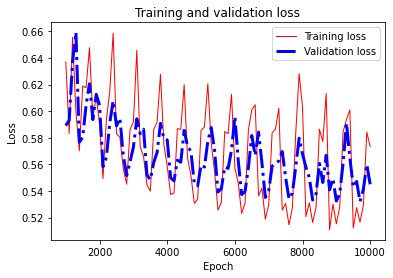

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.57332796, Final Validation loss: 0.54499733, Training RMSE: 0.7236014, Validation RMSE: 0.73823935
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6462893, Validation loss: 0.556004, 
Epoch: 2000, Training loss: 0.53359604, Validation loss: 0.54089504, 
Epoch: 3000, Training loss: 0.57988274, Validation loss: 0.54207873, 
Epoch: 4000, Training loss: 0.50487536, Validation loss: 0.5397332, 
Epoch: 5000, Training loss: 0.5878616, Validation loss: 0.53961223, 
Epoch: 6000, Training loss: 0.5017639, Validation loss: 0.52577716, 
Epoch: 7000, Training loss: 0.52149165, Validation loss: 0.5253438, 
Epoch: 8000, Training loss: 0.5747574, Validation loss: 0.5283431, 
Epoch: 9000, Training loss: 0.5201548, Validation loss: 0.5230716, 
Epoch: 10000, Trai

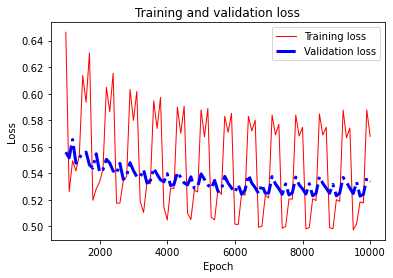

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5678404, Final Validation loss: 0.5337271, Training RMSE: 0.7241821, Validation RMSE: 0.7305663
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.71903926, Validation loss: 0.5945888, 
Epoch: 2000, Training loss: 0.5583757, Validation loss: 0.539128, 
Epoch: 3000, Training loss: 0.60231113, Validation loss: 0.5418782, 
Epoch: 4000, Training loss: 0.5545415, Validation loss: 0.5622386, 
Epoch: 5000, Training loss: 0.61169606, Validation loss: 0.5316159, 
Epoch: 6000, Training loss: 0.5415373, Validation loss: 0.5580647, 
Epoch: 7000, Training loss: 0.58265245, Validation loss: 0.5444132, 
Epoch: 8000, Training loss: 0.613581, Validation loss: 0.53282, 
Epoch: 9000, Training loss: 0.5214543, Validation loss: 0.5125513, 
Epoch: 10000, Training loss:

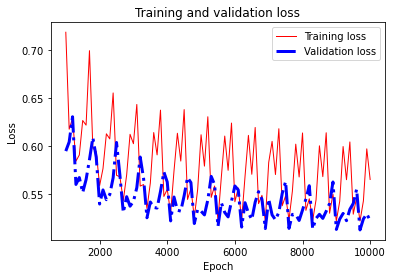

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.56486624, Final Validation loss: 0.5217403, Training RMSE: 0.7308014, Validation RMSE: 0.72231597
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.2101121, Validation loss: 0.94455713, 
Epoch: 2000, Training loss: 0.6106347, Validation loss: 0.62915295, 
Epoch: 3000, Training loss: 0.66415846, Validation loss: 0.64441794, 
Epoch: 4000, Training loss: 0.5590901, Validation loss: 0.56341624, 
Epoch: 5000, Training loss: 0.6143456, Validation loss: 0.5512019, 
Epoch: 6000, Training loss: 0.5663499, Validation loss: 0.5630768, 
Epoch: 7000, Training loss: 0.54690343, Validation loss: 0.5450548, 
Epoch: 8000, Training loss: 0.56838167, Validation loss: 0.533857, 
Epoch: 9000, Training loss: 0.5279336, Validation loss: 0.52971226, 
Epoch: 10000, Train

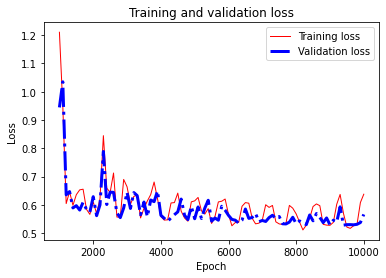

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.63781804, Final Validation loss: 0.56648785, Training RMSE: 0.7522226, Validation RMSE: 0.7526539
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6220963, Validation loss: 0.55275595, 
Epoch: 2000, Training loss: 0.53928363, Validation loss: 0.5455532, 
Epoch: 3000, Training loss: 0.5950767, Validation loss: 0.54633003, 
Epoch: 4000, Training loss: 0.547338, Validation loss: 0.60335076, 
Epoch: 5000, Training loss: 0.6147605, Validation loss: 0.53443635, 
Epoch: 6000, Training loss: 0.57054096, Validation loss: 0.5615771, 
Epoch: 7000, Training loss: 0.5515617, Validation loss: 0.5316793, 
Epoch: 8000, Training loss: 0.57904476, Validation loss: 0.51540214, 
Epoch: 9000, Training loss: 0.5164029, Validation loss: 0.51584595, 
Epoch: 10000, Trai

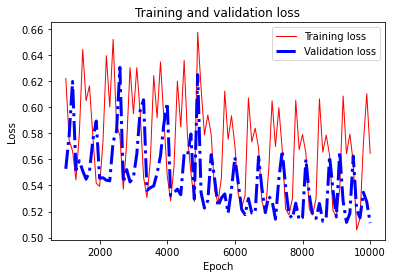

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.56468594, Final Validation loss: 0.5111442, Training RMSE: 0.7307676, Validation RMSE: 0.7149435
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.0881066, Validation loss: 0.84484076, 
Epoch: 2000, Training loss: 0.6994067, Validation loss: 0.6556994, 
Epoch: 3000, Training loss: 0.6179174, Validation loss: 0.5663675, 
Epoch: 4000, Training loss: 0.5843531, Validation loss: 0.5963168, 
Epoch: 5000, Training loss: 0.60366493, Validation loss: 0.54592603, 
Epoch: 6000, Training loss: 0.52054405, Validation loss: 0.5373094, 
Epoch: 7000, Training loss: 0.5438823, Validation loss: 0.5391326, 
Epoch: 8000, Training loss: 0.5764296, Validation loss: 0.53805757, 
Epoch: 9000, Training loss: 0.5272179, Validation loss: 0.5228636, 
Epoch: 10000, Training

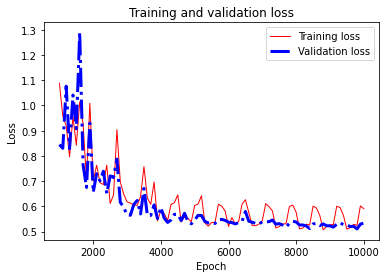

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5909514, Final Validation loss: 0.53388226, Training RMSE: 0.73249406, Validation RMSE: 0.7306725
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.66299236, Validation loss: 0.61856157, 
Epoch: 2000, Training loss: 0.5413774, Validation loss: 0.55193794, 
Epoch: 3000, Training loss: 0.60257953, Validation loss: 0.54358494, 
Epoch: 4000, Training loss: 0.5504483, Validation loss: 0.60618067, 
Epoch: 5000, Training loss: 0.6034402, Validation loss: 0.5409858, 
Epoch: 6000, Training loss: 0.5368369, Validation loss: 0.5516925, 
Epoch: 7000, Training loss: 0.5548381, Validation loss: 0.5473187, 
Epoch: 8000, Training loss: 0.5768775, Validation loss: 0.5512422, 
Epoch: 9000, Training loss: 0.51819444, Validation loss: 0.5327311, 
Epoch: 10000, Trai

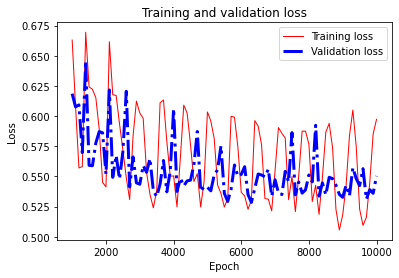

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5973305, Final Validation loss: 0.5504464, Training RMSE: 0.74336284, Validation RMSE: 0.74192077
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7419804 

Average Validation RMSE for the 10 folds: 0.741804 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.9259871, Validation loss: 0.8048496, 
Epoch: 2000, Training loss: 0.6756702, Validation loss: 0.6594736, 
Epoch: 3000, Training loss: 0.652039, Validation loss: 0.6024585, 
Epoch: 4000, Training loss: 0.5378706, Validation loss: 0.57045126, 
Epoch: 5000, Traini

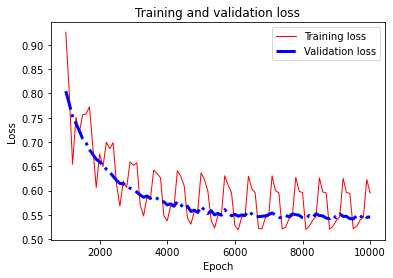

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5951649, Final Validation loss: 0.546002, Training RMSE: 0.73542076, Validation RMSE: 0.73891944
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.9337052, Validation loss: 0.7691176, 
Epoch: 2000, Training loss: 0.6161437, Validation loss: 0.61691433, 
Epoch: 3000, Training loss: 0.65016764, Validation loss: 0.5819675, 
Epoch: 4000, Training loss: 0.54850096, Validation loss: 0.5614758, 
Epoch: 5000, Training loss: 0.6411652, Validation loss: 0.55550385, 
Epoch: 6000, Training loss: 0.5330378, Validation loss: 0.54932445, 
Epoch: 7000, Training loss: 0.55441225, Validation loss: 0.55965346, 
Epoch: 8000, Training loss: 0.60049695, Validation loss: 0.5539566, 
Epoch: 9000, Training loss: 0.5445908, Validation loss: 0.55144835, 
Epoch: 10000, Trainin

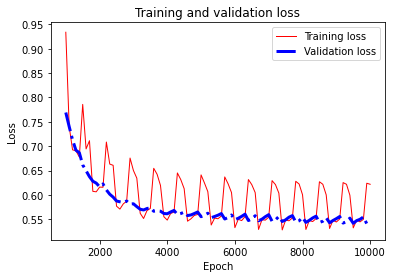

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.62193394, Final Validation loss: 0.54480445, Training RMSE: 0.7389083, Validation RMSE: 0.7381087
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.78289837, Validation loss: 0.7180732, 
Epoch: 2000, Training loss: 0.5748225, Validation loss: 0.61785585, 
Epoch: 3000, Training loss: 0.64276606, Validation loss: 0.579704, 
Epoch: 4000, Training loss: 0.5311616, Validation loss: 0.5641459, 
Epoch: 5000, Training loss: 0.6212842, Validation loss: 0.5534437, 
Epoch: 6000, Training loss: 0.5275384, Validation loss: 0.5518675, 
Epoch: 7000, Training loss: 0.54713494, Validation loss: 0.550603, 
Epoch: 8000, Training loss: 0.59766525, Validation loss: 0.55025977, 
Epoch: 9000, Training loss: 0.5259214, Validation loss: 0.55174303, 
Epoch: 10000, Training l

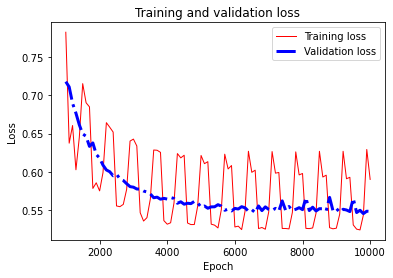

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58989733, Final Validation loss: 0.54789895, Training RMSE: 0.73928416, Validation RMSE: 0.74020195
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7417216, Validation loss: 0.75547725, 
Epoch: 2000, Training loss: 0.6134239, Validation loss: 0.6343333, 
Epoch: 3000, Training loss: 0.66889405, Validation loss: 0.62189597, 
Epoch: 4000, Training loss: 0.5779121, Validation loss: 0.5988919, 
Epoch: 5000, Training loss: 0.6468833, Validation loss: 0.59108365, 
Epoch: 6000, Training loss: 0.5454129, Validation loss: 0.5859244, 
Epoch: 7000, Training loss: 0.57056177, Validation loss: 0.59488225, 
Epoch: 8000, Training loss: 0.6257936, Validation loss: 0.5784126, 
Epoch: 9000, Training loss: 0.5570042, Validation loss: 0.57351416, 
Epoch: 10000, Traini

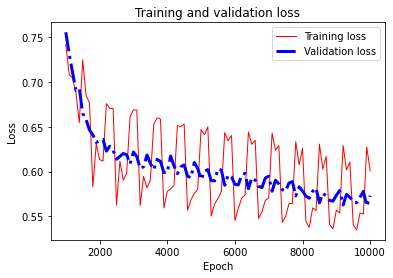

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6008486, Final Validation loss: 0.57309973, Training RMSE: 0.7422813, Validation RMSE: 0.7570335
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.79059595, Validation loss: 0.67726904, 
Epoch: 2000, Training loss: 0.55421793, Validation loss: 0.59580976, 
Epoch: 3000, Training loss: 0.6171797, Validation loss: 0.57592785, 
Epoch: 4000, Training loss: 0.52949303, Validation loss: 0.56794, 
Epoch: 5000, Training loss: 0.6366627, Validation loss: 0.5623908, 
Epoch: 6000, Training loss: 0.5511265, Validation loss: 0.5574818, 
Epoch: 7000, Training loss: 0.5445338, Validation loss: 0.5546518, 
Epoch: 8000, Training loss: 0.6088797, Validation loss: 0.5507245, 
Epoch: 9000, Training loss: 0.53816646, Validation loss: 0.5546813, 
Epoch: 10000, Training lo

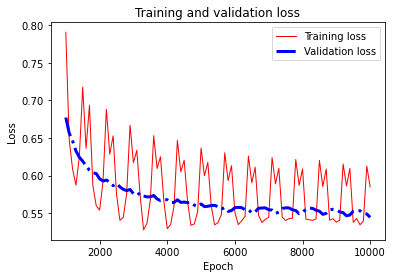

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5851552, Final Validation loss: 0.54459417, Training RMSE: 0.7333731, Validation RMSE: 0.73796624
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.70729214, Validation loss: 0.6317335, 
Epoch: 2000, Training loss: 0.5670668, Validation loss: 0.57136667, 
Epoch: 3000, Training loss: 0.64084375, Validation loss: 0.55814755, 
Epoch: 4000, Training loss: 0.5408442, Validation loss: 0.54338247, 
Epoch: 5000, Training loss: 0.6250398, Validation loss: 0.54288256, 
Epoch: 6000, Training loss: 0.5148884, Validation loss: 0.53271276, 
Epoch: 7000, Training loss: 0.5440812, Validation loss: 0.54160595, 
Epoch: 8000, Training loss: 0.60385704, Validation loss: 0.5338655, 
Epoch: 9000, Training loss: 0.5357357, Validation loss: 0.54267424, 
Epoch: 10000, Train

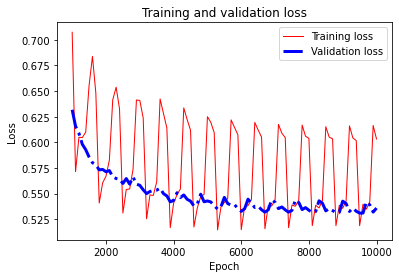

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6032241, Final Validation loss: 0.53595614, Training RMSE: 0.74022526, Validation RMSE: 0.73209023
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.817527, Validation loss: 0.7618019, 
Epoch: 2000, Training loss: 0.61374307, Validation loss: 0.62854725, 
Epoch: 3000, Training loss: 0.6409038, Validation loss: 0.5797407, 
Epoch: 4000, Training loss: 0.5378762, Validation loss: 0.5667167, 
Epoch: 5000, Training loss: 0.63073885, Validation loss: 0.57030135, 
Epoch: 6000, Training loss: 0.53417766, Validation loss: 0.5586706, 
Epoch: 7000, Training loss: 0.5454692, Validation loss: 0.5527625, 
Epoch: 8000, Training loss: 0.60702914, Validation loss: 0.55177397, 
Epoch: 9000, Training loss: 0.53724104, Validation loss: 0.55230576, 
Epoch: 10000, Traini

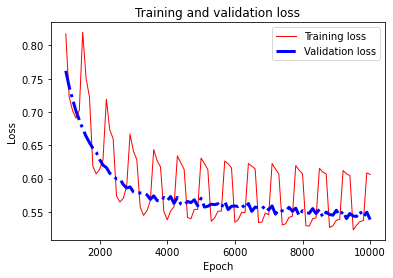

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60614437, Final Validation loss: 0.53826666, Training RMSE: 0.7329453, Validation RMSE: 0.7336666
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.66910535, Validation loss: 0.6492108, 
Epoch: 2000, Training loss: 0.5869683, Validation loss: 0.58067364, 
Epoch: 3000, Training loss: 0.6021793, Validation loss: 0.546616, 
Epoch: 4000, Training loss: 0.5505165, Validation loss: 0.54422504, 
Epoch: 5000, Training loss: 0.6447493, Validation loss: 0.5429104, 
Epoch: 6000, Training loss: 0.5526394, Validation loss: 0.5430945, 
Epoch: 7000, Training loss: 0.5440811, Validation loss: 0.5349357, 
Epoch: 8000, Training loss: 0.57236266, Validation loss: 0.5303026, 
Epoch: 9000, Training loss: 0.5377026, Validation loss: 0.53534424, 
Epoch: 10000, Training lo

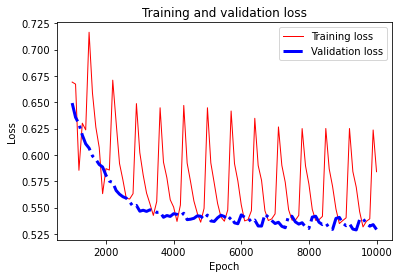

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58409065, Final Validation loss: 0.52923405, Training RMSE: 0.7378665, Validation RMSE: 0.72748476
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7389107, Validation loss: 0.6309938, 
Epoch: 2000, Training loss: 0.56035066, Validation loss: 0.57172084, 
Epoch: 3000, Training loss: 0.61111224, Validation loss: 0.5509243, 
Epoch: 4000, Training loss: 0.53828114, Validation loss: 0.5467938, 
Epoch: 5000, Training loss: 0.6241083, Validation loss: 0.553638, 
Epoch: 6000, Training loss: 0.5214528, Validation loss: 0.5433765, 
Epoch: 7000, Training loss: 0.54185426, Validation loss: 0.53502214, 
Epoch: 8000, Training loss: 0.5891514, Validation loss: 0.5401891, 
Epoch: 9000, Training loss: 0.5348493, Validation loss: 0.5337188, 
Epoch: 10000, Training 

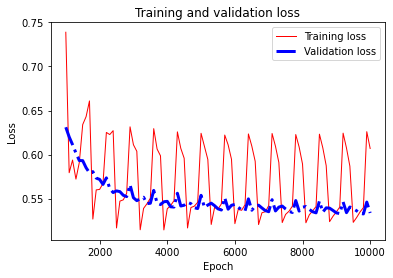

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6068662, Final Validation loss: 0.5335723, Training RMSE: 0.73204195, Validation RMSE: 0.73046035
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.70452654, Validation loss: 0.6724414, 
Epoch: 2000, Training loss: 0.5840377, Validation loss: 0.60054487, 
Epoch: 3000, Training loss: 0.6630009, Validation loss: 0.5748532, 
Epoch: 4000, Training loss: 0.5539996, Validation loss: 0.5641463, 
Epoch: 5000, Training loss: 0.6496608, Validation loss: 0.5578042, 
Epoch: 6000, Training loss: 0.54017, Validation loss: 0.55945814, 
Epoch: 7000, Training loss: 0.54728776, Validation loss: 0.54019004, 
Epoch: 8000, Training loss: 0.5906612, Validation loss: 0.5436907, 
Epoch: 9000, Training loss: 0.5285296, Validation loss: 0.5379544, 
Epoch: 10000, Training lo

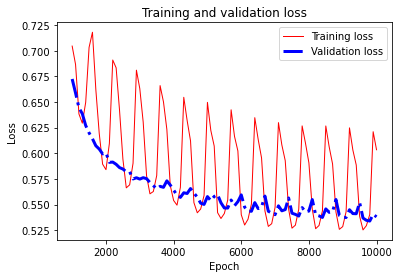

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60345566, Final Validation loss: 0.53802884, Training RMSE: 0.73486304, Validation RMSE: 0.7335045
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.7418257 

Average Validation RMSE for the 10 folds: 0.741661 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.99882793, Validation loss: 0.85138375, 
Epoch: 2000, Training loss: 0.6962665, Validation loss: 0.67082536, 
Epoch: 3000, Training loss: 0.6835546, Validation loss: 0.61403036, 
Epoch: 4000, Training loss: 0.5673445, Validation loss: 0.57848305, 
Epoch: 5000, Tra

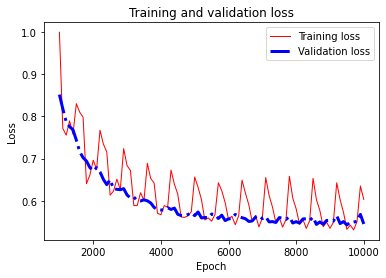

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60357416, Final Validation loss: 0.5454075, Training RMSE: 0.73351043, Validation RMSE: 0.7385171
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.93406963, Validation loss: 0.8115833, 
Epoch: 2000, Training loss: 0.59759617, Validation loss: 0.6379053, 
Epoch: 3000, Training loss: 0.63712937, Validation loss: 0.5930672, 
Epoch: 4000, Training loss: 0.5467091, Validation loss: 0.5742936, 
Epoch: 5000, Training loss: 0.6407119, Validation loss: 0.56127244, 
Epoch: 6000, Training loss: 0.55517125, Validation loss: 0.5499621, 
Epoch: 7000, Training loss: 0.5497559, Validation loss: 0.54866636, 
Epoch: 8000, Training loss: 0.5930989, Validation loss: 0.53289616, 
Epoch: 9000, Training loss: 0.5482674, Validation loss: 0.55228364, 
Epoch: 10000, Trainin

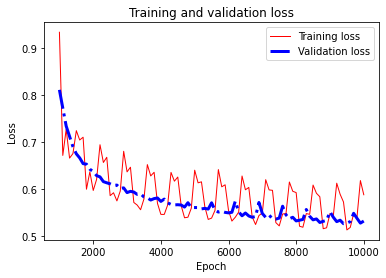

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58850193, Final Validation loss: 0.53255886, Training RMSE: 0.737517, Validation RMSE: 0.7297663
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.1361791, Validation loss: 1.0868938, 
Epoch: 2000, Training loss: 0.70648813, Validation loss: 0.71787024, 
Epoch: 3000, Training loss: 0.70166785, Validation loss: 0.6398106, 
Epoch: 4000, Training loss: 0.5913869, Validation loss: 0.5957401, 
Epoch: 5000, Training loss: 0.6484576, Validation loss: 0.5922973, 
Epoch: 6000, Training loss: 0.5789843, Validation loss: 0.5574633, 
Epoch: 7000, Training loss: 0.5564058, Validation loss: 0.571738, 
Epoch: 8000, Training loss: 0.5858514, Validation loss: 0.54316366, 
Epoch: 9000, Training loss: 0.5433721, Validation loss: 0.5446211, 
Epoch: 10000, Training loss

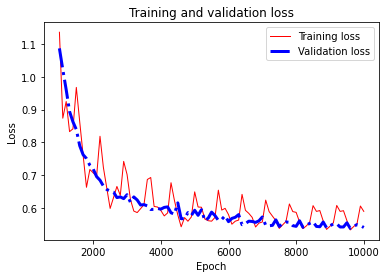

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.588831, Final Validation loss: 0.53964597, Training RMSE: 0.7379202, Validation RMSE: 0.73460597
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.795482, Validation loss: 0.7209646, 
Epoch: 2000, Training loss: 0.5971786, Validation loss: 0.6264681, 
Epoch: 3000, Training loss: 0.657771, Validation loss: 0.59669614, 
Epoch: 4000, Training loss: 0.55230236, Validation loss: 0.5761186, 
Epoch: 5000, Training loss: 0.6308902, Validation loss: 0.5697355, 
Epoch: 6000, Training loss: 0.5209661, Validation loss: 0.5578079, 
Epoch: 7000, Training loss: 0.540115, Validation loss: 0.5577021, 
Epoch: 8000, Training loss: 0.6074004, Validation loss: 0.5618882, 
Epoch: 9000, Training loss: 0.5308159, Validation loss: 0.54851806, 
Epoch: 10000, Training loss: 0

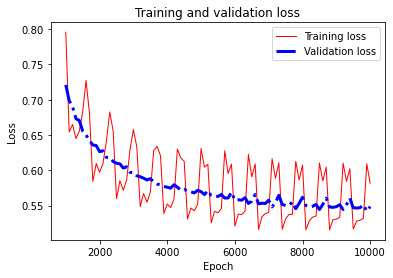

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58174086, Final Validation loss: 0.5486538, Training RMSE: 0.7295528, Validation RMSE: 0.7407117
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.84227085, Validation loss: 0.7782922, 
Epoch: 2000, Training loss: 0.6033429, Validation loss: 0.6237922, 
Epoch: 3000, Training loss: 0.6800558, Validation loss: 0.5901037, 
Epoch: 4000, Training loss: 0.5718567, Validation loss: 0.57940227, 
Epoch: 5000, Training loss: 0.65340173, Validation loss: 0.56953204, 
Epoch: 6000, Training loss: 0.5301937, Validation loss: 0.56305623, 
Epoch: 7000, Training loss: 0.5530525, Validation loss: 0.55576223, 
Epoch: 8000, Training loss: 0.6071031, Validation loss: 0.55508846, 
Epoch: 9000, Training loss: 0.5158299, Validation loss: 0.54769486, 
Epoch: 10000, Training

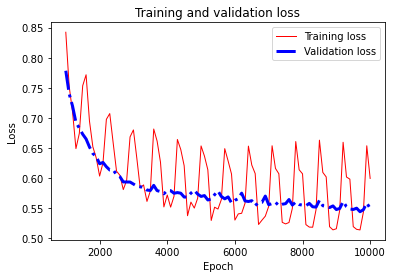

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59943295, Final Validation loss: 0.5497732, Training RMSE: 0.73571134, Validation RMSE: 0.74146694
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8518425, Validation loss: 0.7772394, 
Epoch: 2000, Training loss: 0.5988401, Validation loss: 0.6254858, 
Epoch: 3000, Training loss: 0.63077295, Validation loss: 0.57985246, 
Epoch: 4000, Training loss: 0.5438442, Validation loss: 0.559857, 
Epoch: 5000, Training loss: 0.62983257, Validation loss: 0.5522406, 
Epoch: 6000, Training loss: 0.526631, Validation loss: 0.5396295, 
Epoch: 7000, Training loss: 0.5369345, Validation loss: 0.5299947, 
Epoch: 8000, Training loss: 0.5744239, Validation loss: 0.52120996, 
Epoch: 9000, Training loss: 0.5216412, Validation loss: 0.51846474, 
Epoch: 10000, Training lo

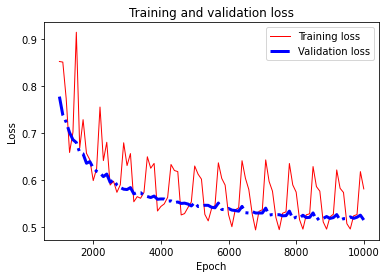

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.58113766, Final Validation loss: 0.5152086, Training RMSE: 0.7275054, Validation RMSE: 0.71778035
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7971775, Validation loss: 0.77163166, 
Epoch: 2000, Training loss: 0.61836195, Validation loss: 0.6273401, 
Epoch: 3000, Training loss: 0.6430532, Validation loss: 0.5905855, 
Epoch: 4000, Training loss: 0.56328464, Validation loss: 0.57115626, 
Epoch: 5000, Training loss: 0.630175, Validation loss: 0.5613948, 
Epoch: 6000, Training loss: 0.5360796, Validation loss: 0.5488017, 
Epoch: 7000, Training loss: 0.5386782, Validation loss: 0.5402525, 
Epoch: 8000, Training loss: 0.5870751, Validation loss: 0.5328226, 
Epoch: 9000, Training loss: 0.5278305, Validation loss: 0.54287314, 
Epoch: 10000, Training lo

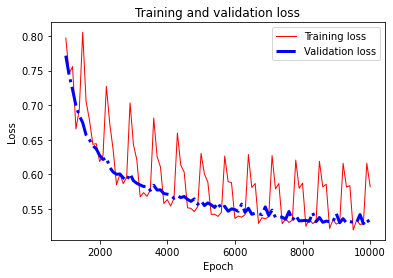

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.582077, Final Validation loss: 0.528164, Training RMSE: 0.72737634, Validation RMSE: 0.72674894
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6714873, Validation loss: 0.61082596, 
Epoch: 2000, Training loss: 0.55805045, Validation loss: 0.5648781, 
Epoch: 3000, Training loss: 0.6093397, Validation loss: 0.5454296, 
Epoch: 4000, Training loss: 0.5265235, Validation loss: 0.5456466, 
Epoch: 5000, Training loss: 0.6374059, Validation loss: 0.5444506, 
Epoch: 6000, Training loss: 0.54581195, Validation loss: 0.5361596, 
Epoch: 7000, Training loss: 0.5395806, Validation loss: 0.52942014, 
Epoch: 8000, Training loss: 0.57453024, Validation loss: 0.5214226, 
Epoch: 9000, Training loss: 0.5245784, Validation loss: 0.5259722, 
Epoch: 10000, Training los

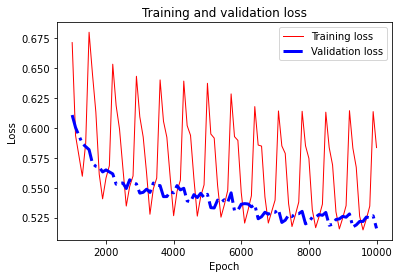

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5835721, Final Validation loss: 0.51590824, Training RMSE: 0.72895193, Validation RMSE: 0.7182675
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7158978, Validation loss: 0.6918294, 
Epoch: 2000, Training loss: 0.57828367, Validation loss: 0.6028694, 
Epoch: 3000, Training loss: 0.6241313, Validation loss: 0.5738687, 
Epoch: 4000, Training loss: 0.5463689, Validation loss: 0.56472623, 
Epoch: 5000, Training loss: 0.67001605, Validation loss: 0.5689252, 
Epoch: 6000, Training loss: 0.5260318, Validation loss: 0.5555252, 
Epoch: 7000, Training loss: 0.54236156, Validation loss: 0.53566015, 
Epoch: 8000, Training loss: 0.61346763, Validation loss: 0.5349437, 
Epoch: 9000, Training loss: 0.54442465, Validation loss: 0.54018193, 
Epoch: 10000, Trainin

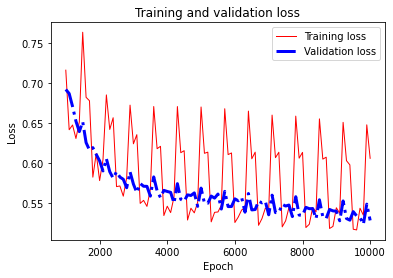

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60604846, Final Validation loss: 0.5286698, Training RMSE: 0.7290701, Validation RMSE: 0.7270968
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7920976, Validation loss: 0.6775997, 
Epoch: 2000, Training loss: 0.5670993, Validation loss: 0.59784484, 
Epoch: 3000, Training loss: 0.6562356, Validation loss: 0.58096796, 
Epoch: 4000, Training loss: 0.55762315, Validation loss: 0.5842963, 
Epoch: 5000, Training loss: 0.6227092, Validation loss: 0.55236393, 
Epoch: 6000, Training loss: 0.52223027, Validation loss: 0.55055445, 
Epoch: 7000, Training loss: 0.5506176, Validation loss: 0.5488155, 
Epoch: 8000, Training loss: 0.5974867, Validation loss: 0.55015695, 
Epoch: 9000, Training loss: 0.5375802, Validation loss: 0.5473596, 
Epoch: 10000, Training

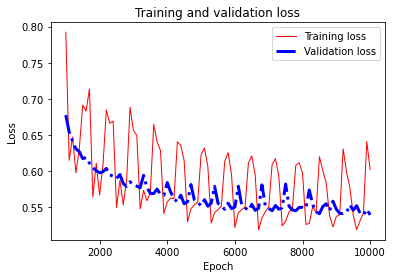

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.60235393, Final Validation loss: 0.5396574, Training RMSE: 0.7331484, Validation RMSE: 0.7346138
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.74154574 

Average Validation RMSE for the 10 folds: 0.74135524 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.804075, Validation loss: 0.7689035, 
Epoch: 2000, Training loss: 0.6196817, Validation loss: 0.6209128, 
Epoch: 3000, Training loss: 0.605996, Validation loss: 0.5807308, 
Epoch: 4000, Training loss: 0.5636216, Validation loss: 0.5614719, 
Epoch: 5000, Training 

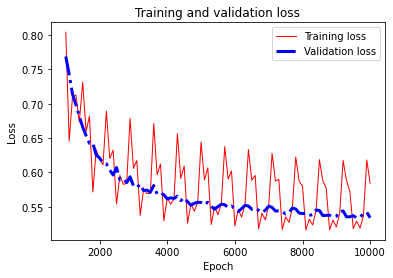

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5842479, Final Validation loss: 0.534128, Training RMSE: 0.72542053, Validation RMSE: 0.7308406
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.1207194, Validation loss: 1.2501479, 
Epoch: 2000, Training loss: 0.71029776, Validation loss: 0.77777785, 
Epoch: 3000, Training loss: 0.6925065, Validation loss: 0.6489168, 
Epoch: 4000, Training loss: 0.6200926, Validation loss: 0.5998958, 
Epoch: 5000, Training loss: 0.66168183, Validation loss: 0.5703608, 
Epoch: 6000, Training loss: 0.57994723, Validation loss: 0.5583722, 
Epoch: 7000, Training loss: 0.55713266, Validation loss: 0.55328315, 
Epoch: 8000, Training loss: 0.5980397, Validation loss: 0.54632986, 
Epoch: 9000, Training loss: 0.5439134, Validation loss: 0.5567334, 
Epoch: 10000, Training l

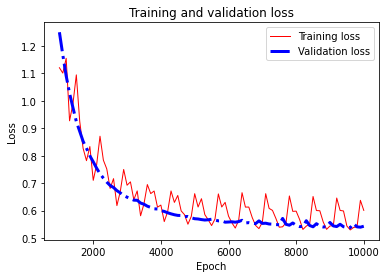

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6007341, Final Validation loss: 0.5429704, Training RMSE: 0.73957133, Validation RMSE: 0.7368653
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.61115646, Validation loss: 0.56289774, 
Epoch: 2000, Training loss: 0.5404208, Validation loss: 0.5363223, 
Epoch: 3000, Training loss: 0.5812068, Validation loss: 0.5256482, 
Epoch: 4000, Training loss: 0.5228683, Validation loss: 0.52223426, 
Epoch: 5000, Training loss: 0.58869344, Validation loss: 0.5216916, 
Epoch: 6000, Training loss: 0.5104071, Validation loss: 0.5214755, 
Epoch: 7000, Training loss: 0.52446955, Validation loss: 0.52097, 
Epoch: 8000, Training loss: 0.55634445, Validation loss: 0.5168724, 
Epoch: 9000, Training loss: 0.5205827, Validation loss: 0.51432645, 
Epoch: 10000, Training lo

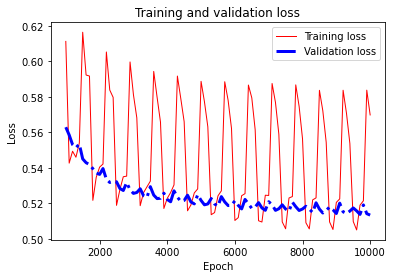

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5697873, Final Validation loss: 0.5134344, Training RMSE: 0.7202095, Validation RMSE: 0.7165434
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.760134, Validation loss: 0.8511068, 
Epoch: 2000, Training loss: 0.65393466, Validation loss: 0.69078696, 
Epoch: 3000, Training loss: 0.68451405, Validation loss: 0.63342476, 
Epoch: 4000, Training loss: 0.5663377, Validation loss: 0.6062173, 
Epoch: 5000, Training loss: 0.6522825, Validation loss: 0.59056395, 
Epoch: 6000, Training loss: 0.5590573, Validation loss: 0.573311, 
Epoch: 7000, Training loss: 0.5537232, Validation loss: 0.577312, 
Epoch: 8000, Training loss: 0.61736935, Validation loss: 0.57398295, 
Epoch: 9000, Training loss: 0.5322086, Validation loss: 0.5637664, 
Epoch: 10000, Training loss

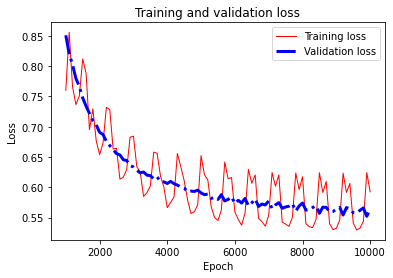

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.59248114, Final Validation loss: 0.5644914, Training RMSE: 0.7351007, Validation RMSE: 0.75132644
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6201414, Validation loss: 0.6204067, 
Epoch: 2000, Training loss: 0.5482609, Validation loss: 0.5654935, 
Epoch: 3000, Training loss: 0.6049092, Validation loss: 0.55244094, 
Epoch: 4000, Training loss: 0.524665, Validation loss: 0.54844135, 
Epoch: 5000, Training loss: 0.6061137, Validation loss: 0.5463867, 
Epoch: 6000, Training loss: 0.51369417, Validation loss: 0.54169065, 
Epoch: 7000, Training loss: 0.52848065, Validation loss: 0.5379756, 
Epoch: 8000, Training loss: 0.56506854, Validation loss: 0.5348945, 
Epoch: 9000, Training loss: 0.51279396, Validation loss: 0.5302633, 
Epoch: 10000, Training 

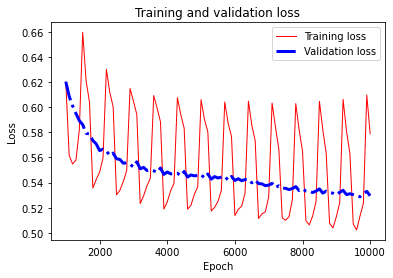

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5789418, Final Validation loss: 0.5295146, Training RMSE: 0.7231087, Validation RMSE: 0.7276775
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7761615, Validation loss: 0.7145384, 
Epoch: 2000, Training loss: 0.5776925, Validation loss: 0.6078419, 
Epoch: 3000, Training loss: 0.6609923, Validation loss: 0.5701762, 
Epoch: 4000, Training loss: 0.55029196, Validation loss: 0.55897206, 
Epoch: 5000, Training loss: 0.62679625, Validation loss: 0.55722344, 
Epoch: 6000, Training loss: 0.5159657, Validation loss: 0.53916776, 
Epoch: 7000, Training loss: 0.5411433, Validation loss: 0.5387902, 
Epoch: 8000, Training loss: 0.5849166, Validation loss: 0.53588283, 
Epoch: 9000, Training loss: 0.52266586, Validation loss: 0.53027433, 
Epoch: 10000, Training 

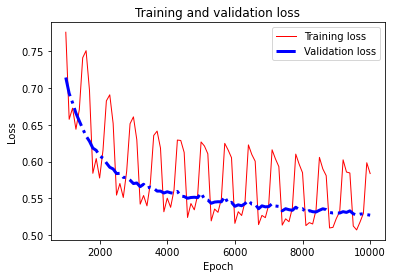

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.583775, Final Validation loss: 0.5271087, Training RMSE: 0.72876066, Validation RMSE: 0.72602254
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.9263146, Validation loss: 1.9978049, 
Epoch: 2000, Training loss: 1.0223411, Validation loss: 1.0659106, 
Epoch: 3000, Training loss: 0.82208836, Validation loss: 0.7577344, 
Epoch: 4000, Training loss: 0.6279382, Validation loss: 0.66978216, 
Epoch: 5000, Training loss: 0.6926919, Validation loss: 0.6391137, 
Epoch: 6000, Training loss: 0.56883323, Validation loss: 0.61146134, 
Epoch: 7000, Training loss: 0.6048563, Validation loss: 0.5976138, 
Epoch: 8000, Training loss: 0.6239013, Validation loss: 0.5818457, 
Epoch: 9000, Training loss: 0.58667845, Validation loss: 0.566048, 
Epoch: 10000, Training los

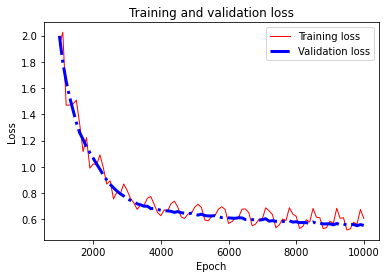

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6080994, Final Validation loss: 0.5540718, Training RMSE: 0.7504055, Validation RMSE: 0.74435997
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.5901585, Validation loss: 1.4698155, 
Epoch: 2000, Training loss: 0.81209195, Validation loss: 0.88587916, 
Epoch: 3000, Training loss: 0.71965766, Validation loss: 0.69951195, 
Epoch: 4000, Training loss: 0.62437, Validation loss: 0.64733213, 
Epoch: 5000, Training loss: 0.69708586, Validation loss: 0.61260146, 
Epoch: 6000, Training loss: 0.6227212, Validation loss: 0.61897475, 
Epoch: 7000, Training loss: 0.6134936, Validation loss: 0.56815636, 
Epoch: 8000, Training loss: 0.67201793, Validation loss: 0.55761415, 
Epoch: 9000, Training loss: 0.5758708, Validation loss: 0.5469748, 
Epoch: 10000, Trainin

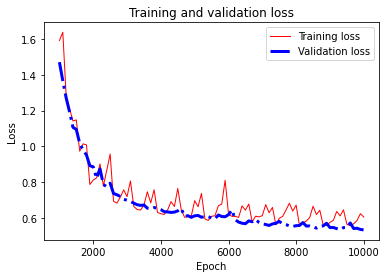

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6058848, Final Validation loss: 0.53395754, Training RMSE: 0.74121904, Validation RMSE: 0.730724
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.68346435, Validation loss: 0.6682123, 
Epoch: 2000, Training loss: 0.60291386, Validation loss: 0.6123837, 
Epoch: 3000, Training loss: 0.65187347, Validation loss: 0.5913318, 
Epoch: 4000, Training loss: 0.55857086, Validation loss: 0.5795571, 
Epoch: 5000, Training loss: 0.6699364, Validation loss: 0.5797679, 
Epoch: 6000, Training loss: 0.543269, Validation loss: 0.5570041, 
Epoch: 7000, Training loss: 0.54912364, Validation loss: 0.54659843, 
Epoch: 8000, Training loss: 0.59920233, Validation loss: 0.54628426, 
Epoch: 9000, Training loss: 0.52764845, Validation loss: 0.5436753, 
Epoch: 10000, Training

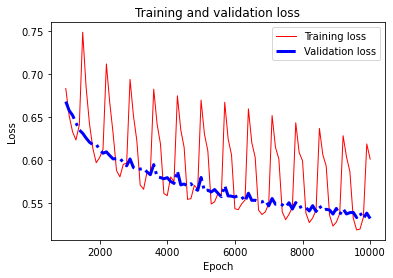

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6012062, Final Validation loss: 0.5318523, Training RMSE: 0.72922206, Validation RMSE: 0.729282
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 512, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.4310598, Validation loss: 1.5847869, 
Epoch: 2000, Training loss: 0.67883813, Validation loss: 0.6838884, 
Epoch: 3000, Training loss: 0.66544145, Validation loss: 0.624446, 
Epoch: 4000, Training loss: 0.580554, Validation loss: 0.59763294, 
Epoch: 5000, Training loss: 0.6948669, Validation loss: 0.584818, 
Epoch: 6000, Training loss: 0.57019585, Validation loss: 0.57719177, 
Epoch: 7000, Training loss: 0.5784346, Validation loss: 0.57698447, 
Epoch: 8000, Training loss: 0.63301516, Validation loss: 0.57717335, 
Epoch: 9000, Training loss: 0.56011534, Validation loss: 0.5747925, 
Epoch: 10000, Training l

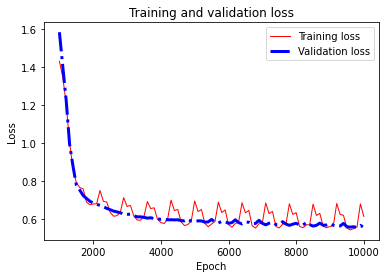

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.6134408, Final Validation loss: 0.5550925, Training RMSE: 0.7450581, Validation RMSE: 0.7450453
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 512, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7413308 

Average Validation RMSE for the 10 folds: 0.74114716 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6307805, Validation loss: 0.5924977, 
Epoch: 2000, Training loss: 0.6117724, Validation loss: 0.57869685, 
Epoch: 3000, Training loss: 0.5483762, Validation loss: 0.55716294, 
Epoch: 4000, Training loss: 0.5625597, Validation loss: 0.5479587, 
Epoch: 5000, Tra

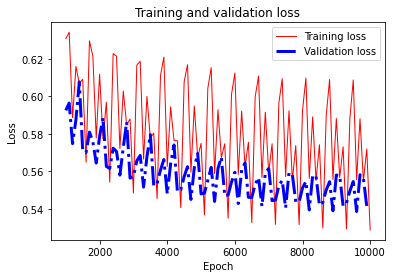

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52870953, Final Validation loss: 0.54229414, Training RMSE: 0.7311591, Validation RMSE: 0.7364062
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6877897, Validation loss: 0.58764786, 
Epoch: 2000, Training loss: 0.6102184, Validation loss: 0.5559926, 
Epoch: 3000, Training loss: 0.53987217, Validation loss: 0.53894955, 
Epoch: 4000, Training loss: 0.5595661, Validation loss: 0.5322844, 
Epoch: 5000, Training loss: 0.5771413, Validation loss: 0.53339064, 
Epoch: 6000, Training loss: 0.61010265, Validation loss: 0.5565538, 
Epoch: 7000, Training loss: 0.56235266, Validation loss: 0.5540164, 
Epoch: 8000, Training loss: 0.6049148, Validation loss: 0.5422217, 
Epoch: 9000, Training loss: 0.58151114, Validation loss: 0.53310937, 
Epoch: 10000, Tra

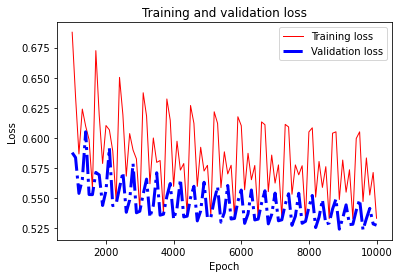

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53310364, Final Validation loss: 0.5272915, Training RMSE: 0.7315444, Validation RMSE: 0.72614837
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6666362, Validation loss: 0.62316173, 
Epoch: 2000, Training loss: 0.5877275, Validation loss: 0.5583157, 
Epoch: 3000, Training loss: 0.54220635, Validation loss: 0.54547197, 
Epoch: 4000, Training loss: 0.609728, Validation loss: 0.59136236, 
Epoch: 5000, Training loss: 0.61580986, Validation loss: 0.62010837, 
Epoch: 6000, Training loss: 0.60228014, Validation loss: 0.541651, 
Epoch: 7000, Training loss: 0.59536636, Validation loss: 0.6050623, 
Epoch: 8000, Training loss: 0.5742594, Validation loss: 0.5462946, 
Epoch: 9000, Training loss: 0.5895805, Validation loss: 0.5369275, 
Epoch: 10000, Train

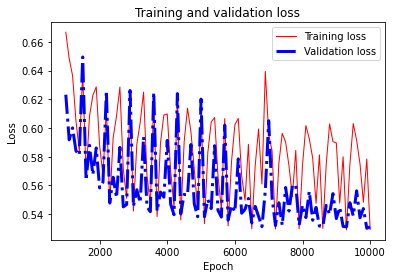

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52941287, Final Validation loss: 0.53114134, Training RMSE: 0.7328176, Validation RMSE: 0.72879446
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.68555367, Validation loss: 0.5915888, 
Epoch: 2000, Training loss: 0.6303793, Validation loss: 0.5868726, 
Epoch: 3000, Training loss: 0.5402046, Validation loss: 0.5527243, 
Epoch: 4000, Training loss: 0.5685252, Validation loss: 0.5530633, 
Epoch: 5000, Training loss: 0.58358127, Validation loss: 0.55832, 
Epoch: 6000, Training loss: 0.609524, Validation loss: 0.5522757, 
Epoch: 7000, Training loss: 0.53882855, Validation loss: 0.55545145, 
Epoch: 8000, Training loss: 0.6020692, Validation loss: 0.55878514, 
Epoch: 9000, Training loss: 0.5941277, Validation loss: 0.56050634, 
Epoch: 10000, Trainin

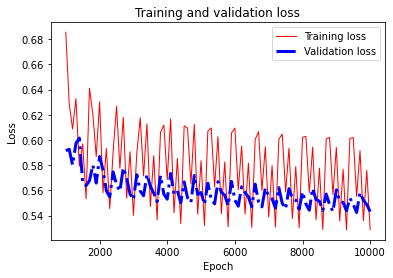

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52886575, Final Validation loss: 0.54316556, Training RMSE: 0.7283381, Validation RMSE: 0.73699766
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6287071, Validation loss: 0.5904584, 
Epoch: 2000, Training loss: 0.6438827, Validation loss: 0.59122044, 
Epoch: 3000, Training loss: 0.5554044, Validation loss: 0.58319265, 
Epoch: 4000, Training loss: 0.5967753, Validation loss: 0.5735182, 
Epoch: 5000, Training loss: 0.58337444, Validation loss: 0.55919254, 
Epoch: 6000, Training loss: 0.6472606, Validation loss: 0.6030711, 
Epoch: 7000, Training loss: 0.5938829, Validation loss: 0.57809234, 
Epoch: 8000, Training loss: 0.592924, Validation loss: 0.5618842, 
Epoch: 9000, Training loss: 0.61301124, Validation loss: 0.5735336, 
Epoch: 10000, Train

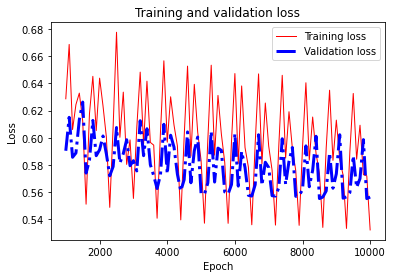

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5322429, Final Validation loss: 0.5564351, Training RMSE: 0.7393259, Validation RMSE: 0.74594575
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6917589, Validation loss: 0.6152959, 
Epoch: 2000, Training loss: 0.66872835, Validation loss: 0.59687835, 
Epoch: 3000, Training loss: 0.58455837, Validation loss: 0.58255696, 
Epoch: 4000, Training loss: 0.60515463, Validation loss: 0.56607527, 
Epoch: 5000, Training loss: 0.607557, Validation loss: 0.56153655, 
Epoch: 6000, Training loss: 0.6375594, Validation loss: 0.58820724, 
Epoch: 7000, Training loss: 0.5666237, Validation loss: 0.5599398, 
Epoch: 8000, Training loss: 0.59478796, Validation loss: 0.5404869, 
Epoch: 9000, Training loss: 0.61172134, Validation loss: 0.55423796, 
Epoch: 10000, Tr

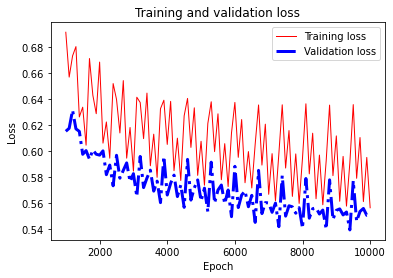

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55624247, Final Validation loss: 0.5508639, Training RMSE: 0.74671793, Validation RMSE: 0.7422021
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6386037, Validation loss: 0.5881749, 
Epoch: 2000, Training loss: 0.6049505, Validation loss: 0.575842, 
Epoch: 3000, Training loss: 0.5400341, Validation loss: 0.54719615, 
Epoch: 4000, Training loss: 0.5739743, Validation loss: 0.5466954, 
Epoch: 5000, Training loss: 0.5796891, Validation loss: 0.5397688, 
Epoch: 6000, Training loss: 0.5994253, Validation loss: 0.55655825, 
Epoch: 7000, Training loss: 0.5515254, Validation loss: 0.54205877, 
Epoch: 8000, Training loss: 0.5861512, Validation loss: 0.54198074, 
Epoch: 9000, Training loss: 0.5952922, Validation loss: 0.5607061, 
Epoch: 10000, Training

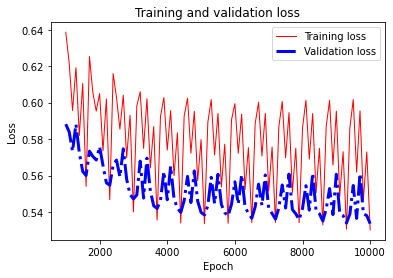

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5301602, Final Validation loss: 0.533565, Training RMSE: 0.7309987, Validation RMSE: 0.73045534
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.69100124, Validation loss: 0.62305355, 
Epoch: 2000, Training loss: 0.6080408, Validation loss: 0.5684568, 
Epoch: 3000, Training loss: 0.54693514, Validation loss: 0.5507886, 
Epoch: 4000, Training loss: 0.58059084, Validation loss: 0.53902835, 
Epoch: 5000, Training loss: 0.61473155, Validation loss: 0.56726724, 
Epoch: 6000, Training loss: 0.6905271, Validation loss: 0.6202517, 
Epoch: 7000, Training loss: 0.5914704, Validation loss: 0.5369417, 
Epoch: 8000, Training loss: 0.5755422, Validation loss: 0.530733, 
Epoch: 9000, Training loss: 0.5787619, Validation loss: 0.52762216, 
Epoch: 10000, Traini

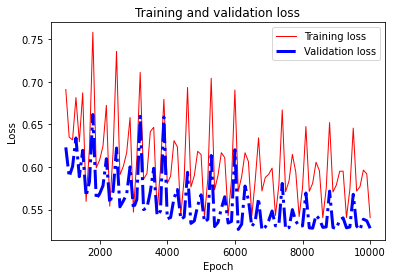

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5406183, Final Validation loss: 0.5279665, Training RMSE: 0.73668015, Validation RMSE: 0.72661304
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.62489504, Validation loss: 0.5959368, 
Epoch: 2000, Training loss: 0.60256386, Validation loss: 0.5493843, 
Epoch: 3000, Training loss: 0.5569342, Validation loss: 0.5564066, 
Epoch: 4000, Training loss: 0.5863297, Validation loss: 0.5708234, 
Epoch: 5000, Training loss: 0.6048148, Validation loss: 0.57689774, 
Epoch: 6000, Training loss: 0.6155128, Validation loss: 0.5568938, 
Epoch: 7000, Training loss: 0.54690564, Validation loss: 0.5362668, 
Epoch: 8000, Training loss: 0.5757641, Validation loss: 0.54667485, 
Epoch: 9000, Training loss: 0.56319165, Validation loss: 0.5302477, 
Epoch: 10000, Train

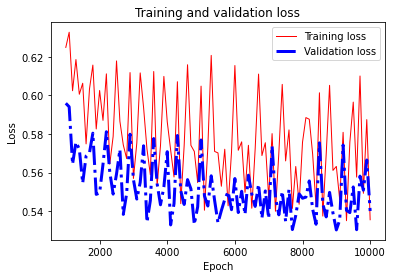

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5355307, Final Validation loss: 0.5400548, Training RMSE: 0.73424387, Validation RMSE: 0.7348842
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.63505125, Validation loss: 0.59989417, 
Epoch: 2000, Training loss: 0.5951915, Validation loss: 0.5693487, 
Epoch: 3000, Training loss: 0.55212593, Validation loss: 0.5644912, 
Epoch: 4000, Training loss: 0.5852549, Validation loss: 0.56702113, 
Epoch: 5000, Training loss: 0.58799076, Validation loss: 0.5546497, 
Epoch: 6000, Training loss: 0.60556656, Validation loss: 0.54832965, 
Epoch: 7000, Training loss: 0.56391144, Validation loss: 0.5567052, 
Epoch: 8000, Training loss: 0.57770884, Validation loss: 0.54623634, 
Epoch: 9000, Training loss: 0.5683504, Validation loss: 0.5350456, 
Epoch: 10000, T

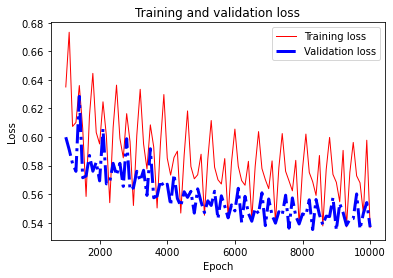

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.536671, Final Validation loss: 0.53695244, Training RMSE: 0.7323083, Validation RMSE: 0.7327704
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.7411438 

Average Validation RMSE for the 10 folds: 0.7409574 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.841203, Validation loss: 0.7140459, 
Epoch: 2000, Training loss: 0.5870255, Validation loss: 0.5672918, 
Epoch: 3000, Training loss: 0.53502744, Validation loss: 0.5417439, 
Epoch: 4000, Training loss: 0.6057575, Validation loss: 0.5894494, 
Epoch: 5000, Tr

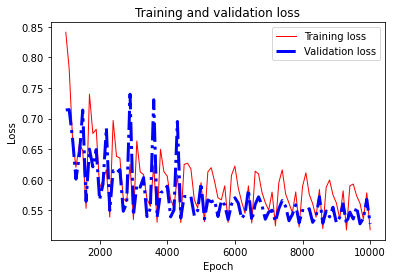

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5182283, Final Validation loss: 0.52806234, Training RMSE: 0.72246796, Validation RMSE: 0.72667897
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6885161, Validation loss: 0.58187497, 
Epoch: 2000, Training loss: 0.6406329, Validation loss: 0.5634576, 
Epoch: 3000, Training loss: 0.54148334, Validation loss: 0.5259701, 
Epoch: 4000, Training loss: 0.57303876, Validation loss: 0.53934723, 
Epoch: 5000, Training loss: 0.5662178, Validation loss: 0.5255775, 
Epoch: 6000, Training loss: 0.5928052, Validation loss: 0.52903634, 
Epoch: 7000, Training loss: 0.5227062, Validation loss: 0.5119558, 
Epoch: 8000, Training loss: 0.56355464, Validation loss: 0.5113902, 
Epoch: 9000, Training loss: 0.5729486, Validation loss: 0.51712716, 
Epoch: 10000, Tra

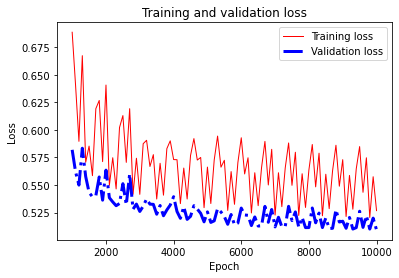

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52673495, Final Validation loss: 0.50923353, Training RMSE: 0.7187615, Validation RMSE: 0.713606
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.5759013, Validation loss: 0.5706565, 
Epoch: 2000, Training loss: 0.55185175, Validation loss: 0.53791517, 
Epoch: 3000, Training loss: 0.52425206, Validation loss: 0.5257206, 
Epoch: 4000, Training loss: 0.58154845, Validation loss: 0.54498154, 
Epoch: 5000, Training loss: 0.56233424, Validation loss: 0.53944325, 
Epoch: 6000, Training loss: 0.5810963, Validation loss: 0.52256054, 
Epoch: 7000, Training loss: 0.5389233, Validation loss: 0.53045046, 
Epoch: 8000, Training loss: 0.546814, Validation loss: 0.51687473, 
Epoch: 9000, Training loss: 0.54476845, Validation loss: 0.51280206, 
Epoch: 10000, T

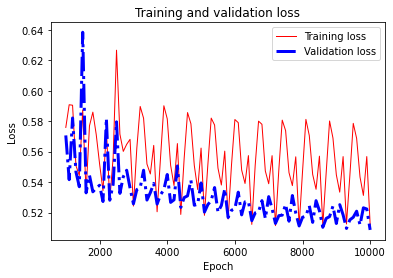

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.51202315, Final Validation loss: 0.5085872, Training RMSE: 0.71784866, Validation RMSE: 0.713153
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6648942, Validation loss: 0.61797947, 
Epoch: 2000, Training loss: 0.5832696, Validation loss: 0.5620771, 
Epoch: 3000, Training loss: 0.5320919, Validation loss: 0.5498165, 
Epoch: 4000, Training loss: 0.6004386, Validation loss: 0.58627087, 
Epoch: 5000, Training loss: 0.56531024, Validation loss: 0.5789668, 
Epoch: 6000, Training loss: 0.59235764, Validation loss: 0.5632805, 
Epoch: 7000, Training loss: 0.57720333, Validation loss: 0.5779584, 
Epoch: 8000, Training loss: 0.5894236, Validation loss: 0.5526511, 
Epoch: 9000, Training loss: 0.56572163, Validation loss: 0.5411204, 
Epoch: 10000, Traini

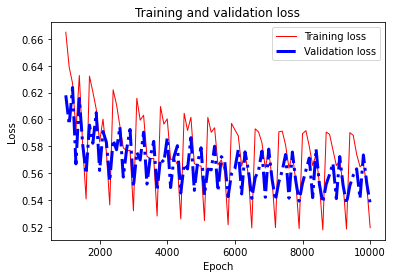

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5194826, Final Validation loss: 0.53748626, Training RMSE: 0.7210715, Validation RMSE: 0.73313457
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6118414, Validation loss: 0.58482, 
Epoch: 2000, Training loss: 0.613176, Validation loss: 0.5646325, 
Epoch: 3000, Training loss: 0.5538255, Validation loss: 0.547667, 
Epoch: 4000, Training loss: 0.5654158, Validation loss: 0.54255563, 
Epoch: 5000, Training loss: 0.5618553, Validation loss: 0.54962933, 
Epoch: 6000, Training loss: 0.608084, Validation loss: 0.5734339, 
Epoch: 7000, Training loss: 0.56027865, Validation loss: 0.5738846, 
Epoch: 8000, Training loss: 0.5519887, Validation loss: 0.5325621, 
Epoch: 9000, Training loss: 0.56601727, Validation loss: 0.5314821, 
Epoch: 10000, Training los

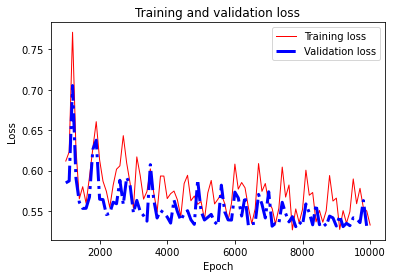

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.532732, Final Validation loss: 0.531599, Training RMSE: 0.72231185, Validation RMSE: 0.72910833
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6784418, Validation loss: 0.61955285, 
Epoch: 2000, Training loss: 0.5886122, Validation loss: 0.5535726, 
Epoch: 3000, Training loss: 0.57402635, Validation loss: 0.5765909, 
Epoch: 4000, Training loss: 0.57732993, Validation loss: 0.5535614, 
Epoch: 5000, Training loss: 0.5642438, Validation loss: 0.5274606, 
Epoch: 6000, Training loss: 0.59383816, Validation loss: 0.5659914, 
Epoch: 7000, Training loss: 0.5627148, Validation loss: 0.5546254, 
Epoch: 8000, Training loss: 0.5854934, Validation loss: 0.5310682, 
Epoch: 9000, Training loss: 0.5713455, Validation loss: 0.533694, 
Epoch: 10000, Training l

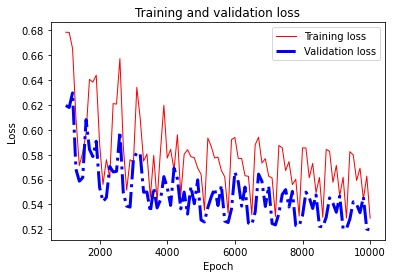

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5289807, Final Validation loss: 0.51950324, Training RMSE: 0.725078, Validation RMSE: 0.7207657
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.80858374, Validation loss: 0.78019476, 
Epoch: 2000, Training loss: 0.60847247, Validation loss: 0.5850094, 
Epoch: 3000, Training loss: 0.63788253, Validation loss: 0.62580854, 
Epoch: 4000, Training loss: 0.68116826, Validation loss: 0.677245, 
Epoch: 5000, Training loss: 0.7018279, Validation loss: 0.6366324, 
Epoch: 6000, Training loss: 0.63207704, Validation loss: 0.6229245, 
Epoch: 7000, Training loss: 0.55638945, Validation loss: 0.542028, 
Epoch: 8000, Training loss: 0.5756446, Validation loss: 0.53941435, 
Epoch: 9000, Training loss: 0.5612174, Validation loss: 0.5312041, 
Epoch: 10000, Traini

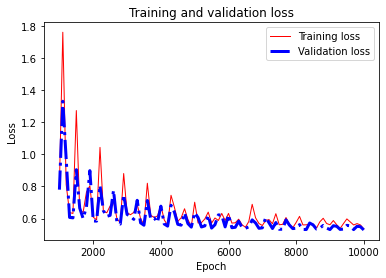

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5352485, Final Validation loss: 0.5290931, Training RMSE: 0.72789836, Validation RMSE: 0.72738785
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7579816, Validation loss: 0.69183195, 
Epoch: 2000, Training loss: 0.61303604, Validation loss: 0.5801119, 
Epoch: 3000, Training loss: 0.60172915, Validation loss: 0.5736482, 
Epoch: 4000, Training loss: 0.55972564, Validation loss: 0.53150934, 
Epoch: 5000, Training loss: 0.58047867, Validation loss: 0.5268671, 
Epoch: 6000, Training loss: 0.6011485, Validation loss: 0.53237504, 
Epoch: 7000, Training loss: 0.5630879, Validation loss: 0.5298617, 
Epoch: 8000, Training loss: 0.58518046, Validation loss: 0.53173953, 
Epoch: 9000, Training loss: 0.5580463, Validation loss: 0.51785916, 
Epoch: 10000, T

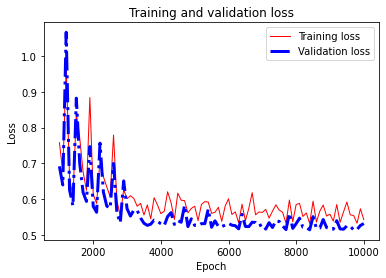

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54283774, Final Validation loss: 0.5320457, Training RMSE: 0.736163, Validation RMSE: 0.72941464
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.67655855, Validation loss: 0.69446456, 
Epoch: 2000, Training loss: 0.6546608, Validation loss: 0.60066926, 
Epoch: 3000, Training loss: 0.53670007, Validation loss: 0.54718184, 
Epoch: 4000, Training loss: 0.57509875, Validation loss: 0.56359756, 
Epoch: 5000, Training loss: 0.55640185, Validation loss: 0.5360322, 
Epoch: 6000, Training loss: 0.61245155, Validation loss: 0.56612676, 
Epoch: 7000, Training loss: 0.5579758, Validation loss: 0.5707116, 
Epoch: 8000, Training loss: 0.5765059, Validation loss: 0.5473009, 
Epoch: 9000, Training loss: 0.5572104, Validation loss: 0.5228061, 
Epoch: 10000, Tr

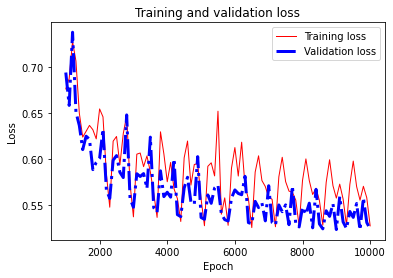

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52683616, Final Validation loss: 0.52333677, Training RMSE: 0.725483, Validation RMSE: 0.7234202
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.60171247, Validation loss: 0.5652865, 
Epoch: 2000, Training loss: 0.57915956, Validation loss: 0.55825, 
Epoch: 3000, Training loss: 0.5337585, Validation loss: 0.53355336, 
Epoch: 4000, Training loss: 0.5624392, Validation loss: 0.5277023, 
Epoch: 5000, Training loss: 0.56474924, Validation loss: 0.5363538, 
Epoch: 6000, Training loss: 0.5905216, Validation loss: 0.5555037, 
Epoch: 7000, Training loss: 0.56067294, Validation loss: 0.537392, 
Epoch: 8000, Training loss: 0.55735767, Validation loss: 0.5250276, 
Epoch: 9000, Training loss: 0.5534667, Validation loss: 0.52210337, 
Epoch: 10000, Trainin

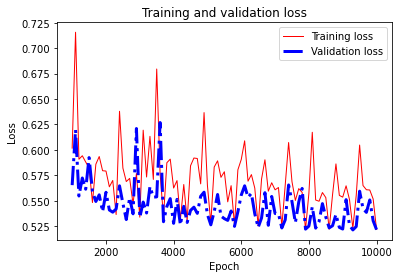

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5217634, Final Validation loss: 0.52150947, Training RMSE: 0.7228661, Validation RMSE: 0.7221561
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7406926 

Average Validation RMSE for the 10 folds: 0.74050796 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6395905, Validation loss: 0.5787192, 
Epoch: 2000, Training loss: 0.59158784, Validation loss: 0.5706791, 
Epoch: 3000, Training loss: 0.53427356, Validation loss: 0.53473663, 
Epoch: 4000, Training loss: 0.55931586, Validation loss: 0.5304229, 
Epoch: 50

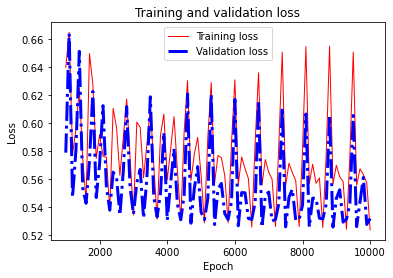

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5235696, Final Validation loss: 0.53173196, Training RMSE: 0.7271522, Validation RMSE: 0.7291995
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.76818824, Validation loss: 0.6761903, 
Epoch: 2000, Training loss: 0.5936202, Validation loss: 0.5615217, 
Epoch: 3000, Training loss: 0.5367974, Validation loss: 0.5401559, 
Epoch: 4000, Training loss: 0.5764956, Validation loss: 0.54678595, 
Epoch: 5000, Training loss: 0.62828547, Validation loss: 0.5661987, 
Epoch: 6000, Training loss: 0.60682327, Validation loss: 0.53869635, 
Epoch: 7000, Training loss: 0.52609354, Validation loss: 0.51642907, 
Epoch: 8000, Training loss: 0.5852624, Validation loss: 0.52061576, 
Epoch: 9000, Training loss: 0.55267835, Validation loss: 0.5135294, 
Epoch: 10000, Tra

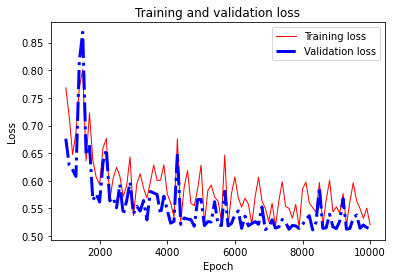

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52002436, Final Validation loss: 0.5128578, Training RMSE: 0.72136503, Validation RMSE: 0.7161409
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.62460905, Validation loss: 0.573788, 
Epoch: 2000, Training loss: 0.58603406, Validation loss: 0.5658578, 
Epoch: 3000, Training loss: 0.5300934, Validation loss: 0.5277927, 
Epoch: 4000, Training loss: 0.5570813, Validation loss: 0.52249587, 
Epoch: 5000, Training loss: 0.54904497, Validation loss: 0.524859, 
Epoch: 6000, Training loss: 0.61726665, Validation loss: 0.57864755, 
Epoch: 7000, Training loss: 0.5458873, Validation loss: 0.5563559, 
Epoch: 8000, Training loss: 0.56804776, Validation loss: 0.5314454, 
Epoch: 9000, Training loss: 0.56002337, Validation loss: 0.52264833, 
Epoch: 10000, Trai

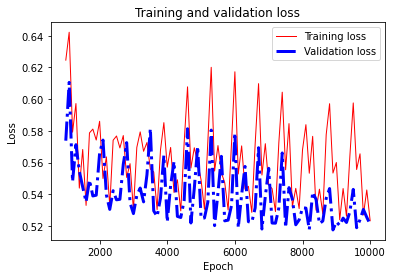

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5232748, Final Validation loss: 0.5210388, Training RMSE: 0.72360575, Validation RMSE: 0.7218301
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 2.3032227, Validation loss: 1.6450578, 
Epoch: 2000, Training loss: 1.2348621, Validation loss: 0.9483518, 
Epoch: 3000, Training loss: 0.5816153, Validation loss: 0.57352096, 
Epoch: 4000, Training loss: 0.5678903, Validation loss: 0.55259013, 
Epoch: 5000, Training loss: 0.58263165, Validation loss: 0.56030357, 
Epoch: 6000, Training loss: 0.6154912, Validation loss: 0.608647, 
Epoch: 7000, Training loss: 0.5522737, Validation loss: 0.56289893, 
Epoch: 8000, Training loss: 0.5779088, Validation loss: 0.5640563, 
Epoch: 9000, Training loss: 0.5782352, Validation loss: 0.5514725, 
Epoch: 10000, Training

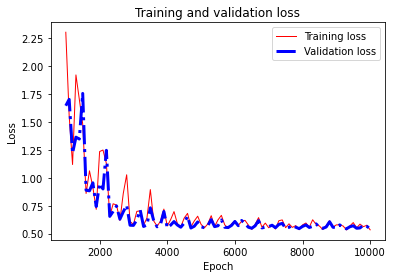

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53389984, Final Validation loss: 0.54401976, Training RMSE: 0.7256741, Validation RMSE: 0.73757696
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6254169, Validation loss: 0.57321966, 
Epoch: 2000, Training loss: 0.57951206, Validation loss: 0.5510701, 
Epoch: 3000, Training loss: 0.53282344, Validation loss: 0.54431397, 
Epoch: 4000, Training loss: 0.5837055, Validation loss: 0.5743101, 
Epoch: 5000, Training loss: 0.5745919, Validation loss: 0.5529252, 
Epoch: 6000, Training loss: 0.6322943, Validation loss: 0.584634, 
Epoch: 7000, Training loss: 0.563131, Validation loss: 0.56433636, 
Epoch: 8000, Training loss: 0.6383267, Validation loss: 0.55790997, 
Epoch: 9000, Training loss: 0.57506883, Validation loss: 0.5428575, 
Epoch: 10000, Train

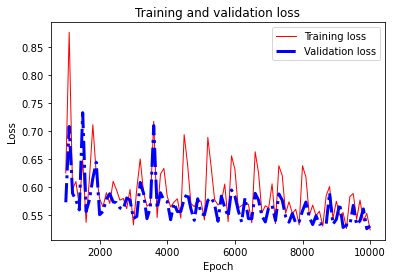

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5239754, Final Validation loss: 0.53106135, Training RMSE: 0.72570723, Validation RMSE: 0.72873956
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.65429384, Validation loss: 0.6097846, 
Epoch: 2000, Training loss: 0.61083317, Validation loss: 0.56270254, 
Epoch: 3000, Training loss: 0.53622687, Validation loss: 0.5392665, 
Epoch: 4000, Training loss: 0.5701031, Validation loss: 0.53179145, 
Epoch: 5000, Training loss: 0.55500317, Validation loss: 0.52953655, 
Epoch: 6000, Training loss: 0.60537696, Validation loss: 0.58015954, 
Epoch: 7000, Training loss: 0.5302658, Validation loss: 0.5245694, 
Epoch: 8000, Training loss: 0.5691134, Validation loss: 0.5274286, 
Epoch: 9000, Training loss: 0.57514626, Validation loss: 0.53158015, 
Epoch: 10000,

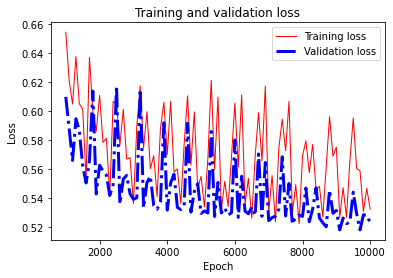

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5323888, Final Validation loss: 0.52293676, Training RMSE: 0.72517854, Validation RMSE: 0.72314364
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6458222, Validation loss: 0.59401685, 
Epoch: 2000, Training loss: 0.64276534, Validation loss: 0.58220476, 
Epoch: 3000, Training loss: 0.53007346, Validation loss: 0.53500426, 
Epoch: 4000, Training loss: 0.5588386, Validation loss: 0.5391332, 
Epoch: 5000, Training loss: 0.571281, Validation loss: 0.5502409, 
Epoch: 6000, Training loss: 0.58859265, Validation loss: 0.54508805, 
Epoch: 7000, Training loss: 0.5278651, Validation loss: 0.5313907, 
Epoch: 8000, Training loss: 0.5686449, Validation loss: 0.5391422, 
Epoch: 9000, Training loss: 0.5633765, Validation loss: 0.5282598, 
Epoch: 10000, Trai

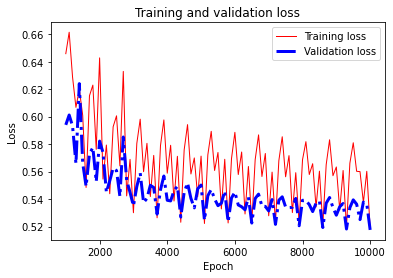

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5188881, Final Validation loss: 0.517573, Training RMSE: 0.7207691, Validation RMSE: 0.71942544
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6928845, Validation loss: 0.63090336, 
Epoch: 2000, Training loss: 0.62557065, Validation loss: 0.609139, 
Epoch: 3000, Training loss: 0.5740711, Validation loss: 0.5606863, 
Epoch: 4000, Training loss: 0.5661416, Validation loss: 0.5338031, 
Epoch: 5000, Training loss: 0.62518823, Validation loss: 0.5675455, 
Epoch: 6000, Training loss: 0.58448434, Validation loss: 0.532914, 
Epoch: 7000, Training loss: 0.53919274, Validation loss: 0.5446471, 
Epoch: 8000, Training loss: 0.580194, Validation loss: 0.53279424, 
Epoch: 9000, Training loss: 0.60259324, Validation loss: 0.53758305, 
Epoch: 10000, Training

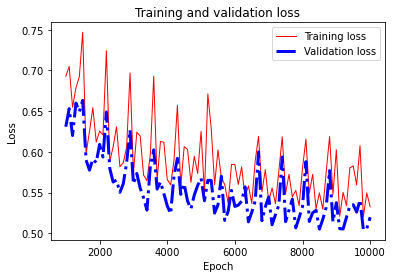

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5325413, Final Validation loss: 0.5196407, Training RMSE: 0.72663856, Validation RMSE: 0.7208611
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6599135, Validation loss: 0.637215, 
Epoch: 2000, Training loss: 0.5973352, Validation loss: 0.55180156, 
Epoch: 3000, Training loss: 0.52668756, Validation loss: 0.55039746, 
Epoch: 4000, Training loss: 0.5755358, Validation loss: 0.5566272, 
Epoch: 5000, Training loss: 0.5636722, Validation loss: 0.53704137, 
Epoch: 6000, Training loss: 0.597986, Validation loss: 0.54009145, 
Epoch: 7000, Training loss: 0.5339879, Validation loss: 0.52678, 
Epoch: 8000, Training loss: 0.5686993, Validation loss: 0.5214028, 
Epoch: 9000, Training loss: 0.5567216, Validation loss: 0.51439065, 
Epoch: 10000, Training l

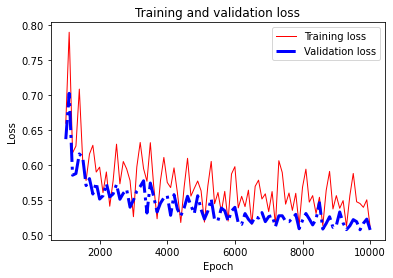

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.51162463, Final Validation loss: 0.50785553, Training RMSE: 0.7170595, Validation RMSE: 0.7126398
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.58841443, Validation loss: 0.5660054, 
Epoch: 2000, Training loss: 0.5898678, Validation loss: 0.55104053, 
Epoch: 3000, Training loss: 0.52286637, Validation loss: 0.52426493, 
Epoch: 4000, Training loss: 0.5531218, Validation loss: 0.52548295, 
Epoch: 5000, Training loss: 0.55733967, Validation loss: 0.5229978, 
Epoch: 6000, Training loss: 0.5989725, Validation loss: 0.53285766, 
Epoch: 7000, Training loss: 0.53038174, Validation loss: 0.53522253, 
Epoch: 8000, Training loss: 0.5641881, Validation loss: 0.53357786, 
Epoch: 9000, Training loss: 0.5544447, Validation loss: 0.5598034, 
Epoch: 10000, 

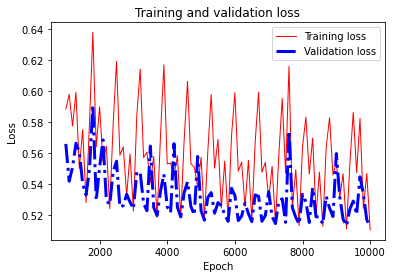

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.51064235, Final Validation loss: 0.51283187, Training RMSE: 0.7179359, Validation RMSE: 0.7161228
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.74024165 

Average Validation RMSE for the 10 folds: 0.74004805 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6373962, Validation loss: 0.63192505, 
Epoch: 2000, Training loss: 0.59911186, Validation loss: 0.58177614, 
Epoch: 3000, Training loss: 0.5567577, Validation loss: 0.56316864, 
Epoch: 4000, Training loss: 0.57864213, Validation loss: 0.55081797, 
Epoch: 5

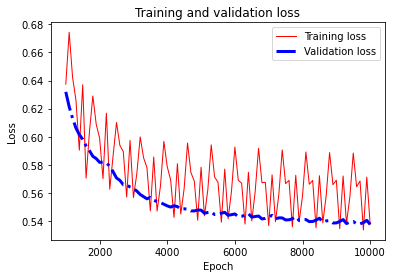

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5378314, Final Validation loss: 0.5375607, Training RMSE: 0.729223, Validation RMSE: 0.7331853
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.7964217, Validation loss: 0.78896165, 
Epoch: 2000, Training loss: 0.6699482, Validation loss: 0.6366872, 
Epoch: 3000, Training loss: 0.59849846, Validation loss: 0.5753239, 
Epoch: 4000, Training loss: 0.5877645, Validation loss: 0.5536587, 
Epoch: 5000, Training loss: 0.59016335, Validation loss: 0.5435475, 
Epoch: 6000, Training loss: 0.5974547, Validation loss: 0.542062, 
Epoch: 7000, Training loss: 0.5408066, Validation loss: 0.53654003, 
Epoch: 8000, Training loss: 0.5579816, Validation loss: 0.5323912, 
Epoch: 9000, Training loss: 0.5545461, Validation loss: 0.52854776, 
Epoch: 10000, Training loss

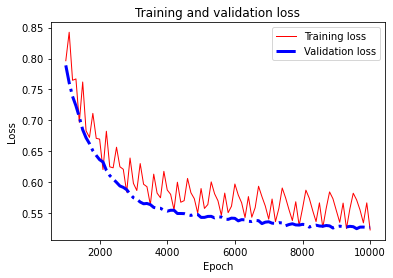

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52337724, Final Validation loss: 0.52764964, Training RMSE: 0.7332538, Validation RMSE: 0.72639495
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.67076737, Validation loss: 0.64373404, 
Epoch: 2000, Training loss: 0.62106067, Validation loss: 0.59137285, 
Epoch: 3000, Training loss: 0.56883806, Validation loss: 0.577183, 
Epoch: 4000, Training loss: 0.5930977, Validation loss: 0.5675428, 
Epoch: 5000, Training loss: 0.58731675, Validation loss: 0.5577007, 
Epoch: 6000, Training loss: 0.6134674, Validation loss: 0.55063134, 
Epoch: 7000, Training loss: 0.5476352, Validation loss: 0.54739034, 
Epoch: 8000, Training loss: 0.5784695, Validation loss: 0.54293686, 
Epoch: 9000, Training loss: 0.57083714, Validation loss: 0.5435823, 
Epoch: 10000, Trai

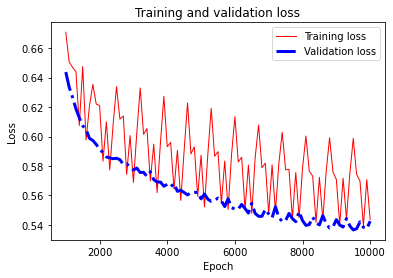

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54358685, Final Validation loss: 0.542524, Training RMSE: 0.7354087, Validation RMSE: 0.73656225
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.69403285, Validation loss: 0.68540215, 
Epoch: 2000, Training loss: 0.6190425, Validation loss: 0.607974, 
Epoch: 3000, Training loss: 0.5694066, Validation loss: 0.5779777, 
Epoch: 4000, Training loss: 0.5702565, Validation loss: 0.5704091, 
Epoch: 5000, Training loss: 0.60736614, Validation loss: 0.56957763, 
Epoch: 6000, Training loss: 0.5971288, Validation loss: 0.5617297, 
Epoch: 7000, Training loss: 0.54299825, Validation loss: 0.56273884, 
Epoch: 8000, Training loss: 0.568018, Validation loss: 0.55880165, 
Epoch: 9000, Training loss: 0.5768478, Validation loss: 0.55630434, 
Epoch: 10000, Training 

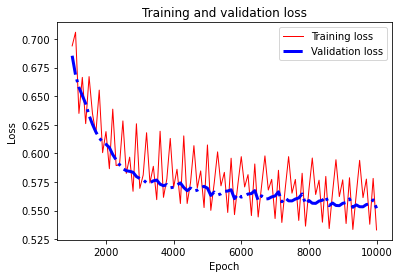

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53305095, Final Validation loss: 0.55199677, Training RMSE: 0.7341918, Validation RMSE: 0.74296486
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.63504755, Validation loss: 0.61641085, 
Epoch: 2000, Training loss: 0.58874756, Validation loss: 0.57676315, 
Epoch: 3000, Training loss: 0.54838675, Validation loss: 0.56666124, 
Epoch: 4000, Training loss: 0.5802748, Validation loss: 0.5587081, 
Epoch: 5000, Training loss: 0.57959026, Validation loss: 0.5524592, 
Epoch: 6000, Training loss: 0.5965496, Validation loss: 0.5538987, 
Epoch: 7000, Training loss: 0.5446538, Validation loss: 0.5510248, 
Epoch: 8000, Training loss: 0.5641828, Validation loss: 0.5486418, 
Epoch: 9000, Training loss: 0.5737465, Validation loss: 0.5513984, 
Epoch: 10000, Traini

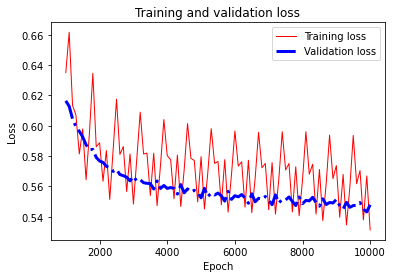

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5313386, Final Validation loss: 0.54796374, Training RMSE: 0.73277056, Validation RMSE: 0.7402457
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.67441607, Validation loss: 0.634824, 
Epoch: 2000, Training loss: 0.58751434, Validation loss: 0.566356, 
Epoch: 3000, Training loss: 0.5491922, Validation loss: 0.55047244, 
Epoch: 4000, Training loss: 0.5876182, Validation loss: 0.5426419, 
Epoch: 5000, Training loss: 0.5772212, Validation loss: 0.5355955, 
Epoch: 6000, Training loss: 0.5951433, Validation loss: 0.5383711, 
Epoch: 7000, Training loss: 0.5405178, Validation loss: 0.53750324, 
Epoch: 8000, Training loss: 0.56719697, Validation loss: 0.5314893, 
Epoch: 9000, Training loss: 0.5674372, Validation loss: 0.53392124, 
Epoch: 10000, Training l

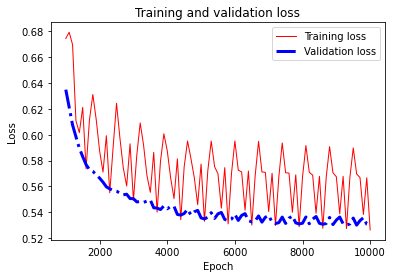

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.526304, Final Validation loss: 0.52997714, Training RMSE: 0.7337694, Validation RMSE: 0.7279953
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6022661, Validation loss: 0.5796233, 
Epoch: 2000, Training loss: 0.58529735, Validation loss: 0.5536736, 
Epoch: 3000, Training loss: 0.54180396, Validation loss: 0.54555374, 
Epoch: 4000, Training loss: 0.56991875, Validation loss: 0.54073983, 
Epoch: 5000, Training loss: 0.5886456, Validation loss: 0.54348785, 
Epoch: 6000, Training loss: 0.589857, Validation loss: 0.5446208, 
Epoch: 7000, Training loss: 0.53681946, Validation loss: 0.5385131, 
Epoch: 8000, Training loss: 0.5684641, Validation loss: 0.54024804, 
Epoch: 9000, Training loss: 0.5713513, Validation loss: 0.5384074, 
Epoch: 10000, Training 

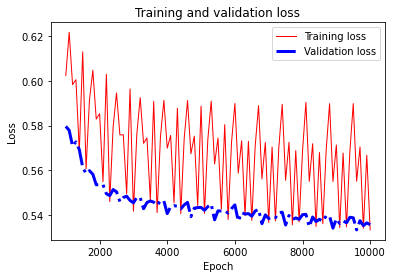

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.533467, Final Validation loss: 0.535793, Training RMSE: 0.7331284, Validation RMSE: 0.73197883
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 1.0207158, Validation loss: 0.89269245, 
Epoch: 2000, Training loss: 0.7238513, Validation loss: 0.6771062, 
Epoch: 3000, Training loss: 0.6117401, Validation loss: 0.6174869, 
Epoch: 4000, Training loss: 0.61725914, Validation loss: 0.5812765, 
Epoch: 5000, Training loss: 0.62532765, Validation loss: 0.5632795, 
Epoch: 6000, Training loss: 0.61311215, Validation loss: 0.55492085, 
Epoch: 7000, Training loss: 0.55338234, Validation loss: 0.5497181, 
Epoch: 8000, Training loss: 0.5847074, Validation loss: 0.54741406, 
Epoch: 9000, Training loss: 0.5759423, Validation loss: 0.5484703, 
Epoch: 10000, Training l

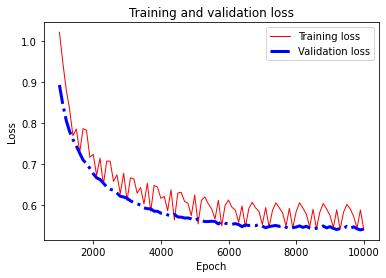

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54150164, Final Validation loss: 0.54272664, Training RMSE: 0.7400124, Validation RMSE: 0.7366998
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.73526084, Validation loss: 0.6889002, 
Epoch: 2000, Training loss: 0.6282476, Validation loss: 0.6021504, 
Epoch: 3000, Training loss: 0.56173563, Validation loss: 0.56713504, 
Epoch: 4000, Training loss: 0.565068, Validation loss: 0.5492709, 
Epoch: 5000, Training loss: 0.5892854, Validation loss: 0.5435795, 
Epoch: 6000, Training loss: 0.587442, Validation loss: 0.5496737, 
Epoch: 7000, Training loss: 0.5402563, Validation loss: 0.536446, 
Epoch: 8000, Training loss: 0.5766225, Validation loss: 0.5387636, 
Epoch: 9000, Training loss: 0.5673652, Validation loss: 0.54119647, 
Epoch: 10000, Training loss

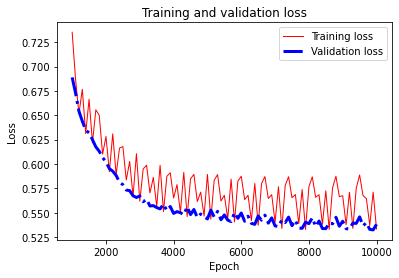

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53320795, Final Validation loss: 0.5380403, Training RMSE: 0.7334145, Validation RMSE: 0.7335123
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.66152304, Validation loss: 0.6406074, 
Epoch: 2000, Training loss: 0.59218156, Validation loss: 0.578902, 
Epoch: 3000, Training loss: 0.56189156, Validation loss: 0.56138194, 
Epoch: 4000, Training loss: 0.5792842, Validation loss: 0.55319566, 
Epoch: 5000, Training loss: 0.5626451, Validation loss: 0.54768866, 
Epoch: 6000, Training loss: 0.58648646, Validation loss: 0.53904915, 
Epoch: 7000, Training loss: 0.53505117, Validation loss: 0.53992087, 
Epoch: 8000, Training loss: 0.5473374, Validation loss: 0.53856915, 
Epoch: 9000, Training loss: 0.5664883, Validation loss: 0.5377519, 
Epoch: 10000, Trai

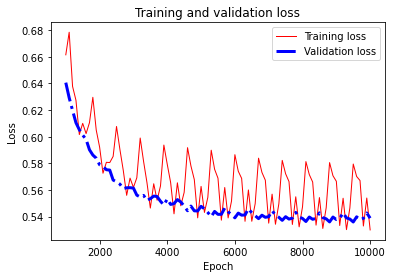

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52996016, Final Validation loss: 0.53879815, Training RMSE: 0.7291112, Validation RMSE: 0.7340287
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.74007136 

Average Validation RMSE for the 10 folds: 0.7399058 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.654911, Validation loss: 0.6269218, 
Epoch: 2000, Training loss: 0.60263747, Validation loss: 0.5805907, 
Epoch: 3000, Training loss: 0.5515535, Validation loss: 0.582201, 
Epoch: 4000, Training loss: 0.58629715, Validation loss: 0.5517543, 
Epoch: 5000, Train

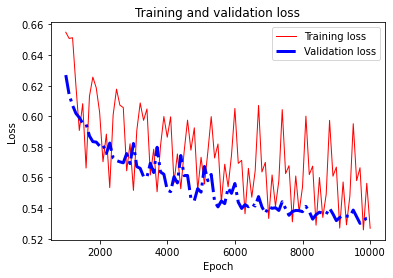

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52681255, Final Validation loss: 0.53362364, Training RMSE: 0.72494423, Validation RMSE: 0.73049545
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6645061, Validation loss: 0.6568989, 
Epoch: 2000, Training loss: 0.60419106, Validation loss: 0.571071, 
Epoch: 3000, Training loss: 0.5559594, Validation loss: 0.54739565, 
Epoch: 4000, Training loss: 0.5761145, Validation loss: 0.5360679, 
Epoch: 5000, Training loss: 0.58128273, Validation loss: 0.52790445, 
Epoch: 6000, Training loss: 0.61600494, Validation loss: 0.5345041, 
Epoch: 7000, Training loss: 0.53393656, Validation loss: 0.52446795, 
Epoch: 8000, Training loss: 0.55885947, Validation loss: 0.52191603, 
Epoch: 9000, Training loss: 0.5656015, Validation loss: 0.52485603, 
Epoch: 10000, Tra

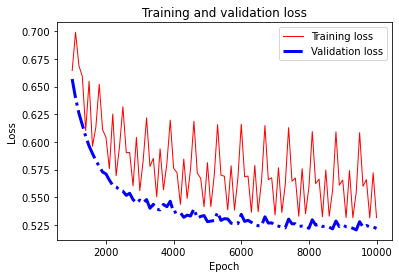

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53155833, Final Validation loss: 0.5217789, Training RMSE: 0.72927403, Validation RMSE: 0.7223426
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.9981588, Validation loss: 0.87168324, 
Epoch: 2000, Training loss: 0.70037323, Validation loss: 0.6600677, 
Epoch: 3000, Training loss: 0.582896, Validation loss: 0.5955575, 
Epoch: 4000, Training loss: 0.5949002, Validation loss: 0.5650012, 
Epoch: 5000, Training loss: 0.5965606, Validation loss: 0.5553214, 
Epoch: 6000, Training loss: 0.60008395, Validation loss: 0.54725415, 
Epoch: 7000, Training loss: 0.5466803, Validation loss: 0.5403932, 
Epoch: 8000, Training loss: 0.5720963, Validation loss: 0.5368155, 
Epoch: 9000, Training loss: 0.57887495, Validation loss: 0.52768844, 
Epoch: 10000, Training 

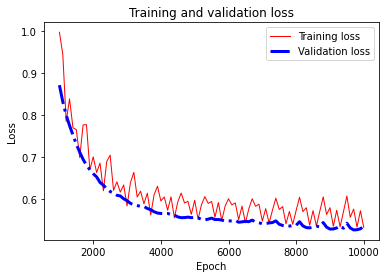

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5318176, Final Validation loss: 0.53477895, Training RMSE: 0.73370624, Validation RMSE: 0.7312858
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8050786, Validation loss: 0.82009214, 
Epoch: 2000, Training loss: 0.6557538, Validation loss: 0.64231354, 
Epoch: 3000, Training loss: 0.5902021, Validation loss: 0.61063004, 
Epoch: 4000, Training loss: 0.598729, Validation loss: 0.5775907, 
Epoch: 5000, Training loss: 0.59110737, Validation loss: 0.56889844, 
Epoch: 6000, Training loss: 0.5929559, Validation loss: 0.56094563, 
Epoch: 7000, Training loss: 0.5461726, Validation loss: 0.55665463, 
Epoch: 8000, Training loss: 0.5914565, Validation loss: 0.5581351, 
Epoch: 9000, Training loss: 0.5679432, Validation loss: 0.54780895, 
Epoch: 10000, Trainin

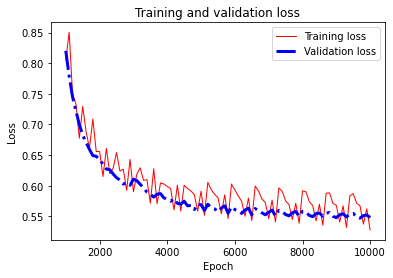

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5277691, Final Validation loss: 0.5478725, Training RMSE: 0.7298392, Validation RMSE: 0.74018407
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.801003, Validation loss: 0.7637443, 
Epoch: 2000, Training loss: 0.6291159, Validation loss: 0.6340451, 
Epoch: 3000, Training loss: 0.56837076, Validation loss: 0.5910194, 
Epoch: 4000, Training loss: 0.60349834, Validation loss: 0.5770968, 
Epoch: 5000, Training loss: 0.60064924, Validation loss: 0.5592727, 
Epoch: 6000, Training loss: 0.61071646, Validation loss: 0.5553856, 
Epoch: 7000, Training loss: 0.5485046, Validation loss: 0.5479399, 
Epoch: 8000, Training loss: 0.5815733, Validation loss: 0.55724424, 
Epoch: 9000, Training loss: 0.5712626, Validation loss: 0.54360723, 
Epoch: 10000, Training l

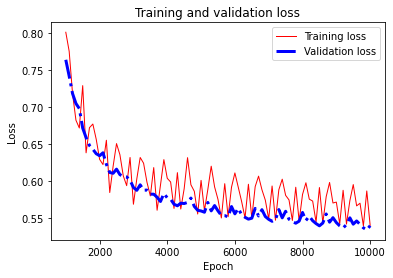

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5398292, Final Validation loss: 0.5393646, Training RMSE: 0.73232305, Validation RMSE: 0.73441446
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.0347421, Validation loss: 0.97620326, 
Epoch: 2000, Training loss: 0.76747, Validation loss: 0.7121619, 
Epoch: 3000, Training loss: 0.62751675, Validation loss: 0.6194758, 
Epoch: 4000, Training loss: 0.6369151, Validation loss: 0.5979771, 
Epoch: 5000, Training loss: 0.6170792, Validation loss: 0.5606794, 
Epoch: 6000, Training loss: 0.607221, Validation loss: 0.55984616, 
Epoch: 7000, Training loss: 0.55066293, Validation loss: 0.53799057, 
Epoch: 8000, Training loss: 0.5692431, Validation loss: 0.5513919, 
Epoch: 9000, Training loss: 0.5755288, Validation loss: 0.5278313, 
Epoch: 10000, Training los

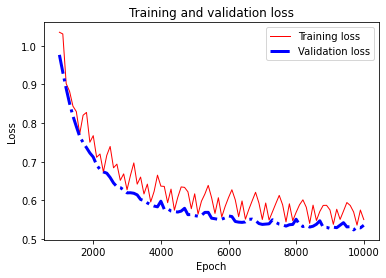

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5505128, Final Validation loss: 0.5357999, Training RMSE: 0.7428545, Validation RMSE: 0.73198354
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8644185, Validation loss: 0.8338009, 
Epoch: 2000, Training loss: 0.6969923, Validation loss: 0.6425955, 
Epoch: 3000, Training loss: 0.58678067, Validation loss: 0.5945579, 
Epoch: 4000, Training loss: 0.6066444, Validation loss: 0.57165873, 
Epoch: 5000, Training loss: 0.59411144, Validation loss: 0.5572509, 
Epoch: 6000, Training loss: 0.6018395, Validation loss: 0.5554384, 
Epoch: 7000, Training loss: 0.54807043, Validation loss: 0.5474526, 
Epoch: 8000, Training loss: 0.59045124, Validation loss: 0.55924696, 
Epoch: 9000, Training loss: 0.5768569, Validation loss: 0.5422843, 
Epoch: 10000, Training 

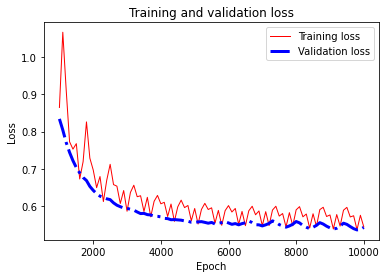

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5448223, Final Validation loss: 0.5435215, Training RMSE: 0.7364049, Validation RMSE: 0.7372391
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.1524534, Validation loss: 1.2158368, 
Epoch: 2000, Training loss: 0.81685823, Validation loss: 0.78346103, 
Epoch: 3000, Training loss: 0.66187704, Validation loss: 0.65550685, 
Epoch: 4000, Training loss: 0.6525051, Validation loss: 0.61319464, 
Epoch: 5000, Training loss: 0.6405724, Validation loss: 0.58332855, 
Epoch: 6000, Training loss: 0.61386794, Validation loss: 0.5695658, 
Epoch: 7000, Training loss: 0.56325746, Validation loss: 0.5590773, 
Epoch: 8000, Training loss: 0.58707166, Validation loss: 0.5509035, 
Epoch: 9000, Training loss: 0.5892228, Validation loss: 0.544174, 
Epoch: 10000, Training

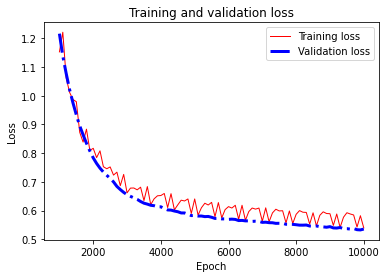

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53974974, Final Validation loss: 0.535813, Training RMSE: 0.7370424, Validation RMSE: 0.7319925
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7176153, Validation loss: 0.68472254, 
Epoch: 2000, Training loss: 0.604893, Validation loss: 0.5923237, 
Epoch: 3000, Training loss: 0.56396747, Validation loss: 0.5624074, 
Epoch: 4000, Training loss: 0.5823221, Validation loss: 0.55189085, 
Epoch: 5000, Training loss: 0.5702338, Validation loss: 0.54073685, 
Epoch: 6000, Training loss: 0.5900105, Validation loss: 0.5376132, 
Epoch: 7000, Training loss: 0.5314169, Validation loss: 0.5278687, 
Epoch: 8000, Training loss: 0.5590017, Validation loss: 0.5276921, 
Epoch: 9000, Training loss: 0.5615572, Validation loss: 0.5277226, 
Epoch: 10000, Training loss

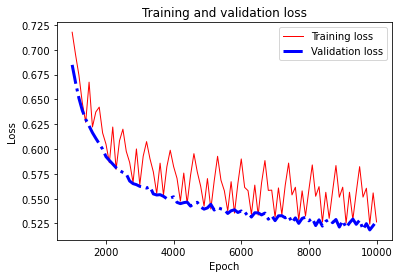

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5265741, Final Validation loss: 0.5274485, Training RMSE: 0.7260367, Validation RMSE: 0.7262565
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.91990316, Validation loss: 0.89988774, 
Epoch: 2000, Training loss: 0.6800166, Validation loss: 0.64124393, 
Epoch: 3000, Training loss: 0.57596, Validation loss: 0.59000856, 
Epoch: 4000, Training loss: 0.6091485, Validation loss: 0.5657755, 
Epoch: 5000, Training loss: 0.589841, Validation loss: 0.5545914, 
Epoch: 6000, Training loss: 0.59609425, Validation loss: 0.5446495, 
Epoch: 7000, Training loss: 0.5491071, Validation loss: 0.54450077, 
Epoch: 8000, Training loss: 0.57690674, Validation loss: 0.5411567, 
Epoch: 9000, Training loss: 0.5696602, Validation loss: 0.53619623, 
Epoch: 10000, Training l

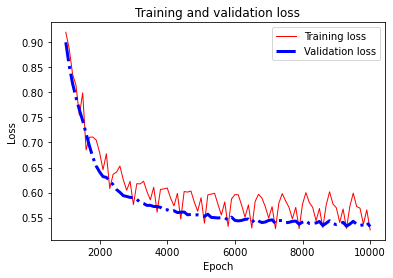

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5255478, Final Validation loss: 0.5323771, Training RMSE: 0.7296357, Validation RMSE: 0.7296418
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.7398795 

Average Validation RMSE for the 10 folds: 0.73970276 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.75393033, Validation loss: 0.7276347, 
Epoch: 2000, Training loss: 0.6606425, Validation loss: 0.62583727, 
Epoch: 3000, Training loss: 0.5695881, Validation loss: 0.5911536, 
Epoch: 4000, Training loss: 0.58146167, Validation loss: 0.5712329, 
Epoch: 5000, Trai

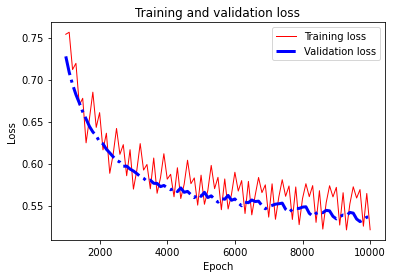

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5212407, Final Validation loss: 0.5365928, Training RMSE: 0.7255461, Validation RMSE: 0.73252493
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.78213704, Validation loss: 0.7405282, 
Epoch: 2000, Training loss: 0.67450124, Validation loss: 0.6290674, 
Epoch: 3000, Training loss: 0.5892221, Validation loss: 0.59425485, 
Epoch: 4000, Training loss: 0.5995022, Validation loss: 0.5694444, 
Epoch: 5000, Training loss: 0.5975174, Validation loss: 0.5592316, 
Epoch: 6000, Training loss: 0.60588634, Validation loss: 0.55061424, 
Epoch: 7000, Training loss: 0.54504716, Validation loss: 0.54402363, 
Epoch: 8000, Training loss: 0.56427073, Validation loss: 0.53974867, 
Epoch: 9000, Training loss: 0.57515204, Validation loss: 0.531709, 
Epoch: 10000, Traini

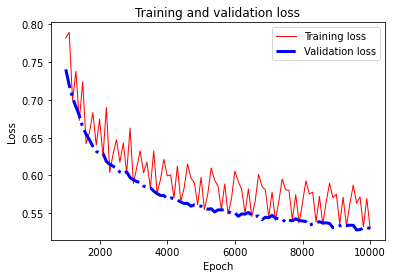

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5295345, Final Validation loss: 0.5297321, Training RMSE: 0.73085034, Validation RMSE: 0.72782695
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.5966039, Validation loss: 0.5710241, 
Epoch: 2000, Training loss: 0.5842755, Validation loss: 0.54166466, 
Epoch: 3000, Training loss: 0.5279636, Validation loss: 0.5415524, 
Epoch: 4000, Training loss: 0.5518127, Validation loss: 0.5251075, 
Epoch: 5000, Training loss: 0.5650721, Validation loss: 0.5263153, 
Epoch: 6000, Training loss: 0.57929766, Validation loss: 0.52335167, 
Epoch: 7000, Training loss: 0.52191174, Validation loss: 0.5226019, 
Epoch: 8000, Training loss: 0.53941894, Validation loss: 0.52051014, 
Epoch: 9000, Training loss: 0.5649105, Validation loss: 0.51845396, 
Epoch: 10000, Trainin

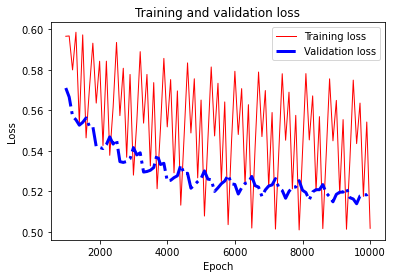

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5016688, Final Validation loss: 0.5197292, Training RMSE: 0.7212771, Validation RMSE: 0.72092247
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7285476, Validation loss: 0.69173443, 
Epoch: 2000, Training loss: 0.60673213, Validation loss: 0.6140387, 
Epoch: 3000, Training loss: 0.55300045, Validation loss: 0.58681667, 
Epoch: 4000, Training loss: 0.5899218, Validation loss: 0.57581687, 
Epoch: 5000, Training loss: 0.5762392, Validation loss: 0.56841165, 
Epoch: 6000, Training loss: 0.58292764, Validation loss: 0.5615969, 
Epoch: 7000, Training loss: 0.5377395, Validation loss: 0.5619135, 
Epoch: 8000, Training loss: 0.5573005, Validation loss: 0.5505444, 
Epoch: 9000, Training loss: 0.57069093, Validation loss: 0.5507719, 
Epoch: 10000, Trainin

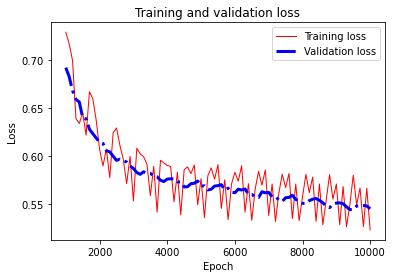

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52286744, Final Validation loss: 0.5447877, Training RMSE: 0.72398734, Validation RMSE: 0.73809737
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.5992401, Validation loss: 0.58348256, 
Epoch: 2000, Training loss: 0.5918103, Validation loss: 0.555526, 
Epoch: 3000, Training loss: 0.53032327, Validation loss: 0.5400328, 
Epoch: 4000, Training loss: 0.5537677, Validation loss: 0.53613114, 
Epoch: 5000, Training loss: 0.5669454, Validation loss: 0.5291158, 
Epoch: 6000, Training loss: 0.5853443, Validation loss: 0.52830195, 
Epoch: 7000, Training loss: 0.52438647, Validation loss: 0.5241976, 
Epoch: 8000, Training loss: 0.55845374, Validation loss: 0.5234335, 
Epoch: 9000, Training loss: 0.56695217, Validation loss: 0.5271134, 
Epoch: 10000, Trainin

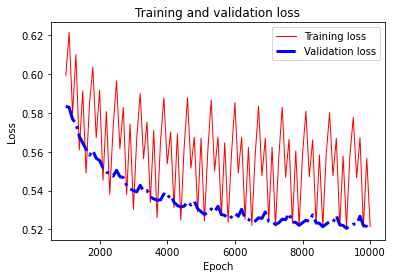

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52141607, Final Validation loss: 0.5197218, Training RMSE: 0.72269285, Validation RMSE: 0.72091734
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.68492967, Validation loss: 0.65314436, 
Epoch: 2000, Training loss: 0.59477127, Validation loss: 0.58238, 
Epoch: 3000, Training loss: 0.54909277, Validation loss: 0.5548811, 
Epoch: 4000, Training loss: 0.5807439, Validation loss: 0.54845244, 
Epoch: 5000, Training loss: 0.57543814, Validation loss: 0.53442425, 
Epoch: 6000, Training loss: 0.6126591, Validation loss: 0.5339269, 
Epoch: 7000, Training loss: 0.5334821, Validation loss: 0.5328056, 
Epoch: 8000, Training loss: 0.5619774, Validation loss: 0.52551776, 
Epoch: 9000, Training loss: 0.56485486, Validation loss: 0.52316844, 
Epoch: 10000, Train

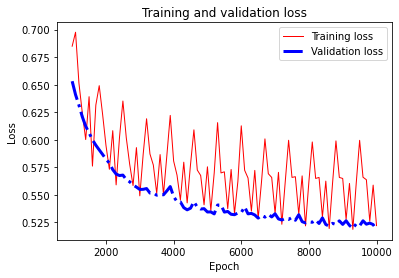

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5220578, Final Validation loss: 0.5181486, Training RMSE: 0.72515595, Validation RMSE: 0.7198254
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.56832254, Validation loss: 0.5549611, 
Epoch: 2000, Training loss: 0.58525527, Validation loss: 0.54587585, 
Epoch: 3000, Training loss: 0.5396908, Validation loss: 0.53811026, 
Epoch: 4000, Training loss: 0.5610887, Validation loss: 0.52818274, 
Epoch: 5000, Training loss: 0.5668375, Validation loss: 0.52642155, 
Epoch: 6000, Training loss: 0.5735602, Validation loss: 0.5255253, 
Epoch: 7000, Training loss: 0.522493, Validation loss: 0.52040595, 
Epoch: 8000, Training loss: 0.54664373, Validation loss: 0.5212631, 
Epoch: 9000, Training loss: 0.56078655, Validation loss: 0.5232513, 
Epoch: 10000, Trainin

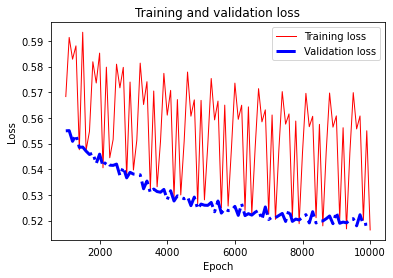

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5163475, Final Validation loss: 0.51869994, Training RMSE: 0.72294146, Validation RMSE: 0.7202083
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.9073306, Validation loss: 0.83351463, 
Epoch: 2000, Training loss: 0.68115205, Validation loss: 0.6336558, 
Epoch: 3000, Training loss: 0.6104552, Validation loss: 0.5962042, 
Epoch: 4000, Training loss: 0.628194, Validation loss: 0.57543826, 
Epoch: 5000, Training loss: 0.61136097, Validation loss: 0.560549, 
Epoch: 6000, Training loss: 0.6116512, Validation loss: 0.54762924, 
Epoch: 7000, Training loss: 0.5498318, Validation loss: 0.53537315, 
Epoch: 8000, Training loss: 0.5857755, Validation loss: 0.53708655, 
Epoch: 9000, Training loss: 0.577101, Validation loss: 0.5263865, 
Epoch: 10000, Training l

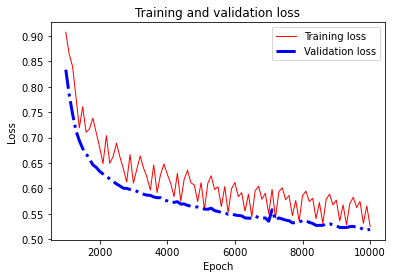

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5250729, Final Validation loss: 0.519167, Training RMSE: 0.72848195, Validation RMSE: 0.7205324
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.87793446, Validation loss: 0.86578315, 
Epoch: 2000, Training loss: 0.721371, Validation loss: 0.66718626, 
Epoch: 3000, Training loss: 0.62250173, Validation loss: 0.6248846, 
Epoch: 4000, Training loss: 0.6140253, Validation loss: 0.58903843, 
Epoch: 5000, Training loss: 0.62669307, Validation loss: 0.5742885, 
Epoch: 6000, Training loss: 0.60830194, Validation loss: 0.5755673, 
Epoch: 7000, Training loss: 0.5585975, Validation loss: 0.5637411, 
Epoch: 8000, Training loss: 0.58980215, Validation loss: 0.55639124, 
Epoch: 9000, Training loss: 0.58544743, Validation loss: 0.54745615, 
Epoch: 10000, Traini

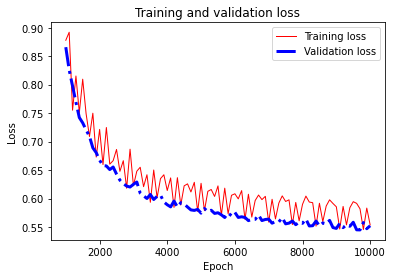

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.55359334, Final Validation loss: 0.5521236, Training RMSE: 0.7388354, Validation RMSE: 0.7430502
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MSE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.7063093, Validation loss: 1.9117794, 
Epoch: 2000, Training loss: 1.0848091, Validation loss: 1.0736824, 
Epoch: 3000, Training loss: 0.69686025, Validation loss: 0.81105244, 
Epoch: 4000, Training loss: 0.720978, Validation loss: 0.70234144, 
Epoch: 5000, Training loss: 0.6630024, Validation loss: 0.64645636, 
Epoch: 6000, Training loss: 0.6705596, Validation loss: 0.6165935, 
Epoch: 7000, Training loss: 0.5843759, Validation loss: 0.5861681, 
Epoch: 8000, Training loss: 0.5988672, Validation loss: 0.5789731, 
Epoch: 9000, Training loss: 0.6057761, Validation loss: 0.562053, 
Epoch: 10000, Training los

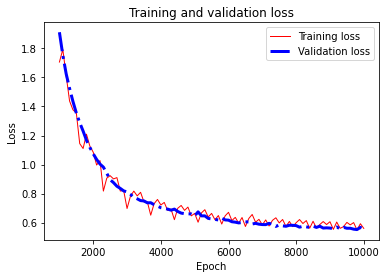

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5598007, Final Validation loss: 0.55448014, Training RMSE: 0.7367436, Validation RMSE: 0.7446342
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.7395883 

Average Validation RMSE for the 10 folds: 0.73944455 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6065272, Validation loss: 0.5803026, 
Epoch: 2000, Training loss: 0.59015006, Validation loss: 0.57229555, 
Epoch: 3000, Training loss: 0.55025184, Validation loss: 0.5587853, 
Epoch: 4000, Training loss: 0.5816373, Validation loss: 0.56182814, 
Epoch: 5000,

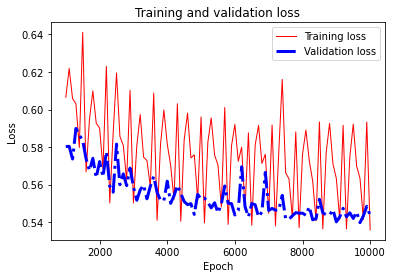

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53588605, Final Validation loss: 0.5436347, Training RMSE: 0.73330784, Validation RMSE: 0.7373159
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6110672, Validation loss: 0.5554608, 
Epoch: 2000, Training loss: 0.5933585, Validation loss: 0.5419273, 
Epoch: 3000, Training loss: 0.5353009, Validation loss: 0.53459716, 
Epoch: 4000, Training loss: 0.56866866, Validation loss: 0.52645576, 
Epoch: 5000, Training loss: 0.5725598, Validation loss: 0.5263528, 
Epoch: 6000, Training loss: 0.60084695, Validation loss: 0.5401237, 
Epoch: 7000, Training loss: 0.5423045, Validation loss: 0.533389, 
Epoch: 8000, Training loss: 0.57469225, Validation loss: 0.52148163, 
Epoch: 9000, Training loss: 0.5921152, Validation loss: 0.53406113, 
Epoch: 10000, Train

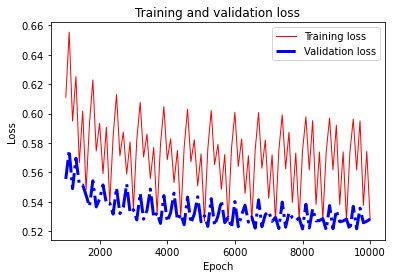

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5278703, Final Validation loss: 0.5283323, Training RMSE: 0.7309238, Validation RMSE: 0.7268647
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6051492, Validation loss: 0.55151355, 
Epoch: 2000, Training loss: 0.59104943, Validation loss: 0.5665154, 
Epoch: 3000, Training loss: 0.542919, Validation loss: 0.53840256, 
Epoch: 4000, Training loss: 0.5724845, Validation loss: 0.53842986, 
Epoch: 5000, Training loss: 0.58383334, Validation loss: 0.5642721, 
Epoch: 6000, Training loss: 0.597609, Validation loss: 0.539261, 
Epoch: 7000, Training loss: 0.54007626, Validation loss: 0.5341086, 
Epoch: 8000, Training loss: 0.5770389, Validation loss: 0.5409284, 
Epoch: 9000, Training loss: 0.5713146, Validation loss: 0.54286575, 
Epoch: 10000, Training 

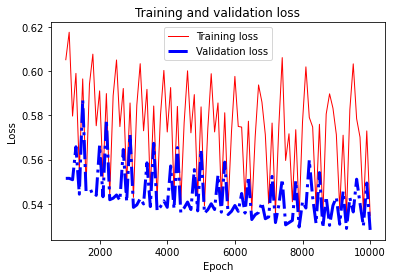

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53475314, Final Validation loss: 0.52821934, Training RMSE: 0.72991765, Validation RMSE: 0.726787
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.62413955, Validation loss: 0.6022682, 
Epoch: 2000, Training loss: 0.63595796, Validation loss: 0.61143243, 
Epoch: 3000, Training loss: 0.5707507, Validation loss: 0.5862495, 
Epoch: 4000, Training loss: 0.571439, Validation loss: 0.55551577, 
Epoch: 5000, Training loss: 0.5754386, Validation loss: 0.5596414, 
Epoch: 6000, Training loss: 0.61556953, Validation loss: 0.59429026, 
Epoch: 7000, Training loss: 0.56179595, Validation loss: 0.57009125, 
Epoch: 8000, Training loss: 0.5728112, Validation loss: 0.55161107, 
Epoch: 9000, Training loss: 0.5883028, Validation loss: 0.5711722, 
Epoch: 10000, Tra

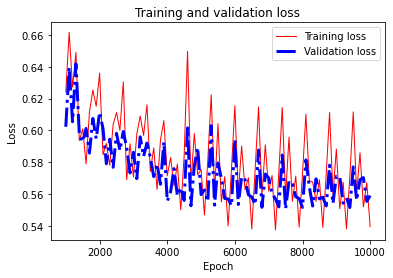

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53961957, Final Validation loss: 0.559053, Training RMSE: 0.734358, Validation RMSE: 0.7476985
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6098554, Validation loss: 0.58044845, 
Epoch: 2000, Training loss: 0.62656873, Validation loss: 0.5948113, 
Epoch: 3000, Training loss: 0.5273764, Validation loss: 0.5531477, 
Epoch: 4000, Training loss: 0.5762545, Validation loss: 0.5589344, 
Epoch: 5000, Training loss: 0.5717432, Validation loss: 0.54680204, 
Epoch: 6000, Training loss: 0.6285758, Validation loss: 0.5748298, 
Epoch: 7000, Training loss: 0.57445294, Validation loss: 0.57156855, 
Epoch: 8000, Training loss: 0.5922853, Validation loss: 0.5510637, 
Epoch: 9000, Training loss: 0.57364523, Validation loss: 0.5385903, 
Epoch: 10000, Training

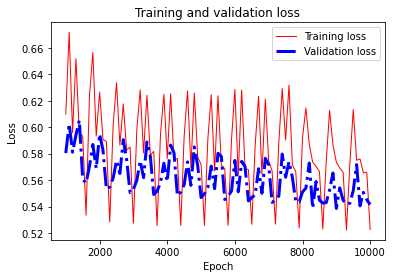

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52266866, Final Validation loss: 0.5414987, Training RMSE: 0.7301557, Validation RMSE: 0.73586595
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.61888105, Validation loss: 0.5724688, 
Epoch: 2000, Training loss: 0.6012396, Validation loss: 0.56205064, 
Epoch: 3000, Training loss: 0.5350269, Validation loss: 0.5403754, 
Epoch: 4000, Training loss: 0.589127, Validation loss: 0.5529724, 
Epoch: 5000, Training loss: 0.58164114, Validation loss: 0.5449407, 
Epoch: 6000, Training loss: 0.5924797, Validation loss: 0.54112166, 
Epoch: 7000, Training loss: 0.54448795, Validation loss: 0.53353226, 
Epoch: 8000, Training loss: 0.5940033, Validation loss: 0.5472881, 
Epoch: 9000, Training loss: 0.57688123, Validation loss: 0.5459791, 
Epoch: 10000, Train

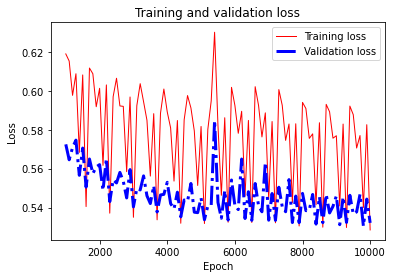

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5285437, Final Validation loss: 0.532158, Training RMSE: 0.73157346, Validation RMSE: 0.7294916
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6292686, Validation loss: 0.5813518, 
Epoch: 2000, Training loss: 0.5865492, Validation loss: 0.56172997, 
Epoch: 3000, Training loss: 0.5464518, Validation loss: 0.5494716, 
Epoch: 4000, Training loss: 0.5938632, Validation loss: 0.5708248, 
Epoch: 5000, Training loss: 0.57886016, Validation loss: 0.54920864, 
Epoch: 6000, Training loss: 0.5997404, Validation loss: 0.559875, 
Epoch: 7000, Training loss: 0.5504448, Validation loss: 0.54162866, 
Epoch: 8000, Training loss: 0.5956432, Validation loss: 0.5451119, 
Epoch: 9000, Training loss: 0.574635, Validation loss: 0.54009306, 
Epoch: 10000, Training l

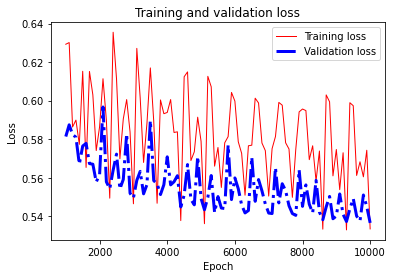

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5334144, Final Validation loss: 0.53653294, Training RMSE: 0.73392236, Validation RMSE: 0.7324841
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.5993476, Validation loss: 0.5553331, 
Epoch: 2000, Training loss: 0.5911372, Validation loss: 0.5379481, 
Epoch: 3000, Training loss: 0.5409792, Validation loss: 0.54015446, 
Epoch: 4000, Training loss: 0.571879, Validation loss: 0.5457623, 
Epoch: 5000, Training loss: 0.5896229, Validation loss: 0.5414647, 
Epoch: 6000, Training loss: 0.6006312, Validation loss: 0.5377157, 
Epoch: 7000, Training loss: 0.5477193, Validation loss: 0.5294661, 
Epoch: 8000, Training loss: 0.56393564, Validation loss: 0.52494663, 
Epoch: 9000, Training loss: 0.5746283, Validation loss: 0.522838, 
Epoch: 10000, Training l

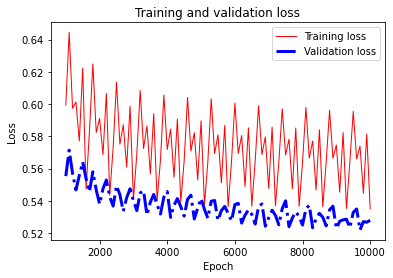

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53508, Final Validation loss: 0.52795154, Training RMSE: 0.73218393, Validation RMSE: 0.72660273
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.61317974, Validation loss: 0.5791523, 
Epoch: 2000, Training loss: 0.57964134, Validation loss: 0.5462136, 
Epoch: 3000, Training loss: 0.5409157, Validation loss: 0.54109514, 
Epoch: 4000, Training loss: 0.5823443, Validation loss: 0.55847174, 
Epoch: 5000, Training loss: 0.598154, Validation loss: 0.5584244, 
Epoch: 6000, Training loss: 0.5960573, Validation loss: 0.5392103, 
Epoch: 7000, Training loss: 0.54732746, Validation loss: 0.5364245, 
Epoch: 8000, Training loss: 0.56708986, Validation loss: 0.5370337, 
Epoch: 9000, Training loss: 0.5647364, Validation loss: 0.5263185, 
Epoch: 10000, Trainin

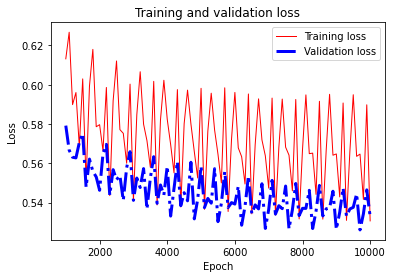

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53064346, Final Validation loss: 0.532784, Training RMSE: 0.72927076, Validation RMSE: 0.7299205
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.66226536, Validation loss: 0.64140123, 
Epoch: 2000, Training loss: 0.6382326, Validation loss: 0.60042614, 
Epoch: 3000, Training loss: 0.5552631, Validation loss: 0.56927437, 
Epoch: 4000, Training loss: 0.5913854, Validation loss: 0.5728508, 
Epoch: 5000, Training loss: 0.64769554, Validation loss: 0.5842115, 
Epoch: 6000, Training loss: 0.6299188, Validation loss: 0.5668537, 
Epoch: 7000, Training loss: 0.55408937, Validation loss: 0.5553984, 
Epoch: 8000, Training loss: 0.596781, Validation loss: 0.55259776, 
Epoch: 9000, Training loss: 0.5683609, Validation loss: 0.5599055, 
Epoch: 10000, Train

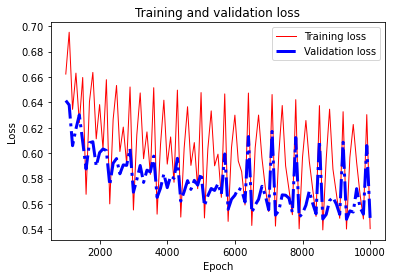

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5405578, Final Validation loss: 0.54840267, Training RMSE: 0.7384771, Validation RMSE: 0.7405422
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.7394214 

Average Validation RMSE for the 10 folds: 0.73930293 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.68221766, Validation loss: 0.6313821, 
Epoch: 2000, Training loss: 0.5962675, Validation loss: 0.56312925, 
Epoch: 3000, Training loss: 0.5413959, Validation loss: 0.55131227, 
Epoch: 4000, Training loss: 0.5858777, Validation loss: 0.5857703, 
Epoch: 500

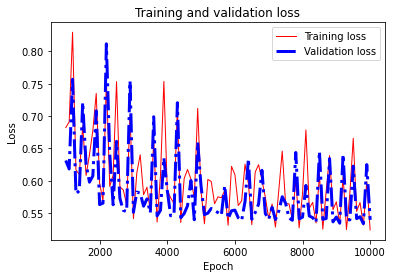

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5240237, Final Validation loss: 0.5395175, Training RMSE: 0.72703046, Validation RMSE: 0.7345186
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.752892, Validation loss: 0.74731225, 
Epoch: 2000, Training loss: 0.66421163, Validation loss: 0.61870414, 
Epoch: 3000, Training loss: 0.5702943, Validation loss: 0.59143555, 
Epoch: 4000, Training loss: 0.60959756, Validation loss: 0.56902975, 
Epoch: 5000, Training loss: 0.5788338, Validation loss: 0.5347676, 
Epoch: 6000, Training loss: 0.6095125, Validation loss: 0.56848955, 
Epoch: 7000, Training loss: 0.5402013, Validation loss: 0.52846295, 
Epoch: 8000, Training loss: 0.5755337, Validation loss: 0.52909017, 
Epoch: 9000, Training loss: 0.5743589, Validation loss: 0.5240698, 
Epoch: 10000, Trai

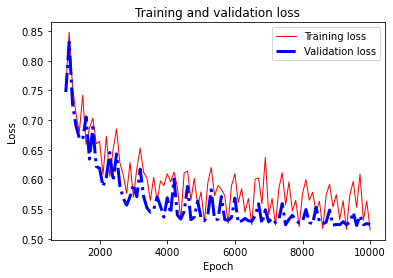

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5148301, Final Validation loss: 0.523991, Training RMSE: 0.72482765, Validation RMSE: 0.72387224
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.68308735, Validation loss: 0.64686936, 
Epoch: 2000, Training loss: 0.63654137, Validation loss: 0.5676223, 
Epoch: 3000, Training loss: 0.53390396, Validation loss: 0.5348578, 
Epoch: 4000, Training loss: 0.5652449, Validation loss: 0.54414326, 
Epoch: 5000, Training loss: 0.5746144, Validation loss: 0.5560405, 
Epoch: 6000, Training loss: 0.59311694, Validation loss: 0.52798784, 
Epoch: 7000, Training loss: 0.5561923, Validation loss: 0.54455674, 
Epoch: 8000, Training loss: 0.5546544, Validation loss: 0.5196051, 
Epoch: 9000, Training loss: 0.5634455, Validation loss: 0.51780397, 
Epoch: 10000, Tra

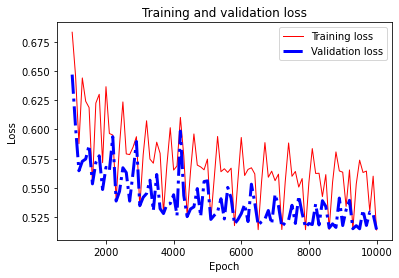

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5140884, Final Validation loss: 0.5144011, Training RMSE: 0.7216936, Validation RMSE: 0.7172176
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6072184, Validation loss: 0.5791738, 
Epoch: 2000, Training loss: 0.5879495, Validation loss: 0.5736356, 
Epoch: 3000, Training loss: 0.5335344, Validation loss: 0.5481489, 
Epoch: 4000, Training loss: 0.58472705, Validation loss: 0.56210494, 
Epoch: 5000, Training loss: 0.5711124, Validation loss: 0.54893476, 
Epoch: 6000, Training loss: 0.62846404, Validation loss: 0.5827698, 
Epoch: 7000, Training loss: 0.55604404, Validation loss: 0.5603102, 
Epoch: 8000, Training loss: 0.5619937, Validation loss: 0.5405209, 
Epoch: 9000, Training loss: 0.55866873, Validation loss: 0.5403672, 
Epoch: 10000, Trainin

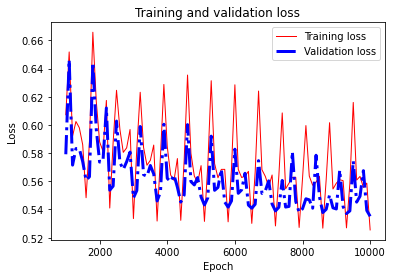

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5254997, Final Validation loss: 0.53515375, Training RMSE: 0.72192556, Validation RMSE: 0.73154205
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7248397, Validation loss: 0.61365795, 
Epoch: 2000, Training loss: 0.58543706, Validation loss: 0.5621328, 
Epoch: 3000, Training loss: 0.5469956, Validation loss: 0.54806036, 
Epoch: 4000, Training loss: 0.5657836, Validation loss: 0.5548824, 
Epoch: 5000, Training loss: 0.56546795, Validation loss: 0.5397502, 
Epoch: 6000, Training loss: 0.6122652, Validation loss: 0.5779707, 
Epoch: 7000, Training loss: 0.55102164, Validation loss: 0.5727672, 
Epoch: 8000, Training loss: 0.567577, Validation loss: 0.53504443, 
Epoch: 9000, Training loss: 0.57387817, Validation loss: 0.5374183, 
Epoch: 10000, Trai

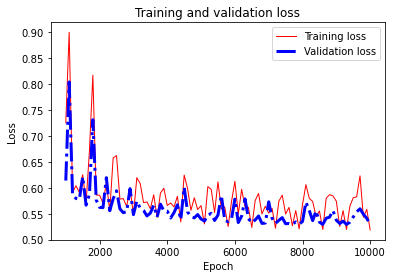

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5187373, Final Validation loss: 0.52942896, Training RMSE: 0.72108793, Validation RMSE: 0.7276187
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.9028641, Validation loss: 0.81191903, 
Epoch: 2000, Training loss: 0.71056217, Validation loss: 0.6467365, 
Epoch: 3000, Training loss: 0.6550992, Validation loss: 0.6792361, 
Epoch: 4000, Training loss: 0.6217758, Validation loss: 0.5756852, 
Epoch: 5000, Training loss: 0.6003869, Validation loss: 0.54429597, 
Epoch: 6000, Training loss: 0.6136376, Validation loss: 0.5739297, 
Epoch: 7000, Training loss: 0.6118299, Validation loss: 0.6186182, 
Epoch: 8000, Training loss: 0.6128272, Validation loss: 0.54622716, 
Epoch: 9000, Training loss: 0.5975559, Validation loss: 0.5408575, 
Epoch: 10000, Trainin

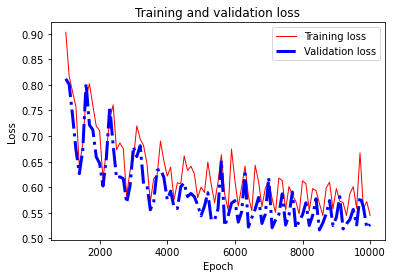

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.545013, Final Validation loss: 0.52753335, Training RMSE: 0.73172516, Validation RMSE: 0.7263149
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.62173164, Validation loss: 0.5722518, 
Epoch: 2000, Training loss: 0.55882776, Validation loss: 0.5353418, 
Epoch: 3000, Training loss: 0.52914447, Validation loss: 0.52778167, 
Epoch: 4000, Training loss: 0.58377707, Validation loss: 0.5530168, 
Epoch: 5000, Training loss: 0.5492065, Validation loss: 0.5300029, 
Epoch: 6000, Training loss: 0.5929195, Validation loss: 0.54726255, 
Epoch: 7000, Training loss: 0.572777, Validation loss: 0.5520092, 
Epoch: 8000, Training loss: 0.558871, Validation loss: 0.5268464, 
Epoch: 9000, Training loss: 0.5515105, Validation loss: 0.5208839, 
Epoch: 10000, Training

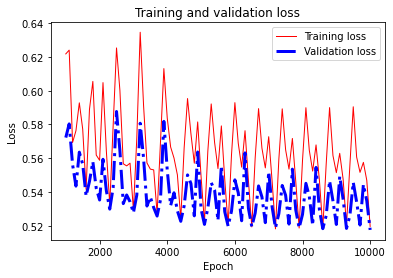

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.51972276, Final Validation loss: 0.51765865, Training RMSE: 0.7202187, Validation RMSE: 0.719485
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.71745265, Validation loss: 0.6234853, 
Epoch: 2000, Training loss: 0.6300105, Validation loss: 0.56813407, 
Epoch: 3000, Training loss: 0.54974467, Validation loss: 0.5348396, 
Epoch: 4000, Training loss: 0.5582395, Validation loss: 0.52971715, 
Epoch: 5000, Training loss: 0.5728286, Validation loss: 0.5241301, 
Epoch: 6000, Training loss: 0.5941296, Validation loss: 0.5428423, 
Epoch: 7000, Training loss: 0.55622023, Validation loss: 0.5521427, 
Epoch: 8000, Training loss: 0.60426265, Validation loss: 0.5324702, 
Epoch: 9000, Training loss: 0.62906176, Validation loss: 0.5410603, 
Epoch: 10000, Train

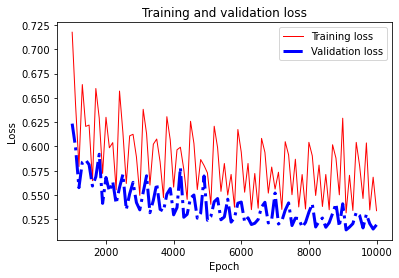

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53398263, Final Validation loss: 0.51944184, Training RMSE: 0.7270434, Validation RMSE: 0.72072315
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.62184376, Validation loss: 0.59146345, 
Epoch: 2000, Training loss: 0.60831434, Validation loss: 0.56110615, 
Epoch: 3000, Training loss: 0.5451518, Validation loss: 0.54318315, 
Epoch: 4000, Training loss: 0.55797327, Validation loss: 0.53513145, 
Epoch: 5000, Training loss: 0.5722536, Validation loss: 0.5406936, 
Epoch: 6000, Training loss: 0.5942476, Validation loss: 0.54973793, 
Epoch: 7000, Training loss: 0.55066293, Validation loss: 0.55182654, 
Epoch: 8000, Training loss: 0.57306576, Validation loss: 0.5410063, 
Epoch: 9000, Training loss: 0.5665152, Validation loss: 0.52571404, 
Epoch: 10000

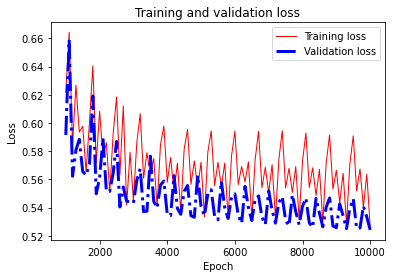

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5270039, Final Validation loss: 0.52413225, Training RMSE: 0.72361475, Validation RMSE: 0.72396976
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.9825169, Validation loss: 0.9654846, 
Epoch: 2000, Training loss: 0.90673697, Validation loss: 0.81178683, 
Epoch: 3000, Training loss: 0.70194983, Validation loss: 0.7261886, 
Epoch: 4000, Training loss: 0.8740026, Validation loss: 0.799021, 
Epoch: 5000, Training loss: 0.6351549, Validation loss: 0.6528805, 
Epoch: 6000, Training loss: 0.6043373, Validation loss: 0.54904056, 
Epoch: 7000, Training loss: 0.57805103, Validation loss: 0.54556745, 
Epoch: 8000, Training loss: 0.580819, Validation loss: 0.5491606, 
Epoch: 9000, Training loss: 0.60068536, Validation loss: 0.5625432, 
Epoch: 10000, Trai

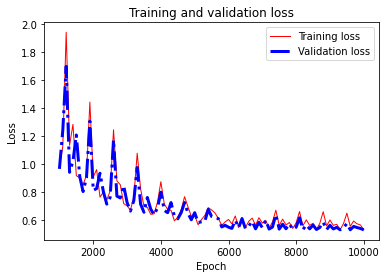

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5304039, Final Validation loss: 0.5296178, Training RMSE: 0.7299375, Validation RMSE: 0.72774845
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.73909163 

Average Validation RMSE for the 10 folds: 0.7389847 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.67818815, Validation loss: 0.68392843, 
Epoch: 2000, Training loss: 0.60527074, Validation loss: 0.5855628, 
Epoch: 3000, Training loss: 0.54053646, Validation loss: 0.5503736, 
Epoch: 4000, Training loss: 0.5614425, Validation loss: 0.5363041, 
Epoch: 50

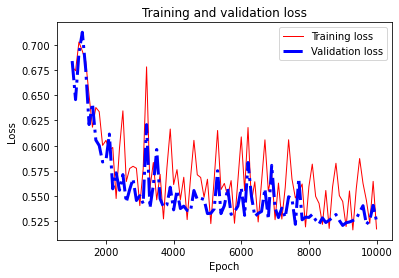

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5174291, Final Validation loss: 0.5250844, Training RMSE: 0.7211271, Validation RMSE: 0.7246271
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.58952165, Validation loss: 0.56583273, 
Epoch: 2000, Training loss: 0.56960773, Validation loss: 0.52727455, 
Epoch: 3000, Training loss: 0.538741, Validation loss: 0.5249768, 
Epoch: 4000, Training loss: 0.56215733, Validation loss: 0.52607757, 
Epoch: 5000, Training loss: 0.55901265, Validation loss: 0.5154969, 
Epoch: 6000, Training loss: 0.5720004, Validation loss: 0.5197607, 
Epoch: 7000, Training loss: 0.52089405, Validation loss: 0.51153934, 
Epoch: 8000, Training loss: 0.5608148, Validation loss: 0.51467174, 
Epoch: 9000, Training loss: 0.5609561, Validation loss: 0.51767147, 
Epoch: 10000, Tra

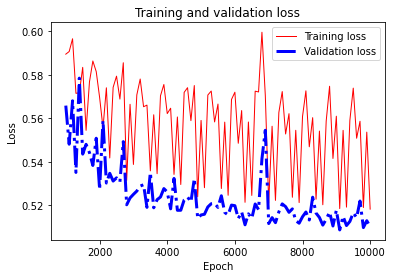

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5181764, Final Validation loss: 0.5100892, Training RMSE: 0.7199162, Validation RMSE: 0.7142053
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.60328, Validation loss: 0.56879663, 
Epoch: 2000, Training loss: 0.5729195, Validation loss: 0.5491597, 
Epoch: 3000, Training loss: 0.5309893, Validation loss: 0.53344995, 
Epoch: 4000, Training loss: 0.5855583, Validation loss: 0.5439566, 
Epoch: 5000, Training loss: 0.56529534, Validation loss: 0.5330262, 
Epoch: 6000, Training loss: 0.5851916, Validation loss: 0.5305213, 
Epoch: 7000, Training loss: 0.53155714, Validation loss: 0.5258184, 
Epoch: 8000, Training loss: 0.5669429, Validation loss: 0.5203484, 
Epoch: 9000, Training loss: 0.5600251, Validation loss: 0.5358826, 
Epoch: 10000, Training lo

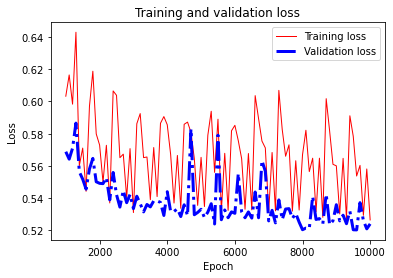

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5264141, Final Validation loss: 0.52395123, Training RMSE: 0.72559, Validation RMSE: 0.72384477
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.7669203, Validation loss: 0.8647101, 
Epoch: 2000, Training loss: 0.62289256, Validation loss: 0.59924877, 
Epoch: 3000, Training loss: 0.5690729, Validation loss: 0.5721959, 
Epoch: 4000, Training loss: 0.6130664, Validation loss: 0.6065846, 
Epoch: 5000, Training loss: 0.5990874, Validation loss: 0.57070166, 
Epoch: 6000, Training loss: 0.590605, Validation loss: 0.5648366, 
Epoch: 7000, Training loss: 0.53751737, Validation loss: 0.5523034, 
Epoch: 8000, Training loss: 0.574623, Validation loss: 0.54610026, 
Epoch: 9000, Training loss: 0.56828344, Validation loss: 0.5508053, 
Epoch: 10000, Training 

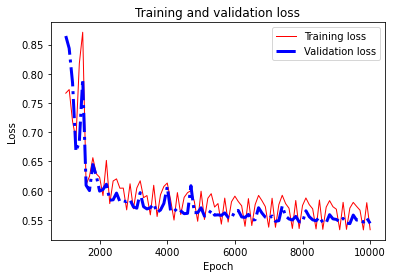

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5332025, Final Validation loss: 0.5440337, Training RMSE: 0.72782254, Validation RMSE: 0.7375864
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.62424785, Validation loss: 0.5708587, 
Epoch: 2000, Training loss: 0.5839369, Validation loss: 0.549715, 
Epoch: 3000, Training loss: 0.52993894, Validation loss: 0.5351731, 
Epoch: 4000, Training loss: 0.5556514, Validation loss: 0.534047, 
Epoch: 5000, Training loss: 0.5540123, Validation loss: 0.5310492, 
Epoch: 6000, Training loss: 0.60080224, Validation loss: 0.5799835, 
Epoch: 7000, Training loss: 0.52204007, Validation loss: 0.5284807, 
Epoch: 8000, Training loss: 0.5747952, Validation loss: 0.5327688, 
Epoch: 9000, Training loss: 0.5879738, Validation loss: 0.5487715, 
Epoch: 10000, Training l

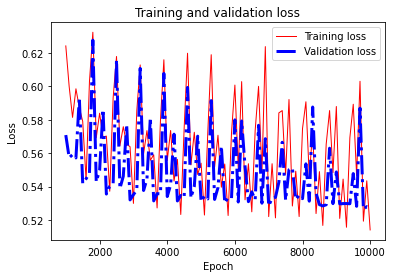

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.51405656, Final Validation loss: 0.5273206, Training RMSE: 0.7200905, Validation RMSE: 0.72616845
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.58711404, Validation loss: 0.55412745, 
Epoch: 2000, Training loss: 0.62115324, Validation loss: 0.57356834, 
Epoch: 3000, Training loss: 0.5326983, Validation loss: 0.526822, 
Epoch: 4000, Training loss: 0.5570538, Validation loss: 0.52236456, 
Epoch: 5000, Training loss: 0.55064094, Validation loss: 0.5176392, 
Epoch: 6000, Training loss: 0.6164926, Validation loss: 0.5477278, 
Epoch: 7000, Training loss: 0.5191168, Validation loss: 0.51240826, 
Epoch: 8000, Training loss: 0.56317127, Validation loss: 0.52223, 
Epoch: 9000, Training loss: 0.5467423, Validation loss: 0.5146982, 
Epoch: 10000, Traini

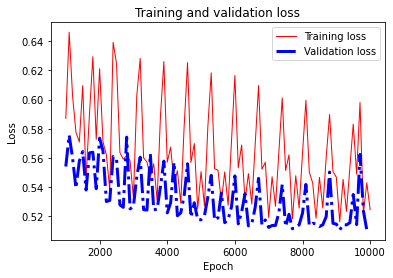

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5245707, Final Validation loss: 0.5120111, Training RMSE: 0.71905106, Validation RMSE: 0.7155495
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.808183, Validation loss: 0.6766519, 
Epoch: 2000, Training loss: 0.5759089, Validation loss: 0.56947523, 
Epoch: 3000, Training loss: 0.53886414, Validation loss: 0.5357177, 
Epoch: 4000, Training loss: 0.56289124, Validation loss: 0.55127484, 
Epoch: 5000, Training loss: 0.5573535, Validation loss: 0.5296977, 
Epoch: 6000, Training loss: 0.58349967, Validation loss: 0.535127, 
Epoch: 7000, Training loss: 0.53005075, Validation loss: 0.5263398, 
Epoch: 8000, Training loss: 0.59460896, Validation loss: 0.5395604, 
Epoch: 9000, Training loss: 0.5572923, Validation loss: 0.529101, 
Epoch: 10000, Training

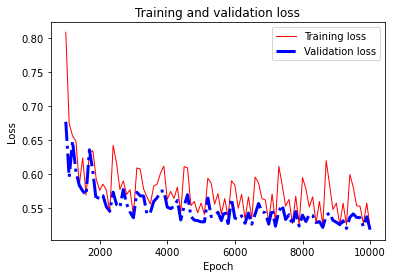

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5200864, Final Validation loss: 0.51780003, Training RMSE: 0.7219278, Validation RMSE: 0.7195832
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.60477823, Validation loss: 0.5511693, 
Epoch: 2000, Training loss: 0.59151614, Validation loss: 0.54931766, 
Epoch: 3000, Training loss: 0.5398853, Validation loss: 0.52067804, 
Epoch: 4000, Training loss: 0.5566886, Validation loss: 0.5158551, 
Epoch: 5000, Training loss: 0.5597979, Validation loss: 0.5104176, 
Epoch: 6000, Training loss: 0.60233605, Validation loss: 0.5271737, 
Epoch: 7000, Training loss: 0.52544016, Validation loss: 0.5073042, 
Epoch: 8000, Training loss: 0.5687602, Validation loss: 0.51965123, 
Epoch: 9000, Training loss: 0.5656954, Validation loss: 0.51243615, 
Epoch: 10000, Trai

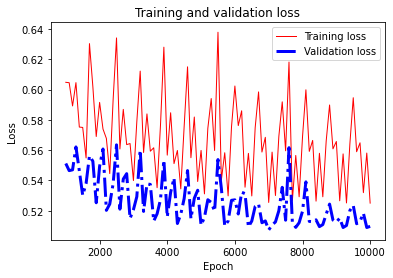

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5250034, Final Validation loss: 0.5096524, Training RMSE: 0.7223186, Validation RMSE: 0.71389943
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.5868401, Validation loss: 0.55395085, 
Epoch: 2000, Training loss: 0.5638815, Validation loss: 0.5361177, 
Epoch: 3000, Training loss: 0.5318834, Validation loss: 0.5348335, 
Epoch: 4000, Training loss: 0.567526, Validation loss: 0.55859745, 
Epoch: 5000, Training loss: 0.5740167, Validation loss: 0.533801, 
Epoch: 6000, Training loss: 0.59588945, Validation loss: 0.5487284, 
Epoch: 7000, Training loss: 0.51774496, Validation loss: 0.51344085, 
Epoch: 8000, Training loss: 0.5473876, Validation loss: 0.5219725, 
Epoch: 9000, Training loss: 0.54523504, Validation loss: 0.51181984, 
Epoch: 10000, Trainin

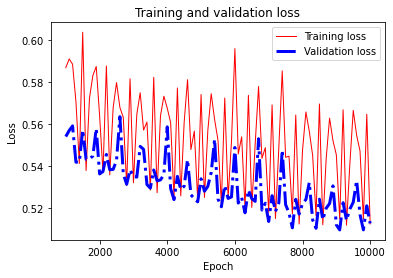

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5122562, Final Validation loss: 0.5125232, Training RMSE: 0.71650136, Validation RMSE: 0.7159072
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.6424675, Validation loss: 0.6125388, 
Epoch: 2000, Training loss: 0.6074303, Validation loss: 0.5715257, 
Epoch: 3000, Training loss: 0.54051626, Validation loss: 0.5348729, 
Epoch: 4000, Training loss: 0.55889374, Validation loss: 0.53211904, 
Epoch: 5000, Training loss: 0.55741084, Validation loss: 0.531786, 
Epoch: 6000, Training loss: 0.6213399, Validation loss: 0.563932, 
Epoch: 7000, Training loss: 0.55898505, Validation loss: 0.5786148, 
Epoch: 8000, Training loss: 0.58502525, Validation loss: 0.5484402, 
Epoch: 9000, Training loss: 0.5795937, Validation loss: 0.5268624, 
Epoch: 10000, Trainin

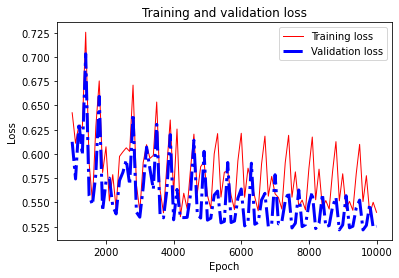

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5398373, Final Validation loss: 0.525532, Training RMSE: 0.72700393, Validation RMSE: 0.7249359
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.73871475 

Average Validation RMSE for the 10 folds: 0.73859906 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6603144, Validation loss: 0.6428962, 
Epoch: 2000, Training loss: 0.60004693, Validation loss: 0.58489585, 
Epoch: 3000, Training loss: 0.55967116, Validation loss: 0.5684101, 
Epoch: 4000, Training loss: 0.5876841, Validation loss: 0.5565958, 
Epoch: 5000, 

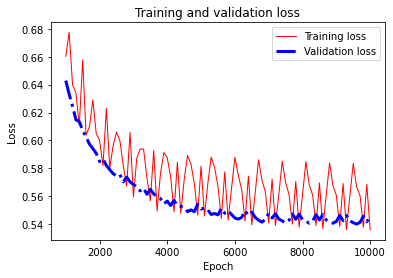

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53594553, Final Validation loss: 0.5453969, Training RMSE: 0.73086166, Validation RMSE: 0.73850995
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.67279994, Validation loss: 0.65572107, 
Epoch: 2000, Training loss: 0.6077845, Validation loss: 0.5781217, 
Epoch: 3000, Training loss: 0.5432853, Validation loss: 0.5528641, 
Epoch: 4000, Training loss: 0.5874857, Validation loss: 0.5441985, 
Epoch: 5000, Training loss: 0.5897296, Validation loss: 0.53729707, 
Epoch: 6000, Training loss: 0.5901385, Validation loss: 0.5321604, 
Epoch: 7000, Training loss: 0.5370377, Validation loss: 0.5325185, 
Epoch: 8000, Training loss: 0.5732417, Validation loss: 0.5298196, 
Epoch: 9000, Training loss: 0.56045836, Validation loss: 0.53035253, 
Epoch: 10000, Training

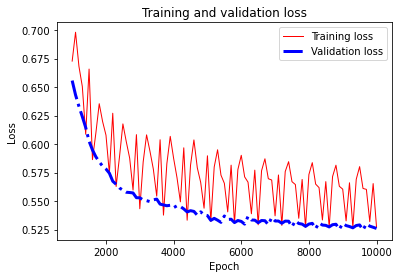

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52711475, Final Validation loss: 0.5259738, Training RMSE: 0.73052365, Validation RMSE: 0.7252405
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.6571622, Validation loss: 0.6301697, 
Epoch: 2000, Training loss: 0.6027263, Validation loss: 0.56989944, 
Epoch: 3000, Training loss: 0.5554383, Validation loss: 0.5525293, 
Epoch: 4000, Training loss: 0.5675796, Validation loss: 0.5461664, 
Epoch: 5000, Training loss: 0.581454, Validation loss: 0.54531586, 
Epoch: 6000, Training loss: 0.5964767, Validation loss: 0.5395327, 
Epoch: 7000, Training loss: 0.53299624, Validation loss: 0.5347422, 
Epoch: 8000, Training loss: 0.5684863, Validation loss: 0.53382057, 
Epoch: 9000, Training loss: 0.5686724, Validation loss: 0.5353714, 
Epoch: 10000, Training lo

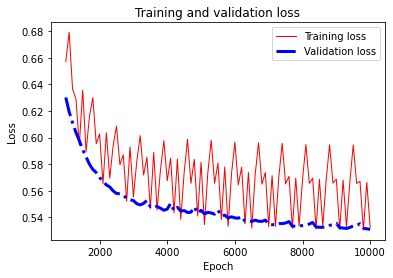

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5326166, Final Validation loss: 0.5309417, Training RMSE: 0.7294766, Validation RMSE: 0.7286575
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.8238363, Validation loss: 0.809015, 
Epoch: 2000, Training loss: 0.6485354, Validation loss: 0.6494014, 
Epoch: 3000, Training loss: 0.5739971, Validation loss: 0.61156124, 
Epoch: 4000, Training loss: 0.6150719, Validation loss: 0.59283596, 
Epoch: 5000, Training loss: 0.5919879, Validation loss: 0.58421236, 
Epoch: 6000, Training loss: 0.6171301, Validation loss: 0.5752513, 
Epoch: 7000, Training loss: 0.55296296, Validation loss: 0.5741051, 
Epoch: 8000, Training loss: 0.5920527, Validation loss: 0.5672931, 
Epoch: 9000, Training loss: 0.5725432, Validation loss: 0.56407064, 
Epoch: 10000, Training los

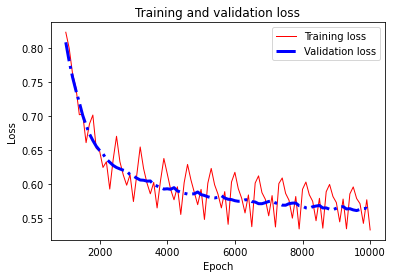

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53212833, Final Validation loss: 0.5602815, Training RMSE: 0.7354071, Validation RMSE: 0.74851954
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.76918083, Validation loss: 0.74728173, 
Epoch: 2000, Training loss: 0.6239907, Validation loss: 0.61795413, 
Epoch: 3000, Training loss: 0.55645996, Validation loss: 0.5856303, 
Epoch: 4000, Training loss: 0.59208107, Validation loss: 0.5716227, 
Epoch: 5000, Training loss: 0.5934943, Validation loss: 0.55799794, 
Epoch: 6000, Training loss: 0.6055046, Validation loss: 0.5534096, 
Epoch: 7000, Training loss: 0.5395455, Validation loss: 0.5461224, 
Epoch: 8000, Training loss: 0.570101, Validation loss: 0.5426005, 
Epoch: 9000, Training loss: 0.56237644, Validation loss: 0.5457472, 
Epoch: 10000, Training

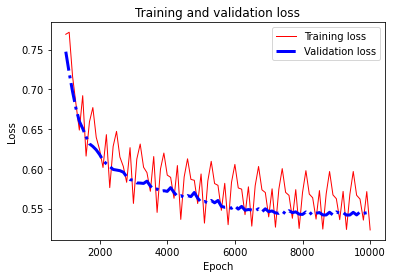

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5231345, Final Validation loss: 0.54157007, Training RMSE: 0.7312445, Validation RMSE: 0.73591447
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.70401204, Validation loss: 0.6646544, 
Epoch: 2000, Training loss: 0.5994524, Validation loss: 0.5767207, 
Epoch: 3000, Training loss: 0.54745615, Validation loss: 0.5526929, 
Epoch: 4000, Training loss: 0.5830657, Validation loss: 0.54882914, 
Epoch: 5000, Training loss: 0.5861857, Validation loss: 0.54495364, 
Epoch: 6000, Training loss: 0.5933961, Validation loss: 0.5441488, 
Epoch: 7000, Training loss: 0.5435924, Validation loss: 0.53749746, 
Epoch: 8000, Training loss: 0.5741215, Validation loss: 0.5368889, 
Epoch: 9000, Training loss: 0.5568502, Validation loss: 0.53286386, 
Epoch: 10000, Training

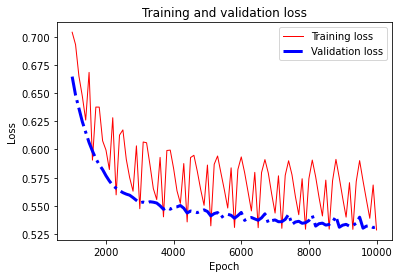

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52864105, Final Validation loss: 0.53138083, Training RMSE: 0.7349011, Validation RMSE: 0.7289587
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.69008756, Validation loss: 0.7195199, 
Epoch: 2000, Training loss: 0.6504842, Validation loss: 0.6164307, 
Epoch: 3000, Training loss: 0.5712815, Validation loss: 0.577913, 
Epoch: 4000, Training loss: 0.58703876, Validation loss: 0.5648967, 
Epoch: 5000, Training loss: 0.5966484, Validation loss: 0.561632, 
Epoch: 6000, Training loss: 0.60122794, Validation loss: 0.55334294, 
Epoch: 7000, Training loss: 0.54260254, Validation loss: 0.54685634, 
Epoch: 8000, Training loss: 0.5786336, Validation loss: 0.5461259, 
Epoch: 9000, Training loss: 0.5786698, Validation loss: 0.54387015, 
Epoch: 10000, Training 

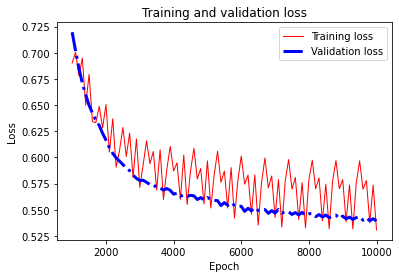

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53069323, Final Validation loss: 0.53926283, Training RMSE: 0.7335125, Validation RMSE: 0.7343452
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.648309, Validation loss: 0.623022, 
Epoch: 2000, Training loss: 0.59661233, Validation loss: 0.55746174, 
Epoch: 3000, Training loss: 0.5506392, Validation loss: 0.54449934, 
Epoch: 4000, Training loss: 0.56657356, Validation loss: 0.5384918, 
Epoch: 5000, Training loss: 0.5824406, Validation loss: 0.53282166, 
Epoch: 6000, Training loss: 0.5959068, Validation loss: 0.5373461, 
Epoch: 7000, Training loss: 0.54040223, Validation loss: 0.5294065, 
Epoch: 8000, Training loss: 0.56627357, Validation loss: 0.52508885, 
Epoch: 9000, Training loss: 0.57147706, Validation loss: 0.530592, 
Epoch: 10000, Training

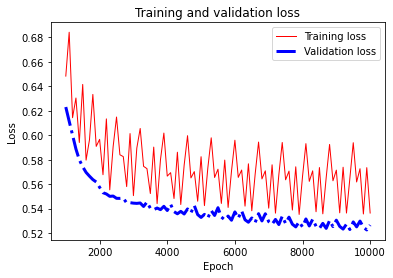

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53643334, Final Validation loss: 0.5265949, Training RMSE: 0.73259497, Validation RMSE: 0.72566855
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.68551075, Validation loss: 0.6919285, 
Epoch: 2000, Training loss: 0.6126878, Validation loss: 0.60281837, 
Epoch: 3000, Training loss: 0.5579815, Validation loss: 0.5738829, 
Epoch: 4000, Training loss: 0.5843102, Validation loss: 0.54818994, 
Epoch: 5000, Training loss: 0.58306974, Validation loss: 0.5427043, 
Epoch: 6000, Training loss: 0.5839431, Validation loss: 0.54368347, 
Epoch: 7000, Training loss: 0.53754187, Validation loss: 0.5346107, 
Epoch: 8000, Training loss: 0.56996423, Validation loss: 0.53428584, 
Epoch: 9000, Training loss: 0.5714725, Validation loss: 0.5345408, 
Epoch: 10000, Train

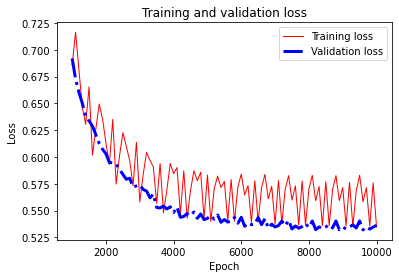

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53464127, Final Validation loss: 0.53619885, Training RMSE: 0.73085815, Validation RMSE: 0.732256
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1
Epoch: 1000, Training loss: 0.65169644, Validation loss: 0.6079324, 
Epoch: 2000, Training loss: 0.5993538, Validation loss: 0.5584007, 
Epoch: 3000, Training loss: 0.5490935, Validation loss: 0.5506254, 
Epoch: 4000, Training loss: 0.57149696, Validation loss: 0.5403371, 
Epoch: 5000, Training loss: 0.5817136, Validation loss: 0.5369154, 
Epoch: 6000, Training loss: 0.58787644, Validation loss: 0.5394426, 
Epoch: 7000, Training loss: 0.5385561, Validation loss: 0.5379513, 
Epoch: 8000, Training loss: 0.5616214, Validation loss: 0.53630155, 
Epoch: 9000, Training loss: 0.567751, Validation loss: 0.53781915, 
Epoch: 10000, Training 

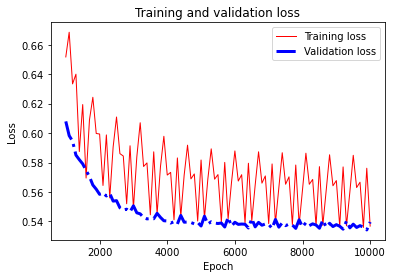

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5368315, Final Validation loss: 0.5395977, Training RMSE: 0.7315221, Validation RMSE: 0.7345731
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron1 

Average Training RMSE for the 10 folds: 0.73857075 

Average Validation RMSE for the 10 folds: 0.7384831 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6425054, Validation loss: 0.6311659, 
Epoch: 2000, Training loss: 0.5839331, Validation loss: 0.5646509, 
Epoch: 3000, Training loss: 0.5523962, Validation loss: 0.55210304, 
Epoch: 4000, Training loss: 0.5635662, Validation loss: 0.54820836, 
Epoch: 5000, Train

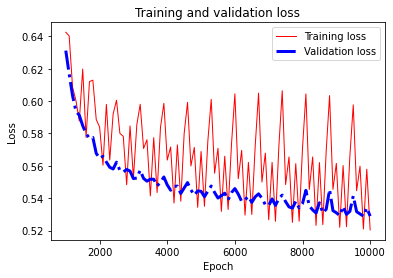

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.520424, Final Validation loss: 0.5289322, Training RMSE: 0.72204405, Validation RMSE: 0.7272773
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.4566387, Validation loss: 1.4462752, 
Epoch: 2000, Training loss: 0.81873345, Validation loss: 0.83168155, 
Epoch: 3000, Training loss: 0.6346352, Validation loss: 0.6598836, 
Epoch: 4000, Training loss: 0.6490475, Validation loss: 0.60858715, 
Epoch: 5000, Training loss: 0.61224246, Validation loss: 0.5872615, 
Epoch: 6000, Training loss: 0.6093437, Validation loss: 0.570009, 
Epoch: 7000, Training loss: 0.5641456, Validation loss: 0.559092, 
Epoch: 8000, Training loss: 0.59803164, Validation loss: 0.5610273, 
Epoch: 9000, Training loss: 0.5897332, Validation loss: 0.54481506, 
Epoch: 10000, Training los

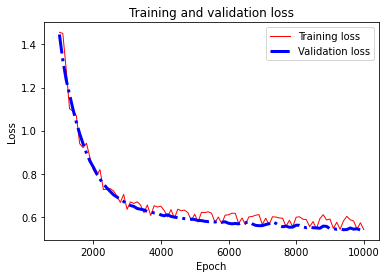

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.54052216, Final Validation loss: 0.54032797, Training RMSE: 0.7380925, Validation RMSE: 0.73507005
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.7624683, Validation loss: 0.7569736, 
Epoch: 2000, Training loss: 0.6502306, Validation loss: 0.6053573, 
Epoch: 3000, Training loss: 0.5459188, Validation loss: 0.55993843, 
Epoch: 4000, Training loss: 0.57717115, Validation loss: 0.559294, 
Epoch: 5000, Training loss: 0.5870862, Validation loss: 0.538132, 
Epoch: 6000, Training loss: 0.6010141, Validation loss: 0.56275034, 
Epoch: 7000, Training loss: 0.52854234, Validation loss: 0.5276525, 
Epoch: 8000, Training loss: 0.55970544, Validation loss: 0.5361277, 
Epoch: 9000, Training loss: 0.5669416, Validation loss: 0.52747786, 
Epoch: 10000, Training 

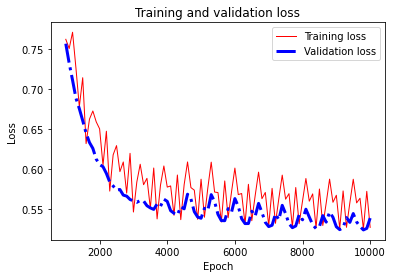

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5266423, Final Validation loss: 0.5383132, Training RMSE: 0.7317752, Validation RMSE: 0.7336983
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.8273883, Validation loss: 0.82391685, 
Epoch: 2000, Training loss: 0.6760056, Validation loss: 0.6679478, 
Epoch: 3000, Training loss: 0.5928998, Validation loss: 0.61407375, 
Epoch: 4000, Training loss: 0.6232754, Validation loss: 0.5968119, 
Epoch: 5000, Training loss: 0.5977098, Validation loss: 0.57824177, 
Epoch: 6000, Training loss: 0.598072, Validation loss: 0.5612567, 
Epoch: 7000, Training loss: 0.5580559, Validation loss: 0.569339, 
Epoch: 8000, Training loss: 0.57557243, Validation loss: 0.55163586, 
Epoch: 9000, Training loss: 0.5703061, Validation loss: 0.5501852, 
Epoch: 10000, Training loss

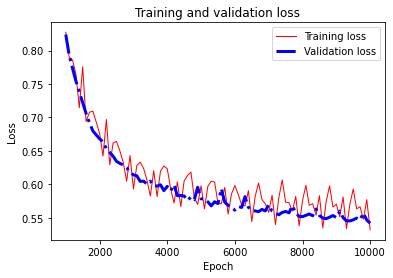

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53174543, Final Validation loss: 0.5417513, Training RMSE: 0.72752935, Validation RMSE: 0.7360376
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.66128886, Validation loss: 0.65956557, 
Epoch: 2000, Training loss: 0.6023831, Validation loss: 0.5849291, 
Epoch: 3000, Training loss: 0.5476393, Validation loss: 0.55779827, 
Epoch: 4000, Training loss: 0.5574328, Validation loss: 0.54847836, 
Epoch: 5000, Training loss: 0.5754441, Validation loss: 0.5405588, 
Epoch: 6000, Training loss: 0.59194165, Validation loss: 0.5508251, 
Epoch: 7000, Training loss: 0.5297628, Validation loss: 0.53423303, 
Epoch: 8000, Training loss: 0.56369686, Validation loss: 0.5455184, 
Epoch: 9000, Training loss: 0.55668837, Validation loss: 0.533834, 
Epoch: 10000, Trainin

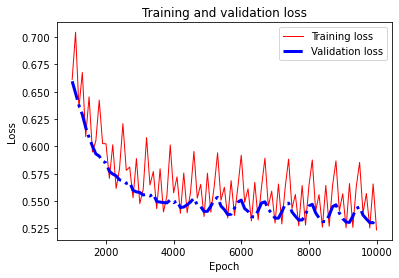

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52352756, Final Validation loss: 0.53480077, Training RMSE: 0.72760093, Validation RMSE: 0.7313007
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.6213179, Validation loss: 0.5944946, 
Epoch: 2000, Training loss: 0.6080307, Validation loss: 0.56371, 
Epoch: 3000, Training loss: 0.5477585, Validation loss: 0.5442047, 
Epoch: 4000, Training loss: 0.57298326, Validation loss: 0.54094064, 
Epoch: 5000, Training loss: 0.58296347, Validation loss: 0.53125113, 
Epoch: 6000, Training loss: 0.6143135, Validation loss: 0.53979295, 
Epoch: 7000, Training loss: 0.5361702, Validation loss: 0.52804023, 
Epoch: 8000, Training loss: 0.5598843, Validation loss: 0.5235669, 
Epoch: 9000, Training loss: 0.56033325, Validation loss: 0.52575666, 
Epoch: 10000, Trainin

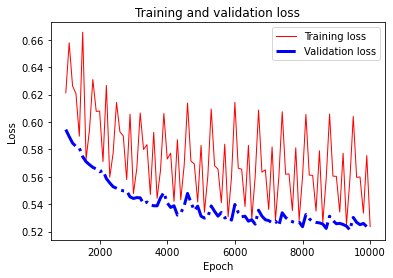

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5237066, Final Validation loss: 0.5218112, Training RMSE: 0.7278827, Validation RMSE: 0.722365
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.85372037, Validation loss: 0.8455072, 
Epoch: 2000, Training loss: 0.6981822, Validation loss: 0.6689836, 
Epoch: 3000, Training loss: 0.5795053, Validation loss: 0.59587103, 
Epoch: 4000, Training loss: 0.6034125, Validation loss: 0.5767925, 
Epoch: 5000, Training loss: 0.60420877, Validation loss: 0.5554775, 
Epoch: 6000, Training loss: 0.612807, Validation loss: 0.54784894, 
Epoch: 7000, Training loss: 0.54538125, Validation loss: 0.5341435, 
Epoch: 8000, Training loss: 0.5629618, Validation loss: 0.5285047, 
Epoch: 9000, Training loss: 0.5566952, Validation loss: 0.5300631, 
Epoch: 10000, Training loss

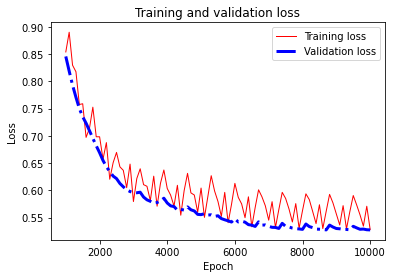

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.52819836, Final Validation loss: 0.5274749, Training RMSE: 0.72957766, Validation RMSE: 0.72627467
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.70120186, Validation loss: 0.6892941, 
Epoch: 2000, Training loss: 0.659086, Validation loss: 0.59633535, 
Epoch: 3000, Training loss: 0.57546103, Validation loss: 0.56776327, 
Epoch: 4000, Training loss: 0.59146297, Validation loss: 0.55518615, 
Epoch: 5000, Training loss: 0.60185033, Validation loss: 0.5455761, 
Epoch: 6000, Training loss: 0.6005664, Validation loss: 0.5503607, 
Epoch: 7000, Training loss: 0.55170786, Validation loss: 0.53509766, 
Epoch: 8000, Training loss: 0.57710344, Validation loss: 0.545547, 
Epoch: 9000, Training loss: 0.5750075, Validation loss: 0.53404874, 
Epoch: 10000, Trai

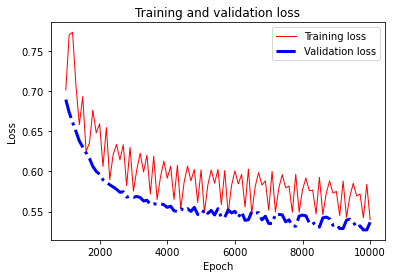

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53986543, Final Validation loss: 0.5367495, Training RMSE: 0.7420125, Validation RMSE: 0.73263186
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 0.76400065, Validation loss: 0.82105494, 
Epoch: 2000, Training loss: 0.6429135, Validation loss: 0.63638103, 
Epoch: 3000, Training loss: 0.5868088, Validation loss: 0.58775043, 
Epoch: 4000, Training loss: 0.6090954, Validation loss: 0.5618972, 
Epoch: 5000, Training loss: 0.5872012, Validation loss: 0.5490378, 
Epoch: 6000, Training loss: 0.5930225, Validation loss: 0.5518242, 
Epoch: 7000, Training loss: 0.5425325, Validation loss: 0.5402755, 
Epoch: 8000, Training loss: 0.576742, Validation loss: 0.5461152, 
Epoch: 9000, Training loss: 0.56871414, Validation loss: 0.5392839, 
Epoch: 10000, Training l

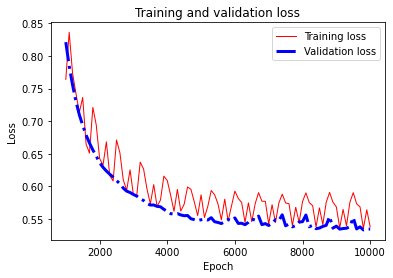

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53823584, Final Validation loss: 0.5347568, Training RMSE: 0.7305148, Validation RMSE: 0.7312707
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2
Epoch: 1000, Training loss: 1.2197536, Validation loss: 1.1829821, 
Epoch: 2000, Training loss: 0.7655362, Validation loss: 0.78661746, 
Epoch: 3000, Training loss: 0.65777224, Validation loss: 0.65731823, 
Epoch: 4000, Training loss: 0.61862737, Validation loss: 0.6158141, 
Epoch: 5000, Training loss: 0.6319681, Validation loss: 0.5936712, 
Epoch: 6000, Training loss: 0.62264436, Validation loss: 0.58361006, 
Epoch: 7000, Training loss: 0.56646013, Validation loss: 0.5655658, 
Epoch: 8000, Training loss: 0.58333033, Validation loss: 0.55008465, 
Epoch: 9000, Training loss: 0.5781282, Validation loss: 0.5451511, 
Epoch: 10000, Train

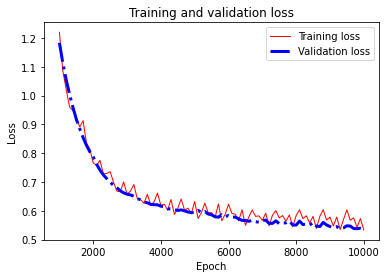

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53336126, Final Validation loss: 0.5362433, Training RMSE: 0.7316952, Validation RMSE: 0.7322864
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron2 

Average Training RMSE for the 10 folds: 0.73840696 

Average Validation RMSE for the 10 folds: 0.73832 


-------------------------------------------------------------------------------------


Fold 1, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.746824, Validation loss: 0.7569345, 
Epoch: 2000, Training loss: 0.6452566, Validation loss: 0.63258964, 
Epoch: 3000, Training loss: 0.58379227, Validation loss: 0.59184456, 
Epoch: 4000, Training loss: 0.5975126, Validation loss: 0.5751611, 
Epoch: 5000, Traini

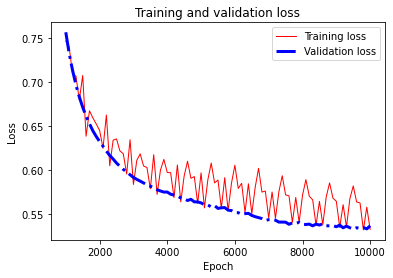

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5327573, Final Validation loss: 0.53678715, Training RMSE: 0.7293107, Validation RMSE: 0.7326576
-------------------------------------------------------------------------------------


Fold 2, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.8701924, Validation loss: 0.8784937, 
Epoch: 2000, Training loss: 0.7045688, Validation loss: 0.67223793, 
Epoch: 3000, Training loss: 0.6252755, Validation loss: 0.6138758, 
Epoch: 4000, Training loss: 0.6054815, Validation loss: 0.58119136, 
Epoch: 5000, Training loss: 0.60471874, Validation loss: 0.5636162, 
Epoch: 6000, Training loss: 0.62732476, Validation loss: 0.55380607, 
Epoch: 7000, Training loss: 0.5498044, Validation loss: 0.54490274, 
Epoch: 8000, Training loss: 0.5863284, Validation loss: 0.5320373, 
Epoch: 9000, Training loss: 0.57074976, Validation loss: 0.5307568, 
Epoch: 10000, Training

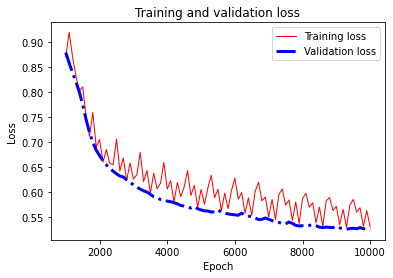

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5296142, Final Validation loss: 0.5236534, Training RMSE: 0.7280056, Validation RMSE: 0.723639
-------------------------------------------------------------------------------------


Fold 3, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.92118454, Validation loss: 0.95332664, 
Epoch: 2000, Training loss: 0.770074, Validation loss: 0.7386208, 
Epoch: 3000, Training loss: 0.686987, Validation loss: 0.6695236, 
Epoch: 4000, Training loss: 0.6295161, Validation loss: 0.61924386, 
Epoch: 5000, Training loss: 0.6408219, Validation loss: 0.584802, 
Epoch: 6000, Training loss: 0.63996774, Validation loss: 0.5682526, 
Epoch: 7000, Training loss: 0.5654022, Validation loss: 0.55702573, 
Epoch: 8000, Training loss: 0.5819111, Validation loss: 0.54958504, 
Epoch: 9000, Training loss: 0.58637625, Validation loss: 0.54411376, 
Epoch: 10000, Training los

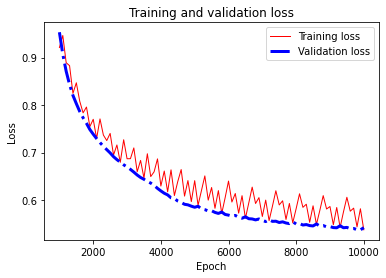

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5374191, Final Validation loss: 0.54196113, Training RMSE: 0.740404, Validation RMSE: 0.73618007
-------------------------------------------------------------------------------------


Fold 4, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.75799423, Validation loss: 0.7655796, 
Epoch: 2000, Training loss: 0.6400108, Validation loss: 0.6330948, 
Epoch: 3000, Training loss: 0.57825303, Validation loss: 0.5952108, 
Epoch: 4000, Training loss: 0.5795873, Validation loss: 0.57317, 
Epoch: 5000, Training loss: 0.588886, Validation loss: 0.5641683, 
Epoch: 6000, Training loss: 0.6223548, Validation loss: 0.5598037, 
Epoch: 7000, Training loss: 0.5381338, Validation loss: 0.5532605, 
Epoch: 8000, Training loss: 0.57077277, Validation loss: 0.5487586, 
Epoch: 9000, Training loss: 0.56694657, Validation loss: 0.5448002, 
Epoch: 10000, Training loss:

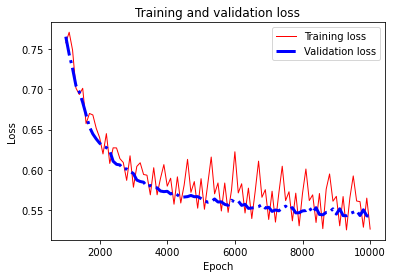

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5261354, Final Validation loss: 0.54209095, Training RMSE: 0.726308, Validation RMSE: 0.7362683
-------------------------------------------------------------------------------------


Fold 5, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.66010875, Validation loss: 0.6641069, 
Epoch: 2000, Training loss: 0.5847688, Validation loss: 0.56852615, 
Epoch: 3000, Training loss: 0.5479658, Validation loss: 0.5530283, 
Epoch: 4000, Training loss: 0.5753621, Validation loss: 0.54539675, 
Epoch: 5000, Training loss: 0.5778028, Validation loss: 0.5441694, 
Epoch: 6000, Training loss: 0.58095336, Validation loss: 0.53474945, 
Epoch: 7000, Training loss: 0.53652745, Validation loss: 0.530327, 
Epoch: 8000, Training loss: 0.5599699, Validation loss: 0.526798, 
Epoch: 9000, Training loss: 0.56454366, Validation loss: 0.52987826, 
Epoch: 10000, Training l

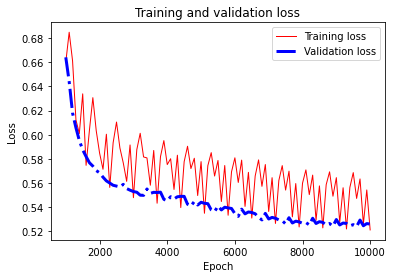

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.521285, Final Validation loss: 0.5261082, Training RMSE: 0.7272242, Validation RMSE: 0.72533315
-------------------------------------------------------------------------------------


Fold 6, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.1689293, Validation loss: 1.1087643, 
Epoch: 2000, Training loss: 0.8385751, Validation loss: 0.75036186, 
Epoch: 3000, Training loss: 0.7164368, Validation loss: 0.6553681, 
Epoch: 4000, Training loss: 0.6487795, Validation loss: 0.616236, 
Epoch: 5000, Training loss: 0.65389735, Validation loss: 0.592926, 
Epoch: 6000, Training loss: 0.62646353, Validation loss: 0.5727948, 
Epoch: 7000, Training loss: 0.57055813, Validation loss: 0.56506246, 
Epoch: 8000, Training loss: 0.58763874, Validation loss: 0.5571706, 
Epoch: 9000, Training loss: 0.5986804, Validation loss: 0.5713982, 
Epoch: 10000, Training los

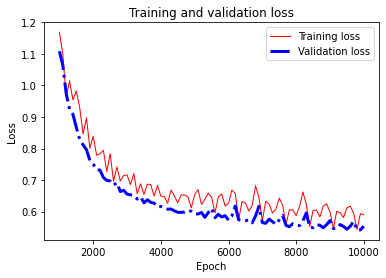

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5899759, Final Validation loss: 0.5536871, Training RMSE: 0.7535791, Validation RMSE: 0.7441015
-------------------------------------------------------------------------------------


Fold 7, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.84948486, Validation loss: 0.83131826, 
Epoch: 2000, Training loss: 0.68682003, Validation loss: 0.6507453, 
Epoch: 3000, Training loss: 0.61501056, Validation loss: 0.6027337, 
Epoch: 4000, Training loss: 0.6109019, Validation loss: 0.5688627, 
Epoch: 5000, Training loss: 0.6052238, Validation loss: 0.5550468, 
Epoch: 6000, Training loss: 0.6036865, Validation loss: 0.54433024, 
Epoch: 7000, Training loss: 0.54100245, Validation loss: 0.538827, 
Epoch: 8000, Training loss: 0.564419, Validation loss: 0.5476103, 
Epoch: 9000, Training loss: 0.5710691, Validation loss: 0.537632, 
Epoch: 10000, Training loss

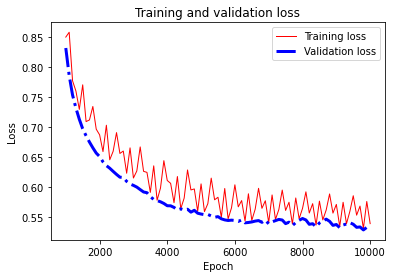

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53910685, Final Validation loss: 0.5348718, Training RMSE: 0.7325738, Validation RMSE: 0.7313493
-------------------------------------------------------------------------------------


Fold 8, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 0.639081, Validation loss: 0.58996105, 
Epoch: 2000, Training loss: 0.5886853, Validation loss: 0.5602975, 
Epoch: 3000, Training loss: 0.55484766, Validation loss: 0.5483478, 
Epoch: 4000, Training loss: 0.57246256, Validation loss: 0.52837497, 
Epoch: 5000, Training loss: 0.5730876, Validation loss: 0.52562433, 
Epoch: 6000, Training loss: 0.5902471, Validation loss: 0.52950543, 
Epoch: 7000, Training loss: 0.5325097, Validation loss: 0.51939386, 
Epoch: 8000, Training loss: 0.56322473, Validation loss: 0.52877206, 
Epoch: 9000, Training loss: 0.5667604, Validation loss: 0.5210494, 
Epoch: 10000, Trainin

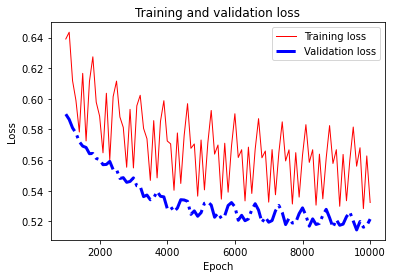

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.53227, Final Validation loss: 0.5214357, Training RMSE: 0.7286784, Validation RMSE: 0.722105
-------------------------------------------------------------------------------------


Fold 9, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.0827259, Validation loss: 1.0574175, 
Epoch: 2000, Training loss: 0.7385119, Validation loss: 0.7313485, 
Epoch: 3000, Training loss: 0.60959923, Validation loss: 0.6317518, 
Epoch: 4000, Training loss: 0.60508835, Validation loss: 0.58544886, 
Epoch: 5000, Training loss: 0.5979227, Validation loss: 0.5585304, 
Epoch: 6000, Training loss: 0.61554784, Validation loss: 0.5496489, 
Epoch: 7000, Training loss: 0.54187435, Validation loss: 0.54183435, 
Epoch: 8000, Training loss: 0.56561077, Validation loss: 0.53745884, 
Epoch: 9000, Training loss: 0.55853057, Validation loss: 0.53123873, 
Epoch: 10000, Training 

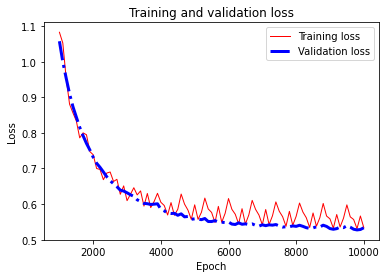

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5339945, Final Validation loss: 0.5334807, Training RMSE: 0.7282044, Validation RMSE: 0.73039764
-------------------------------------------------------------------------------------


Fold 10, lr: 0.005, batch_size: 1024, number_epochs: 10000, type_loss_func: MAE, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3
Epoch: 1000, Training loss: 1.0474021, Validation loss: 1.0646107, 
Epoch: 2000, Training loss: 0.7285484, Validation loss: 0.7291758, 
Epoch: 3000, Training loss: 0.61103624, Validation loss: 0.65287226, 
Epoch: 4000, Training loss: 0.59893817, Validation loss: 0.6044151, 
Epoch: 5000, Training loss: 0.6374387, Validation loss: 0.5873812, 
Epoch: 6000, Training loss: 0.62310743, Validation loss: 0.5794476, 
Epoch: 7000, Training loss: 0.5645847, Validation loss: 0.5682823, 
Epoch: 8000, Training loss: 0.5639339, Validation loss: 0.56414336, 
Epoch: 9000, Training loss: 0.58810157, Validation loss: 0.55624336, 
Epoch: 10000, Trainin

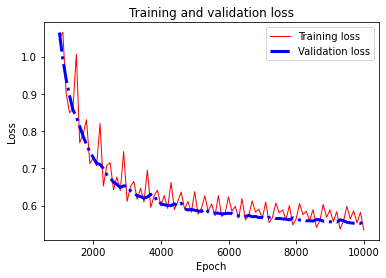

<Figure size 432x288 with 0 Axes>

Final Training loss: 0.5345587, Final Validation loss: 0.55678874, Training RMSE: 0.7365825, Validation RMSE: 0.7461828
-------------------------------------------------------------------------------------


For the model with learning rate: 0.005, batch size: 1024, number_epochs: 10000, type_optimizer: Adam, neural_network_structure: multilayer_perceptron3 

Average Training RMSE for the 10 folds: 0.73829615 

Average Validation RMSE for the 10 folds: 0.7382055 


-------------------------------------------------------------------------------------


The best hyperparameters:

learning rate: 0.001, batch size: 512, number_epochs: 10000, type_optimizer: RMSProp, neural_network_structure: multilayer_perceptron2, RMSE: 0.7378545

The total training time is: 29489.659470900002


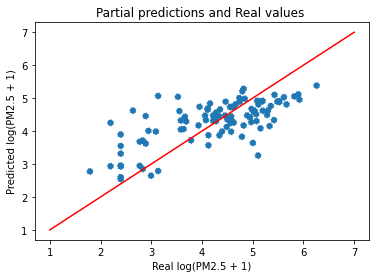

Average Test RMSE: 0.73912036


In [4]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=10)

train_x = []
test_x = []
train_y = []
test_y = []

select_epoch_from = 1000
batch_iteration = 0

train_loss = 0
val_loss = 0

# record the train losses for the total 10 fold models
kfold_train_losses = []
# record the validate losses for the total 10 fold models
kfold_val_losses = []

hyperParameters = {'lr':[0.001,0.005],
                   'batch_size':[512,1024],
                   'number_epochs':[10000],
                   'type_loss_func':["MSE","MAE"],
                   'type_optimizer':["RMSProp","Adam"],
                   'neural_network_structure':["multilayer_perceptron1","multilayer_perceptron2","multilayer_perceptron3"]}

# hyperParameters = {'lr':[0.001,0.005],
#                    'batch_size':[128],
#                    'number_epochs':[10000],
#                    'type_loss_func':["MSE"],
#                    'type_optimizer':["Adam"],
#                    'neural_network_structure':["multilayer_perceptron2"]}

rmses = []
best_lr = 0.001
best_batchsize = 64
best_number_epochs = 10000
best_loss_func = "MSE"
best_type_optimizer = "Adam"
best_neural_network_structure = "multilayer_perceptron2"
best_training_rmse = math.inf
best_validation_rmse = math.inf

start_time = time.clock() 
with tf.Session() as sess: 
    for lr in hyperParameters['lr']:
        for batch_size in hyperParameters['batch_size']:
            for number_epochs in hyperParameters['number_epochs']:
                for type_loss_func in hyperParameters['type_loss_func']:
                    for type_optimizer in hyperParameters['type_optimizer']:
                        for neural_network_structure in hyperParameters['neural_network_structure']:
                            fold = 0
                            for train_index, val_index in kf.split(X_train, y_train):
                                if neural_network_structure == "multilayer_perceptron1":
                                     neural_network = multilayer_perceptron1(X_p)
                                elif neural_network_structure == "multilayer_perceptron2":
                                     neural_network = multilayer_perceptron2(X_p)
                                elif neural_network_structure == "multilayer_perceptron3":
                                     neural_network = multilayer_perceptron3(X_p)
                                mse_1 = tf.keras.losses.MeanSquaredError()
                                RMSE_pre = mse_1(neural_network,Y_p)
                                eval_RMSE = tf.cast(tf.sqrt(RMSE_pre),dtype=tf.float32)
                                if type_loss_func == "MSE":
                                     mse = tf.keras.losses.MeanSquaredError()
                                     loss_func = mse(neural_network,Y_p)
                                elif type_loss_func == "MAE":
                                     mae = tf.keras.losses.MeanAbsoluteError()
                                     loss_func = mse(neural_network,Y_p)
                                # define optimizer
                                if type_optimizer == "RMSProp":
                                     optimizer = tf.train.RMSPropOptimizer(lr).minimize(loss_func)
                                elif type_optimizer == "Adam":
                                     optimizer = tf.train.AdamOptimizer(lr).minimize(loss_func)
                                # initializaing variables
                                init = tf.global_variables_initializer()
                                sess.run(init)
                                #start_time = time.clock() 
                                fold = fold + 1
                                train_x = X_train[train_index]
                                train_y = y_train[train_index]
                                val_x = X_train[val_index]
                                val_y = y_train[val_index]
                                batch_iteration = int(len(train_x) / batch_size) + 1
                
                                print("Fold %s, lr: %s, batch_size: %s, number_epochs: %s, type_loss_func: %s, type_optimizer: %s, neural_network_structure: %s" % (fold,lr,batch_size,number_epochs,type_loss_func,type_optimizer,neural_network_structure))
                
                                train_losses = []
                                val_losses = []
                                epochs = []
                                for epoch in range(1,number_epochs+1):
          
                                    n = epoch % batch_iteration
                                    s = 0 + batch_size * n
                                    if n == 0:
                                       e = len(train_x)
                                    else:
                                       e = batch_size + batch_size * n
                  
                                    batch_X = np.array(X_train[s:e])
                                    batch_y = np.array(y_train[s:e])

                                    _, train_loss = sess.run([optimizer, loss_func], feed_dict={X_p: batch_X, Y_p: batch_y})
                                    val_loss = loss_func.eval({X_p: val_x, Y_p: val_y})

                                    if epoch >= select_epoch_from and epoch % 100 == 0:
                                       train_losses.append(train_loss)
                                       val_losses.append(val_loss)
                                       epochs.append(epoch)

                                    #Display the epoch
                                    if epoch % 1000 == 0:
                                       print("Epoch: %d, "
                                            "Training loss: %s, "
                                            "Validation loss: %s, " % (epoch, train_loss, val_loss))
                
                                #end_time = time.clock()
#                               # print("The total training time is: " + str(end_time-start_time))

                                pyplot.plot(epochs, train_losses, 'r', label='Training loss', linewidth=1, linestyle='-')
                                pyplot.plot(epochs, val_losses, 'b', label='Validation loss', linewidth=3, linestyle='-.')
                                pyplot.xlabel('Epoch') 
                                pyplot.ylabel('Loss')
                                pyplot.title('Training and validation loss')
                                pyplot.legend()
                                pyplot.figure()
                                pyplot.show()
                                pyplot.ioff()

                                kfold_train_RMSE = sess.run(eval_RMSE,feed_dict={X_p:train_x, Y_p:train_y})
                                kfold_val_RMSE = sess.run(eval_RMSE,feed_dict={X_p:val_x, Y_p:val_y})
                      
                                print("Final Training loss: %s, "
                                      "Final Validation loss: %s, " 
                                      "Training RMSE: %s, "
                                      "Validation RMSE: %s"% (train_loss, val_loss, kfold_train_RMSE, kfold_val_RMSE )) 
                                print("-------------------------------------------------------------------------------------\n\n")

                                kfold_train_losses.append(kfold_train_RMSE)
                                kfold_val_losses.append(kfold_val_RMSE)
  
                                if fold == 10:
                                  # average train RMSE for the 10 folds
                                   average_train_rmse_score_10fold = np.mean(kfold_train_losses)
                                   # average validate RMSE for the 10 folds
                                   average_val_rmse_score_10fold = np.mean(kfold_val_losses)
                                   print("For the model with learning rate: %s, batch size: %s, number_epochs: %s, type_optimizer: %s, neural_network_structure: %s \n" % (lr,batch_size,number_epochs,type_optimizer,neural_network_structure))
                                   print("Average Training RMSE for the 10 folds: %s \n" % str(average_train_rmse_score_10fold))
                                   print("Average Validation RMSE for the 10 folds: %s \n\n" % str(average_val_rmse_score_10fold))
                                   print("-------------------------------------------------------------------------------------\n\n")
                                   
#                                    best_validation_rmse = average_val_rmse_score_10fold
                                
                                   if average_val_rmse_score_10fold < best_validation_rmse:
                                    #best_training_rmse = average_train_rmse_score_10fold
                                       best_validation_rmse = average_val_rmse_score_10fold
                                       best_lr = lr
                                       best_batchsize = batch_size
                                       best_number_epochs = number_epochs
                                       best_loss_func = type_loss_func
                                       best_type_optimizer = type_optimizer
                                       best_neural_network_structure = neural_network_structure
    print("The best hyperparameters:\n") 
    print("learning rate: %s, batch size: %s, number_epochs: %s, type_optimizer: %s, neural_network_structure: %s, RMSE: %s\n" % (best_lr,best_batchsize,best_number_epochs,best_type_optimizer,best_neural_network_structure,best_validation_rmse))
    end_time = time.clock()
    print("The total training time is: " + str(end_time-start_time))
    # Test model
    pred = (neural_network) 
    output=neural_network.eval({X_p: X_test}) 

    # plot prediction and labels
#     pyplot.plot(y_test[0:50], 'ro', label='Testing labels')
#     pyplot.plot(output[0:50], 'bo', label='Predictions')
#     pyplot.xlabel('Instances') 
#     pyplot.ylabel('Average_log(PM2.5 + 1)')
#     pyplot.title('Partial Predictions and labels')
#     pyplot.show()
    
    pyplot.scatter(y_test[0:100], output[0:100], linestyle="dotted")
    pyplot.plot([1,2,3,4,5,6,7],[1,2,3,4,5,6,7],'r')
    pyplot.xlabel('Real log(PM2.5 + 1)')
    pyplot.ylabel('Predicted log(PM2.5 + 1)')
    pyplot.title('Partial predictions and Real values ')
    pyplot.show()

    # final RMSE
    rmse_score = sess.run(eval_RMSE,feed_dict={X_p:X_test,Y_p:y_test})
    print("Average Test RMSE: " + str(rmse_score))


In [8]:
print("The best hyperparameters:\n") 
print("loss_func:%s" % (best_loss_func))

The best hyperparameters:

loss_func:MSE


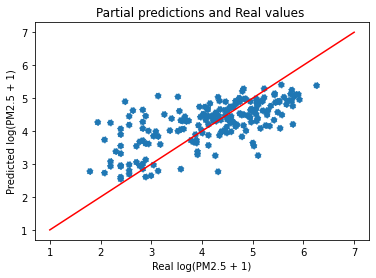

In [10]:
pyplot.scatter(y_test[0:200], output[0:200], linestyle="dotted")
pyplot.plot([1,2,3,4,5,6,7],[1,2,3,4,5,6,7],'r')
pyplot.xlabel('Real log(PM2.5 + 1)')
pyplot.ylabel('Predicted log(PM2.5 + 1)')
pyplot.title('Partial predictions and Real values ')
pyplot.show()